# 🤖 Machine Learning Workflow - Turbinas Eólicas

Notebook completo para el flujo de trabajo de Machine Learning con datos de turbinas eólicas.

## 📋 Objetivo

Desarrollar modelos de predicción para momentos flectores en las palas de turbinas eólicas.

**Targets**: 
- Blade root 1 My
- Blade root 2 My

---

## 🔧 STEP 1: Configuración Inicial del Entorno

En este paso configuramos el entorno de trabajo completo para el análisis de Machine Learning.

### 📦 Librerías que vamos a importar:

1. **Librerías estándar de Python**: os, sys, pathlib para manejo de archivos
2. **Análisis de datos**: pandas (DataFrames) y numpy (operaciones numéricas)
3. **Visualización**: matplotlib y seaborn para gráficos
4. **Machine Learning**: scikit-learn para modelos y preprocesamiento
5. **Algoritmos avanzados**: XGBoost y LightGBM (si están disponibles)

In [1]:
# ============================================================================
# PASO 1.1: Importar librerías estándar de Python
# ============================================================================

# Manejo del sistema operativo y archivos
import os           # Operaciones del sistema operativo (crear carpetas, paths, etc.)
import sys          # Configuración del sistema Python (paths, argumentos)
from pathlib import Path  # Manejo moderno de rutas de archivos

# Manejo de advertencias
import warnings
warnings.filterwarnings('ignore')  # Ignorar warnings para output más limpio

print("✅ Librerías estándar de Python importadas")

# ============================================================================
# PASO 1.2: Importar librerías de análisis de datos
# ============================================================================

# pandas: Librería principal para manipulación de datos tabulares
import pandas as pd

# numpy: Operaciones numéricas y arrays eficientes
import numpy as np

# joblib: Guardar y cargar modelos y scalers
import joblib

print("✅ Librerías de análisis de datos importadas")

# ============================================================================
# PASO 1.3: Importar librerías de visualización
# ============================================================================

# matplotlib: Librería base para gráficos en Python
import matplotlib.pyplot as plt

# seaborn: Visualizaciones estadísticas de alto nivel
import seaborn as sns

# Configuración de estilo de gráficos
plt.style.use('seaborn-v0_8-darkgrid')  # Estilo con grid oscuro
sns.set_palette('husl')  # Paleta de colores HUSL (vibrante y distinguible)

# Mostrar gráficos directamente en el notebook
%matplotlib inline

# PASO 1.4: Importar librerías de Machine Learning

# ============================================================================
# Scikit-learn: Modelos y métricas
from sklearn.linear_model import Ridge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

print("✅ Librerías de Machine Learning importadas")

# ============================================================================
# PASO 1.5: Configurar pandas para mejor visualización
# ============================================================================


print("="*70)
print("CONFIGURACION BASICA COMPLETADA")
print("\n" + "="*70)
print("✅ Configuración de pandas aplicada")
pd.set_option('display.precision', 4)# Precisión de 4 decimales para números
pd.set_option('display.max_rows', 100)# Mostrar hasta 100 filas
pd.set_option('display.max_columns', None)
print("\n" + "="*70)
print("CONFIGURACION BASICA COMPLETADA")
print("="*70)

✅ Librerías estándar de Python importadas
✅ Librerías de análisis de datos importadas
✅ Librerías de Machine Learning importadas
CONFIGURACION BASICA COMPLETADA

✅ Configuración de pandas aplicada

CONFIGURACION BASICA COMPLETADA


In [2]:
# ============================================================================
# PASO 1.5: Importar herramientas de Machine Learning - Scikit-learn
# ============================================================================

# --- VALIDACIÓN Y SEPARACIÓN DE DATOS ---
from sklearn.model_selection import (
    train_test_split,    # Dividir datos en train/test
    cross_val_score,     # Validación cruzada
    KFold                # K-Fold para validación cruzada robusta
)

# --- PREPROCESAMIENTO ---
from sklearn.preprocessing import (
    StandardScaler,      # Normalización Z-score (media=0, std=1)
    MinMaxScaler         # Escalado a rango [0,1]
)

# --- MÉTRICAS DE EVALUACIÓN ---
from sklearn.metrics import (
    mean_squared_error,  # MSE: Error cuadrático medio
    r2_score,            # R²: Coeficiente de determinación
    mean_absolute_error  # MAE: Error absoluto medio
)

print("✅ Herramientas de ML (sklearn) importadas")

# ============================================================================
# PASO 1.6: Importar modelos de Machine Learning
# ============================================================================

# --- MODELOS LINEALES ---
from sklearn.linear_model import (
    LinearRegression,    # Regresión lineal simple
    Ridge,               # Regresión Ridge (regularización L2)
    Lasso,               # Regresión Lasso (regularización L1)
    ElasticNet           # ElasticNet (combinación L1 + L2)
)

# --- MODELOS BASADOS EN ÁRBOLES ---
from sklearn.ensemble import (
    RandomForestRegressor,      # Random Forest: ensemble de árboles
    ExtraTreesRegressor,        # Extra Trees: árboles con splits aleatorios
    GradientBoostingRegressor   # Gradient Boosting: boosting secuencial
)

from sklearn.tree import DecisionTreeRegressor  # Árbol de decisión simple

print("✅ Modelos de ML (sklearn) importados")

# ============================================================================
# PASO 1.7: Importar algoritmos avanzados (XGBoost y LightGBM)
# ============================================================================

# XGBoost: Extreme Gradient Boosting (muy potente para competiciones)
try:
    import xgboost as xgb
    print("✅ XGBoost disponible (versión: {})".format(xgb.__version__))
    XGBOOST_AVAILABLE = True
except ImportError:
    print("⚠️  XGBoost NO disponible - instalar con: pip install xgboost")
    xgb = None
    XGBOOST_AVAILABLE = False

# LightGBM: Light Gradient Boosting Machine (rápido y eficiente)
try:
    import lightgbm as lgb
    print("✅ LightGBM disponible (versión: {})".format(lgb.__version__))
    LIGHTGBM_AVAILABLE = True
except ImportError:
    print("⚠️  LightGBM NO disponible - instalar con: pip install lightgbm")
    lgb = None
    LIGHTGBM_AVAILABLE = False

print("\n" + "="*70)
print("🎉 LIBRERÍAS DE MACHINE LEARNING COMPLETADAS")
print("="*70)

✅ Herramientas de ML (sklearn) importadas
✅ Modelos de ML (sklearn) importados
✅ XGBoost disponible (versión: 3.1.1)
✅ LightGBM disponible (versión: 4.6.0)

🎉 LIBRERÍAS DE MACHINE LEARNING COMPLETADAS


In [3]:
# ============================================================================
# PASO 1.8: Configurar estructura de directorios del proyecto
# ============================================================================

# Directorio raíz del proyecto (carpeta padre del notebook)
root_dir = Path.cwd().parent

# Directorios principales del proyecto
data_folder = root_dir / "data_train"      # Datos de entrenamiento (CSVs)
data_folder_ml = root_dir / "data_train_traditional_ML"
report_folder = root_dir / "_report"       # Reportes y visualizaciones
models_folder = root_dir / "notebook" / "03_ML_traditional_models"      # Modelos entrenados guardados
results_folder = root_dir / "_results"     # Resultados de predicciones
eda_folder = Path.cwd() / "00_EDA_traditional_ML"
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"
training_folder = root_dir / 'notebook' / '03_Models_training'
scaler_folder = root_dir / 'notebook' / '01_Models_scaler'


# Crear carpetas si no existen
models_folder.mkdir(exist_ok=True)
results_folder.mkdir(exist_ok=True)

# Verificar existencia de carpetas críticas
data_exists = data_folder.exists()
report_exists = report_folder.exists()

print("="*70)
print("ESTRUCTURA DE DIRECTORIOS")
print("="*70)
print(f"Directorio raiz:     {root_dir}")
print(f"Datos entrenamiento: {data_folder} {'OK' if data_exists else 'NO EXISTE'}")
print(f"Reportes:            {report_folder} {'OK' if report_exists else 'NO EXISTE'}")
print(f"Modelos guardados:   {models_folder} OK")
print(f"Resultados:          {results_folder} OK")
print(f"Eda folder:          {eda_folder} OK")
print("="*70)

# Advertencias si faltan directorios críticos
if not data_exists:
    print("\nADVERTENCIA: Carpeta 'data_train' no encontrada")
    print("   -> Usando directorio raiz para buscar datos")
    data_folder = root_dir
    
if not report_exists:
    print("\nADVERTENCIA: Carpeta '_report' no encontrada")
    print("   -> Algunos analisis previos pueden no estar disponibles")

ESTRUCTURA DE DIRECTORIOS
Directorio raiz:     c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS
Datos entrenamiento: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train OK
Reportes:            c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\_report NO EXISTE
Modelos guardados:   c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models OK
Resultados:          c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\_results OK
Eda folder:          c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML OK

ADVERTENCIA: Carpeta '_report' no encontrada
   -> Algunos analisis previos pueden no estar disponibles


---

## ✅ Datos guardados (normalizados y no normalizados, de test y train)

```


In [4]:
# Cargar datos originales
X_train = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\X_train.pkl')
y_train = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\y_train.pkl')
X_test = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\X_test.pkl')
y_test = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\y_test.pkl')

# Cargar datos normalizados
X_train_norm = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\X_train_norm.pkl')
y_train_norm = joblib.load(r'c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional\y_train_norm.pkl')

---

## ✅ CONFIGURACIÓN INICIAL COMPLETADA

El entorno de trabajo está listo para comenzar el análisis de Machine Learning.

### 📊 Resumen de configuración:

- ✅ **Librerías básicas**: pandas, numpy, matplotlib, seaborn
- ✅ **Librerías ML**: scikit-learn completo
- ✅ **Algoritmos avanzados**: XGBoost y LightGBM (si disponibles)
- ✅ **Directorios**: data_train, _report, _models, _results
- ✅ **Configuración**: Pandas optimizado, gráficos configurados

### 🎯 Variables globales disponibles:

```python
root_dir         # Directorio raíz del proyecto
data_folder      # Carpeta con datos CSV de entrenamiento
report_folder    # Carpeta con reportes generados
models_folder    # Carpeta para guardar modelos entrenados
results_folder   # Carpeta para resultados de predicciones
```

---

## 📝 Próximos Pasos

**Indica qué quieres hacer a continuación:**

Por ejemplo:
- Cargar datos CSV
- Explorar variables y estadísticas
- Crear features (lags, ventanas, etc.)
- Entrenar modelos
- Evaluar y comparar modelos
- Hacer predicciones

**Todo el código se escribirá aquí mismo, sin llamadas a funciones externas.**

---

## 📊 STEP 2: Importar Señales desde Simulaciones Bladed

En este paso vamos a importar las señales desde las simulaciones de Bladed para generar los archivos CSV de entrenamiento.

### 🎯 Objetivo:
Generar archivos CSV con las features/señales específicas que queremos analizar y usar para el modelo ML.

### 📦 Proceso:
1. Importar librería postprocessbladed
2. Configurar rutas y archivos
3. Definir variables a extraer
4. Cargar datos de simulaciones
5. Exportar a CSV

---

In [9]:
# ============================================================================
# PASO 2.1: Importar postprocessbladed (libreria para leer simulaciones Bladed)
# ============================================================================

# Añadir ruta de postprocessbladed al path
postprocessbladed_parent_path = r"C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git"
if postprocessbladed_parent_path not in sys.path:
    sys.path.append(postprocessbladed_parent_path)

# Importar postprocessbladed
import postprocessbladed as pp

print("OK - postprocessbladed importado correctamente")
print(f"   Ruta: {postprocessbladed_parent_path}")

OK - postprocessbladed importado correctamente
   Ruta: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git


In [6]:
# ============================================================================
# PASO 2.2: Configurar rutas y parametros de carga
# ============================================================================

# Ruta donde estan las simulaciones de Bladed (archivos .$TE)
loadpath = r"U:\Studies\437_lidar_VLOS_IPC\Outputs\OPT3"

# Lista de nombres de archivos de simulacion a procesar
# PUEDES AÑADIR VARIOS ARCHIVOS Y SE GENERARA UN CSV POR CADA UNO
file_names = [
    "0001_DLC1.2_030_000_000_01",
    "0002_DLC1.2_030_000_000_02",
    "0003_DLC1.2_030_000_000_03",
    "0004_DLC1.2_030_000_000_04",
    "0005_DLC1.2_030_000_000_05",
    "0006_DLC1.2_030_000_000_06",
    "0007_DLC1.2_050_000_000_01",
    "0008_DLC1.2_050_000_000_02",
    "0009_DLC1.2_050_000_000_03",
    "0010_DLC1.2_050_000_000_04",
    "0011_DLC1.2_050_000_000_05",
    "0012_DLC1.2_050_000_000_06",
    "0013_DLC1.2_070_000_000_01",
    "0014_DLC1.2_070_000_000_02",
    "0015_DLC1.2_070_000_000_03",
    "0016_DLC1.2_070_000_000_04",
    "0017_DLC1.2_070_000_000_05",
    "0018_DLC1.2_070_000_000_06",
    "0019_DLC1.2_090_000_000_01",
    "0020_DLC1.2_090_000_000_02",
    "0021_DLC1.2_090_000_000_03",
    "0022_DLC1.2_090_000_000_04",
    "0023_DLC1.2_090_000_000_05",
    "0024_DLC1.2_090_000_000_06",
    "0025_DLC1.2_110_000_000_01",
    "0026_DLC1.2_110_000_000_02",
    "0027_DLC1.2_110_000_000_03",
    "0028_DLC1.2_110_000_000_04",
    "0029_DLC1.2_110_000_000_05",
    "0030_DLC1.2_110_000_000_06",
    "0031_DLC1.2_130_000_000_01",
    "0032_DLC1.2_130_000_000_02",
    "0033_DLC1.2_130_000_000_03",
    "0034_DLC1.2_130_000_000_04",
    "0035_DLC1.2_130_000_000_05",
    "0036_DLC1.2_130_000_000_06",
    "0037_DLC1.2_150_000_000_01",
    "0038_DLC1.2_150_000_000_02",
    "0039_DLC1.2_150_000_000_03",
    "0040_DLC1.2_150_000_000_04",
    "0041_DLC1.2_150_000_000_05",
    "0042_DLC1.2_150_000_000_06",
    "0043_DLC1.2_170_000_000_01",
    "0044_DLC1.2_170_000_000_02",
    "0045_DLC1.2_170_000_000_03",
    "0046_DLC1.2_170_000_000_04",
    "0047_DLC1.2_170_000_000_05",
    "0048_DLC1.2_170_000_000_06",
    "0049_DLC1.2_190_000_000_01",
    "0050_DLC1.2_190_000_000_02",
    "0051_DLC1.2_190_000_000_03",
    "0052_DLC1.2_190_000_000_04",
    "0053_DLC1.2_190_000_000_05",
    "0054_DLC1.2_190_000_000_06",
    "0055_DLC1.2_210_000_000_01",
    "0056_DLC1.2_210_000_000_02",
    "0057_DLC1.2_210_000_000_03",
    "0058_DLC1.2_210_000_000_04",
    "0059_DLC1.2_210_000_000_05",
    "0060_DLC1.2_210_000_000_06",
    "0061_DLC1.2_230_000_000_01",
    "0062_DLC1.2_230_000_000_02",
    "0063_DLC1.2_230_000_000_03",
    "0064_DLC1.2_230_000_000_04",
    "0065_DLC1.2_230_000_000_05",
    "0066_DLC1.2_230_000_000_06",
    "0067_DLC1.2_250_000_000_01",
    "0068_DLC1.2_250_000_000_02",
    "0069_DLC1.2_250_000_000_03",
    "0070_DLC1.2_250_000_000_04",
    "0071_DLC1.2_250_000_000_05",
    "0072_DLC1.2_250_000_000_06"
    #"wind_turb_10ms",
    #"wind_turb_11ms",
    #"wind_turb_12ms",
    #"wind_turb_13ms",
    #"wind_turb_14ms",
    #"wind_turb_15ms",
    #"wind_turb_16ms",
    #"wind_turb_17ms",
    #"wind_turb_18ms",
    #"wind_turb_19ms",
    #"wind_turb_20ms"
]

# Ruta donde guardar los resultados CSV
resultspath = str(data_folder)  # Usar data_folder definida anteriormente

# Opcion para añadir unidades en el CSV (True/False)
add_units = False

# Crear carpeta de resultados si no existe
if not os.path.exists(resultspath):
    os.makedirs(resultspath)

print("="*70)
print("CONFIGURACION DE RUTAS")
print("="*70)
print(f"Simulaciones Bladed: {loadpath}")
print(f"Archivos a procesar: {len(file_names)}")
for i, fname in enumerate(file_names, 1):
    print(f"  {i}. {fname}")
print(f"\nGuardar CSV en:      {resultspath}")
print(f"Anadir unidades:     {add_units}")
print("="*70)

CONFIGURACION DE RUTAS
Simulaciones Bladed: U:\Studies\437_lidar_VLOS_IPC\Outputs\OPT3
Archivos a procesar: 72
  1. 0001_DLC1.2_030_000_000_01
  2. 0002_DLC1.2_030_000_000_02
  3. 0003_DLC1.2_030_000_000_03
  4. 0004_DLC1.2_030_000_000_04
  5. 0005_DLC1.2_030_000_000_05
  6. 0006_DLC1.2_030_000_000_06
  7. 0007_DLC1.2_050_000_000_01
  8. 0008_DLC1.2_050_000_000_02
  9. 0009_DLC1.2_050_000_000_03
  10. 0010_DLC1.2_050_000_000_04
  11. 0011_DLC1.2_050_000_000_05
  12. 0012_DLC1.2_050_000_000_06
  13. 0013_DLC1.2_070_000_000_01
  14. 0014_DLC1.2_070_000_000_02
  15. 0015_DLC1.2_070_000_000_03
  16. 0016_DLC1.2_070_000_000_04
  17. 0017_DLC1.2_070_000_000_05
  18. 0018_DLC1.2_070_000_000_06
  19. 0019_DLC1.2_090_000_000_01
  20. 0020_DLC1.2_090_000_000_02
  21. 0021_DLC1.2_090_000_000_03
  22. 0022_DLC1.2_090_000_000_04
  23. 0023_DLC1.2_090_000_000_05
  24. 0024_DLC1.2_090_000_000_06
  25. 0025_DLC1.2_110_000_000_01
  26. 0026_DLC1.2_110_000_000_02
  27. 0027_DLC1.2_110_000_000_03
  28. 0

In [ ]:
# ============================================================================
# PASO 2.3: Definir diccionarios de variables a extraer
# ============================================================================
# Aqui defines QUE SEÑALES quieres extraer de las simulaciones
# Organizadas por categoria (señal de Bladed)

# Inicializar diccionario de variables
var_dicts = {}

# EJEMPLO 1: Variables de velocidad del viento en la pala 1 (Aero_B1)
# Estas son las velocidades del viento incidente a diferentes posiciones radiales
# var_dicts["Aero_B1"] = {
#     "Aero_B1": [
#         "Blade 1 Incident axial wind speed at 0m",
#         "Blade 1 Incident axial wind speed at 6m",
#         "Blade 1 Incident axial wind speed at 18m",
#         "Blade 1 Incident axial wind speed at 30m",
#         "Blade 1 Incident axial wind speed at 46m",
#         "Blade 1 Incident axial wind speed at 59m",
#         "Blade 1 Incident axial wind speed at 68.25m",
#     ]
# }

# EJEMPLO 2: Variables de velocidad del viento en la pala 2 (Aero_B2)
# var_dicts["Aero_B2"] = {
#     "Aero_B2": [
#         "Blade 2 Incident axial wind speed at 0m",
#         "Blade 2 Incident axial wind speed at 6m",
#         "Blade 2 Incident axial wind speed at 18m",
#         "Blade 2 Incident axial wind speed at 30m",
#         "Blade 2 Incident axial wind speed at 46m",
#         "Blade 2 Incident axial wind speed at 59m",
#         "Blade 2 Incident axial wind speed at 68.25m",
#     ]
# }

# Posiciones radiales (m) para las señales Aero (deben coincidir con las variables)
#AERO_POSITIONS = [0.0, 6.0, 18.0, 30.0, 46.0, 59.0, 68.25]

# EJEMPLO 3: Informacion ambiental
#var_dicts["Environmental_information"] = {
#    "Environmental_information": ["Rotor average longitudinal wind speed"]
#}

# EJEMPLO 4: Variables en el hub rotante (TARGETS - lo que queremos predecir)
var_dicts["Hub_rotating"] = {
    "Hub_rotating": [
        "Blade root 1 My",  # Momento flector pala 1 (TARGET)
        "Blade root 2 My"   # Momento flector pala 2 (TARGET)
    ]
}

# EJEMPLO 5: Actuadores de pitch (control de palas)
var_dicts["Pitch_actuator"] = {
    "Pitch_actuator": [
        "Blade 1 pitch angle",  # Angulo de pala 1
        "Blade 2 pitch angle",  # Angulo de pala 2
        #"Blade 1 pitch rate",   # Velocidad angular pala 1
        #"Blade 2 pitch rate"    # Velocidad angular pala 2
    ]
}

# EJEMPLO 6: Drivetrain (tren de potencia)
var_dicts["Drive_train"] = {
    "Drive_train": ["Rotor azimuth angle"]  # Angulo azimutal del rotor
}

# EJEMPLO 7: Rotor speed 
var_dicts["Summary"] = {
    "Summary": ["Rotor speed"]  # Rotor speed
}

# EJEMPLO 8: VLOS 
var_dicts["External_controller"] = {
    "External_controller": [
        "LAC_VLOS_BEAM0_RANGE5",
        "LAC_VLOS_BEAM1_RANGE5",
        "LAC_VLOS_BEAM2_RANGE5",
        "LAC_VLOS_BEAM3_RANGE5",
        "LAC_VLOS_BEAM4_RANGE5",
        "LAC_VLOS_BEAM5_RANGE5",
        "LAC_VLOS_BEAM6_RANGE5",
        "LAC_VLOS_BEAM7_RANGE5",
        #"LAC_VLOS_BEAM8_RANGE5",
        #"LAC_VLOS_BEAM9_RANGE5"
        ]  # VLOS
}

# Resumen de variables definidas
print("="*70)
print("VARIABLES A EXTRAER")
print("="*70)
total_vars = 0
for dict_name, var_dict in var_dicts.items():
    for signal, variables in var_dict.items():
        print(f"\n{signal}: {len(variables)} variables")
        for var in variables:
            print(f"  - {var}")
            total_vars += 1
print(f"\n{'='*70}")
print(f"TOTAL: {total_vars} variables")
print("="*70)

VARIABLES A EXTRAER

Hub_rotating: 2 variables
  - Blade root 1 My
  - Blade root 2 My

Pitch_actuator: 2 variables
  - Blade 1 pitch angle
  - Blade 2 pitch angle

Drive_train: 1 variables
  - Rotor azimuth angle

Summary: 1 variables
  - Rotor speed

External_controller: 10 variables
  - LAC_VLOS_BEAM0_RANGE5
  - LAC_VLOS_BEAM1_RANGE5
  - LAC_VLOS_BEAM2_RANGE5
  - LAC_VLOS_BEAM3_RANGE5
  - LAC_VLOS_BEAM4_RANGE5
  - LAC_VLOS_BEAM5_RANGE5
  - LAC_VLOS_BEAM6_RANGE5
  - LAC_VLOS_BEAM7_RANGE5
  - LAC_VLOS_BEAM8_RANGE5
  - LAC_VLOS_BEAM9_RANGE5

TOTAL: 16 variables


In [8]:
# ============================================================================
# PASO 2.4: Funciones de ayuda para procesar archivos Bladed
# ============================================================================

# FUNCION 1: Crear CSV de series temporales desde Bladed (IGUAL QUE timeseries_script.py)
def create_timeseries_csv(bin_series, header_series, filenames, var_dict, output_path, output_filename, add_units=False):
    """
    Crea un CSV con series temporales desde archivos Bladed binarios.
    Esta funcion replica exactamente el comportamiento de timeseries_script.py
    
    Args:
        bin_series: Diccionario con datos binarios {archivo: {señal: datos}}
        header_series: Headers leidos con pp.read_hdr_files()
        filenames: Lista de archivos procesados
        var_dict: Diccionario con variables a extraer {señal: [variables]}
        output_path: Ruta donde guardar el CSV
        output_filename: Nombre del archivo (sin extension)
        add_units: Si True, añade fila de unidades
    
    Returns:
        Ruta del CSV creado
    """
    import csv
    import re
    
    print(f'Creando CSV para variables: {list(var_dict.keys())}')
    
    # Diccionario de unidades en SI
    variable_units = {
        "Time": "s",
        "Rotor average longitudinal wind speed": "m/s",
        "Blade 1 Incident axial wind speed": "m/s",
        "Blade 2 Incident axial wind speed": "m/s",
        "Blade root 1 My": "kNm",
        "Blade root 2 My": "kNm",
        "Blade 1 pitch angle": "deg",
        "Blade 2 pitch angle": "deg",
        "Blade 1 pitch rate": "deg/s",
        "Blade 2 pitch rate": "deg/s",
        "Rotor azimuth angle": "deg",
        "LAC_VLOS_BEAM0_RANGE5": "m/s",
        "LAC_VLOS_BEAM1_RANGE5": "m/s",
        "LAC_VLOS_BEAM2_RANGE5": "m/s",
        "LAC_VLOS_BEAM3_RANGE5": "m/s",
        "LAC_VLOS_BEAM4_RANGE5": "m/s",
        "LAC_VLOS_BEAM5_RANGE5": "m/s",
        "LAC_VLOS_BEAM6_RANGE5": "m/s",
        "LAC_VLOS_BEAM7_RANGE5": "m/s",
        "LAC_VLOS_BEAM8_RANGE5": "m/s",
        "LAC_VLOS_BEAM9_RANGE5": "m/s"
    }
    
    # Obtener todos los nombres de variables para el header
    all_variables = []
    for signal in var_dict.keys():
        all_variables.extend(var_dict[signal])
    
    # Crear fila de header
    header = ['Time'] + all_variables
    
    # Inicializar estructura de datos
    csv_data = [header]
    
    # Añadir fila de unidades si se solicita
    if add_units:
        units_row = []
        for var in header:
            if var in variable_units:
                units_row.append(variable_units[var])
            else:
                units_row.append("")
        csv_data.append(units_row)
    
    # Procesar cada archivo
    for file in filenames:
        print(f'Procesando archivo: {os.path.basename(file)}')
        
        # Obtener vector de tiempo
        time_data = None
        first_signal = list(var_dict.keys())[0]
        first_variable = var_dict[first_signal][0]
        
        try:
            if first_signal in bin_series[file]:
                if isinstance(bin_series[file][first_signal], np.ndarray):
                    signal_data = bin_series[file][first_signal]
                    
                    # Manejo especial para señales Aero
                    if first_signal in ("Aero_B1", "Aero_B2") and hasattr(signal_data.dtype, 'names') and signal_data.dtype.names:
                        base_name = signal_data.dtype.names[0]
                        arr = signal_data[base_name]
                        if arr.ndim == 2:
                            time_length = arr.shape[-1] if arr.shape[-1] >= arr.shape[0] else arr.shape[0]
                        else:
                            time_length = len(arr)
                        try:
                            dt = header_series[file][first_signal]['dtime']
                        except KeyError:
                            dt = 0.02
                        time_data = [i * dt for i in range(time_length)]
                    else:
                        # Manejo generico
                        if hasattr(signal_data.dtype, 'names') and signal_data.dtype.names:
                            if first_variable in signal_data.dtype.names:
                                time_length = len(signal_data[first_variable])
                                try:
                                    dt = header_series[file][first_signal]['dtime']
                                except KeyError:
                                    dt = 0.02
                                time_data = [i * dt for i in range(time_length)]
                        else:
                            time_length = len(signal_data)
                            try:
                                dt = header_series[file][first_signal]['dtime']
                            except KeyError:
                                dt = 0.02
                            time_data = [i * dt for i in range(time_length)]
        except Exception as e:
            print(f'Error obteniendo datos de tiempo: {e}')
            continue
        
        if time_data is None:
            print(f"Advertencia: No se pudo determinar datos de tiempo para {file}")
            continue
        
        print(f'Procesando {len(time_data)} pasos de tiempo')
        
        # Procesar cada paso de tiempo
        for i in range(len(time_data)):
            row = [time_data[i]]
            
            # Añadir datos para cada variable
            for signal in var_dict.keys():
                for variable in var_dict[signal]:
                    try:
                        if signal in bin_series[file]:
                            signal_data = bin_series[file][signal]
                            
                            if isinstance(signal_data, np.ndarray):
                                # Manejo especial para señales Aero
                                if signal in ("Aero_B1", "Aero_B2"):
                                    m = re.search(r"at\s+([0-9]+(?:\.[0-9]+)?)m", variable)
                                    if m:
                                        try:
                                            pos = float(m.group(1))
                                            idx = None
                                            for j, p in enumerate(AERO_POSITIONS):
                                                if abs(p - pos) < 1e-6:
                                                    idx = j
                                                    break
                                            if idx is None:
                                                idx = int(np.argmin([abs(p - pos) for p in AERO_POSITIONS]))
                                            
                                            if hasattr(signal_data.dtype, 'names') and signal_data.dtype.names:
                                                base_name = signal_data.dtype.names[0]
                                                arr = signal_data[base_name]
                                            else:
                                                arr = signal_data
                                            
                                            if arr.ndim == 2:
                                                val = arr[idx, i]
                                            elif arr.ndim == 1:
                                                val = arr[i] if i < arr.shape[0] else np.nan
                                            else:
                                                val = np.nan
                                            row.append(float(val) if np.isfinite(val) else 0.0)
                                        except Exception as ex:
                                            row.append(0.0)
                                    else:
                                        row.append(0.0)
                                else:
                                    # Arrays no-Aero
                                    if hasattr(signal_data.dtype, 'names') and signal_data.dtype.names:
                                        if variable in signal_data.dtype.names and i < len(signal_data[variable]):
                                            row.append(float(signal_data[variable][i]))
                                        else:
                                            row.append(0.0)
                                    else:
                                        if signal_data.ndim == 1 and i < signal_data.shape[0]:
                                            row.append(float(signal_data[i]))
                                        else:
                                            row.append(0.0)
                            else:
                                row.append(0.0)
                        else:
                            row.append(0.0)
                    except Exception as e:
                        row.append(0.0)
            
            csv_data.append(row)
    
    # Escribir a CSV
    output_file = os.path.join(output_path, f"{output_filename}.csv")
    with open(output_file, 'w', newline='', encoding='utf-8') as f:
        writer = csv.writer(f)
        writer.writerows(csv_data)
    
    print(f'Archivo CSV creado: {output_file}')
    return output_file

print("OK - Funcion create_timeseries_csv definida correctamente")
print("  Esta funcion replica exactamente timeseries_script.py")

OK - Funcion create_timeseries_csv definida correctamente
  Esta funcion replica exactamente timeseries_script.py


In [9]:
# ============================================================================
# PASO 2.5: Buscar archivos de simulacion usando pp.read_dlcnames
# ============================================================================
# Usar la misma funcion que timeseries_script.py para buscar archivos

print("="*70)
print("BUSCANDO ARCHIVOS DE SIMULACION")
print("="*70)
print(f"Directorio: {loadpath}\n")

# Usar pp.read_dlcnames para buscar todos los archivos .$TE
# El filtro {"": 1} busca todos los archivos
all_dlcnames = pp.read_dlcnames(loadpath, file_filter={"": 1})

print(f"Total de archivos .$TE encontrados: {len(all_dlcnames)}")

# Diccionario para almacenar archivos filtrados por cada file_name
all_matching_files = {}

# Filtrar archivos para cada patron en file_names
for file_name in file_names:
    # Filtrar archivos que contengan file_name en el nombre
    matching = [f for f in all_dlcnames if file_name in os.path.basename(f)]
    all_matching_files[file_name] = matching
    
    print(f"\nPatron '{file_name}':")
    if matching:
        for file in matching:
            print(f"  -> {os.path.basename(file)}")
    else:
        print(f"  -> ADVERTENCIA: No se encontraron archivos")

# Resumen
total_files = sum(len(files) for files in all_matching_files.values())
print(f"\n{'='*70}")
print(f"TOTAL: {total_files} archivos encontrados para {len(file_names)} patrones")
print("="*70)

BUSCANDO ARCHIVOS DE SIMULACION
Directorio: U:\Studies\437_lidar_VLOS_IPC\Outputs\OPT3

72  files found in OPT3
Total stored files: 72
Total de archivos .$TE encontrados: 72

Patron '0001_DLC1.2_030_000_000_01':
  -> 0001_DLC1.2_030_000_000_01

Patron '0002_DLC1.2_030_000_000_02':
  -> 0002_DLC1.2_030_000_000_02

Patron '0003_DLC1.2_030_000_000_03':
  -> 0003_DLC1.2_030_000_000_03

Patron '0004_DLC1.2_030_000_000_04':
  -> 0004_DLC1.2_030_000_000_04

Patron '0005_DLC1.2_030_000_000_05':
  -> 0005_DLC1.2_030_000_000_05

Patron '0006_DLC1.2_030_000_000_06':
  -> 0006_DLC1.2_030_000_000_06

Patron '0007_DLC1.2_050_000_000_01':
  -> 0007_DLC1.2_050_000_000_01

Patron '0008_DLC1.2_050_000_000_02':
  -> 0008_DLC1.2_050_000_000_02

Patron '0009_DLC1.2_050_000_000_03':
  -> 0009_DLC1.2_050_000_000_03

Patron '0010_DLC1.2_050_000_000_04':
  -> 0010_DLC1.2_050_000_000_04

Patron '0011_DLC1.2_050_000_000_05':
  -> 0011_DLC1.2_050_000_000_05

Patron '0012_DLC1.2_050_000_000_06':
  -> 0012_DLC1.2_0

In [10]:
# ============================================================================
# PASO 2.6: Combinar todos los diccionarios de variables y preparar signal_list
# ============================================================================
# Unir todos los diccionarios en uno solo para pasarlo a la funcion

# Combinar todos los diccionarios de variables en uno
combined_var_dict = {}
for dict_name, var_dict in var_dicts.items():
    combined_var_dict.update(var_dict)

# Lista de señales (keys) para pp.read_hdr_files y pp.read_bin_files
signal_list = list(combined_var_dict.keys())

print("="*70)
print("DICCIONARIO COMBINADO DE VARIABLES")
print("="*70)
print(f"\nTotal de grupos de señales: {len(combined_var_dict)}")
print(f"Signal list: {signal_list}\n")
for signal, variables in combined_var_dict.items():
    print(f"{signal}: {len(variables)} variables")
print("="*70)

DICCIONARIO COMBINADO DE VARIABLES

Total de grupos de señales: 5
Signal list: ['Hub_rotating', 'Pitch_actuator', 'Drive_train', 'Summary', 'External_controller']

Hub_rotating: 2 variables
Pitch_actuator: 2 variables
Drive_train: 1 variables
Summary: 1 variables
External_controller: 10 variables


In [11]:
# ============================================================================
# PASO 2.7: PROCESAR CADA FILE_NAME POR SEPARADO
# ============================================================================
# Iterar sobre cada file_name y procesarlo independientemente
# Cada file_name generara su propio CSV

print("="*70)
print("PROCESANDO ARCHIVOS POR SEPARADO")
print("="*70)

# Contadores globales
total_processed = 0
total_failed = 0
all_dataframes = {}

# ITERAR SOBRE CADA FILE_NAME
for file_name_pattern in file_names:
    print(f"\n{'='*70}")
    print(f"PROCESANDO: {file_name_pattern}")
    print("="*70)
    
    # Obtener archivos para este file_name
    current_files = all_matching_files.get(file_name_pattern, [])
    
    if not current_files:
        print(f"SKIP - No se encontraron archivos para '{file_name_pattern}'")
        continue
    
    print(f"Archivos encontrados: {len(current_files)}")
    for f in current_files:
        print(f"  - {os.path.basename(f)}")
    
    try:
        # PASO A: Leer headers para este grupo de archivos
        print(f"\n[1/3] Leyendo headers...")
        header_series = pp.read_hdr_files(current_files, signal_list)
        print(f"      OK - Headers leidos")
        
        # PASO B: Leer datos binarios
        print(f"\n[2/3] Leyendo datos binarios...")
        
        # Separar señales Aero de no-Aero
        non_aero_signals = [s for s in signal_list if "Aero" not in s]
        aero_signals = [s for s in signal_list if "Aero" in s]
        
        # Estructura para datos binarios
        bin_series = {f: {} for f in current_files}
        
        # Leer señales NO Aero
        if non_aero_signals:
            print(f"      Leyendo {len(non_aero_signals)} señales NO Aero...")
            non_aero_bin = pp.read_bin_files(current_files, header_series, non_aero_signals)
            for f in current_files:
                if f in non_aero_bin:
                    bin_series[f].update(non_aero_bin[f])
        
        # Leer señales Aero con posiciones especificas
        if aero_signals:
            print(f"      Leyendo {len(aero_signals)} señales Aero...")
            for aero_sig in aero_signals:
                # Detectar variable base del header
                first_file = current_files[0]
                hdr_vars = header_series[first_file][aero_sig].get('variab', [])
                
                base_var = None
                for v in hdr_vars:
                    if 'incident' in v.lower() and 'axial' in v.lower() and 'wind speed' in v.lower():
                        base_var = v
                        break
                
                if base_var is None and hdr_vars:
                    base_var = hdr_vars[0]
                
                aero_bin = pp.read_bin_files(
                    current_files,
                    header_series,
                    [aero_sig],
                    var_list=[base_var],
                    reduced_mbr_list=AERO_POSITIONS
                )
                
                for f in current_files:
                    if f in aero_bin:
                        bin_series[f].update(aero_bin[f])
        
        print(f"      OK - Datos binarios leidos")
        
        # PASO C: Crear CSV usando la funcion create_timeseries_csv
        print(f"\n[3/3] Generando CSV...")
        
        output_filename = file_name_pattern
        create_timeseries_csv(
            bin_series, 
            header_series, 
            current_files, 
            combined_var_dict, 
            resultspath, 
            output_filename, 
            add_units
        )
        
        print(f"\n      OK - CSV generado: {output_filename}.csv")
        total_processed += 1
        
        # Cargar el CSV recien creado como DataFrame para verificacion
        csv_path = os.path.join(resultspath, f"{output_filename}.csv")
        if os.path.exists(csv_path):
            df_check = pd.read_csv(csv_path)
            all_dataframes[file_name_pattern] = df_check
            print(f"      Shape: {df_check.shape}")
        
    except Exception as e:
        print(f"\nERROR procesando '{file_name_pattern}': {str(e)}")
        import traceback
        traceback.print_exc()
        total_failed += 1

# RESUMEN FINAL
print(f"\n{'='*70}")
print("RESUMEN FINAL DEL PROCESAMIENTO")
print("="*70)
print(f"Archivos procesados correctamente: {total_processed}")
print(f"Archivos con errores:              {total_failed}")
print(f"Total intentados:                  {total_processed + total_failed}")

if total_processed > 0:
    print(f"\nCSVs generados en: {resultspath}")
    print("\nDataFrames cargados en memoria:")
    for fname, df in all_dataframes.items():
        print(f"  - {fname}: {df.shape}")

print("\n" + "="*70)
print("STEP 2 COMPLETADO")
print("="*70)

PROCESANDO ARCHIVOS POR SEPARADO

PROCESANDO: 0001_DLC1.2_030_000_000_01
Archivos encontrados: 1
  - 0001_DLC1.2_030_000_000_01

[1/3] Leyendo headers...
      OK - Headers leidos

[2/3] Leyendo datos binarios...
      Leyendo 5 señales NO Aero...
Simulation number [1 out of 1]
      OK - Datos binarios leidos

[3/3] Generando CSV...
Creando CSV para variables: ['Hub_rotating', 'Pitch_actuator', 'Drive_train', 'Summary', 'External_controller']
Procesando archivo: 0001_DLC1.2_030_000_000_01
Procesando 30001 pasos de tiempo
Archivo CSV creado: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train\0001_DLC1.2_030_000_000_01.csv

      OK - CSV generado: 0001_DLC1.2_030_000_000_01.csv
      Shape: (30001, 17)

PROCESANDO: 0002_DLC1.2_030_000_000_02
Archivos encontrados: 1
  - 0002_DLC1.2_030_000_000_02

[1/3] Leyendo headers...
      OK - Headers leidos

[2/3] Leyendo datos binarios...
      Leyendo 5 señales NO Aero...
Simulation number [1 out of 1]
      O

---

## 🔧 STEP 3: Feature Engineering para ML Tradicional

En este paso vamos a enriquecer los datos CSV de `data_train_traditional_ML` con nuevas features para modelos de Machine Learning tradicionales.

### 🎯 Features a crear:

1. **Lags de VLOS (velocidades de viento)**: 
   - Lags desde 5 hasta 25 segundos (cada 1 segundo)
   - Para todas las variables de velocidad del viento (Blade 1/2 Incident axial wind speed)

2. **Componentes trigonométricas del azimuth**:
   - `sin(Rotor azimuth angle)` y `cos(Rotor azimuth angle)`
   - Evita discontinuidades en 0°-360°

3. **Componentes de frecuencia 1P y 2P de los momentos flectores**:
   - Usando `Rotor Speed` (rpm) como frecuencia 1P
   - Variables: `Blade root 1 My 1P`, `Blade root 1 My 2P`, `Blade root 2 My 1P`, `Blade root 2 My 2P`

### 📦 Proceso:
1. Cargar cada CSV de `data_train_traditional_ML`
2. Crear features nuevas
3. Guardar CSV actualizado con todas las features (originales + nuevas)

---

In [5]:
# ============================================================================
# PASO 3.1: Configurar carpeta de datos para ML tradicional
# ============================================================================

# Carpeta con los CSVs para ML tradicional
data_folder_ml = root_dir / "data_train_traditional_ML"

# Verificar que existe
if not data_folder_ml.exists():
    print("ERROR: La carpeta data_train_traditional_ML no existe")
    print("Por favor, ejecuta primero el comando para copiar data_train")
else:
    # Listar archivos CSV
    csv_files = list(data_folder_ml.glob("*.csv"))
    
    print("="*70)
    print("CARPETA DE DATOS PARA ML TRADICIONAL")
    print("="*70)
    print(f"Ruta: {data_folder_ml}")
    print(f"\nArchivos CSV encontrados: {len(csv_files)}")
    
    if csv_files:
        print("\nPrimeros 10 archivos:")
        for i, csv_file in enumerate(csv_files[:10], 1):
            print(f"  {i}. {csv_file.name}")
        if len(csv_files) > 10:
            print(f"  ... y {len(csv_files) - 10} archivos más")
    
    print("="*70)

CARPETA DE DATOS PARA ML TRADICIONAL
Ruta: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train_traditional_ML

Archivos CSV encontrados: 74

Primeros 10 archivos:
  1. 0000_Complete_dataset.csv
  2. 0000_Complete_dataset_BACKUP.csv
  3. 0001_DLC1.2_030_000_000_01.csv
  4. 0002_DLC1.2_030_000_000_02.csv
  5. 0003_DLC1.2_030_000_000_03.csv
  6. 0004_DLC1.2_030_000_000_04.csv
  7. 0005_DLC1.2_030_000_000_05.csv
  8. 0006_DLC1.2_030_000_000_06.csv
  9. 0007_DLC1.2_050_000_000_01.csv
  10. 0008_DLC1.2_050_000_000_02.csv
  ... y 64 archivos más


In [124]:
# ============================================================================
# PASO 3.2: Definir funcion para crear features con lags de VLOS
# ============================================================================

def create_vlos_lags(df, lag_seconds_list=[2, 5, 8, 11, 14, 17, 20, 23, 26]):
    """
    Crea features de lag para las variables de velocidad del viento (VLOS).
    
    Args:
        df: DataFrame con los datos
        lag_seconds_list: Lista de lags en segundos a crear
    
    Returns:
        DataFrame con las nuevas columnas de lag añadidas
    """
    # Identificar columnas de velocidad del viento (VLOS)
    vlos_columns = [col for col in df.columns if 'LAC_VLOS' in col]
    
    print(f"Variables VLOS encontradas: {len(vlos_columns)}")
    for col in vlos_columns:
        print(f"  - {col}")
    
    # Calcular tiempo de muestreo (dt) asumiendo columna Time
    if 'Time' in df.columns:
        dt = df['Time'].iloc[1] - df['Time'].iloc[0]  # Segundos entre muestras
        print(f"\nTiempo de muestreo detectado: {dt:.4f} segundos")
    else:
        dt = 0.02  # Default 50Hz
        print(f"\nTiempo de muestreo por defecto: {dt} segundos")
    
    # Crear lags para cada variable VLOS
    print(f"\nCreando {len(lag_seconds_list)} lags para cada variable VLOS...")
    
    total_created = 0
    for vlos_col in vlos_columns:
        for lag_sec in lag_seconds_list:
            # Calcular numero de muestras para el lag
            lag_samples = int(round(lag_sec / dt))
            
            # Crear nombre de la nueva columna
            new_col_name = f"{vlos_col}_lag{lag_sec}s"
            
            # Crear la columna con shift
            df[new_col_name] = df[vlos_col].shift(lag_samples)
            
            total_created += 1
    
    print(f"Total de features de lag creadas: {total_created}")
    print(f"Shape del DataFrame: {df.shape}")
    
    return df

print("OK - Funcion create_vlos_lags definida correctamente")

OK - Funcion create_vlos_lags definida correctamente


In [125]:
# ============================================================================
# PASO 3.3: Definir funcion para crear componentes seno/coseno del azimuth
# ============================================================================

def create_azimuth_components(df):
    """
    Crea componentes seno y coseno del angulo de azimuth del rotor.
    Esto evita discontinuidades en 0-360 grados.
    
    Args:
        df: DataFrame con los datos
    
    Returns:
        DataFrame con las nuevas columnas sin(azimuth) y cos(azimuth)
    """
    azimuth_col = 'Rotor azimuth angle'
    
    if azimuth_col not in df.columns:
        print(f"ADVERTENCIA: Columna '{azimuth_col}' no encontrada")
        return df
    
    print(f"Creando componentes trigonometricas de '{azimuth_col}'...")
    
    # Crear componentes (asumiendo que el angulo esta en grados)
    # Si esta en radianes, no hace falta convertir
    # Verificar rango de valores para determinar unidades
    max_val = df[azimuth_col].max()
    
    if max_val > 6.5:  # Si es > 2*pi, probablemente en grados
        print(f"   Rango detectado: 0-{max_val:.1f} (grados)")
        # Convertir de grados a radianes
        azimuth_rad = np.deg2rad(df[azimuth_col])
    else:
        print(f"   Rango detectado: 0-{max_val:.1f} (radianes)")
        azimuth_rad = df[azimuth_col]
    
    # Crear componentes
    df['sin_rotor_azimuth'] = np.sin(azimuth_rad)
    df['cos_rotor_azimuth'] = np.cos(azimuth_rad)
    
    print(f"   OK - Creadas 2 nuevas columnas: sin_rotor_azimuth, cos_rotor_azimuth")
    print(f"   Shape del DataFrame: {df.shape}")
    
    return df

print("OK - Funcion create_azimuth_components definida correctamente")

OK - Funcion create_azimuth_components definida correctamente


In [190]:
def lowpass_filter(signal_data, cutoff, fs, order=2):
    """
    Aplica un filtro pasa-bajo Butterworth a la señal.
    
    Args:
        signal_data (np.array): Señal de entrada
        cutoff (float): Frecuencia de corte en Hz
        fs (float): Frecuencia de muestreo en Hz
        order (int): Orden del filtro
    
    Returns:
        np.array: Señal filtrada
    """
    from scipy import signal as sp_signal
    
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    
    # Asegurar que el valor está en el rango válido (0, 1)
    normal_cutoff = max(0.001, min(normal_cutoff, 0.999))
    
    sos = sp_signal.butter(order, normal_cutoff, btype='low', output='sos')
    filtered_signal = sp_signal.sosfilt(sos, signal_data)
    
    return filtered_signal


def lowpass_filter_safe(signal_data, cutoff, fs, order=2):
    """
    Versión segura del filtro pasa-bajo que maneja errores.
    
    Args:
        signal_data (np.array): Señal de entrada
        cutoff (float): Frecuencia de corte en Hz
        fs (float): Frecuencia de muestreo en Hz
        order (int): Orden del filtro
    
    Returns:
        np.array: Señal filtrada, o señal original si falla el filtrado
    """
    try:
        return lowpass_filter(signal_data, cutoff, fs, order)
    except Exception as e:
        print(f"      ADVERTENCIA: Fallo en filtrado pasa-bajo ({e}). Usando señal sin filtrar.")
        return signal_data


def create_frequency_components_1P_2P(df, apply_filtering=True):
    """
    Crea componentes de frecuencia 0P, 1P y 2P de los momentos flectores.
    
    DESCRIPCIÓN:
    Esta función crea los siguientes targets a partir de los momentos flectores M1(t) y M2(t):
    
    1. Señales suma y diferencia:
       - M_Σ(t) = (M1(t) + M2(t)) / 2  → contiene componentes pares (2P, 4P, ...)
       - M_Δ(t) = (M1(t) - M2(t)) / 2  → contiene componentes impares (1P, 3P, ...)
    
    2. Componente 0P (lento/promedio):
       - M_0(t) = M_Σ(t)  → componente lento
    
    3. Componente 1P (proyectado en ejes fijos):
       - M_1c(t) = M_Δ(t) * cos(ψ(t))
       - M_1s(t) = M_Δ(t) * sin(ψ(t))
       donde ψ(t) es el ángulo de azimut de la pala 1
    
    4. Componente 2P (proyectado en ejes fijos):
       - M_2c(t) = M_Σ(t) * cos(2ψ(t))
       - M_2s(t) = M_Σ(t) * sin(2ψ(t))
    
    IMPORTANTE: Para que 1P y 2P sean "limpios", se recomienda filtrar:
       - M_Δ alrededor de 1P antes de proyectar (band-pass)
       - M_Σ alrededor de 2P antes de proyectar (band-pass)
    
    Targets de salida: [M_0, M_1c, M_1s, M_2c, M_2s]
    
    Args:
        df (pd.DataFrame): DataFrame con los datos de la simulación.
                          Debe contener al menos:
                          - 'Time': tiempo en segundos
                          - 'Rotor speed': velocidad del rotor en rpm
                          - 'Rotor azimuth angle': ángulo de azimut del rotor (pala 1)
                          - 'Blade root 1 My': momento flector pala 1
                          - 'Blade root 2 My': momento flector pala 2
        apply_filtering (bool): Si True, aplica filtrado pasa-banda antes de proyectar.
                               Default: True
    
    Returns:
        pd.DataFrame: DataFrame con las nuevas columnas:
                     - 'M_0' (0P): componente lento
                     - 'M_1c' (1P coseno): componente 1P en fase
                     - 'M_1s' (1P seno): componente 1P en cuadratura
                     - 'M_2c' (2P coseno): componente 2P en fase
                     - 'M_2s' (2P seno): componente 2P en cuadratura
    
    Raises:
        ValueError: Si faltan columnas requeridas en el DataFrame.
    """
    
    # Validar columnas requeridas
    required_cols = ['Time', 'Rotor speed', 'Rotor azimuth angle', 
                     'Blade root 1 My', 'Blade root 2 My']
    missing_cols = [col for col in required_cols if col not in df.columns]
    
    if missing_cols:
        raise ValueError(f"Columnas faltantes en el DataFrame: {missing_cols}")
    
    print("=" * 70)
    print("Creando componentes de frecuencia 0P, 1P y 2P...")
    print("=" * 70)
    
    # =========================================================================
    # PASO 1: Obtener parámetros básicos
    # =========================================================================
    M1 = df['Blade root 1 My'].values
    M2 = df['Blade root 2 My'].values
    time = df['Time'].values
    azimuth = df['Rotor azimuth angle'].values
    rotor_speed_rpm = df['Rotor speed'].values
    
    # Convertir azimut a radianes si está en grados
    if azimuth.max() > 6.5:
        azimuth_rad = np.deg2rad(azimuth)
        print("   Azimut convertido de grados a radianes")
    else:
        azimuth_rad = azimuth
        print("   Azimut ya está en radianes")
    
    # Calcular frecuencias
    freq_1P_Hz = rotor_speed_rpm / 60.0  # Convertir rpm a Hz
    freq_2P_Hz = 2 * freq_1P_Hz
    freq_1P_mean = freq_1P_Hz.mean()
    freq_2P_mean = freq_2P_Hz.mean()
    
    # Calcular frecuencia de muestreo
    if len(df) > 1:
        dt = time[1] - time[0]
        fs = 1.0 / dt
    else:
        dt = 0.02
        fs = 50.0
    
    print(f"\n   Parámetros:")
    print(f"   - Rotor Speed promedio: {rotor_speed_rpm.mean():.2f} rpm")
    print(f"   - Frecuencia 1P promedio: {freq_1P_mean:.3f} Hz")
    print(f"   - Frecuencia 2P promedio: {freq_2P_mean:.3f} Hz")
    print(f"   - Frecuencia de muestreo: {fs:.1f} Hz")
    print(f"   - Número de muestras: {len(df)}")
    
    # =========================================================================
    # PASO 2: Calcular señales suma (Σ) y diferencia (Δ)
    # =========================================================================
    print(f"\n   Calculando M_Σ y M_Δ...")
    
    M_sum = (M1 + M2) / 2.0  # M_Σ: contiene componentes pares (2P, 4P, ...)
    M_diff = (M1 - M2) / 2.0  # M_Δ: contiene componentes impares (1P, 3P, ...)
    
    print(f"   - M_Σ (suma) calculada: rango [{M_sum.min():.2f}, {M_sum.max():.2f}]")
    print(f"   - M_Δ (diferencia) calculada: rango [{M_diff.min():.2f}, {M_diff.max():.2f}]")
    
    # =========================================================================
    # PASO 3: Aplicar filtrado pasa-banda (opcional pero recomendado)
    # =========================================================================
    if apply_filtering:
        print(f"\n   Aplicando filtrado pasa-banda...")
        
        # Filtrar M_Δ alrededor de 1P
        bandwidth_1P = 0.3  # Ancho de banda en Hz alrededor de 1P
        lowcut_1P = max(0.01, freq_1P_mean - bandwidth_1P)
        highcut_1P = min(fs/2 - 0.1, freq_1P_mean + bandwidth_1P)
        
        print(f"   - Filtrando M_Δ alrededor de 1P: [{lowcut_1P:.3f}, {highcut_1P:.3f}] Hz")
        M_diff_filtered = bandpass_filter_safe(M_diff, lowcut_1P, highcut_1P, fs, order=2)
        
        # Filtrar M_Σ alrededor de 2P
        bandwidth_2P = 0.5  # Ancho de banda en Hz alrededor de 2P
        lowcut_2P = max(0.01, freq_2P_mean - bandwidth_2P)
        highcut_2P = min(fs/2 - 0.1, freq_2P_mean + bandwidth_2P)
        
        print(f"   - Filtrando M_Σ alrededor de 2P: [{lowcut_2P:.3f}, {highcut_2P:.3f}] Hz")
        M_sum_filtered = bandpass_filter_safe(M_sum, lowcut_2P, highcut_2P, fs, order=2)
    else:
        print(f"\n   Sin filtrado (apply_filtering=False)")
        M_diff_filtered = M_diff
        M_sum_filtered = M_sum
    
    # =========================================================================
    # PASO 4: Crear componentes 0P, 1P y 2P
    # =========================================================================
    print(f"\n   Creando componentes de frecuencia...")
    
    # 0P: Componente DC (eliminar frecuencias pares 2P, 4P, ...)
    if apply_filtering:
        # Filtro pasa-bajo para quedarse solo con componente DC
        # Corte por debajo de 1P para eliminar 2P, 4P, etc.
        cutoff_0P = freq_1P_mean * 8 # Cortar a la mitad de 1P
        print(f"   - Filtrando M_0 (pasa-bajo) con corte en {cutoff_0P:.3f} Hz")
        M_0 = lowpass_filter_safe(M_sum, cutoff_0P, fs, order=2)
        print(f"   - M_0 (0P): componente DC creado (sin 2P, 4P, ...)")
    else:
        M_0 = M_sum  # Sin filtrar
        print(f"   - M_0 (0P): componente lento creado (sin filtrar)")
    
    # 1P: Proyección de M_Δ en ejes fijos usando azimut
    M_1c = M_diff_filtered * np.cos(azimuth_rad)  # Componente 1P en fase (coseno)
    M_1s = M_diff_filtered * np.sin(azimuth_rad)  # Componente 1P en cuadratura (seno)
    print(f"   - M_1c, M_1s (1P): componentes creadas con proyección en ejes fijos")
    
    # 2P: Proyección de M_Σ en ejes fijos usando 2*azimut
    M_2c = M_sum_filtered * np.cos(2 * azimuth_rad)  # Componente 2P en fase (coseno)
    M_2s = M_sum_filtered * np.sin(2 * azimuth_rad)  # Componente 2P en cuadratura (seno)
    print(f"   - M_2c, M_2s (2P): componentes creadas con proyección en ejes fijos")
    
    # =========================================================================
    # PASO 5: Agregar al DataFrame
    # =========================================================================
    print(f"\n   Agregando columnas al DataFrame...")
    
    df['M_0'] = M_0      # 0P
    df['M_1c'] = M_1c    # 1P coseno
    df['M_1s'] = M_1s    # 1P seno
    df['M_2c'] = M_2c    # 2P coseno
    df['M_2s'] = M_2s    # 2P seno
    
    new_columns = ['M_0', 'M_1c', 'M_1s', 'M_2c', 'M_2s']
    print(f"   - Columnas creadas: {new_columns}")
    
    # =========================================================================
    # PASO 6: Resumen final
    # =========================================================================
    print(f"\n" + "=" * 70)
    print(f"RESUMEN:")
    print(f"=" * 70)
    print(f"   Vector de salida: y(t) = [M_0, M_1c, M_1s, M_2c, M_2s]")
    print(f"   - M_0:  componente 0P (lento)")
    print(f"   - M_1c: componente 1P en fase (coseno)")
    print(f"   - M_1s: componente 1P en cuadratura (seno)")
    print(f"   - M_2c: componente 2P en fase (coseno)")
    print(f"   - M_2s: componente 2P en cuadratura (seno)")
    print(f"\n   Shape final del DataFrame: {df.shape}")
    print(f"=" * 70)
    
    return df


def bandpass_filter(signal_data, lowcut, highcut, fs, order=2):
    """
    Aplica un filtro pasa-banda Butterworth a la señal.
    
    Args:
        signal_data (np.array): Señal de entrada
        lowcut (float): Frecuencia de corte inferior en Hz
        highcut (float): Frecuencia de corte superior en Hz
        fs (float): Frecuencia de muestreo en Hz
        order (int): Orden del filtro
    
    Returns:
        np.array: Señal filtrada
    """
    from scipy import signal as sp_signal
    
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    
    # Asegurar que los valores están en el rango válido (0, 1)
    low = max(0.001, min(low, 0.999))
    high = max(low + 0.001, min(high, 0.999))
    
    sos = sp_signal.butter(order, [low, high], btype='band', output='sos')
    filtered_signal = sp_signal.sosfilt(sos, signal_data)
    
    return filtered_signal


def bandpass_filter_safe(signal_data, lowcut, highcut, fs, order=2):
    """
    Versión segura del filtro pasa-banda que maneja errores.
    
    Args:
        signal_data (np.array): Señal de entrada
        lowcut (float): Frecuencia de corte inferior en Hz
        highcut (float): Frecuencia de corte superior en Hz
        fs (float): Frecuencia de muestreo en Hz
        order (int): Orden del filtro
    
    Returns:
        np.array: Señal filtrada, o señal original si falla el filtrado
    """
    try:
        return bandpass_filter(signal_data, lowcut, highcut, fs, order)
    except Exception as e:
        print(f"      ADVERTENCIA: Fallo en filtrado ({e}). Usando señal sin filtrar.")
        return signal_data

In [191]:
def create_pitch_coleman_features(df):
    """
    Crea features de pitch en marco coherente (Coleman transformation).
    
    DESCRIPCIÓN:
    Esta función transforma los ángulos de pitch de las palas individuales a un marco
    de referencia fijo (no rotatorio) usando la transformación de Coleman:
    
    1. Componentes colectivo y diferencial:
       - θ_0(t) = (θ_1(t) + θ_2(t)) / 2  → colectivo (promedio)
       - θ_Δ(t) = (θ_1(t) - θ_2(t)) / 2  → diferencial
    
    2. Proyección del diferencial a ejes fijos (1P):
       - θ_1c(t) = θ_Δ(t) * cos(ψ(t))
       - θ_1s(t) = θ_Δ(t) * sin(ψ(t))
       donde ψ(t) es el ángulo de azimut
    
    3. Rates (derivadas temporales):
       - θ̇_0(t) ≈ (θ_0(t) - θ_0(t-Δt)) / Δt
       - θ̇_1c(t), θ̇_1s(t) de forma similar
    
    4. Rotor speed rate:
       - Ω̇(t) ≈ (Ω(t) - Ω(t-Δt)) / Δt
    
    IMPORTANTE: Estos features son coherentes con targets en Coleman (M_0, M_1c, M_1s).
    
    Args:
        df (pd.DataFrame): DataFrame con los datos. Debe contener:
                          - 'Time': tiempo en segundos
                          - 'Blade 1 pitch angle': pitch pala 1 (grados)
                          - 'Blade 2 pitch angle': pitch pala 2 (grados)
                          - 'Rotor azimuth angle': ángulo de azimut
                          - 'Rotor speed': velocidad del rotor (rpm)
    
    Returns:
        pd.DataFrame: DataFrame con las nuevas columnas:
                     - 'pitch_0': componente colectivo θ_0
                     - 'pitch_1c': componente 1P coseno θ_1c
                     - 'pitch_1s': componente 1P seno θ_1s
                     - 'pitch_0_rate': derivada temporal de θ_0
                     - 'pitch_1c_rate': derivada temporal de θ_1c
                     - 'pitch_1s_rate': derivada temporal de θ_1s
                     - 'rotor_speed_rate': derivada temporal de Ω
    
    Raises:
        ValueError: Si faltan columnas requeridas.
    """
    
    # Validar columnas requeridas
    required_cols = ['Time', 'Blade 1 pitch angle', 'Blade 2 pitch angle', 
                     'Rotor azimuth angle', 'Rotor speed']
    missing_cols = [col for col in required_cols if col not in df.columns]
    
    if missing_cols:
        raise ValueError(f"Columnas faltantes para pitch Coleman: {missing_cols}")
    
    print("=" * 70)
    print("Creando features de pitch en marco Coleman...")
    print("=" * 70)
    
    # =========================================================================
    # PASO 1: Obtener datos básicos
    # =========================================================================
    theta_1 = df['Blade 1 pitch angle'].values
    theta_2 = df['Blade 2 pitch angle'].values
    time = df['Time'].values
    azimuth = df['Rotor azimuth angle'].values
    rotor_speed = df['Rotor speed'].values
    
    # Convertir azimut a radianes si está en grados
    if azimuth.max() > 6.5:
        azimuth_rad = np.deg2rad(azimuth)
        print("   Azimut convertido de grados a radianes")
    else:
        azimuth_rad = azimuth
        print("   Azimut ya está en radianes")
    
    # Calcular dt (paso de tiempo)
    if len(time) > 1:
        dt = time[1] - time[0]
    else:
        dt = 0.1  # default
    
    print(f"\n   Parámetros:")
    print(f"   - Número de muestras: {len(df)}")
    print(f"   - Δt (paso temporal): {dt:.4f} s")
    print(f"   - Frecuencia de muestreo: {1.0/dt:.1f} Hz")
    
    # =========================================================================
    # PASO 2: Transformación Coleman - Colectivo y Diferencial
    # =========================================================================
    print(f"\n   [1/3] Calculando componentes colectivo y diferencial...")
    
    # θ_0: componente colectivo (promedio)
    theta_0 = (theta_1 + theta_2) / 2.0
    
    # θ_Δ: componente diferencial
    theta_delta = (theta_1 - theta_2) / 2.0
    
    print(f"   - θ_0 (colectivo): rango [{theta_0.min():.2f}, {theta_0.max():.2f}]°")
    print(f"   - θ_Δ (diferencial): rango [{theta_delta.min():.2f}, {theta_delta.max():.2f}]°")
    
    # =========================================================================
    # PASO 3: Proyección del diferencial a ejes fijos (1P)
    # =========================================================================
    print(f"\n   [2/3] Proyectando θ_Δ a ejes fijos (1P)...")
    
    # θ_1c: componente 1P en fase (coseno)
    theta_1c = theta_delta * np.cos(azimuth_rad)
    
    # θ_1s: componente 1P en cuadratura (seno)
    theta_1s = theta_delta * np.sin(azimuth_rad)
    
    print(f"   - θ_1c (1P coseno): rango [{theta_1c.min():.2f}, {theta_1c.max():.2f}]°")
    print(f"   - θ_1s (1P seno): rango [{theta_1s.min():.2f}, {theta_1s.max():.2f}]°")
    
    # =========================================================================
    # PASO 4: Calcular rates (derivadas temporales)
    # =========================================================================
    print(f"\n   [3/3] Calculando rates (derivadas temporales)...")
    
    # Derivadas usando diferencias finitas hacia atrás
    # rate(t) ≈ (value(t) - value(t-Δt)) / Δt
    
    # θ̇_0: rate del colectivo
    theta_0_rate = np.zeros_like(theta_0)
    theta_0_rate[1:] = (theta_0[1:] - theta_0[:-1]) / dt
    theta_0_rate[0] = theta_0_rate[1]  # primera muestra = segunda
    
    # θ̇_1c: rate de 1P coseno
    theta_1c_rate = np.zeros_like(theta_1c)
    theta_1c_rate[1:] = (theta_1c[1:] - theta_1c[:-1]) / dt
    theta_1c_rate[0] = theta_1c_rate[1]
    
    # θ̇_1s: rate de 1P seno
    theta_1s_rate = np.zeros_like(theta_1s)
    theta_1s_rate[1:] = (theta_1s[1:] - theta_1s[:-1]) / dt
    theta_1s_rate[0] = theta_1s_rate[1]
    
    # Ω̇: rate de rotor speed
    rotor_speed_rate = np.zeros_like(rotor_speed)
    rotor_speed_rate[1:] = (rotor_speed[1:] - rotor_speed[:-1]) / dt
    rotor_speed_rate[0] = rotor_speed_rate[1]
    
    print(f"   - θ̇_0 rate: rango [{theta_0_rate.min():.2f}, {theta_0_rate.max():.2f}] °/s")
    print(f"   - θ̇_1c rate: rango [{theta_1c_rate.min():.2f}, {theta_1c_rate.max():.2f}] °/s")
    print(f"   - θ̇_1s rate: rango [{theta_1s_rate.min():.2f}, {theta_1s_rate.max():.2f}] °/s")
    print(f"   - Ω̇ rate: rango [{rotor_speed_rate.min():.2f}, {rotor_speed_rate.max():.2f}] rpm/s")
    
    # =========================================================================
    # PASO 5: Agregar al DataFrame
    # =========================================================================
    print(f"\n   Agregando columnas al DataFrame...")
    
    df['pitch_0'] = theta_0
    df['pitch_1c'] = theta_1c
    df['pitch_1s'] = theta_1s
    df['pitch_0_rate'] = theta_0_rate
    df['pitch_1c_rate'] = theta_1c_rate
    df['pitch_1s_rate'] = theta_1s_rate
    df['rotor_speed_rate'] = rotor_speed_rate
    
    new_columns = ['pitch_0', 'pitch_1c', 'pitch_1s', 
                   'pitch_0_rate', 'pitch_1c_rate', 'pitch_1s_rate',
                   'rotor_speed_rate']
    
    print(f"   - Columnas creadas: {len(new_columns)}")
    
    # =========================================================================
    # PASO 6: Resumen final
    # =========================================================================
    print(f"\n" + "=" * 70)
    print(f"RESUMEN:")
    print(f"=" * 70)
    print(f"   Features Coleman de pitch creados:")
    print(f"   - pitch_0:  colectivo θ_0 = (θ_1 + θ_2)/2")
    print(f"   - pitch_1c: 1P coseno θ_1c = θ_Δ·cos(ψ)")
    print(f"   - pitch_1s: 1P seno θ_1s = θ_Δ·sin(ψ)")
    print(f"\n   Rates (derivadas temporales):")
    print(f"   - pitch_0_rate:  θ̇_0")
    print(f"   - pitch_1c_rate: θ̇_1c")
    print(f"   - pitch_1s_rate: θ̇_1s")
    print(f"   - rotor_speed_rate: Ω̇")
    print(f"\n   💡 Estos features son coherentes con targets Coleman (M_0, M_1c, M_1s)")
    print(f"   💡 Los rates capturan dinámica → mejoran predicción de componentes 1P")
    print(f"\n   Shape final del DataFrame: {df.shape}")
    print(f"=" * 70)
    
    return df

print("OK - Funcion create_pitch_coleman_features definida correctamente")

OK - Funcion create_pitch_coleman_features definida correctamente


In [204]:
"""
Módulo para procesamiento de estadísticas del campo de viento LIDAR con ROTACIÓN configurable.

Este módulo permite ROTAR la configuración de beams para alinear correctamente
el sistema de coordenadas del LIDAR con el sistema del rotor.

CÓMO USAR:
- Cambia el parámetro ROTATION_OFFSET para rotar todos los beams
- ROTATION_OFFSET = 0  → Sin rotación (configuración original)
- ROTATION_OFFSET = 1  → Rota 45° en sentido horario (beam 1 pasa a ser "arriba")
- ROTATION_OFFSET = 2  → Rota 90° en sentido horario (beam 2 pasa a ser "arriba")
- ROTATION_OFFSET = -1 → Rota 45° en sentido antihorario (beam 7 pasa a ser "arriba")
"""


# =============================================================================
# PARÁMETRO DE ROTACIÓN - CAMBIA ESTE VALOR PARA TESTEAR
# =============================================================================
# ROTATION_OFFSET = 2  # 👈 CAMBIA ESTE VALOR para rotar los beams
                     # Cada unidad = 45° de rotación


def create_wind_field_statistics(df, rotation_offset=None):
    """
    Crea estadísticas del campo de viento LIDAR con configuración ROTABLE de beams.
    
    PARÁMETROS DE ROTACIÓN:
    - rotation_offset: Número de posiciones a rotar (None usa ROTATION_OFFSET global)
                      +1 = rotar 45° CW, -1 = rotar 45° CCW
    
    DESCRIPCIÓN:
    Esta función calcula características agregadas del campo de viento medido por el LIDAR
    que capturan:
    1. Intensidad del viento (media)
    2. Turbulencia/heterogeneidad (desviación estándar)
    3. Shear vertical (gradiente arriba-abajo)
    4. Gradiente horizontal (diferencia izquierda-derecha, relacionado con yaw misalignment)
    
    FÓRMULAS:
    - U_mean = mean(VLOS de todos los BEAMs válidos)  → ayuda a predecir M_0
    - U_std = std(VLOS de todos los BEAMs válidos)    → captura turbulencia/heterogeneidad
    - U_shear_vert = mean(BEAMs arriba) - mean(BEAMs abajo)  → shear vertical
    - U_shear_horiz = mean(BEAMs izquierda) - mean(BEAMs derecha)  → gradiente lateral
    
    CONFIGURACIÓN BASE (antes de rotar):
                    0° (↑)
                    BEAM 0
                     |
        315° BEAM 7  |  45° BEAM 1
               ╲     |     ╱
                ╲    |    ╱
        270° ────────+──────── 90°
        BEAM 6       |       BEAM 2
                ╱    |    ╲
               ╱     |     ╲
        225° BEAM 5  |  135° BEAM 3
                     |
                  BEAM 4
                 180° (↓)
    
    Args:
        df (pd.DataFrame): DataFrame con columnas LAC_VLOS de diferentes BEAMs.
        rotation_offset (int): Offset de rotación (None usa valor global)
    
    Returns:
        pd.DataFrame: DataFrame con las nuevas columnas:
                     - 'U_mean': velocidad media del campo de viento
                     - 'U_std': desviación estándar (heterogeneidad)
                     - 'U_shear_vert': shear vertical (arriba - abajo)
                     - 'U_shear_horiz': gradiente horizontal (izquierda - derecha)
    
    Raises:
        ValueError: Si no se encuentran columnas VLOS en el DataFrame.
    """
    
    # Usar valor global si no se especifica
    if rotation_offset is None:
        rotation_offset = ROTATION_OFFSET
    
    print("=" * 70)
    print("Creando estadísticas del campo de viento LIDAR...")
    print("=" * 70)
    print(f"🔄 ROTACIÓN APLICADA: {rotation_offset} posiciones ({rotation_offset * 45}°)")
    
    # =========================================================================
    # PASO 1: Identificar columnas VLOS (sin lag) y FILTRAR BEAMS VACÍOS
    # =========================================================================
    print("\n   [1/4] Identificando y filtrando columnas VLOS...")
    
    # Buscar todas las columnas que contengan 'LAC_VLOS' pero NO 'lag'
    vlos_cols = [col for col in df.columns if 'LAC_VLOS' in col and 'lag' not in col.lower()]
    
    if len(vlos_cols) == 0:
        raise ValueError("No se encontraron columnas LAC_VLOS en el DataFrame")
    
    print(f"   - Columnas VLOS encontradas: {len(vlos_cols)}")
    
    # Extraer números de BEAM y FILTRAR por porcentaje de NaNs
    beam_numbers = []
    beam_to_col = {}
    
    for col in vlos_cols:
        match = re.search(r'BEAM(\d+)', col)
        if match:
            beam_num = int(match.group(1))
            
            # FILTRADO: Calcular porcentaje de NaNs
            nan_percentage = df[col].isna().sum() / len(df) * 100
            
            if nan_percentage > 90:
                # Beam vacío → ignorar
                print(f"   ⚠️  BEAM {beam_num} ignorado ({nan_percentage:.1f}% NaNs)")
                continue
            else:
                # Beam válido → incluir
                beam_numbers.append(beam_num)
                beam_to_col[beam_num] = col
                print(f"   ✓  BEAM {beam_num} válido ({nan_percentage:.1f}% NaNs)")
    
    beam_numbers = sorted(set(beam_numbers))
    print(f"\n   → BEAMs válidos detectados: {beam_numbers}")
    
    # =========================================================================
    # PASO 2: Configuración de posiciones de BEAMs CON ROTACIÓN
    # =========================================================================
    print("\n   [2/4] Configurando posiciones de BEAMs...")
    
    num_beams = len(beam_numbers)
    
    # CONFIGURACIÓN ESPECÍFICA PARA 8 BEAMS (0-7) CON ROTACIÓN
    if num_beams == 8:
        print(f"   → Configuración de 8 BEAMs (distribuidos cada 45°):")
        
        # CONFIGURACIÓN BASE (sin rotar)
        # Arriba: 0°, 45°, 315° → beams [0, 1, 7]
        # Abajo: 135°, 180°, 225° → beams [3, 4, 5]
        # Izquierda: 225°, 270°, 315° → beams [5, 6, 7]
        # Derecha: 45°, 90°, 135° → beams [1, 2, 3]
        
        # APLICAR ROTACIÓN: cada beam se mueve rotation_offset posiciones
        def rotate_beam(beam_num, offset):
            """Rota un beam aplicando módulo 8"""
            return (beam_num + offset) % 8
        
        # Rotar cada grupo
        beams_up_base = [0, 1, 7]
        beams_down_base = [3, 4, 5]
        beams_left_base = [5, 6, 7]
        beams_right_base = [1, 2, 3]
        
        beams_up = [rotate_beam(b, rotation_offset) for b in beams_up_base]
        beams_down = [rotate_beam(b, rotation_offset) for b in beams_down_base]
        beams_left = [rotate_beam(b, rotation_offset) for b in beams_left_base]
        beams_right = [rotate_beam(b, rotation_offset) for b in beams_right_base]
        
        # Calcular ángulos correspondientes
        angles_up = [(b * 45) % 360 for b in beams_up]
        angles_down = [(b * 45) % 360 for b in beams_down]
        angles_left = [(b * 45) % 360 for b in beams_left]
        angles_right = [(b * 45) % 360 for b in beams_right]
        
        print(f"      Arriba (↑):    {beams_up}    → ángulos: {angles_up}")
        print(f"      Abajo (↓):     {beams_down}    → ángulos: {angles_down}")
        print(f"      Izquierda (←): {beams_left}    → ángulos: {angles_left}")
        print(f"      Derecha (→):   {beams_right}    → ángulos: {angles_right}")
        
    else:
        # CONFIGURACIÓN GENÉRICA para otros números de beams
        print(f"   → Configuración genérica para {num_beams} BEAMs:")
        
        if num_beams >= 4:
            # Dividir en cuadrantes aproximadamente
            quarter = num_beams // 4
            
            beams_up = beam_numbers[:quarter + 1]
            beams_right = beam_numbers[quarter:2*quarter + 1]
            beams_down = beam_numbers[2*quarter:3*quarter + 1]
            beams_left = beam_numbers[3*quarter:] + beam_numbers[:1]
            
        else:
            # Si hay muy pocos BEAMs, usar todos para cada cálculo
            print("   ⚠️  Pocos BEAMs detectados. Usando configuración simplificada.")
            beams_up = beam_numbers[:len(beam_numbers)//2]
            beams_down = beam_numbers[len(beam_numbers)//2:]
            beams_left = beam_numbers[:len(beam_numbers)//2]
            beams_right = beam_numbers[len(beam_numbers)//2:]
        
        print(f"      Arriba (↑):    {beams_up}")
        print(f"      Derecha (→):   {beams_right}")
        print(f"      Abajo (↓):     {beams_down}")
        print(f"      Izquierda (←): {beams_left}")
    
    # =========================================================================
    # PASO 3: Calcular estadísticas del campo de viento
    # =========================================================================
    print("\n   [3/4] Calculando estadísticas...")
    
    # Crear DataFrame solo con columnas VLOS válidas para cálculos eficientes
    vlos_data = df[[beam_to_col[b] for b in beam_numbers]]
    
    # --- 3.1: U_mean (media del campo de viento) ---
    U_mean = vlos_data.mean(axis=1)
    print(f"   - U_mean: rango [{U_mean.min():.2f}, {U_mean.max():.2f}] m/s")
    
    # --- 3.2: U_std (heterogeneidad/turbulencia) ---
    U_std = vlos_data.std(axis=1)
    print(f"   - U_std: rango [{U_std.min():.2f}, {U_std.max():.2f}] m/s")
    
    # --- 3.3: U_shear_vert (shear vertical: arriba - abajo) ---
    if len(beams_up) > 0 and len(beams_down) > 0:
        cols_up = [beam_to_col[b] for b in beams_up if b in beam_to_col]
        cols_down = [beam_to_col[b] for b in beams_down if b in beam_to_col]
        
        U_up = df[cols_up].mean(axis=1)
        U_down = df[cols_down].mean(axis=1)
        U_shear_vert = U_up - U_down
        
        print(f"   - U_shear_vert: rango [{U_shear_vert.min():.2f}, {U_shear_vert.max():.2f}] m/s")
        print(f"                   media: {U_shear_vert.mean():.3f} m/s")
    else:
        U_shear_vert = pd.Series(0.0, index=df.index)
        print(f"   - U_shear_vert: no se pudo calcular (BEAMs insuficientes)")
    
    # --- 3.4: U_shear_horiz (gradiente horizontal: izquierda - derecha) ---
    if len(beams_left) > 0 and len(beams_right) > 0:
        cols_left = [beam_to_col[b] for b in beams_left if b in beam_to_col]
        cols_right = [beam_to_col[b] for b in beams_right if b in beam_to_col]
        
        U_left = df[cols_left].mean(axis=1)
        U_right = df[cols_right].mean(axis=1)
        U_shear_horiz = U_left - U_right
        
        print(f"   - U_shear_horiz: rango [{U_shear_horiz.min():.2f}, {U_shear_horiz.max():.2f}] m/s")
        print(f"                    media: {U_shear_horiz.mean():.3f} m/s")
    else:
        U_shear_horiz = pd.Series(0.0, index=df.index)
        print(f"   - U_shear_horiz: no se pudo calcular (BEAMs insuficientes)")
    
    # =========================================================================
    # PASO 4: Agregar al DataFrame
    # =========================================================================
    print("\n   [4/4] Agregando columnas al DataFrame...")
    
    df['U_mean'] = U_mean
    df['U_std'] = U_std
    df['U_shear_vert'] = U_shear_vert
    df['U_shear_horiz'] = U_shear_horiz
    
    new_columns = ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz']
    
    # =========================================================================
    # PASO 5: Resumen final
    # =========================================================================
    print(f"\n" + "=" * 70)
    print(f"RESUMEN:")
    print(f"=" * 70)
    print(f"   Estadísticas del campo de viento creadas:")
    print(f"   - U_mean:        velocidad media → predice M_0")
    print(f"   - U_std:         heterogeneidad/turbulencia")
    print(f"   - U_shear_vert:  shear vertical (↑ - ↓)")
    print(f"   - U_shear_horiz: gradiente lateral (← - →)")
    print(f"\n   💡 Estas variables capturan la estructura espacial del viento")
    print(f"   💡 U_shear_vert y U_shear_horiz ayudan a predecir componentes 1P")
    print(f"   💡 BEAMs vacíos (>90% NaN) fueron filtrados automáticamente")
    print(f"   🔄 Rotación aplicada: {rotation_offset} × 45° = {rotation_offset * 45}°")
    print(f"\n   Shape final del DataFrame: {df.shape}")
    print(f"=" * 70)
    
    return df


def create_wind_statistics_lags(df, lag_times=[2, 5, 8, 11, 14, 17, 20, 23, 26]):
    """
    Crea lags de las estadísticas del campo de viento (U_mean, U_std, U_shear_vert, U_shear_horiz).
    
    DESCRIPCIÓN:
    Esta función crea versiones desplazadas temporalmente de las estadísticas del viento,
    permitiendo al modelo capturar cómo las condiciones de viento pasadas afectan las
    cargas actuales en las palas.
    
    IMPORTANTE: Ejecutar después de create_wind_field_statistics().
    
    Args:
        df (pd.DataFrame): DataFrame con las columnas U_mean, U_std, U_shear_vert, U_shear_horiz
        lag_times (list): Lista de tiempos de lag en segundos
    
    Returns:
        pd.DataFrame: DataFrame con columnas adicionales:
                     - 'U_mean_lag{X}s', 'U_std_lag{X}s', etc. para cada lag
    
    Raises:
        ValueError: Si faltan columnas de estadísticas de viento.
    """
    
    # Validar que existen las columnas base
    required_cols = ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz', 'Time']
    missing_cols = [col for col in required_cols if col not in df.columns]
    
    if missing_cols:
        raise ValueError(f"Faltan columnas de estadísticas de viento: {missing_cols}. "
                        f"Ejecuta create_wind_field_statistics() primero.")
    
    print("=" * 70)
    print("Creando lags de estadísticas del campo de viento...")
    print("=" * 70)
    
    # Calcular sampling rate
    time_values = df['Time'].values
    if len(time_values) > 1:
        dt = time_values[1] - time_values[0]
        fs = 1.0 / dt
    else:
        dt = 0.1
        fs = 10.0
    
    print(f"\n   Parámetros:")
    print(f"   - Sampling rate: {fs:.1f} Hz (dt = {dt:.3f} s)")
    print(f"   - Lags a crear: {lag_times[0]}s - {lag_times[-1]}s ({len(lag_times)} lags)")
    
    # Variables base
    base_vars = ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz']
    
    print(f"   - Variables base: {len(base_vars)}")
    
    # Contador de columnas creadas
    created_cols = 0
    
    # Crear lags para cada variable
    for var in base_vars:
        for lag_sec in lag_times:
            # Calcular lag en muestras
            lag_samples = int(round(lag_sec * fs))
            
            # Nombre de la nueva columna
            col_name = f"{var}_lag{lag_sec}s"
            
            # Crear lag usando shift
            df[col_name] = df[var].shift(lag_samples)
            
            created_cols += 1
    
    print(f"\n   ✅ Columnas de lag creadas: {created_cols}")
    print(f"      ({len(base_vars)} variables × {len(lag_times)} lags)")
    
    # Resumen
    print(f"\n" + "=" * 70)
    print(f"RESUMEN:")
    print(f"=" * 70)
    print(f"   Lags de estadísticas de viento creados:")
    print(f"   - U_mean_lag{lag_times[0]}s ... U_mean_lag{lag_times[-1]}s")
    print(f"   - U_std_lag{lag_times[0]}s ... U_std_lag{lag_times[-1]}s")
    print(f"   - U_shear_vert_lag{lag_times[0]}s ... U_shear_vert_lag{lag_times[-1]}s")
    print(f"   - U_shear_horiz_lag{lag_times[0]}s ... U_shear_horiz_lag{lag_times[-1]}s")
    print(f"\n   💡 Total de nuevas features: {created_cols}")
    print(f"   💡 Estas capturas temporales del viento son cruciales para la predicción")
    print(f"\n   Shape final del DataFrame: {df.shape}")
    print(f"=" * 70)
    
    return df


In [205]:
# ============================================================================
# PASO 3.5: PROCESAR TODOS LOS ARCHIVOS CSV Y CREAR FEATURES
# ============================================================================

print("="*70)
print("PROCESANDO ARCHIVOS CSV - FEATURE ENGINEERING")
print("="*70)

# Contadores
processed_count = 0
failed_count = 0
skipped_count = 0

# Verificar que la carpeta existe
if not data_folder_ml.exists():
    print("ERROR: La carpeta data_train_traditional_ML no existe")
else:
    csv_files = list(data_folder_ml.glob("*.csv"))
    
    print(f"\nTotal de archivos CSV a procesar: {len(csv_files)}\n")
    
    # Procesar cada archivo CSV
    for csv_file in csv_files:
        try:
            print(f"{'='*70}")
            print(f"Procesando: {csv_file.name}")
            print(f"{'='*70}")
            
            # Cargar CSV
            print("[1/5] Cargando CSV...")
            df = pd.read_csv(csv_file)
            print(f"      Shape original: {df.shape}")
            print(f"      Columnas originales: {len(df.columns)}")
            
            # Guardar numero de filas original
            original_rows = len(df)
            
            # FEATURE 1: Lags de VLOS
            print("\n[2/5] Creando lags de VLOS (5-25 segundos)...")
            df = create_vlos_lags(df)
            
            # FEATURE 2: Componentes trigonometricas del azimuth
            print("\n[3/5] Creando componentes sin/cos del azimuth...")
            df = create_azimuth_components(df)
            
            # FEATURE 3: Componentes 1P y 2P de momentos flectores
            print("\n[4/5] Creando componentes 1P y 2P de momentos...")
            df = create_frequency_components_1P_2P(df)

            # FEATURE 4: Componentes de pitch en marco Coleman
            print("\n[4.5/5] Creando componentes de pitch en marco Coleman...")
            df = create_pitch_coleman_features(df)

            # FEATURE 5: Estadísticas del campo de viento LIDAR
            print("\n[5/5] Creando estadísticas del campo de viento LIDAR...")
            df = create_wind_field_statistics(df, rotation_offset=0)
            df = create_wind_statistics_lags(df)

            # Eliminar filas con NaN generadas por los lags
            print("\n[5/5] Limpiando datos...")
            df_cleaned = df.dropna()
            rows_removed = original_rows - len(df_cleaned)
            print(f"      Filas con NaN eliminadas: {rows_removed}")
            print(f"      Shape final: {df_cleaned.shape}")
            print(f"      Columnas finales: {len(df_cleaned.columns)}")
            
            # Guardar CSV actualizado
            df_cleaned.to_csv(csv_file, index=False)
            print(f"\n      OK - CSV actualizado guardado")
            
            processed_count += 1
            
        except Exception as e:
            print(f"\nERROR procesando {csv_file.name}: {str(e)}")
            import traceback
            traceback.print_exc()
            failed_count += 1
        
        print()  # Linea en blanco entre archivos
    
    # Resumen final
    print(f"{'='*70}")
    print("RESUMEN DEL PROCESAMIENTO")
    print("="*70)
    print(f"Archivos procesados exitosamente: {processed_count}")
    print(f"Archivos con errores:              {failed_count}")
    print(f"Total intentados:                  {len(csv_files)}")
    print("="*70)
    
    if processed_count > 0:
        print(f"\nCSVs actualizados en: {data_folder_ml}")
        print("\nNuevas features añadidas a cada CSV:")
        print("  1. Lags de VLOS: 21 lags x N variables VLOS")
        print("  2. sin_rotor_azimuth y cos_rotor_azimuth")
        print("  3. Blade root 1 My 1P y Blade root 1 My 2P")
        print("  4. Blade root 2 My 1P y Blade root 2 My 2P")
    
    print("\n" + "="*70)
    print("STEP 3 COMPLETADO - FEATURE ENGINEERING")
    print("="*70)

PROCESANDO ARCHIVOS CSV - FEATURE ENGINEERING

Total de archivos CSV a procesar: 72

Procesando: 0001_DLC1.2_030_000_000_01.csv
[1/5] Cargando CSV...
      Shape original: (30001, 17)
      Columnas originales: 17

[2/5] Creando lags de VLOS (5-25 segundos)...
Variables VLOS encontradas: 10
  - LAC_VLOS_BEAM0_RANGE5
  - LAC_VLOS_BEAM1_RANGE5
  - LAC_VLOS_BEAM2_RANGE5
  - LAC_VLOS_BEAM3_RANGE5
  - LAC_VLOS_BEAM4_RANGE5
  - LAC_VLOS_BEAM5_RANGE5
  - LAC_VLOS_BEAM6_RANGE5
  - LAC_VLOS_BEAM7_RANGE5
  - LAC_VLOS_BEAM8_RANGE5
  - LAC_VLOS_BEAM9_RANGE5

Tiempo de muestreo detectado: 0.0200 segundos

Creando 9 lags para cada variable VLOS...
Total de features de lag creadas: 90
Shape del DataFrame: (30001, 107)

[3/5] Creando componentes sin/cos del azimuth...
Creando componentes trigonometricas de 'Rotor azimuth angle'...
   Rango detectado: 0-6.3 (radianes)
   OK - Creadas 2 nuevas columnas: sin_rotor_azimuth, cos_rotor_azimuth
   Shape del DataFrame: (30001, 109)

[4/5] Creando componentes 

CSV cargado: 0040_DLC1.2_150_000_000_04.csv
Shape: (28701, 161)

Columnas disponibles que contienen 'M_':
['Blade root 1 My', 'Blade root 2 My', 'M_0', 'M_1c', 'M_1s', 'M_2c', 'M_2s']


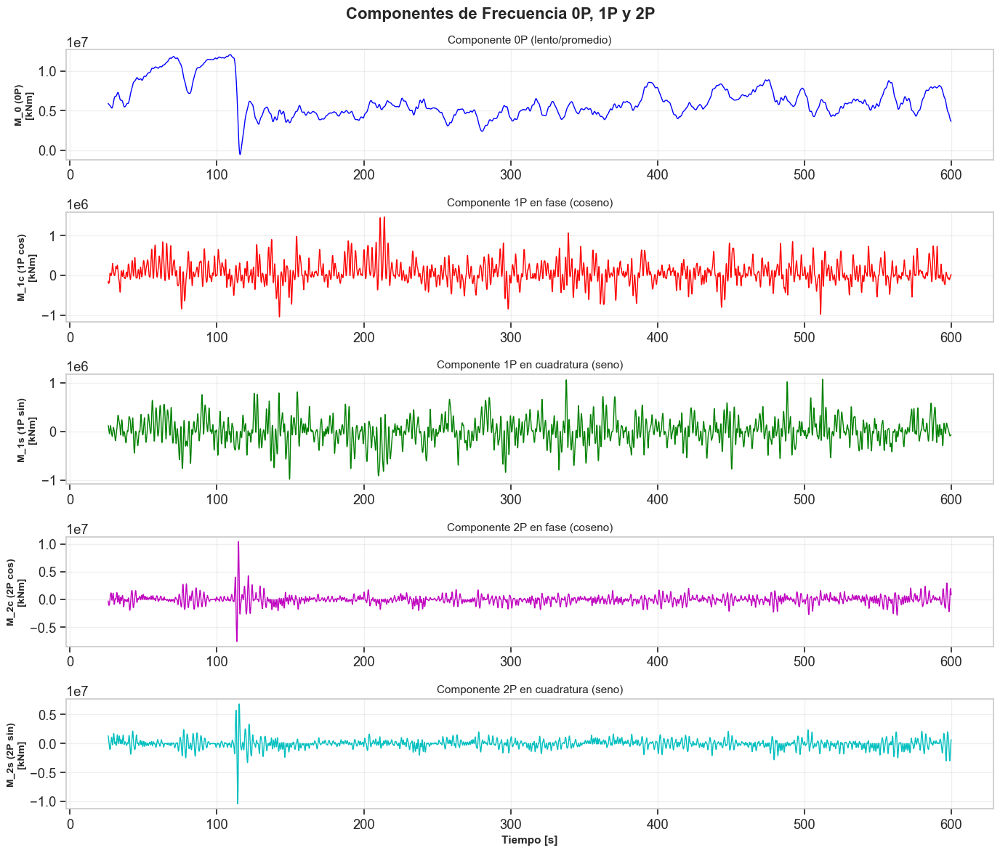


RECONSTRUYENDO SEÑALES ORIGINALES
Azimut ya está en radianes

Reconstruyendo componentes intermedias...
   ✓ M_Δ (1P) reconstruido
   ✓ M_Σ (2P) reconstruido
   ✓ Blade root 1 My reconstruido
   ✓ Blade root 2 My reconstruido

Errores de reconstrucción (RMSE):
   Blade root 1 My (solo 1P):    1181733.89 kNm
   Blade root 2 My (solo 1P):    1204830.28 kNm
   Blade root 1 My (1P + 2P):    1181733.89 kNm
   Blade root 2 My (1P + 2P):    1204830.28 kNm


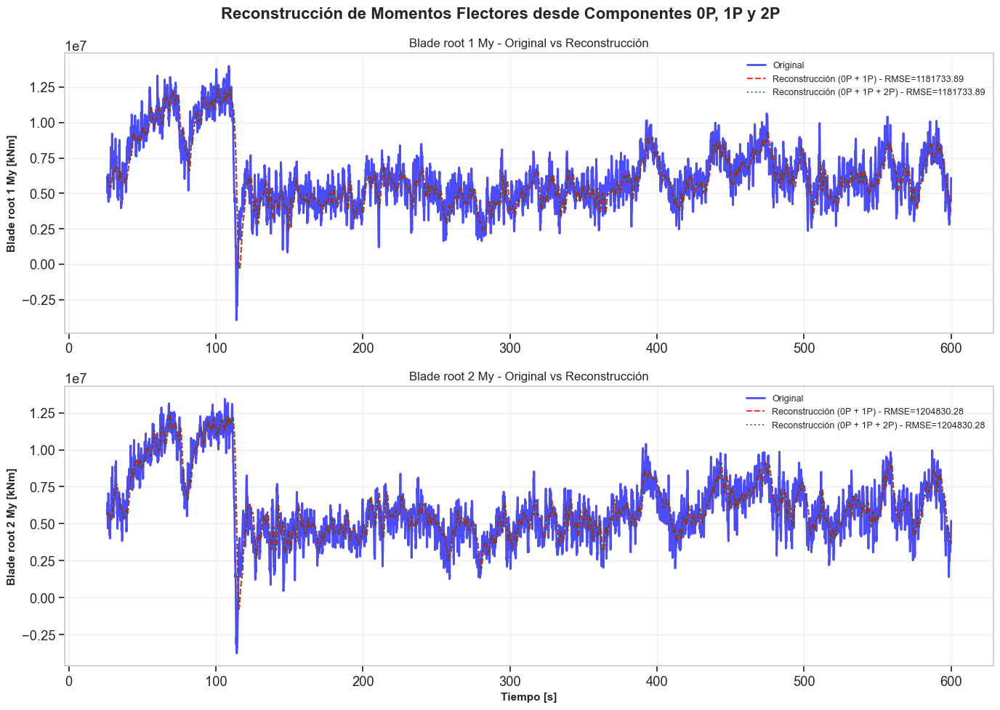

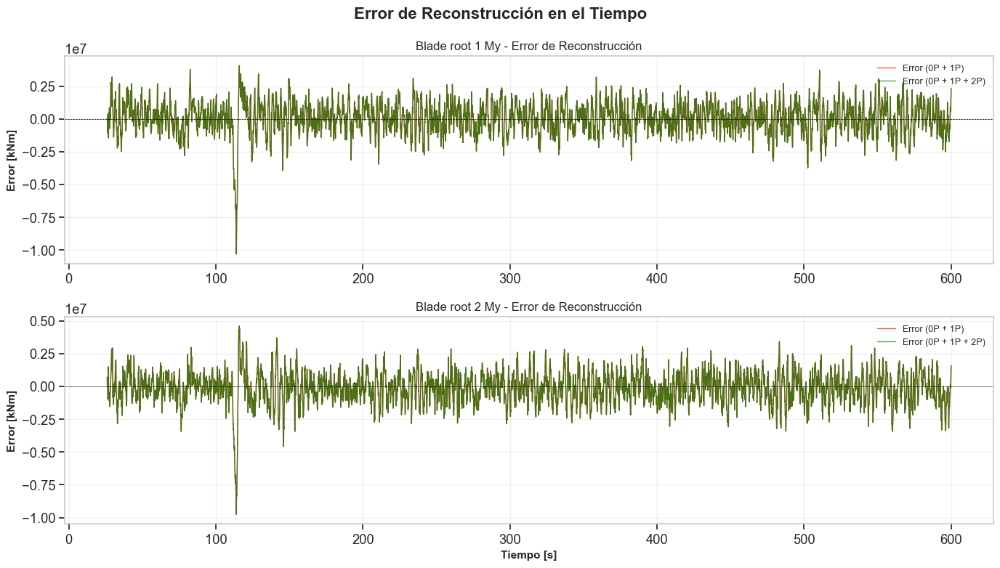


VISUALIZACIÓN COMPLETADA


In [206]:
# ============================================================================
# VISUALIZACIÓN: Componentes 0P, 1P, 2P y Reconstrucción de señales
# ============================================================================

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path

# Cargar el CSV
csv_path = Path(r"C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train_traditional_ML\0040_DLC1.2_150_000_000_04.csv")
df = pd.read_csv(csv_path)

print(f"CSV cargado: {csv_path.name}")
print(f"Shape: {df.shape}")
print(f"\nColumnas disponibles que contienen 'M_':")
print([col for col in df.columns if 'M_' in col or 'Blade root' in col])

# ============================================================================
# PARTE 1: Plot de las 5 componentes de frecuencia (M_0, M_1c, M_1s, M_2c, M_2s)
# ============================================================================

fig, axes = plt.subplots(5, 1, figsize=(14, 12))
fig.suptitle('Componentes de Frecuencia 0P, 1P y 2P', fontsize=16, fontweight='bold')

time = df['Time'].values

# M_0 (0P - componente lento)
axes[0].plot(time, df['M_0'].values, 'b-', linewidth=1)
axes[0].set_ylabel('M_0 (0P)\n[kNm]', fontsize=10, fontweight='bold')
axes[0].set_title('Componente 0P (lento/promedio)', fontsize=11)
axes[0].grid(True, alpha=0.3)

# M_1c (1P coseno)
axes[1].plot(time, df['M_1c'].values, 'r-', linewidth=1)
axes[1].set_ylabel('M_1c (1P cos)\n[kNm]', fontsize=10, fontweight='bold')
axes[1].set_title('Componente 1P en fase (coseno)', fontsize=11)
axes[1].grid(True, alpha=0.3)

# M_1s (1P seno)
axes[2].plot(time, df['M_1s'].values, 'g-', linewidth=1)
axes[2].set_ylabel('M_1s (1P sin)\n[kNm]', fontsize=10, fontweight='bold')
axes[2].set_title('Componente 1P en cuadratura (seno)', fontsize=11)
axes[2].grid(True, alpha=0.3)

# M_2c (2P coseno)
axes[3].plot(time, df['M_2c'].values, 'm-', linewidth=1)
axes[3].set_ylabel('M_2c (2P cos)\n[kNm]', fontsize=10, fontweight='bold')
axes[3].set_title('Componente 2P en fase (coseno)', fontsize=11)
axes[3].grid(True, alpha=0.3)

# M_2s (2P seno)
axes[4].plot(time, df['M_2s'].values, 'c-', linewidth=1)
axes[4].set_ylabel('M_2s (2P sin)\n[kNm]', fontsize=10, fontweight='bold')
axes[4].set_title('Componente 2P en cuadratura (seno)', fontsize=11)
axes[4].set_xlabel('Tiempo [s]', fontsize=11, fontweight='bold')
axes[4].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
# PARTE 2: Reconstrucción de Blade root 1 My y Blade root 2 My
# ============================================================================

print("\n" + "="*70)
print("RECONSTRUYENDO SEÑALES ORIGINALES")
print("="*70)

# Obtener datos necesarios
M_0 = df['M_0'].values
M_1c = df['M_1c'].values
M_1s = df['M_1s'].values
M_2c = df['M_2c'].values
M_2s = df['M_2s'].values
azimuth = df['Rotor azimuth angle'].values

# Convertir azimut a radianes si está en grados
if azimuth.max() > 6.5:
    azimuth_rad = np.deg2rad(azimuth)
    print("Azimut convertido de grados a radianes")
else:
    azimuth_rad = azimuth
    print("Azimut ya está en radianes")

# Reconstruir componentes diferenciales y de suma
print("\nReconstruyendo componentes intermedias...")

# Recuperar M_diff (1P) desde M_1c y M_1s
M_diff_reconstructed = M_1c * np.cos(azimuth_rad) + M_1s * np.sin(azimuth_rad)
print("   ✓ M_Δ (1P) reconstruido")

# Recuperar M_sum (2P) desde M_2c y M_2s
M_sum_reconstructed = M_2c * np.cos(2 * azimuth_rad) + M_2s * np.sin(2 * azimuth_rad)
print("   ✓ M_Σ (2P) reconstruido")

# Reconstruir las señales originales
# Opción 1: Solo con 1P (sin 2P)
M1_reconstructed_1P = M_0 + M_diff_reconstructed 
M2_reconstructed_1P = M_0 - M_diff_reconstructed 

# Opción 2: Con 1P y 2P (más completa)
M1_reconstructed_full = M_0 + M_diff_reconstructed 
M2_reconstructed_full = M_0 - M_diff_reconstructed 

print("   ✓ Blade root 1 My reconstruido")
print("   ✓ Blade root 2 My reconstruido")

# Señales originales
M1_original = df['Blade root 1 My'].values
M2_original = df['Blade root 2 My'].values

# Calcular errores de reconstrucción
error_M1_1P = np.sqrt(np.mean((M1_original - M1_reconstructed_1P)**2))
error_M2_1P = np.sqrt(np.mean((M2_original - M2_reconstructed_1P)**2))
error_M1_full = np.sqrt(np.mean((M1_original - M1_reconstructed_full)**2))
error_M2_full = np.sqrt(np.mean((M2_original - M2_reconstructed_full)**2))

print(f"\nErrores de reconstrucción (RMSE):")
print(f"   Blade root 1 My (solo 1P):    {error_M1_1P:.2f} kNm")
print(f"   Blade root 2 My (solo 1P):    {error_M2_1P:.2f} kNm")
print(f"   Blade root 1 My (1P + 2P):    {error_M1_full:.2f} kNm")
print(f"   Blade root 2 My (1P + 2P):    {error_M2_full:.2f} kNm")

# ============================================================================
# PLOT: Comparación Original vs Reconstrucción
# ============================================================================

fig, axes = plt.subplots(2, 1, figsize=(14, 10))
fig.suptitle('Reconstrucción de Momentos Flectores desde Componentes 0P, 1P y 2P', 
             fontsize=16, fontweight='bold')

# SUBPLOT 1: Blade root 1 My
axes[0].plot(time, M1_original, 'b-', linewidth=2, label='Original', alpha=0.7)
axes[0].plot(time, M1_reconstructed_1P, 'r--', linewidth=1.5, 
             label=f'Reconstrucción (0P + 1P) - RMSE={error_M1_1P:.2f}', alpha=0.8)
axes[0].plot(time, M1_reconstructed_full, 'g:', linewidth=1.5, 
             label=f'Reconstrucción (0P + 1P + 2P) - RMSE={error_M1_full:.2f}', alpha=0.8)
axes[0].set_ylabel('Blade root 1 My [kNm]', fontsize=11, fontweight='bold')
axes[0].set_title('Blade root 1 My - Original vs Reconstrucción', fontsize=12)
axes[0].legend(loc='upper right', fontsize=9)
axes[0].grid(True, alpha=0.3)

# SUBPLOT 2: Blade root 2 My
axes[1].plot(time, M2_original, 'b-', linewidth=2, label='Original', alpha=0.7)
axes[1].plot(time, M2_reconstructed_1P, 'r--', linewidth=1.5, 
             label=f'Reconstrucción (0P + 1P) - RMSE={error_M2_1P:.2f}', alpha=0.8)
axes[1].plot(time, M2_reconstructed_full, 'g:', linewidth=1.5, 
             label=f'Reconstrucción (0P + 1P + 2P) - RMSE={error_M2_full:.2f}', alpha=0.8)
axes[1].set_ylabel('Blade root 2 My [kNm]', fontsize=11, fontweight='bold')
axes[1].set_xlabel('Tiempo [s]', fontsize=11, fontweight='bold')
axes[1].set_title('Blade root 2 My - Original vs Reconstrucción', fontsize=12)
axes[1].legend(loc='upper right', fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================================================
# PLOT ADICIONAL: Error de reconstrucción en el tiempo
# ============================================================================

fig, axes = plt.subplots(2, 1, figsize=(14, 8))
fig.suptitle('Error de Reconstrucción en el Tiempo', fontsize=16, fontweight='bold')

# Error Blade root 1 My
error_1P_M1 = M1_original - M1_reconstructed_1P
error_full_M1 = M1_original - M1_reconstructed_full

axes[0].plot(time, error_1P_M1, 'r-', linewidth=1, label='Error (0P + 1P)', alpha=0.7)
axes[0].plot(time, error_full_M1, 'g-', linewidth=1, label='Error (0P + 1P + 2P)', alpha=0.7)
axes[0].axhline(y=0, color='k', linestyle='--', linewidth=0.5)
axes[0].set_ylabel('Error [kNm]', fontsize=11, fontweight='bold')
axes[0].set_title('Blade root 1 My - Error de Reconstrucción', fontsize=12)
axes[0].legend(loc='upper right', fontsize=9)
axes[0].grid(True, alpha=0.3)

# Error Blade root 2 My
error_1P_M2 = M2_original - M2_reconstructed_1P
error_full_M2 = M2_original - M2_reconstructed_full

axes[1].plot(time, error_1P_M2, 'r-', linewidth=1, label='Error (0P + 1P)', alpha=0.7)
axes[1].plot(time, error_full_M2, 'g-', linewidth=1, label='Error (0P + 1P + 2P)', alpha=0.7)
axes[1].axhline(y=0, color='k', linestyle='--', linewidth=0.5)
axes[1].set_ylabel('Error [kNm]', fontsize=11, fontweight='bold')
axes[1].set_xlabel('Tiempo [s]', fontsize=11, fontweight='bold')
axes[1].set_title('Blade root 2 My - Error de Reconstrucción', fontsize=12)
axes[1].legend(loc='upper right', fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("VISUALIZACIÓN COMPLETADA")
print("="*70)

VISUALIZACIÓN: SEÑALES LAC_VLOS POR BEAM
Archivo: 0040_DLC1.2_150_000_000_04.csv

✅ Datos cargados: 28,701 filas, 161 columnas

Columnas LAC_VLOS encontradas (beams 0-7):
  BEAM 0: LAC_VLOS_BEAM0_RANGE5
    - Media: 14.808 m/s | NaN: 0.0%
  BEAM 1: LAC_VLOS_BEAM1_RANGE5
    - Media: 14.631 m/s | NaN: 0.0%
  BEAM 2: LAC_VLOS_BEAM2_RANGE5
    - Media: 14.065 m/s | NaN: 0.0%
  BEAM 3: LAC_VLOS_BEAM3_RANGE5
    - Media: 13.194 m/s | NaN: 0.0%
  BEAM 4: LAC_VLOS_BEAM4_RANGE5
    - Media: 12.761 m/s | NaN: 0.0%
  BEAM 5: LAC_VLOS_BEAM5_RANGE5
    - Media: 13.206 m/s | NaN: 0.0%
  BEAM 6: LAC_VLOS_BEAM6_RANGE5
    - Media: 14.012 m/s | NaN: 0.0%
  BEAM 7: LAC_VLOS_BEAM7_RANGE5
    - Media: 14.585 m/s | NaN: 0.0%

GRÁFICO: SERIES TEMPORALES DE LAC_VLOS (BEAMS 0-7)


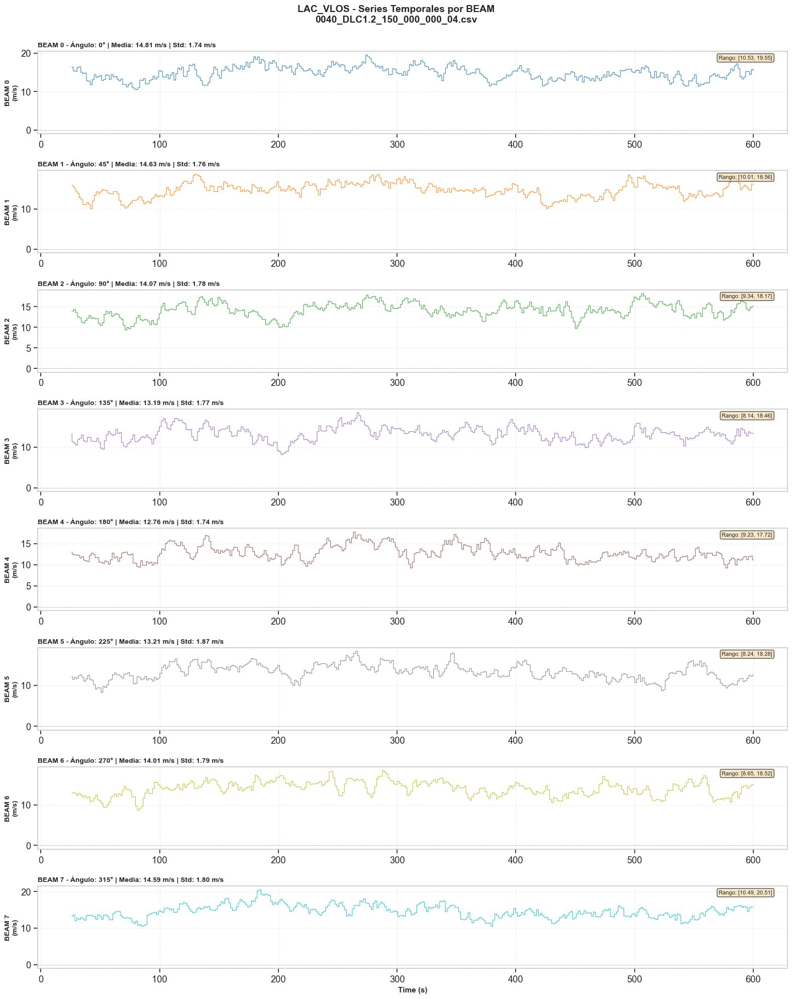

✅ Gráfico de series temporales generado

ANÁLISIS: COMPARACIÓN DE MEDIAS POR BEAM
 Beam  Ángulo   Media    Std
    0       0 14.8080 1.7432
    1      45 14.6312 1.7621
    2      90 14.0653 1.7757
    3     135 13.1944 1.7662
    4     180 12.7614 1.7375
    5     225 13.2057 1.8656
    6     270 14.0122 1.7865
    7     315 14.5854 1.7998


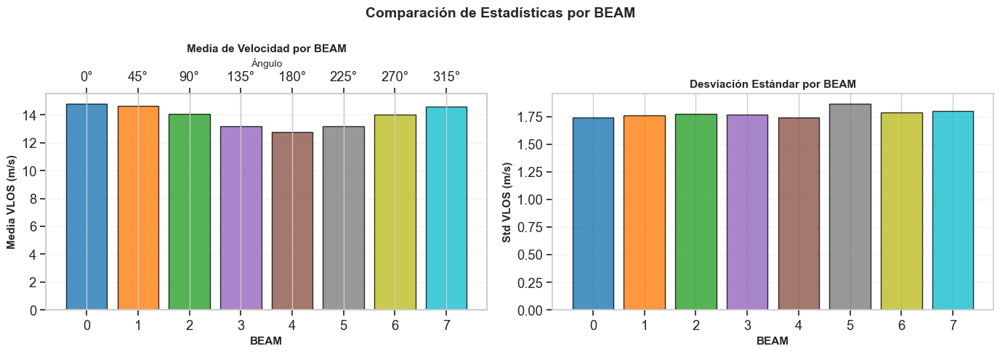

✅ Gráfico de comparación generado

DIAGNÓSTICO: CÁLCULO MANUAL DE SHEAR
Configuración actual:
  Arriba (↑):     beams [0, 1, 7]     → media: 14.675 m/s
  Abajo (↓):      beams [3, 4, 5]   → media: 13.054 m/s
  Izquierda (←):  beams [5, 6, 7]   → media: 13.934 m/s
  Derecha (→):    beams [1, 2, 3]  → media: 13.964 m/s

🔍 SHEAR CALCULADO:
  U_shear_vert  = 14.675 - 13.054 = +1.621 m/s
  U_shear_horiz = 13.934 - 13.964 = -0.029 m/s

📊 VALORES EN EL CSV:
  U_shear_vert  (CSV): +1.175 m/s
  U_shear_horiz (CSV): -4.659 m/s

✓ Diferencia vertical:   0.4460 m/s
✓ Diferencia horizontal: 4.6300 m/s


In [207]:
# ============================================================================
# VISUALIZACIÓN: SEÑALES LAC_VLOS DE BEAMS INDIVIDUALES (0-7)
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from pathlib import Path

# Archivo a analizar
csv_path = Path(r"C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train_traditional_ML\0040_DLC1.2_150_000_000_04.csv")

print("="*70)
print("VISUALIZACIÓN: SEÑALES LAC_VLOS POR BEAM")
print("="*70)
print(f"Archivo: {csv_path.name}\n")

# Cargar datos
df = pd.read_csv(csv_path)
print(f"✅ Datos cargados: {df.shape[0]:,} filas, {df.shape[1]} columnas\n")

# Buscar columnas LAC_VLOS (sin lag, sin beam8/beam9)
vlos_cols = []
for col in df.columns:
    if 'LAC_VLOS' in col and 'lag' not in col.lower():
        # Extraer número de beam
        match = re.search(r'BEAM(\d+)', col)
        if match:
            beam_num = int(match.group(1))
            # Excluir beams 8 y 9
            if beam_num not in [8, 9]:
                vlos_cols.append((beam_num, col))

# Ordenar por número de beam
vlos_cols.sort(key=lambda x: x[0])

print(f"Columnas LAC_VLOS encontradas (beams 0-7):")
for beam_num, col_name in vlos_cols:
    nan_pct = df[col_name].isna().sum() / len(df) * 100
    mean_val = df[col_name].mean()
    print(f"  BEAM {beam_num}: {col_name}")
    print(f"    - Media: {mean_val:.3f} m/s | NaN: {nan_pct:.1f}%")

if len(vlos_cols) == 0:
    print("\n❌ No se encontraron columnas LAC_VLOS válidas")
else:
    print(f"\n{'='*70}")
    print(f"GRÁFICO: SERIES TEMPORALES DE LAC_VLOS (BEAMS 0-7)")
    print("="*70)
    
    # Crear figura con subplots (uno por beam)
    n_beams = len(vlos_cols)
    fig, axes = plt.subplots(n_beams, 1, figsize=(16, 2.5 * n_beams))
    fig.suptitle(f'LAC_VLOS - Series Temporales por BEAM\n{csv_path.name}', 
                 fontsize=14, fontweight='bold', y=0.995)
    
    # Asegurar que axes sea una lista
    if n_beams == 1:
        axes = [axes]
    
    # Tiempo
    time = df['Time'].values if 'Time' in df.columns else np.arange(len(df))
    
    # Colores por beam (usar colormap)
    colors = plt.cm.tab10(np.linspace(0, 1, 8))
    
    # Plotear cada beam
    for idx, (beam_num, col_name) in enumerate(vlos_cols):
        ax = axes[idx]
        
        # Datos
        vlos = df[col_name].values
        
        # Plot
        ax.plot(time, vlos, linewidth=0.8, color=colors[beam_num], alpha=0.9)
        ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.3)
        
        # Estadísticas
        mean_val = np.nanmean(vlos)
        std_val = np.nanstd(vlos)
        min_val = np.nanmin(vlos)
        max_val = np.nanmax(vlos)
        
        # Labels
        ax.set_ylabel(f'BEAM {beam_num}\n(m/s)', fontsize=10, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        # Título con ángulo
        angle = beam_num * 45
        ax.set_title(f'BEAM {beam_num} - Ángulo: {angle}° | Media: {mean_val:.2f} m/s | Std: {std_val:.2f} m/s', 
                    fontsize=10, fontweight='bold', loc='left')
        
        # Estadísticas en cuadro
        stats_text = f'Rango: [{min_val:.2f}, {max_val:.2f}]'
        ax.text(0.98, 0.95, stats_text, transform=ax.transAxes, 
               verticalalignment='top', horizontalalignment='right',
               fontsize=8, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
    
    # X label solo en el último
    axes[-1].set_xlabel('Time (s)', fontsize=11, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print("✅ Gráfico de series temporales generado")
    
    # ========================================================================
    # ANÁLISIS COMPARATIVO: MEDIAS POR BEAM
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("ANÁLISIS: COMPARACIÓN DE MEDIAS POR BEAM")
    print("="*70)
    
    # Extraer medias
    beam_stats = []
    for beam_num, col_name in vlos_cols:
        mean_val = df[col_name].mean()
        std_val = df[col_name].std()
        beam_stats.append({
            'Beam': beam_num,
            'Ángulo': beam_num * 45,
            'Media': mean_val,
            'Std': std_val
        })
    
    stats_df = pd.DataFrame(beam_stats)
    print(stats_df.to_string(index=False))
    
    # Gráfico de barras con medias
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Comparación de Estadísticas por BEAM', fontsize=14, fontweight='bold')
    
    # Subplot 1: Medias
    ax1.bar(stats_df['Beam'], stats_df['Media'], color=colors[:len(stats_df)], 
           edgecolor='black', alpha=0.8)
    ax1.set_xlabel('BEAM', fontsize=11, fontweight='bold')
    ax1.set_ylabel('Media VLOS (m/s)', fontsize=11, fontweight='bold')
    ax1.set_title('Media de Velocidad por BEAM', fontsize=11, fontweight='bold')
    ax1.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax1.set_xticks(stats_df['Beam'])
    
    # Añadir ángulos como segundo eje X
    ax1_top = ax1.twiny()
    ax1_top.set_xlim(ax1.get_xlim())
    ax1_top.set_xticks(stats_df['Beam'])
    ax1_top.set_xticklabels([f"{a}°" for a in stats_df['Ángulo']])
    ax1_top.set_xlabel('Ángulo', fontsize=10)
    
    # Subplot 2: Desviaciones estándar
    ax2.bar(stats_df['Beam'], stats_df['Std'], color=colors[:len(stats_df)], 
           edgecolor='black', alpha=0.8)
    ax2.set_xlabel('BEAM', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Std VLOS (m/s)', fontsize=11, fontweight='bold')
    ax2.set_title('Desviación Estándar por BEAM', fontsize=11, fontweight='bold')
    ax2.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax2.set_xticks(stats_df['Beam'])
    
    plt.tight_layout()
    plt.show()
    
    print("✅ Gráfico de comparación generado")
    
    # ========================================================================
    # DIAGNÓSTICO: SHEAR CALCULADO A MANO
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("DIAGNÓSTICO: CÁLCULO MANUAL DE SHEAR")
    print("="*70)
    
    # Configuración actual
    beams_up = [0, 1, 7]
    beams_down = [3, 4, 5]
    beams_left = [5, 6, 7]
    beams_right = [1, 2, 3]
    
    # Extraer medias por grupo
    mean_up = np.mean([stats_df[stats_df['Beam'] == b]['Media'].values[0] 
                       for b in beams_up if b in stats_df['Beam'].values])
    mean_down = np.mean([stats_df[stats_df['Beam'] == b]['Media'].values[0] 
                         for b in beams_down if b in stats_df['Beam'].values])
    mean_left = np.mean([stats_df[stats_df['Beam'] == b]['Media'].values[0] 
                         for b in beams_left if b in stats_df['Beam'].values])
    mean_right = np.mean([stats_df[stats_df['Beam'] == b]['Media'].values[0] 
                          for b in beams_right if b in stats_df['Beam'].values])
    
    shear_vert = mean_up - mean_down
    shear_horiz = mean_left - mean_right
    
    print(f"Configuración actual:")
    print(f"  Arriba (↑):     beams {beams_up}     → media: {mean_up:.3f} m/s")
    print(f"  Abajo (↓):      beams {beams_down}   → media: {mean_down:.3f} m/s")
    print(f"  Izquierda (←):  beams {beams_left}   → media: {mean_left:.3f} m/s")
    print(f"  Derecha (→):    beams {beams_right}  → media: {mean_right:.3f} m/s")
    print(f"\n🔍 SHEAR CALCULADO:")
    print(f"  U_shear_vert  = {mean_up:.3f} - {mean_down:.3f} = {shear_vert:+.3f} m/s")
    print(f"  U_shear_horiz = {mean_left:.3f} - {mean_right:.3f} = {shear_horiz:+.3f} m/s")
    
    # Comparar con valores guardados en el CSV
    if 'U_shear_vert' in df.columns:
        csv_shear_vert = df['U_shear_vert'].mean()
        csv_shear_horiz = df['U_shear_horiz'].mean()
        print(f"\n📊 VALORES EN EL CSV:")
        print(f"  U_shear_vert  (CSV): {csv_shear_vert:+.3f} m/s")
        print(f"  U_shear_horiz (CSV): {csv_shear_horiz:+.3f} m/s")
        print(f"\n✓ Diferencia vertical:   {abs(shear_vert - csv_shear_vert):.4f} m/s")
        print(f"✓ Diferencia horizontal: {abs(shear_horiz - csv_shear_horiz):.4f} m/s")
    
    print("="*70)

VISUALIZACIÓN DE NUEVAS FEATURES
Archivo: 0040_DLC1.2_150_000_000_04.csv

✅ Datos cargados: 28,701 filas, 161 columnas

Variables de pitch Coleman encontradas: 7/7
Variables de estadísticas de viento encontradas: 4/4

GRÁFICO 1: PITCH COLEMAN - COMPONENTES


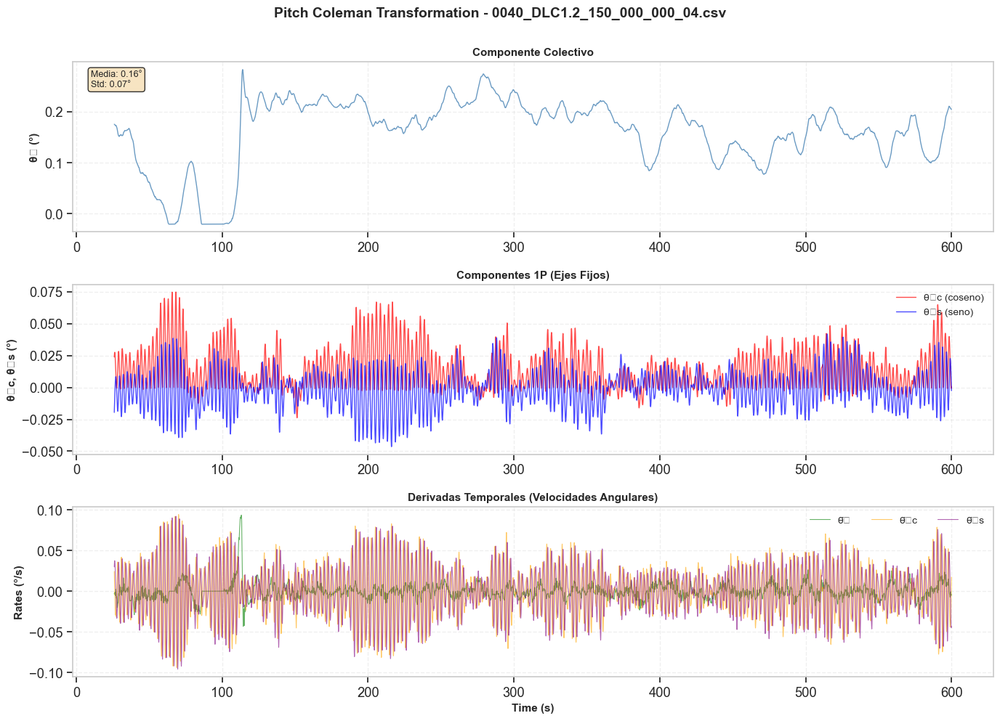

✅ Gráfico 1 generado

GRÁFICO 2: PITCH COLEMAN - SCATTER PLOTS


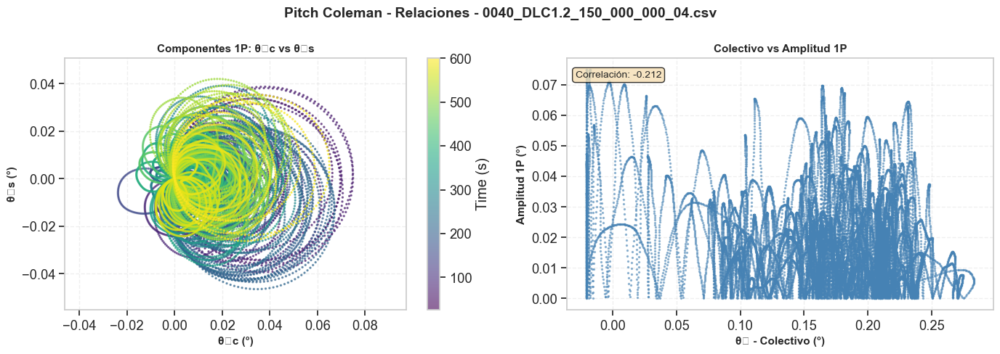

✅ Gráfico 2 generado

GRÁFICO 3: ESTADÍSTICAS DEL CAMPO DE VIENTO


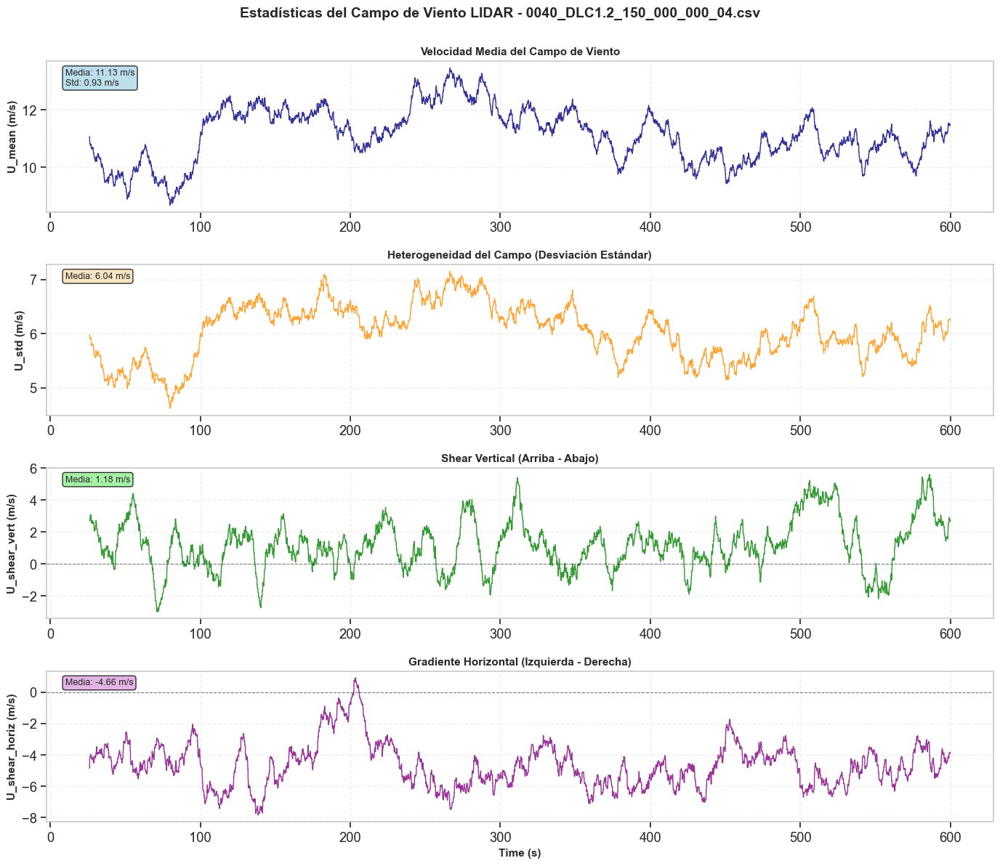

✅ Gráfico 3 generado

GRÁFICO 4: DISTRIBUCIONES (HISTOGRAMAS)


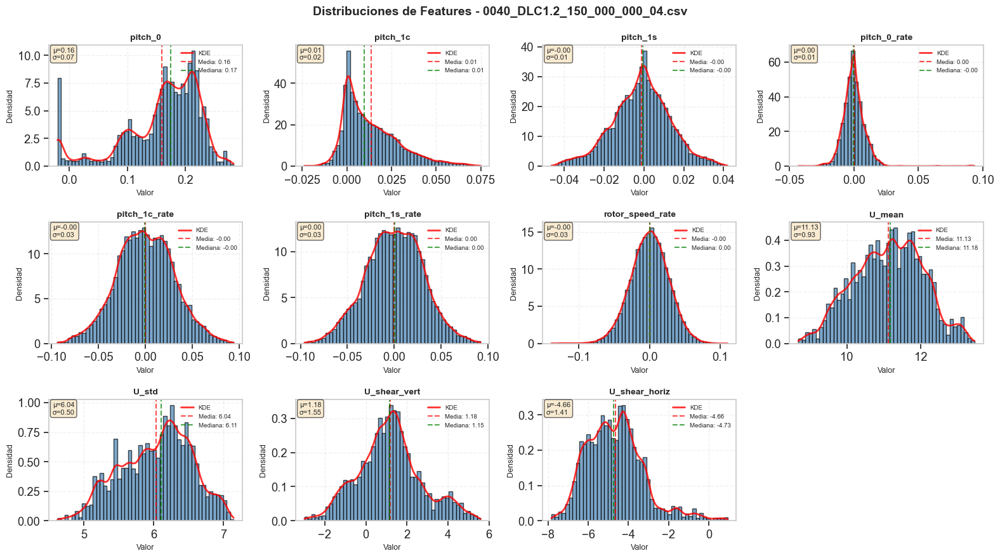

✅ Gráfico 4 generado

GRÁFICO 5: MATRIZ DE CORRELACIÓN (FEATURES + TARGETS)
Variables incluidas en correlación:
  - Features pitch: 7
  - Features viento: 4
  - Targets: 3 ['M_0', 'M_1c', 'M_1s']


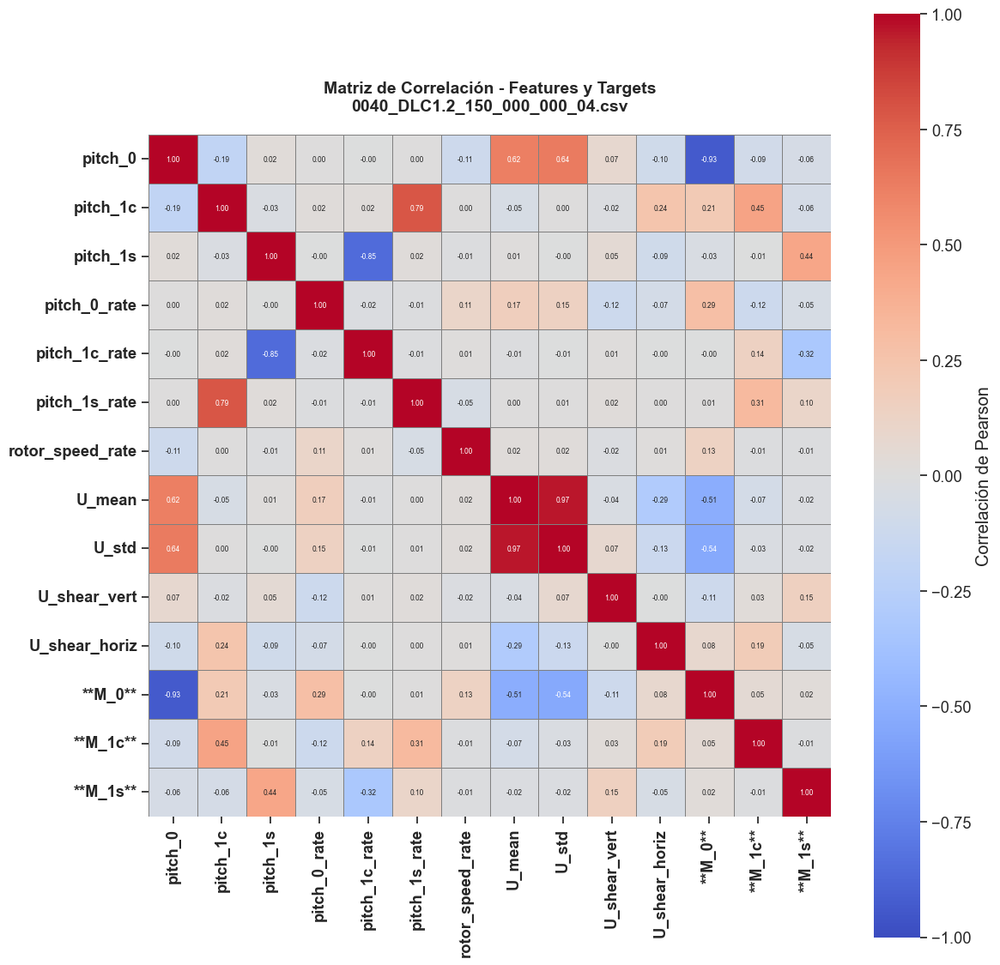

✅ Gráfico 5 generado

ANÁLISIS DE CORRELACIONES CON TARGETS

🎯 Target: M_0
--------------------------------------------------
Top 5 correlaciones (valor absoluto):
  1. pitch_0             : -0.931
  2. U_std               : -0.536
  3. U_mean              : -0.514
  4. pitch_0_rate        : +0.288
  5. pitch_1c            : +0.205

🎯 Target: M_1c
--------------------------------------------------
Top 5 correlaciones (valor absoluto):
  1. pitch_1c            : +0.451
  2. pitch_1s_rate       : +0.313
  3. U_shear_horiz       : +0.188
  4. pitch_1c_rate       : +0.142
  5. pitch_0_rate        : -0.120

🎯 Target: M_1s
--------------------------------------------------
Top 5 correlaciones (valor absoluto):
  1. pitch_1s            : +0.436
  2. pitch_1c_rate       : -0.323
  3. U_shear_vert        : +0.153
  4. pitch_1s_rate       : +0.102
  5. pitch_1c            : -0.064

RESUMEN ESTADÍSTICO
          pitch_0    pitch_1c    pitch_1s  pitch_0_rate  pitch_1c_rate  \
count  28701.0000  28

In [208]:
# ============================================================================
# VISUALIZACIÓN DE NUEVAS FEATURES: PITCH COLEMAN Y ESTADÍSTICAS DE VIENTO
# ============================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# Archivo a analizar
csv_path = Path(r"C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train_traditional_ML\0040_DLC1.2_150_000_000_04.csv")

print("="*70)
print("VISUALIZACIÓN DE NUEVAS FEATURES")
print("="*70)
print(f"Archivo: {csv_path.name}\n")

# Cargar datos
df = pd.read_csv(csv_path)
print(f"✅ Datos cargados: {df.shape[0]:,} filas, {df.shape[1]} columnas\n")

# Variables a plotear
pitch_vars = ['pitch_0', 'pitch_1c', 'pitch_1s', 
              'pitch_0_rate', 'pitch_1c_rate', 'pitch_1s_rate', 'rotor_speed_rate']

wind_vars = ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz']

# Verificar qué variables existen
pitch_available = [v for v in pitch_vars if v in df.columns]
wind_available = [v for v in wind_vars if v in df.columns]

print(f"Variables de pitch Coleman encontradas: {len(pitch_available)}/{len(pitch_vars)}")
print(f"Variables de estadísticas de viento encontradas: {len(wind_available)}/{len(wind_vars)}")

if len(pitch_available) == 0 and len(wind_available) == 0:
    print("\n❌ ERROR: No se encontraron las variables. Ejecuta create_pitch_coleman_features() "
          "y create_wind_field_statistics() primero.")
else:
    # ========================================================================
    # GRÁFICO 1: PITCH COLEMAN - TIME SERIES
    # ========================================================================
    
    if len(pitch_available) >= 3:
        print(f"\n{'='*70}")
        print("GRÁFICO 1: PITCH COLEMAN - COMPONENTES")
        print("="*70)
        
        fig, axes = plt.subplots(3, 1, figsize=(14, 10))
        fig.suptitle(f'Pitch Coleman Transformation - {csv_path.name}', 
                     fontsize=14, fontweight='bold', y=0.995)
        
        time = df['Time'].values if 'Time' in df.columns else np.arange(len(df))
        
        # Subplot 1: pitch_0 (colectivo)
        if 'pitch_0' in df.columns:
            ax = axes[0]
            ax.plot(time, df['pitch_0'], linewidth=1, color='steelblue', alpha=0.8)
            ax.set_ylabel('θ₀ (°)', fontsize=11, fontweight='bold')
            ax.set_title('Componente Colectivo', fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Estadísticas
            mean_val = df['pitch_0'].mean()
            std_val = df['pitch_0'].std()
            ax.text(0.02, 0.95, f'Media: {mean_val:.2f}°\nStd: {std_val:.2f}°',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                   fontsize=9)
        
        # Subplot 2: pitch_1c y pitch_1s (componentes 1P)
        ax = axes[1]
        if 'pitch_1c' in df.columns:
            ax.plot(time, df['pitch_1c'], linewidth=1, color='red', 
                   alpha=0.7, label='θ₁c (coseno)')
        if 'pitch_1s' in df.columns:
            ax.plot(time, df['pitch_1s'], linewidth=1, color='blue', 
                   alpha=0.7, label='θ₁s (seno)')
        ax.set_ylabel('θ₁c, θ₁s (°)', fontsize=11, fontweight='bold')
        ax.set_title('Componentes 1P (Ejes Fijos)', fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='upper right', fontsize=10)
        
        # Subplot 3: Rates
        ax = axes[2]
        if 'pitch_0_rate' in df.columns:
            ax.plot(time, df['pitch_0_rate'], linewidth=0.8, color='green', 
                   alpha=0.6, label='θ̇₀')
        if 'pitch_1c_rate' in df.columns:
            ax.plot(time, df['pitch_1c_rate'], linewidth=0.8, color='orange', 
                   alpha=0.6, label='θ̇₁c')
        if 'pitch_1s_rate' in df.columns:
            ax.plot(time, df['pitch_1s_rate'], linewidth=0.8, color='purple', 
                   alpha=0.6, label='θ̇₁s')
        ax.set_xlabel('Time (s)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Rates (°/s)', fontsize=11, fontweight='bold')
        ax.set_title('Derivadas Temporales (Velocidades Angulares)', 
                    fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='upper right', fontsize=10, ncol=3)
        
        plt.tight_layout()
        plt.show()
        
        print("✅ Gráfico 1 generado")
    
    # ========================================================================
    # GRÁFICO 2: PITCH - SCATTER PLOTS (relaciones)
    # ========================================================================
    
    if 'pitch_1c' in df.columns and 'pitch_1s' in df.columns:
        print(f"\n{'='*70}")
        print("GRÁFICO 2: PITCH COLEMAN - SCATTER PLOTS")
        print("="*70)
        
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))
        fig.suptitle(f'Pitch Coleman - Relaciones - {csv_path.name}', 
                     fontsize=14, fontweight='bold')
        
        # Subplot 1: θ₁c vs θ₁s (debería formar un círculo/elipse)
        ax = axes[0]
        scatter = ax.scatter(df['pitch_1c'], df['pitch_1s'], 
                           c=time, cmap='viridis', s=2, alpha=0.6)
        ax.set_xlabel('θ₁c (°)', fontsize=11, fontweight='bold')
        ax.set_ylabel('θ₁s (°)', fontsize=11, fontweight='bold')
        ax.set_title('Componentes 1P: θ₁c vs θ₁s', fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.axis('equal')
        plt.colorbar(scatter, ax=ax, label='Time (s)')
        
        # Subplot 2: θ₀ vs amplitud 1P
        if 'pitch_0' in df.columns:
            ax = axes[1]
            amplitude_1P = np.sqrt(df['pitch_1c']**2 + df['pitch_1s']**2)
            ax.scatter(df['pitch_0'], amplitude_1P, s=2, alpha=0.5, color='steelblue')
            ax.set_xlabel('θ₀ - Colectivo (°)', fontsize=11, fontweight='bold')
            ax.set_ylabel('Amplitud 1P (°)', fontsize=11, fontweight='bold')
            ax.set_title('Colectivo vs Amplitud 1P', fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Correlación
            corr = np.corrcoef(df['pitch_0'].dropna(), amplitude_1P.dropna())[0, 1]
            ax.text(0.02, 0.95, f'Correlación: {corr:.3f}',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                   fontsize=10)
        
        plt.tight_layout()
        plt.show()
        
        print("✅ Gráfico 2 generado")
    
    # ========================================================================
    # GRÁFICO 3: ESTADÍSTICAS DE VIENTO - TIME SERIES
    # ========================================================================
    
    if len(wind_available) > 0:
        print(f"\n{'='*70}")
        print("GRÁFICO 3: ESTADÍSTICAS DEL CAMPO DE VIENTO")
        print("="*70)
        
        fig, axes = plt.subplots(4, 1, figsize=(14, 12))
        fig.suptitle(f'Estadísticas del Campo de Viento LIDAR - {csv_path.name}', 
                     fontsize=14, fontweight='bold', y=0.995)
        
        time = df['Time'].values if 'Time' in df.columns else np.arange(len(df))
        
        # Subplot 1: U_mean
        if 'U_mean' in df.columns:
            ax = axes[0]
            ax.plot(time, df['U_mean'], linewidth=1, color='navy', alpha=0.8)
            ax.set_ylabel('U_mean (m/s)', fontsize=11, fontweight='bold')
            ax.set_title('Velocidad Media del Campo de Viento', 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            mean_val = df['U_mean'].mean()
            std_val = df['U_mean'].std()
            ax.text(0.02, 0.95, f'Media: {mean_val:.2f} m/s\nStd: {std_val:.2f} m/s',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8),
                   fontsize=9)
        
        # Subplot 2: U_std
        if 'U_std' in df.columns:
            ax = axes[1]
            ax.plot(time, df['U_std'], linewidth=1, color='darkorange', alpha=0.8)
            ax.set_ylabel('U_std (m/s)', fontsize=11, fontweight='bold')
            ax.set_title('Heterogeneidad del Campo (Desviación Estándar)', 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            mean_val = df['U_std'].mean()
            ax.text(0.02, 0.95, f'Media: {mean_val:.2f} m/s',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8),
                   fontsize=9)
        
        # Subplot 3: U_shear_vert
        if 'U_shear_vert' in df.columns:
            ax = axes[2]
            ax.plot(time, df['U_shear_vert'], linewidth=1, color='green', alpha=0.8)
            ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
            ax.set_ylabel('U_shear_vert (m/s)', fontsize=11, fontweight='bold')
            ax.set_title('Shear Vertical (Arriba - Abajo)', 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            mean_val = df['U_shear_vert'].mean()
            ax.text(0.02, 0.95, f'Media: {mean_val:.2f} m/s',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8),
                   fontsize=9)
        
        # Subplot 4: U_shear_horiz
        if 'U_shear_horiz' in df.columns:
            ax = axes[3]
            ax.plot(time, df['U_shear_horiz'], linewidth=1, color='purple', alpha=0.8)
            ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.5)
            ax.set_xlabel('Time (s)', fontsize=11, fontweight='bold')
            ax.set_ylabel('U_shear_horiz (m/s)', fontsize=11, fontweight='bold')
            ax.set_title('Gradiente Horizontal (Izquierda - Derecha)', 
                        fontsize=11, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            
            mean_val = df['U_shear_horiz'].mean()
            ax.text(0.02, 0.95, f'Media: {mean_val:.2f} m/s',
                   transform=ax.transAxes, verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='plum', alpha=0.8),
                   fontsize=9)
        
        plt.tight_layout()
        plt.show()
        
        print("✅ Gráfico 3 generado")
    
    # ========================================================================
    # GRÁFICO 4: HISTOGRAMAS Y DISTRIBUCIONES
    # ========================================================================
    
    all_vars = pitch_available + wind_available
    
    if len(all_vars) > 0:
        print(f"\n{'='*70}")
        print("GRÁFICO 4: DISTRIBUCIONES (HISTOGRAMAS)")
        print("="*70)
        
        # Calcular grid size
        n_vars = len(all_vars)
        n_cols = 4
        n_rows = int(np.ceil(n_vars / n_cols))
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 3*n_rows))
        fig.suptitle(f'Distribuciones de Features - {csv_path.name}', 
                     fontsize=14, fontweight='bold')
        
        axes = axes.flatten() if n_rows > 1 else [axes] if n_cols == 1 else axes
        
        for idx, var in enumerate(all_vars):
            ax = axes[idx]
            
            data = df[var].dropna()
            
            # Histograma
            ax.hist(data, bins=50, color='steelblue', edgecolor='black', 
                   alpha=0.7, density=True)
            
            # Curva de densidad (KDE)
            from scipy import stats
            if len(data) > 10:
                try:
                    kde = stats.gaussian_kde(data)
                    x_range = np.linspace(data.min(), data.max(), 200)
                    ax.plot(x_range, kde(x_range), 'r-', linewidth=2, 
                           label='KDE', alpha=0.8)
                except:
                    pass
            
            # Estadísticas
            mean_val = data.mean()
            median_val = data.median()
            std_val = data.std()
            
            ax.axvline(mean_val, color='red', linestyle='--', linewidth=1.5, 
                      alpha=0.7, label=f'Media: {mean_val:.2f}')
            ax.axvline(median_val, color='green', linestyle='--', linewidth=1.5, 
                      alpha=0.7, label=f'Mediana: {median_val:.2f}')
            
            ax.set_title(var, fontsize=10, fontweight='bold')
            ax.set_xlabel('Valor', fontsize=9)
            ax.set_ylabel('Densidad', fontsize=9)
            ax.grid(True, alpha=0.3, linestyle='--')
            ax.legend(fontsize=7, loc='upper right')
            
            # Texto con estadísticas
            stats_text = f'μ={mean_val:.2f}\nσ={std_val:.2f}'
            ax.text(0.02, 0.98, stats_text, transform=ax.transAxes, 
                   verticalalignment='top', fontsize=8,
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.6))
        
        # Ocultar axes sobrantes
        for idx in range(len(all_vars), len(axes)):
            axes[idx].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print("✅ Gráfico 4 generado")
    
    # ========================================================================
    # GRÁFICO 5: CORRELACIONES ENTRE VARIABLES (INCLUYENDO TARGETS)
    # ========================================================================
    
    # Añadir targets de momento para la correlación
    target_vars = ['M_0', 'M_1c', 'M_1s']
    target_available = [v for v in target_vars if v in df.columns]
    
    # Variables para correlación: features + targets
    corr_vars = all_vars + target_available
    
    if len(corr_vars) >= 2:
        print(f"\n{'='*70}")
        print("GRÁFICO 5: MATRIZ DE CORRELACIÓN (FEATURES + TARGETS)")
        print("="*70)
        
        print(f"Variables incluidas en correlación:")
        print(f"  - Features pitch: {len(pitch_available)}")
        print(f"  - Features viento: {len(wind_available)}")
        print(f"  - Targets: {len(target_available)} {target_available}")
        
        # Calcular matriz de correlación
        corr_matrix = df[corr_vars].corr()
        
        # Tamaño de figura adaptativo
        fig_size = max(12, len(corr_vars) * 0.8)
        fig, ax = plt.subplots(figsize=(fig_size, fig_size))
        
        import seaborn as sns
        
        # Crear anotaciones personalizadas (más grandes para targets)
        annot_size = 8 if len(corr_vars) <= 12 else 6
        
        sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
                   center=0, vmin=-1, vmax=1, square=True, ax=ax,
                   cbar_kws={'label': 'Correlación de Pearson'},
                   linewidths=0.5, linecolor='gray',
                   annot_kws={'size': annot_size})
        
        ax.set_title(f'Matriz de Correlación - Features y Targets\n{csv_path.name}', 
                    fontsize=14, fontweight='bold', pad=20)
        
        # Resaltar targets en los labels
        ylabels = [label.get_text() for label in ax.get_yticklabels()]
        xlabels = [label.get_text() for label in ax.get_xticklabels()]
        
        # Poner en negrita los targets
        new_ylabels = []
        for label in ylabels:
            if label in target_available:
                new_ylabels.append(f'**{label}**')
            else:
                new_ylabels.append(label)
        
        new_xlabels = []
        for label in xlabels:
            if label in target_available:
                new_xlabels.append(f'**{label}**')
            else:
                new_xlabels.append(label)
        
        ax.set_yticklabels(new_ylabels, fontweight='bold' if len(target_available) > 0 else 'normal')
        ax.set_xticklabels(new_xlabels, fontweight='bold' if len(target_available) > 0 else 'normal')
        
        plt.tight_layout()
        plt.show()
        
        print("✅ Gráfico 5 generado")
        
        # ====================================================================
        # Análisis de correlaciones más relevantes con targets
        # ====================================================================
        
        if len(target_available) > 0:
            print(f"\n{'='*70}")
            print("ANÁLISIS DE CORRELACIONES CON TARGETS")
            print("="*70)
            
            for target in target_available:
                print(f"\n🎯 Target: {target}")
                print("-" * 50)
                
                # Obtener correlaciones con el target
                target_corrs = corr_matrix[target].drop(target).abs().sort_values(ascending=False)
                
                # Top 5 correlaciones
                top_n = min(5, len(target_corrs))
                print(f"Top {top_n} correlaciones (valor absoluto):")
                for i, (var, corr_val) in enumerate(target_corrs.head(top_n).items(), 1):
                    # Obtener correlación con signo
                    corr_signed = corr_matrix.loc[var, target]
                    print(f"  {i}. {var:20s}: {corr_signed:+.3f}")
    
    # ========================================================================
    # RESUMEN ESTADÍSTICO
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN ESTADÍSTICO")
    print("="*70)
    
    summary = df[all_vars].describe()
    print(summary)
    
    print(f"\n{'='*70}")
    print("ANÁLISIS COMPLETADO")
    print("="*70)

## PASO 3.6: Unir todos los CSVs en un dataset completo

Una vez que todos los archivos CSV individuales han sido procesados y tienen sus nuevas features, los combinaremos en un único DataFrame gigante que contendrá todos los datos de entrenamiento.

In [209]:
# ============================================================================
# PASO 3.6: UNIR TODOS LOS CSVs EN UN DATASET COMPLETO (OPTIMIZADO PARA MEMORIA)
# ============================================================================

print("="*70)
print("CREANDO DATASET COMPLETO - 0000_Complete_dataset.csv")
print("="*70)

# Funcion auxiliar para optimizar tipos de datos y reducir memoria
def optimize_dataframe_memory(df):
    """
    Optimiza el uso de memoria de un DataFrame convirtiendo tipos de datos.
    - float64 -> float32 (reduce 50% memoria)
    - int64 -> int16 si es posible
    """
    memory_before = df.memory_usage(deep=True).sum() / 1024**2
    
    for col in df.columns:
        col_type = df[col].dtype
        
        # Convertir float64 a float32
        if col_type == 'float64':
            df[col] = df[col].astype('float32')
        
        # Convertir int64 a int16 si los valores lo permiten
        elif col_type == 'int64':
            col_min = df[col].min()
            col_max = df[col].max()
            if col_min >= -32768 and col_max <= 32767:
                df[col] = df[col].astype('int16')
            elif col_min >= -2147483648 and col_max <= 2147483647:
                df[col] = df[col].astype('int32')
    
    memory_after = df.memory_usage(deep=True).sum() / 1024**2
    memory_saved = memory_before - memory_after
    
    return df, memory_before, memory_after, memory_saved

# Variables de control
loaded_files = 0
failed_files = 0
total_memory_before = 0
total_memory_after = 0
batch_size = 10  # Procesar en lotes de 10 archivos

# Obtener lista de CSVs en data_train_traditional_ML
csv_files = list(data_folder_ml.glob("*.csv"))

print(f"\nTotal de archivos CSV encontrados: {len(csv_files)}")
print(f"Procesamiento por lotes de {batch_size} archivos para optimizar memoria\n")

# Lista para almacenar DataFrames concatenados por lote
batched_dataframes = []

# Procesar en lotes
num_batches = (len(csv_files) + batch_size - 1) // batch_size

for batch_idx in range(num_batches):
    print(f"\n{'='*70}")
    print(f"PROCESANDO LOTE {batch_idx + 1}/{num_batches}")
    print(f"{'='*70}")
    
    # Obtener archivos del lote actual
    start_idx = batch_idx * batch_size
    end_idx = min((batch_idx + 1) * batch_size, len(csv_files))
    batch_files = csv_files[start_idx:end_idx]
    
    # Lista temporal para este lote
    batch_dfs = []
    
    # Cargar archivos del lote
    for csv_file in batch_files:
        try:
            print(f"  Cargando: {csv_file.name}", end="")
            df_temp = pd.read_csv(csv_file)
            
            # Optimizar tipos de datos inmediatamente
            df_temp, mem_before, mem_after, mem_saved = optimize_dataframe_memory(df_temp)
            
            batch_dfs.append(df_temp)
            loaded_files += 1
            total_memory_before += mem_before
            total_memory_after += mem_after
            
            print(f" ... OK ({df_temp.shape[0]} filas, {df_temp.shape[1]} cols, {mem_saved:.2f} MB ahorrados)")
            
        except Exception as e:
            print(f" ... ERROR: {str(e)}")
            failed_files += 1
    
    # Concatenar lote actual si hay archivos cargados
    if batch_dfs:
        print(f"\n  Concatenando lote {batch_idx + 1}...")
        batch_concatenated = pd.concat(batch_dfs, ignore_index=True)
        batched_dataframes.append(batch_concatenated)
        print(f"  OK - Lote {batch_idx + 1} concatenado: {batch_concatenated.shape}")
        
        # Liberar memoria del lote
        del batch_dfs
        import gc
        gc.collect()

print(f"\n{'='*70}")
print(f"Archivos cargados exitosamente: {loaded_files}")
print(f"Archivos con errores:           {failed_files}")
print(f"{'='*70}")
print(f"\nOptimización de memoria:")
print(f"  - Memoria ANTES:   {total_memory_before:.2f} MB")
print(f"  - Memoria DESPUÉS: {total_memory_after:.2f} MB")
print(f"  - Memoria AHORRADA: {total_memory_before - total_memory_after:.2f} MB ({(1 - total_memory_after/total_memory_before)*100:.1f}% reducción)")
print(f"{'='*70}\n")

if loaded_files > 0:
    # Concatenar todos los lotes
    print("Concatenando todos los lotes en DataFrame final...")
    df_complete = pd.concat(batched_dataframes, ignore_index=True)
    
    # Liberar memoria de lotes
    del batched_dataframes
    import gc
    gc.collect()
    
    print(f"Dataset completo creado:")
    print(f"  - Total de filas:    {df_complete.shape[0]:,}")
    print(f"  - Total de columnas: {df_complete.shape[1]:,}")
    print(f"  - Tamaño en memoria: {df_complete.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
    
    # Verificar que no hay NaN
    nan_count = df_complete.isna().sum().sum()
    print(f"  - Total de valores NaN: {nan_count}")
    
    if nan_count > 0:
        print(f"\nADVERTENCIA: Se encontraron {nan_count} valores NaN en el dataset completo")
    
    # Guardar el dataset completo
    output_path = data_folder_ml / "0000_Complete_dataset.csv"
    print(f"\nGuardando dataset completo en:")
    print(f"  {output_path}")
    
    df_complete.to_csv(output_path, index=False)
    
    print("\n" + "="*70)
    print("DATASET COMPLETO CREADO EXITOSAMENTE")
    print("="*70)
    print(f"\nArchivo: 0000_Complete_dataset.csv")
    print(f"Ubicación: {data_folder_ml}")
    print(f"\nEste dataset contiene:")
    print(f"  - Todas las simulaciones de viento combinadas")
    print(f"  - Todas las features originales")
    print(f"  - Lags de VLOS (5-25 segundos)")
    print(f"  - Componentes sin/cos del azimuth")
    print(f"  - Componentes 1P y 2P de momentos flectores")
    print("="*70)
    
    # Mostrar primeras columnas del dataset
    print("\nPrimeras 5 filas del dataset completo:")
    print(df_complete.head())
    
else:
    print("\nERROR: No se pudo cargar ningún archivo CSV")
    print("Verifica que los archivos existan en data_train_traditional_ML")

CREANDO DATASET COMPLETO - 0000_Complete_dataset.csv

Total de archivos CSV encontrados: 72
Procesamiento por lotes de 10 archivos para optimizar memoria


PROCESANDO LOTE 1/8
  Cargando: 0001_DLC1.2_030_000_000_01.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0002_DLC1.2_030_000_000_02.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0003_DLC1.2_030_000_000_03.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0004_DLC1.2_030_000_000_04.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0005_DLC1.2_030_000_000_05.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0006_DLC1.2_030_000_000_06.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0007_DLC1.2_050_000_000_01.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0008_DLC1.2_050_000_000_02.csv ... OK (28701 filas, 161 cols, 17.63 MB ahorrados)
  Cargando: 0009_DLC1.2_050_000_000_03.csv ... OK (28701 filas, 161 cols

---

## 📊 STEP 4: Análisis Exploratorio de Datos (EDA) - Modelos Tradicionales

En este paso vamos a realizar un análisis exploratorio exhaustivo del dataset completo para modelos de Machine Learning tradicionales.

### 🎯 Objetivos del EDA:

1. **Distribuciones de variables**: Histogramas y estadísticas descriptivas
2. **Correlaciones**: Matrices de correlación entre features y targets
3. **Series temporales**: Visualización de señales en el tiempo
4. **Outliers**: Detección de valores atípicos
5. **Relaciones bivariadas**: Scatter plots entre features importantes y targets

### 📁 Organización:
Todos los gráficos se guardarán en: `notebook/00_EDA_traditional_ML/`

---

In [210]:
# ============================================================================
# PASO 4.1: Configurar carpeta para guardar gráficos del EDA
# ============================================================================

# Crear carpeta para gráficos del EDA dentro de notebook/
eda_folder = Path.cwd() / "00_EDA_traditional_ML"
eda_folder.mkdir(exist_ok=True)

print("="*70)
print("CONFIGURACIÓN EDA - ANÁLISIS EXPLORATORIO DE DATOS")
print("="*70)
print(f"Carpeta para gráficos: {eda_folder}")
print(f"Estado: {'✅ Carpeta creada/verificada' if eda_folder.exists() else '❌ Error al crear carpeta'}")
print("="*70)

# Configurar estilo de gráficos para el EDA
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.2)
sns.set_palette("husl")

print("\n✅ Configuración de visualización aplicada")
print("📊 Listo para generar gráficos del EDA")


CONFIGURACIÓN EDA - ANÁLISIS EXPLORATORIO DE DATOS
Carpeta para gráficos: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML
Estado: ✅ Carpeta creada/verificada

✅ Configuración de visualización aplicada
📊 Listo para generar gráficos del EDA


### 📊 PASO 4.2: Histogramas de Variables Físicas

Generaremos histogramas detallados de las variables físicas estándar para analizar sus distribuciones.

In [211]:
# ============================================================================
# PASO 4.2: GENERAR HISTOGRAMAS DE VARIABLES FÍSICAS (LECTURA POR CHUNKS)
# ============================================================================

# Crear subcarpeta para histogramas
histograms_folder = eda_folder / "00_Histogramas"
histograms_folder.mkdir(exist_ok=True)

print("="*70)
print("GENERANDO HISTOGRAMAS - VARIABLES FÍSICAS ESTÁNDAR")
print("="*70)
print(f"Carpeta destino: {histograms_folder}")
print("="*70)

# Cargar dataset completo
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
    print("   Por favor, ejecuta primero el PASO 3.6 para crear el dataset completo")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Lectura por CHUNKS (optimizado para memoria)")
    
    # ========================================================================
    # PASO 1: Leer primera línea para obtener nombres de columnas
    # ========================================================================
    
    print("\n[1/3] Leyendo columnas del CSV...")
    df_sample = pd.read_csv(complete_dataset_path, nrows=0)  # Solo headers
    all_columns = df_sample.columns.tolist()
    print(f"✅ Total de columnas: {len(all_columns)}")
    
    # ========================================================================
    # PASO 2: Definir variables físicas estándar a graficar
    # ========================================================================
    
    print("\n[2/3] Seleccionando variables a graficar...")
    
    variables_to_plot = []
    
    # 1. Rotor Speed
    if 'Rotor speed' in all_columns:
        variables_to_plot.append('Rotor speed')
    
    # 2. Pitch angles
    pitch_vars = ['Blade 1 pitch angle', 'Blade 2 pitch angle']
    for var in pitch_vars:
        if var in all_columns:
            variables_to_plot.append(var)
    
    # 3. Azimuth components
    azimuth_vars = ['sin_rotor_azimuth', 'cos_rotor_azimuth']
    for var in azimuth_vars:
        if var in all_columns:
            variables_to_plot.append(var)
    
    # 4. Blade moments (TARGETS)
    moment_vars = ['Blade root 1 My', 'Blade root 2 My']
    for var in moment_vars:
        if var in all_columns:
            variables_to_plot.append(var)

    # 5. Componentes de frecuencia (0P, 1P, 2P)
    frequency_components = ['M_0', 'M_1c', 'M_1s', 'M_2c', 'M_2s']
    for var in frequency_components:
        if var in all_columns:
            variables_to_plot.append(var)
    
    # 6. VLOS variables (sin lags)
    vlos_vars = [col for col in all_columns 
                 if 'LAC_VLOS' in col and 'lag' not in col]
    variables_to_plot.extend(vlos_vars)
    
    print(f"\n📊 Variables a graficar: {len(variables_to_plot)}")
    print("\nCategorías:")
    print(f"  - Rotor speed: 1")
    print(f"  - Pitch angles: {len([v for v in variables_to_plot if 'pitch' in v.lower()])}")
    print(f"  - Azimuth components: {len([v for v in variables_to_plot if 'azimuth' in v.lower()])}")
    print(f"  - Blade moments: {len([v for v in variables_to_plot if 'My' in v])}")
    print(f"  - VLOS (sin lags): {len(vlos_vars)}")
    
    # ========================================================================
    # PASO 3: Leer CSV por chunks y acumular datos para cada variable
    # ========================================================================
    
    print(f"\n[3/3] Leyendo CSV por chunks...")
    
    chunk_size = 100000  # 100k filas por chunk
    data_accumulated = {var: [] for var in variables_to_plot}
    
    # Contador de chunks procesados
    chunk_count = 0
    total_rows = 0
    
    # Leer CSV en chunks
    for chunk in pd.read_csv(complete_dataset_path, chunksize=chunk_size, 
                             usecols=variables_to_plot):
        chunk_count += 1
        total_rows += len(chunk)
        
        # Acumular datos de cada variable
        for var in variables_to_plot:
            if var in chunk.columns:
                # Extraer valores no-NaN y convertir a lista
                valid_data = chunk[var].dropna().values.tolist()
                data_accumulated[var].extend(valid_data)
        
        print(f"  Chunk {chunk_count} procesado ({len(chunk):,} filas) - Total acumulado: {total_rows:,}")
        
        # Liberar memoria del chunk
        del chunk
        import gc
        gc.collect()
    
    print(f"\n✅ Lectura completada: {total_rows:,} filas procesadas en {chunk_count} chunks")
    
    # ========================================================================
    # PASO 4: Generar histogramas con datos acumulados
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("GENERANDO HISTOGRAMAS...")
    print("="*70)
    
    num_bins = 50  # Número de bins para detalle
    generated_count = 0
    failed_count = 0
    
    for var in variables_to_plot:
        try:
            # Obtener datos acumulados
            data = np.array(data_accumulated[var])
            
            if len(data) == 0:
                print(f"  ⚠️  {var}: Sin datos válidos")
                failed_count += 1
                continue
            
            # Crear figura
            fig, ax = plt.subplots(figsize=(10, 6))
            
            # Crear histograma
            n, bins, patches = ax.hist(data, bins=num_bins, 
                                       color='steelblue', 
                                       edgecolor='black', 
                                       alpha=0.7)
            
            # Calcular estadísticas
            mean_val = np.mean(data)
            median_val = np.median(data)
            std_val = np.std(data)
            min_val = np.min(data)
            max_val = np.max(data)
            
            # Añadir líneas de media y mediana
            ax.axvline(mean_val, color='red', linestyle='--', 
                      linewidth=2, label=f'Media: {mean_val:.2f}')
            ax.axvline(median_val, color='green', linestyle='--', 
                      linewidth=2, label=f'Mediana: {median_val:.2f}')
            
            # Configurar título y etiquetas
            ax.set_title(f'Distribución de {var}', 
                        fontsize=14, fontweight='bold', pad=20)
            ax.set_xlabel(var, fontsize=12)
            ax.set_ylabel('Frecuencia', fontsize=12)
            
            # Añadir cuadro de estadísticas
            stats_text = f'n = {len(data):,}\nMedia = {mean_val:.2f}\nMediana = {median_val:.2f}\nStd = {std_val:.2f}\nMin = {min_val:.2f}\nMax = {max_val:.2f}'
            ax.text(0.02, 0.98, stats_text,
                   transform=ax.transAxes,
                   verticalalignment='top',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5),
                   fontsize=10)
            
            # Leyenda
            ax.legend(loc='upper right')
            
            # Grid
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Ajustar layout
            plt.tight_layout()
            
            # Guardar figura
            safe_filename = var.replace(' ', '_').replace('/', '_')
            output_path = histograms_folder / f"hist_{safe_filename}.png"
            plt.savefig(output_path, dpi=150, bbox_inches='tight')
            plt.close()
            
            generated_count += 1
            print(f"  ✅ {var}")
            
            # Liberar memoria de datos
            del data
            
        except Exception as e:
            failed_count += 1
            print(f"  ❌ {var}: {str(e)}")
    
    # Liberar memoria de datos acumulados
    del data_accumulated
    import gc
    gc.collect()
    
    # Resumen final
    print(f"\n{'='*70}")
    print("RESUMEN - GENERACIÓN DE HISTOGRAMAS")
    print("="*70)
    print(f"Histogramas generados:  {generated_count}")
    print(f"Errores:                {failed_count}")
    print(f"Total intentados:       {len(variables_to_plot)}")
    print(f"\n📁 Gráficos guardados en: {histograms_folder}")
    print("="*70)

GENERANDO HISTOGRAMAS - VARIABLES FÍSICAS ESTÁNDAR
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\00_Histogramas

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Lectura por CHUNKS (optimizado para memoria)

[1/3] Leyendo columnas del CSV...
✅ Total de columnas: 161

[2/3] Seleccionando variables a graficar...

📊 Variables a graficar: 22

Categorías:
  - Rotor speed: 1
  - Pitch angles: 2
  - Azimuth components: 2
  - Blade moments: 2
  - VLOS (sin lags): 10

[3/3] Leyendo CSV por chunks...
  Chunk 1 procesado (100,000 filas) - Total acumulado: 100,000
  Chunk 2 procesado (100,000 filas) - Total acumulado: 200,000
  Chunk 3 procesado (100,000 filas) - Total acumulado: 300,000
  Chunk 4 procesado (100,000 filas) - Total acumulado: 400,000
  Chunk 5 procesado (100,000 filas) - Total acumulado: 500,000
  Chunk 6 procesado (100,000 filas) - Total acumulado: 600,000
  Chunk 7 procesado (100,000 filas) - Total acumula

### 🌍 PASO 4.3: Análisis del Efecto Gravitacional en las Palas

Analizaremos la relación entre el ángulo de azimuth (posición angular del rotor) y las cargas flectoras en las palas. Se espera observar una **onda senoidal clara** que confirma que el sensor mide correctamente el efecto del peso de la pala al girar.

In [212]:
# ============================================================================
# PASO 4.4: EFECTO GRAVITACIONAL - AZIMUTH VS CARGAS
# ============================================================================

# Crear subcarpeta para efecto gravitacional
gravity_folder = eda_folder / "01_EfectoGravedad"
gravity_folder.mkdir(exist_ok=True)

print("="*70)
print("ANÁLISIS EFECTO GRAVITACIONAL - AZIMUTH VS CARGAS")
print("="*70)
print(f"Carpeta destino: {gravity_folder}")
print("="*70)

# Cargar dataset completo
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Lectura por CHUNKS + Muestreo para gráficos")
    
    # ========================================================================
    # PASO 1: Leer columnas necesarias por chunks con muestreo
    # ========================================================================
    
    print("\n[1/3] Cargando datos (muestreo 1 de cada 10 filas)...")
    
    # Columnas necesarias
    columns_needed = ['Rotor azimuth angle', 'sin_rotor_azimuth', 'cos_rotor_azimuth',
                  'Blade root 1 My', 'Blade root 2 My',
                  'M_0', 'M_1c', 'M_1s', 'M_2c', 'M_2s']
    
    # Leer con muestreo (skiprows para reducir datos)
    # Tomar 1 de cada 10 filas para reducir memoria
    sample_rate = 10
    df_sample = pd.read_csv(complete_dataset_path, 
                           usecols=columns_needed,
                           skiprows=lambda i: i > 0 and i % sample_rate != 0)
    
    print(f"✅ Datos cargados: {df_sample.shape[0]:,} filas (muestreadas), {df_sample.shape[1]} columnas")
    
    # ========================================================================
    # PASO 2: Reconstruir azimuth a grados 0-360
    # ========================================================================
    
    print("\n[2/3] Reconstruyendo azimuth a grados 0-360...")
    
    # Verificar si ya está en grados o radianes
    if df_sample['Rotor azimuth angle'].max() > 6.5:
        print("   Azimuth ya está en grados")
        azimuth_degrees = df_sample['Rotor azimuth angle']
    else:
        print("   Convirtiendo azimuth de radianes a grados")
        azimuth_degrees = np.rad2deg(df_sample['Rotor azimuth angle'])
    
    # Normalizar a rango 0-360
    azimuth_degrees = azimuth_degrees % 360
    
    print(f"   Rango azimuth: {azimuth_degrees.min():.1f}° - {azimuth_degrees.max():.1f}°")
    
    # ========================================================================
    # PASO 3: Generar gráficos
    # ========================================================================
    
    print(f"\n[3/3] Generando gráficos...")
    
    # Variables a graficar contra azimuth
    y_variables = [
        'Blade root 1 My',
        'Blade root 2 My',
        'Blade root 1 My 1P',
        'Blade root 1 My 2P',
        'Blade root 2 My 1P',
        'Blade root 2 My 2P'
    ]
    
    generated_count = 0
    failed_count = 0
    
    for y_var in y_variables:
        if y_var not in df_sample.columns:
            print(f"  ⚠️  {y_var}: No existe en el dataset")
            failed_count += 1
            continue
        
        try:
            # Datos limpios (sin NaN)
            mask = ~(df_sample[y_var].isna() | azimuth_degrees.isna())
            x_data = azimuth_degrees[mask]
            y_data = df_sample[y_var][mask]
            
            if len(x_data) == 0:
                print(f"  ⚠️  {y_var}: Sin datos válidos")
                failed_count += 1
                continue
            
            # -------------------------------------------------------------------
            # GRÁFICO 1: SCATTER PLOT
            # -------------------------------------------------------------------
            
            fig, ax = plt.subplots(figsize=(12, 6))
            
            # Scatter plot con transparencia
            scatter = ax.scatter(x_data, y_data, 
                               alpha=0.3, s=1, c=y_data, 
                               cmap='viridis')
            
            # Colorbar
            cbar = plt.colorbar(scatter, ax=ax)
            cbar.set_label(f'{y_var} (kNm)', fontsize=10)
            
            # Etiquetas y título
            ax.set_xlabel('Ángulo de Azimuth (grados)', fontsize=12)
            ax.set_ylabel(f'{y_var} (kNm)', fontsize=12)
            ax.set_title(f'Efecto Gravitacional: Azimuth vs {y_var}', 
                        fontsize=14, fontweight='bold', pad=20)
            
            # Grid
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Ajustar límites del eje X
            ax.set_xlim(0, 360)
            
            # Ticks cada 45 grados
            ax.set_xticks(np.arange(0, 361, 45))
            
            plt.tight_layout()
            
            # Guardar scatter
            safe_filename = y_var.replace(' ', '_').replace('/', '_')
            output_scatter = gravity_folder / f"scatter_azimuth_vs_{safe_filename}.png"
            plt.savefig(output_scatter, dpi=150, bbox_inches='tight')
            plt.close()
            
            # -------------------------------------------------------------------
            # GRÁFICO 2: HEXBIN PLOT (Mapa de densidad)
            # -------------------------------------------------------------------
            
            fig, ax = plt.subplots(figsize=(12, 6))
            
            # Hexbin plot
            hexbin = ax.hexbin(x_data, y_data, 
                              gridsize=50, cmap='YlOrRd', 
                              mincnt=1, bins='log')
            
            # Colorbar
            cbar = plt.colorbar(hexbin, ax=ax)
            cbar.set_label('Densidad (log scale)', fontsize=10)
            
            # Etiquetas y título
            ax.set_xlabel('Ángulo de Azimuth (grados)', fontsize=12)
            ax.set_ylabel(f'{y_var} (kNm)', fontsize=12)
            ax.set_title(f'Mapa de Densidad: Azimuth vs {y_var}', 
                        fontsize=14, fontweight='bold', pad=20)
            
            # Grid
            ax.grid(True, alpha=0.3, linestyle='--')
            
            # Ajustar límites del eje X
            ax.set_xlim(0, 360)
            
            # Ticks cada 45 grados
            ax.set_xticks(np.arange(0, 361, 45))
            
            plt.tight_layout()
            
            # Guardar hexbin
            output_hexbin = gravity_folder / f"hexbin_azimuth_vs_{safe_filename}.png"
            plt.savefig(output_hexbin, dpi=150, bbox_inches='tight')
            plt.close()
            
            generated_count += 1
            print(f"  ✅ {y_var} (scatter + hexbin)")
            
        except Exception as e:
            failed_count += 1
            print(f"  ❌ {y_var}: {str(e)}")
    
    # Liberar memoria
    del df_sample
    import gc
    gc.collect()
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN - ANÁLISIS EFECTO GRAVITACIONAL")
    print("="*70)
    print(f"Variables procesadas:    {generated_count}")
    print(f"Errores:                 {failed_count}")
    print(f"Total gráficos:          {generated_count * 2} (scatter + hexbin)")
    print(f"\n📁 Gráficos guardados en: {gravity_folder}")
    print("="*70)
    print("\n✅ Se espera observar una ONDA SENOIDAL clara")
    print("   Esto confirma que el sensor mide correctamente el peso de la pala al girar")

ANÁLISIS EFECTO GRAVITACIONAL - AZIMUTH VS CARGAS
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\01_EfectoGravedad

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Lectura por CHUNKS + Muestreo para gráficos

[1/3] Cargando datos (muestreo 1 de cada 10 filas)...
✅ Datos cargados: 206,647 filas (muestreadas), 10 columnas

[2/3] Reconstruyendo azimuth a grados 0-360...
   Convirtiendo azimuth de radianes a grados
   Rango azimuth: 0.0° - 360.0°

[3/3] Generando gráficos...
  ✅ Blade root 1 My (scatter + hexbin)
  ✅ Blade root 2 My (scatter + hexbin)
  ⚠️  Blade root 1 My 1P: No existe en el dataset
  ⚠️  Blade root 1 My 2P: No existe en el dataset
  ⚠️  Blade root 2 My 1P: No existe en el dataset
  ⚠️  Blade root 2 My 2P: No existe en el dataset

RESUMEN - ANÁLISIS EFECTO GRAVITACIONAL
Variables procesadas:    2
Errores:                 4
Total gráficos:          4 (scatter + hexbin)

📁 Gráficos guardados en: c:\U

### 🔗 PASO 4.4: Matriz de Correlación - Variables Físicas

Calcularemos y visualizaremos la **matriz de correlación de Pearson** entre las variables físicas estándar (sin lags) para entender las relaciones lineales entre ellas.

In [214]:
# ============================================================================
# PASO 4.5: MATRIZ DE CORRELACIÓN - VARIABLES FÍSICAS
# ============================================================================

# Crear subcarpeta para correlaciones
correlation_folder = eda_folder / "02_Correlations"
correlation_folder.mkdir(exist_ok=True)

print("="*70)
print("MATRIZ DE CORRELACIÓN - VARIABLES FÍSICAS")
print("="*70)
print(f"Carpeta destino: {correlation_folder}")
print("="*70)

# Cargar dataset completo
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Lectura por CHUNKS + Correlación incremental")
    
    # ========================================================================
    # PASO 1: Definir variables físicas (sin lags)
    # ========================================================================
    
    print("\n[1/4] Definiendo variables físicas a correlacionar...")
    
    # Variables físicas estándar (sin lags de VLOS)
    physical_vars = [
        'Rotor speed',
        'Blade 1 pitch angle',
        'Blade 2 pitch angle',
        'Rotor azimuth angle',
        'sin_rotor_azimuth',
        'cos_rotor_azimuth',
        'Blade root 1 My',
        'Blade root 2 My',
        'pitch_0',
        'pitch_1c',
        'pitch_1s',
        'pitch_0_rate',
        'pitch_1c_rate',
        'pitch_1s_rate', 
        'U_mean',
        'U_std',
        'U_shear_vert',
        'M_0', 
        'M_1c', 
        'M_1s', 
        'M_2c', 
        'M_2s',
    ]
    
    # Añadir VLOS sin lags
    print("   Leyendo columnas disponibles...")
    df_sample = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_sample.columns.tolist()
    
    vlos_vars = [col for col in all_columns 
                 if 'LAC_VLOS' in col and 'lag' not in col]
    
    physical_vars.extend(vlos_vars)
    
    # Filtrar solo las que existen en el dataset
    available_vars = [var for var in physical_vars if var in all_columns]
    
    print(f"\n📊 Variables a correlacionar: {len(available_vars)}")
    print("\nCategorías:")
    print(f"  - Rotor speed: 1")
    print(f"  - Pitch angles: {len([v for v in available_vars if 'pitch' in v.lower()])}")
    print(f"  - Azimuth: {len([v for v in available_vars if 'azimuth' in v.lower()])}")
    print(f"  - Blade moments: {len([v for v in available_vars if 'My' in v])}")
    print(f"  - VLOS (sin lags): {len([v for v in available_vars if 'LAC_VLOS' in v])}")
    
    # ========================================================================
    # PASO 2: Cargar datos con muestreo
    # ========================================================================
    
    print(f"\n[2/4] Cargando datos (muestreo para eficiencia)...")
    
    # Cargar con muestreo (1 de cada 5 filas)
    sample_rate = 5
    df_corr = pd.read_csv(complete_dataset_path,
                          usecols=available_vars,
                          skiprows=lambda i: i > 0 and i % sample_rate != 0)
    
    print(f"✅ Datos cargados: {df_corr.shape[0]:,} filas, {df_corr.shape[1]} columnas")
    
    # ========================================================================
    # PASO 3: Calcular matriz de correlación
    # ========================================================================
    
    print("\n[3/4] Calculando matriz de correlación de Pearson...")
    
    # Calcular correlación
    corr_matrix = df_corr.corr(method='pearson')
    
    print(f"✅ Matriz de correlación: {corr_matrix.shape}")
    
    # Liberar memoria
    del df_corr
    import gc
    gc.collect()
    
    # ========================================================================
    # PASO 4: Generar heatmap
    # ========================================================================
    
    print("\n[4/4] Generando heatmap...")
    
    # Crear figura grande para ver todos los detalles
    fig_size = max(12, len(available_vars) * 0.5)
    fig, ax = plt.subplots(figsize=(fig_size, fig_size))
    
    # Crear heatmap con seaborn
    sns.heatmap(corr_matrix,
                annot=True,           # Mostrar valores numéricos
                fmt='.2f',            # Formato con 2 decimales
                cmap='coolwarm',      # Mapa de color divergente
                center=0,             # Centrar en 0
                vmin=-1, vmax=1,      # Rango de correlación
                square=True,          # Celdas cuadradas
                linewidths=0.5,       # Líneas entre celdas
                cbar_kws={'label': 'Correlación de Pearson'},
                ax=ax)
    
    # Título
    ax.set_title('Matriz de Correlación - Variables Físicas (sin lags)',
                fontsize=16, fontweight='bold', pad=20)
    
    # Rotar etiquetas para mejor legibilidad
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    
    # Ajustar layout
    plt.tight_layout()
    
    # Guardar figura
    output_path = correlation_folder / "correlation_matrix_physical_vars.png"
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"✅ Heatmap generado")
    
    # ========================================================================
    # PASO 5: Análisis de correlaciones fuertes
    # ========================================================================
    
    print("\n[5/4] Analizando correlaciones fuertes...")
    
    # Encontrar correlaciones fuertes (|r| > 0.7, excluyendo diagonal)
    strong_correlations = []
    
    for i in range(len(corr_matrix.columns)):
        for j in range(i+1, len(corr_matrix.columns)):
            corr_value = corr_matrix.iloc[i, j]
            if abs(corr_value) > 0.7:
                var1 = corr_matrix.columns[i]
                var2 = corr_matrix.columns[j]
                strong_correlations.append((var1, var2, corr_value))
    
    # Ordenar por valor absoluto de correlación
    strong_correlations.sort(key=lambda x: abs(x[2]), reverse=True)
    
    print(f"\n🔍 Correlaciones fuertes encontradas (|r| > 0.7): {len(strong_correlations)}")
    print("\nTop 10 correlaciones más fuertes:")
    for i, (var1, var2, corr_val) in enumerate(strong_correlations[:10], 1):
        print(f"  {i}. {var1} <-> {var2}: {corr_val:.3f}")
    
    # Guardar correlaciones fuertes en CSV
    if strong_correlations:
        df_strong = pd.DataFrame(strong_correlations, 
                                columns=['Variable 1', 'Variable 2', 'Correlación'])
        csv_path = correlation_folder / "strong_correlations.csv"
        df_strong.to_csv(csv_path, index=False)
        print(f"\n💾 Correlaciones fuertes guardadas en: {csv_path.name}")
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN - MATRIZ DE CORRELACIÓN")
    print("="*70)
    print(f"Variables analizadas:      {len(available_vars)}")
    print(f"Correlaciones calculadas:  {(len(available_vars) * (len(available_vars)-1)) // 2}")
    print(f"Correlaciones fuertes:     {len(strong_correlations)} (|r| > 0.7)")
    print(f"\n📁 Archivos generados:")
    print(f"  - Heatmap: correlation_matrix_physical_vars.png")
    print(f"  - CSV: strong_correlations.csv")
    print(f"\n📍 Ubicación: {correlation_folder}")
    print("="*70)
    print("\n✅ Análisis completado")
    print("   Usa el heatmap para identificar relaciones lineales entre variables")

MATRIZ DE CORRELACIÓN - VARIABLES FÍSICAS
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\02_Correlations

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Lectura por CHUNKS + Correlación incremental

[1/4] Definiendo variables físicas a correlacionar...
   Leyendo columnas disponibles...

📊 Variables a correlacionar: 32

Categorías:
  - Rotor speed: 1
  - Pitch angles: 8
  - Azimuth: 3
  - Blade moments: 2
  - VLOS (sin lags): 10

[2/4] Cargando datos (muestreo para eficiencia)...
✅ Datos cargados: 413,294 filas, 32 columnas

[3/4] Calculando matriz de correlación de Pearson...
✅ Matriz de correlación: (32, 32)

[4/4] Generando heatmap...
✅ Heatmap generado

[5/4] Analizando correlaciones fuertes...

🔍 Correlaciones fuertes encontradas (|r| > 0.7): 93

Top 10 correlaciones más fuertes:
  1. U_mean <-> U_std: 0.999
  2. Blade 1 pitch angle <-> pitch_0: 0.990
  3. Blade 2 pitch angle <-> pitch_0: 0.990
  4. LAC_VL

### 🕒 PASO 4.5: Análisis de Retardo (Lag) - Tiempo de Viaje del Viento

Analizaremos las **correlaciones entre variables VLOS con lag** y las **cargas en las palas** para determinar el **tiempo de viaje del viento** desde el LIDAR hasta el rotor.

**Metodología:**
- Calcular correlación de Pearson entre cada variable `LAC_VLOS_BEAMX_RANGE5_lag_Xs` y los targets (`Blade root 1/2 My`)
- Graficar: **Eje X** = Tiempo de lag (segundos), **Eje Y** = Correlación
- Identificar el **pico máximo** de correlación → indica el tiempo óptimo de viaje del viento

**Objetivo:** El pico de la curva nos dice cuántos segundos tarda, en promedio, el viento en viajar del LIDAR al rotor.

In [22]:
# ============================================================================
# PASO 4.6: ANÁLISIS DE RETARDO (LAG) - TIEMPO DE VIAJE DEL VIENTO
# ============================================================================

# Crear subcarpeta para análisis de lags
lags_folder = eda_folder / "03_Lags"
lags_folder.mkdir(exist_ok=True)

print("="*70)
print("ANÁLISIS DE RETARDO - TIEMPO DE VIAJE DEL VIENTO")
print("="*70)
print(f"Carpeta destino: {lags_folder}")
print("="*70)

# Cargar dataset completo
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Cálculo de correlaciones lag por lag")
    
    # ========================================================================
    # PASO 1: Identificar columnas con lags y variables objetivo
    # ========================================================================
    
    print("\n[1/4] Identificando variables con lag y targets...")
    
    # Leer columnas del dataset
    df_sample = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_sample.columns.tolist()
    
    # Identificar variables VLOS con lag
    vlos_lag_columns = [col for col in all_columns 
                        if 'LAC_VLOS' in col and 'lag' in col]
    
    # Variables objetivo
    target_vars = ['Blade root 1 My', 'Blade root 2 My']
    
    print(f"\n📊 Variables VLOS con lag encontradas: {len(vlos_lag_columns)}")
    print(f"📊 Variables objetivo: {len(target_vars)}")
    
    # Extraer información de lags
    # Formato esperado: LAC_VLOS_BEAMX_RANGE5_lag6s, lag10s, etc
    # Extraer BEAM y segundos de lag
    
    lag_info = {}
    for col in vlos_lag_columns:
        # Extraer BEAM number
        if 'BEAM' in col:
            beam_part = col.split('BEAM')[1].split('_')[0]
            beam_num = int(beam_part)
            
            # Extraer segundos de lag (formato: lag6s, lag10s, etc)
            if 'lag' in col:
                # Buscar 'lag' seguido de dígitos y 's'
                import re
                lag_match = re.search(r'lag(\d+)s', col)
                if lag_match:
                    lag_seconds = int(lag_match.group(1))
                    
                    # Almacenar info
                    if beam_num not in lag_info:
                        lag_info[beam_num] = {}
                    
                    lag_info[beam_num][lag_seconds] = col
    
    print(f"\n🔍 BEAMs identificados: {sorted(lag_info.keys())}")
    
    # Obtener lista de tiempos de lag únicos
    all_lag_times = set()
    for beam_data in lag_info.values():
        all_lag_times.update(beam_data.keys())
    lag_times_sorted = sorted(all_lag_times)
    
    print(f"🔍 Tiempos de lag: {lag_times_sorted[0]}s - {lag_times_sorted[-1]}s ({len(lag_times_sorted)} valores)")
    
    # ========================================================================
    # PASO 2: Cargar datos necesarios
    # ========================================================================
    
    print(f"\n[2/4] Cargando datos...")
    
    # Columnas a cargar: targets + todas las VLOS con lag
    columns_to_load = target_vars + vlos_lag_columns
    
    # Cargar con muestreo para eficiencia
    sample_rate = 5
    df_lags = pd.read_csv(complete_dataset_path,
                          usecols=columns_to_load,
                          skiprows=lambda i: i > 0 and i % sample_rate != 0)
    
    print(f"✅ Datos cargados: {df_lags.shape[0]:,} filas, {df_lags.shape[1]} columnas")
    
    # ========================================================================
    # PASO 3: Calcular correlaciones para cada BEAM
    # ========================================================================
    
    print(f"\n[3/4] Calculando correlaciones lag por lag...")
    
    # Diccionario para almacenar resultados
    # Estructura: {beam_num: {target_var: {lag_time: correlation}}}
    correlation_results = {}
    
    for beam_num in sorted(lag_info.keys()):
        print(f"\n  📡 Procesando BEAM {beam_num}...")
        
        correlation_results[beam_num] = {}
        
        for target_var in target_vars:
            correlation_results[beam_num][target_var] = {}
            
            for lag_seconds, vlos_col in lag_info[beam_num].items():
                # Calcular correlación de Pearson
                corr_value = df_lags[vlos_col].corr(df_lags[target_var])
                correlation_results[beam_num][target_var][lag_seconds] = corr_value
    
    print(f"\n✅ Correlaciones calculadas para {len(correlation_results)} BEAMs")
    
    # Liberar memoria
    del df_lags
    import gc
    gc.collect()
    
    # ========================================================================
    # PASO 4: Generar gráficos de correlación vs tiempo de lag
    # ========================================================================
    
    print(f"\n[4/4] Generando gráficos...")
    
    # Crear un gráfico por cada BEAM (con ambos targets)
    for beam_num in sorted(correlation_results.keys()):
        
        fig, axes = plt.subplots(2, 1, figsize=(12, 10))
        fig.suptitle(f'Correlación Lag vs Tiempo - BEAM {beam_num}', 
                     fontsize=16, fontweight='bold', y=0.995)
        
        for idx, target_var in enumerate(target_vars):
            ax = axes[idx]
            
            # Extraer datos para este target
            lag_times = sorted(correlation_results[beam_num][target_var].keys())
            correlations = [correlation_results[beam_num][target_var][t] for t in lag_times]
            
            # Graficar curva de correlación
            ax.plot(lag_times, correlations, 'o-', linewidth=2, markersize=6,
                   color='steelblue', label='Correlación')
            
            # Encontrar el máximo
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            
            # Marcar el máximo con línea vertical
            ax.axvline(x=max_lag, color='red', linestyle='--', linewidth=2,
                      label=f'Máximo: {max_lag}s (r={max_corr:.3f})')
            
            # Añadir anotación en el pico
            ax.annotate(f'{max_lag}s\nr={max_corr:.3f}',
                       xy=(max_lag, max_corr),
                       xytext=(max_lag + 2, max_corr - 0.05),
                       fontsize=11, fontweight='bold',
                       bbox=dict(boxstyle='round,pad=0.5', facecolor='yellow', alpha=0.7),
                       arrowprops=dict(arrowstyle='->', color='red', lw=1.5))
            
            # Configurar ejes y etiquetas
            ax.set_xlabel('Tiempo de Lag (segundos)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Correlación de Pearson', fontsize=12, fontweight='bold')
            ax.set_title(f'Target: {target_var}', fontsize=13, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            ax.legend(loc='best', fontsize=10)
            
            # Ajustar límites del eje Y para mejor visualización
            y_min = min(correlations) - 0.05
            y_max = max(correlations) + 0.05
            ax.set_ylim([y_min, y_max])
        
        plt.tight_layout()
        
        # Guardar figura
        output_path = lags_folder / f"lag_correlation_BEAM{beam_num}.png"
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        # Imprimir máximos para este BEAM
        max_info = []
        for target_var in target_vars:
            lag_times_temp = sorted(correlation_results[beam_num][target_var].keys())
            correlations_temp = [correlation_results[beam_num][target_var][t] for t in lag_times_temp]
            max_corr = max(correlations_temp)
            max_lag = lag_times_temp[correlations_temp.index(max_corr)]
            max_info.append(f"{target_var}={max_lag}s")
        
        print(f"  ✅ BEAM {beam_num}: Máximos en " + ", ".join(max_info))
    
    # ========================================================================
    # PASO 5: Crear gráfico resumen con todos los BEAMs
    # ========================================================================
    
    print(f"\n[5/4] Generando gráfico resumen...")
    
    # Crear figura con subplots para cada target
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    fig.suptitle('Resumen: Correlación Lag vs Tiempo - Todos los BEAMs', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # Paleta de colores para distinguir BEAMs
    colors = plt.cm.tab10(np.linspace(0, 1, len(correlation_results)))
    
    for idx, target_var in enumerate(target_vars):
        ax = axes[idx]
        
        max_correlations_summary = []
        
        for beam_idx, beam_num in enumerate(sorted(correlation_results.keys())):
            # Extraer datos
            lag_times = sorted(correlation_results[beam_num][target_var].keys())
            correlations = [correlation_results[beam_num][target_var][t] for t in lag_times]
            
            # Graficar curva
            ax.plot(lag_times, correlations, 'o-', linewidth=1.5, markersize=4,
                   color=colors[beam_idx], label=f'BEAM {beam_num}', alpha=0.8)
            
            # Encontrar máximo
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            max_correlations_summary.append((beam_num, max_lag, max_corr))
            
            # Marcar máximo con punto destacado
            ax.plot(max_lag, max_corr, 'o', markersize=10, color=colors[beam_idx],
                   markeredgecolor='black', markeredgewidth=1.5)
        
        # Configurar ejes y etiquetas
        ax.set_xlabel('Tiempo de Lag (segundos)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Correlación de Pearson', fontsize=12, fontweight='bold')
        ax.set_title(f'Target: {target_var}', fontsize=13, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='best', fontsize=9, ncol=2)
    
    plt.tight_layout()
    
    # Guardar figura resumen
    output_path = lags_folder / "lag_correlation_summary_all_beams.png"
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"✅ Gráfico resumen generado")
    
    # ========================================================================
    # PASO 6: Guardar resultados en CSV
    # ========================================================================
    
    print(f"\n[6/4] Guardando resultados en CSV...")
    
    # Crear DataFrame con todos los resultados
    results_list = []
    
    for beam_num in sorted(correlation_results.keys()):
        for target_var in target_vars:
            lag_times = sorted(correlation_results[beam_num][target_var].keys())
            correlations = [correlation_results[beam_num][target_var][t] for t in lag_times]
            
            # Encontrar máximo
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            
            for lag_time, corr_value in zip(lag_times, correlations):
                results_list.append({
                    'BEAM': beam_num,
                    'Target': target_var,
                    'Lag_Seconds': lag_time,
                    'Correlation': corr_value,
                    'Is_Maximum': (lag_time == max_lag)
                })
    
    df_results = pd.DataFrame(results_list)
    csv_path = lags_folder / "lag_correlations_detailed.csv"
    df_results.to_csv(csv_path, index=False)
    
    print(f"✅ Resultados detallados guardados en: {csv_path.name}")
    
    # Crear CSV resumen con máximos
    max_results = []
    for beam_num in sorted(correlation_results.keys()):
        for target_var in target_vars:
            lag_times = sorted(correlation_results[beam_num][target_var].keys())
            correlations = [correlation_results[beam_num][target_var][t] for t in lag_times]
            
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            
            max_results.append({
                'BEAM': beam_num,
                'Target': target_var,
                'Optimal_Lag_Seconds': max_lag,
                'Max_Correlation': max_corr
            })
    
    df_max_results = pd.DataFrame(max_results)
    csv_max_path = lags_folder / "optimal_lag_summary.csv"
    df_max_results.to_csv(csv_max_path, index=False)
    
    print(f"✅ Resumen de máximos guardado en: {csv_max_path.name}")
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN - ANÁLISIS DE RETARDO")
    print("="*70)
    print(f"BEAMs analizados:          {len(correlation_results)}")
    print(f"Targets analizados:        {len(target_vars)}")
    print(f"Rango de lags:             {lag_times_sorted[0]}s - {lag_times_sorted[-1]}s")
    print(f"\n🎯 TIEMPOS ÓPTIMOS DE VIAJE DEL VIENTO:")
    print("-"*70)
    
    for target_var in target_vars:
        print(f"\n  Target: {target_var}")
        for beam_num in sorted(correlation_results.keys()):
            lag_times = sorted(correlation_results[beam_num][target_var].keys())
            correlations = [correlation_results[beam_num][target_var][t] for t in lag_times]
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            print(f"    BEAM {beam_num}: {max_lag}s (r={max_corr:.3f})")
    
    print(f"\n📁 Archivos generados:")
    print(f"  - Gráficos individuales: lag_correlation_BEAMX.png ({len(correlation_results)} archivos)")
    print(f"  - Gráfico resumen: lag_correlation_summary_all_beams.png")
    print(f"  - CSV detallado: lag_correlations_detailed.csv")
    print(f"  - CSV resumen: optimal_lag_summary.csv")
    print(f"\n📍 Ubicación: {lags_folder}")
    print("="*70)
    print("\n✅ Análisis completado")
    print("   El pico de correlación indica el tiempo de viaje del viento del LIDAR al rotor")

ANÁLISIS DE RETARDO - TIEMPO DE VIAJE DEL VIENTO
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\03_Lags

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Cálculo de correlaciones lag por lag

[1/4] Identificando variables con lag y targets...

📊 Variables VLOS con lag encontradas: 210
📊 Variables objetivo: 2

🔍 BEAMs identificados: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
🔍 Tiempos de lag: 5s - 25s (21 valores)

[2/4] Cargando datos...
✅ Datos cargados: 414,014 filas, 212 columnas

[3/4] Calculando correlaciones lag por lag...

  📡 Procesando BEAM 0...

  📡 Procesando BEAM 1...

  📡 Procesando BEAM 2...

  📡 Procesando BEAM 3...

  📡 Procesando BEAM 4...

  📡 Procesando BEAM 5...

  📡 Procesando BEAM 6...

  📡 Procesando BEAM 7...

  📡 Procesando BEAM 8...

  📡 Procesando BEAM 9...

✅ Correlaciones calculadas para 10 BEAMs

[4/4] Generando gráficos...
  ✅ BEAM 0: Máximos en Blade root 1 My=25s, Blade root 2 My=25s
  ✅ BEAM

ValueError: Axis limits cannot be NaN or Inf

### 🌬️ PASO 4.6: Análisis de Retardo por Categoría de Viento

Analizaremos cómo **el tiempo de viaje del viento varía según la velocidad del viento**, demostrando la necesidad de modelos no lineales.

**Metodología:**
1. Calcular **wind_mean**: Promedio de todas las variables `LAC_VLOS` sin lag (velocidad instantánea del viento)
2. Categorizar en:
   - **Viento Bajo**: 0-9 m/s
   - **Viento Medio**: 9-18 m/s  
   - **Viento Alto**: 18-30 m/s
3. Repetir análisis de correlación lag vs tiempo para cada categoría
4. Superponer perfiles en misma figura con colores distintos

**Hipótesis a demostrar:**
- 🔴 **Viento Alto** → Pico de correlación temprano (izquierda) → Delay corto
- 🟡 **Viento Medio** → Pico intermedio
- 🔵 **Viento Bajo** → Pico de correlación tardío (derecha) → Delay largo

**Justificación:** Los picos se desplazan según la velocidad del viento, confirmando que la relación es **no lineal** y variable con condiciones operativas.

In [23]:
# ============================================================================
# PASO 4.7: ANÁLISIS DE RETARDO POR CATEGORÍA DE VIENTO
# ============================================================================

# Crear subcarpeta para análisis por velocidad de viento
wind_lags_folder = eda_folder / "04_Lag_per_Wind"
wind_lags_folder.mkdir(exist_ok=True)

print("="*70)
print("ANÁLISIS DE RETARDO POR CATEGORÍA DE VIENTO")
print("="*70)
print(f"Carpeta destino: {wind_lags_folder}")
print("="*70)

# Cargar dataset completo
complete_dataset_path = data_folder_ml / "0000_Complete_dataset.csv"

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Estratificación por velocidad de viento")
    
    # ========================================================================
    # PASO 1: Identificar columnas VLOS y lag
    # ========================================================================
    
    print("\n[1/6] Identificando variables VLOS...")
    
    # Leer columnas del dataset
    df_sample = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_sample.columns.tolist()
    
    # VLOS sin lag (para calcular wind_mean)
    vlos_base_columns = [col for col in all_columns 
                         if 'LAC_VLOS' in col and 'lag' not in col]
    
    # VLOS con lag
    vlos_lag_columns = [col for col in all_columns 
                        if 'LAC_VLOS' in col and 'lag' in col]
    
    # Variables objetivo
    target_vars = ['Blade root 1 My', 'Blade root 2 My']
    
    print(f"\n📊 Variables VLOS base (sin lag): {len(vlos_base_columns)}")
    print(f"📊 Variables VLOS con lag: {len(vlos_lag_columns)}")
    print(f"📊 Variables objetivo: {len(target_vars)}")
    
    # ========================================================================
    # PASO 2: Extraer información de lags
    # ========================================================================
    
    print("\n[2/6] Extrayendo información de lags...")
    
    lag_info = {}
    import re
    
    for col in vlos_lag_columns:
        # Extraer BEAM number
        if 'BEAM' in col:
            beam_part = col.split('BEAM')[1].split('_')[0]
            beam_num = int(beam_part)
            
            # Extraer segundos de lag (formato: lag6s, lag10s, etc)
            lag_match = re.search(r'lag(\d+)s', col)
            if lag_match:
                lag_seconds = int(lag_match.group(1))
                
                # Almacenar info
                if beam_num not in lag_info:
                    lag_info[beam_num] = {}
                
                lag_info[beam_num][lag_seconds] = col
    
    print(f"🔍 BEAMs identificados: {sorted(lag_info.keys())}")
    
    # Obtener lista de tiempos de lag únicos
    all_lag_times = set()
    for beam_data in lag_info.values():
        all_lag_times.update(beam_data.keys())
    lag_times_sorted = sorted(all_lag_times)
    
    print(f"🔍 Tiempos de lag: {lag_times_sorted[0]}s - {lag_times_sorted[-1]}s ({len(lag_times_sorted)} valores)")
    
    # ========================================================================
    # PASO 3: Cargar datos y calcular wind_mean
    # ========================================================================
    
    print(f"\n[3/6] Cargando datos y calculando velocidad media del viento...")
    
    # Columnas necesarias: VLOS base + VLOS lag + targets
    columns_to_load = vlos_base_columns + vlos_lag_columns + target_vars
    
    # Cargar con muestreo
    sample_rate = 5
    df_wind = pd.read_csv(complete_dataset_path,
                          usecols=columns_to_load,
                          skiprows=lambda i: i > 0 and i % sample_rate != 0)
    
    print(f"✅ Datos cargados: {df_wind.shape[0]:,} filas, {df_wind.shape[1]} columnas")
    
    # Calcular wind_mean: promedio de variables VLOS sin lag
    print("\n⚙️  Calculando wind_mean (promedio de VLOS sin lag)...")
    df_wind['wind_mean'] = df_wind[vlos_base_columns].mean(axis=1)
    
    print(f"✅ wind_mean calculado")
    print(f"   Rango: {df_wind['wind_mean'].min():.2f} - {df_wind['wind_mean'].max():.2f} m/s")
    print(f"   Media: {df_wind['wind_mean'].mean():.2f} m/s")
    print(f"   Mediana: {df_wind['wind_mean'].median():.2f} m/s")
    
    # ========================================================================
    # PASO 4: Categorizar por velocidad de viento
    # ========================================================================
    
    print(f"\n[4/6] Categorizando por velocidad de viento...")
    
    # Definir categorías
    def categorize_wind(wind_speed):
        if wind_speed < 9:
            return 'Bajo (0-9 m/s)'
        elif wind_speed < 18:
            return 'Medio (9-18 m/s)'
        else:
            return 'Alto (18-30 m/s)'
    
    df_wind['wind_category'] = df_wind['wind_mean'].apply(categorize_wind)
    
    # Contar muestras por categoría
    category_counts = df_wind['wind_category'].value_counts().sort_index()
    
    print("\n📊 Distribución de categorías:")
    for category, count in category_counts.items():
        percentage = (count / len(df_wind)) * 100
        print(f"   {category}: {count:,} muestras ({percentage:.1f}%)")
    
    # ========================================================================
    # PASO 5: Calcular correlaciones por categoría
    # ========================================================================
    
    print(f"\n[5/6] Calculando correlaciones por categoría de viento...")
    
    # Estructura: {category: {beam_num: {target_var: {lag_time: correlation}}}}
    correlation_by_wind = {}
    
    for category in ['Bajo (0-9 m/s)', 'Medio (9-18 m/s)', 'Alto (18-30 m/s)']:
        print(f"\n  🌬️  Procesando: {category}...")
        
        # Filtrar datos por categoría
        df_category = df_wind[df_wind['wind_category'] == category]
        
        if len(df_category) == 0:
            print(f"     ⚠️  No hay datos para esta categoría")
            continue
        
        print(f"     Muestras: {len(df_category):,}")
        
        correlation_by_wind[category] = {}
        
        for beam_num in sorted(lag_info.keys()):
            correlation_by_wind[category][beam_num] = {}
            
            for target_var in target_vars:
                correlation_by_wind[category][beam_num][target_var] = {}
                
                for lag_seconds, vlos_col in lag_info[beam_num].items():
                    # Calcular correlación
                    corr_value = df_category[vlos_col].corr(df_category[target_var])
                    correlation_by_wind[category][beam_num][target_var][lag_seconds] = corr_value
    
    print(f"\n✅ Correlaciones calculadas para {len(correlation_by_wind)} categorías")
    
    # Liberar memoria
    del df_wind
    import gc
    gc.collect()
    
    # ========================================================================
    # PASO 6: Generar gráficos comparativos por categoría de viento
    # ========================================================================
    
    print(f"\n[6/6] Generando gráficos comparativos...")
    
    # Colores para cada categoría
    category_colors = {
        'Bajo (0-9 m/s)': '#3498db',      # Azul
        'Medio (9-18 m/s)': '#f39c12',    # Naranja
        'Alto (18-30 m/s)': '#e74c3c'     # Rojo
    }
    
    category_labels = {
        'Bajo (0-9 m/s)': 'Viento Bajo (0-9 m/s)',
        'Medio (9-18 m/s)': 'Viento Medio (9-18 m/s)',
        'Alto (18-30 m/s)': 'Viento Alto (18-30 m/s)'
    }
    
    # Crear un gráfico por cada BEAM (con ambos targets)
    for beam_num in sorted(lag_info.keys()):
        
        fig, axes = plt.subplots(2, 1, figsize=(14, 10))
        fig.suptitle(f'Perfil de Correlación Temporal por Velocidad de Viento - BEAM {beam_num}', 
                     fontsize=16, fontweight='bold', y=0.995)
        
        for idx, target_var in enumerate(target_vars):
            ax = axes[idx]
            
            # Graficar cada categoría de viento
            for category in ['Bajo (0-9 m/s)', 'Medio (9-18 m/s)', 'Alto (18-30 m/s)']:
                
                if category not in correlation_by_wind:
                    continue
                
                # Extraer datos para esta categoría y target
                lag_times = sorted(correlation_by_wind[category][beam_num][target_var].keys())
                correlations = [correlation_by_wind[category][beam_num][target_var][t] 
                              for t in lag_times]
                
                # Graficar curva
                ax.plot(lag_times, correlations, 'o-', 
                       linewidth=2.5, markersize=7,
                       color=category_colors[category], 
                       label=category_labels[category],
                       alpha=0.85)
                
                # Encontrar y marcar el máximo
                max_corr = max(correlations)
                max_lag = lag_times[correlations.index(max_corr)]
                
                # Línea vertical en el pico
                ax.axvline(x=max_lag, color=category_colors[category], 
                          linestyle='--', linewidth=1.5, alpha=0.5)
                
                # Punto destacado en el máximo
                ax.plot(max_lag, max_corr, 'o', markersize=12, 
                       color=category_colors[category],
                       markeredgecolor='black', markeredgewidth=2)
                
                # Anotación con valor del pico
                y_offset = 0.02 if category == 'Bajo (0-9 m/s)' else (-0.02 if category == 'Alto (18-30 m/s)' else 0)
                ax.annotate(f'{max_lag}s',
                           xy=(max_lag, max_corr),
                           xytext=(max_lag, max_corr + y_offset),
                           fontsize=9, fontweight='bold',
                           color=category_colors[category],
                           ha='center',
                           bbox=dict(boxstyle='round,pad=0.3', 
                                   facecolor='white', 
                                   edgecolor=category_colors[category],
                                   alpha=0.8))
            
            # Configurar ejes y etiquetas
            ax.set_xlabel('Tiempo de Lag (segundos)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Correlación de Pearson', fontsize=12, fontweight='bold')
            ax.set_title(f'Target: {target_var}', fontsize=13, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            ax.legend(loc='best', fontsize=11, framealpha=0.95)
        
        plt.tight_layout()
        
        # Guardar figura
        output_path = wind_lags_folder / f"lag_correlation_by_wind_BEAM{beam_num}.png"
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"  ✅ BEAM {beam_num}: Gráfico comparativo generado")
    
    # ========================================================================
    # PASO 7: Crear gráfico resumen multi-BEAM por categoría
    # ========================================================================
    
    print(f"\n[7/6] Generando gráfico resumen multi-BEAM...")
    
    # Crear figura con 3 subplots (uno por categoría)
    fig, axes = plt.subplots(3, 1, figsize=(14, 16))
    fig.suptitle('Resumen: Perfil de Correlación por Velocidad de Viento - Todos los BEAMs', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # Usar solo el primer target para simplificar
    target_var = target_vars[0]
    
    # Colores para BEAMs
    beam_colors = plt.cm.tab10(np.linspace(0, 1, len(lag_info)))
    
    for idx, category in enumerate(['Bajo (0-9 m/s)', 'Medio (9-18 m/s)', 'Alto (18-30 m/s)']):
        ax = axes[idx]
        
        if category not in correlation_by_wind:
            continue
        
        for beam_idx, beam_num in enumerate(sorted(lag_info.keys())):
            # Extraer datos
            lag_times = sorted(correlation_by_wind[category][beam_num][target_var].keys())
            correlations = [correlation_by_wind[category][beam_num][target_var][t] 
                          for t in lag_times]
            
            # Graficar curva
            ax.plot(lag_times, correlations, 'o-', 
                   linewidth=1.5, markersize=4,
                   color=beam_colors[beam_idx], 
                   label=f'BEAM {beam_num}',
                   alpha=0.8)
            
            # Marcar máximo
            max_corr = max(correlations)
            max_lag = lag_times[correlations.index(max_corr)]
            ax.plot(max_lag, max_corr, 'o', markersize=10, 
                   color=beam_colors[beam_idx],
                   markeredgecolor='black', markeredgewidth=1.5)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo de Lag (segundos)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Correlación de Pearson', fontsize=11, fontweight='bold')
        ax.set_title(f'{category_labels[category]} - Target: {target_var}', 
                    fontsize=12, fontweight='bold',
                    color=category_colors[category])
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='best', fontsize=9, ncol=2)
    
    plt.tight_layout()
    
    # Guardar
    output_path = wind_lags_folder / "lag_correlation_by_wind_summary.png"
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"✅ Gráfico resumen generado")
    
    # ========================================================================
    # PASO 8: Guardar resultados en CSV
    # ========================================================================
    
    print(f"\n[8/6] Guardando resultados en CSV...")
    
    # CSV con picos óptimos por categoría
    optimal_results = []
    
    for category in correlation_by_wind.keys():
        for beam_num in sorted(lag_info.keys()):
            for target_var in target_vars:
                lag_times = sorted(correlation_by_wind[category][beam_num][target_var].keys())
                correlations = [correlation_by_wind[category][beam_num][target_var][t] 
                              for t in lag_times]
                
                max_corr = max(correlations)
                max_lag = lag_times[correlations.index(max_corr)]
                
                optimal_results.append({
                    'Wind_Category': category,
                    'BEAM': beam_num,
                    'Target': target_var,
                    'Optimal_Lag_Seconds': max_lag,
                    'Max_Correlation': max_corr
                })
    
    df_optimal = pd.DataFrame(optimal_results)
    csv_path = wind_lags_folder / "optimal_lag_by_wind_category.csv"
    df_optimal.to_csv(csv_path, index=False)
    
    print(f"✅ CSV guardado: {csv_path.name}")
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN - ANÁLISIS POR CATEGORÍA DE VIENTO")
    print("="*70)
    print(f"Categorías analizadas:     {len(correlation_by_wind)}")
    print(f"BEAMs analizados:          {len(lag_info)}")
    print(f"Targets analizados:        {len(target_vars)}")
    
    print(f"\n🎯 DESPLAZAMIENTO DE PICOS (DEMOSTRACIÓN DE NO LINEALIDAD):")
    print("-"*70)
    
    for target_var in target_vars:
        print(f"\n  Target: {target_var}")
        
        for beam_num in sorted(lag_info.keys()):
            print(f"    BEAM {beam_num}:")
            
            for category in ['Bajo (0-9 m/s)', 'Medio (9-18 m/s)', 'Alto (18-30 m/s)']:
                if category in correlation_by_wind:
                    lag_times = sorted(correlation_by_wind[category][beam_num][target_var].keys())
                    correlations = [correlation_by_wind[category][beam_num][target_var][t] 
                                  for t in lag_times]
                    max_corr = max(correlations)
                    max_lag = lag_times[correlations.index(max_corr)]
                    
                    icon = '🔵' if 'Bajo' in category else ('🟡' if 'Medio' in category else '🔴')
                    print(f"      {icon} {category}: {max_lag}s (r={max_corr:.3f})")
    
    print(f"\n💡 CONCLUSIÓN:")
    print("   El pico de correlación se DESPLAZA según la velocidad del viento:")
    print("   - Viento Alto → Pico temprano (delay corto)")
    print("   - Viento Bajo → Pico tardío (delay largo)")
    print("   Esto confirma la necesidad de MODELOS NO LINEALES que capturen")
    print("   esta variabilidad en el tiempo de viaje del viento.")
    
    print(f"\n📁 Archivos generados:")
    print(f"  - Gráficos comparativos: lag_correlation_by_wind_BEAMX.png")
    print(f"  - Gráfico resumen: lag_correlation_by_wind_summary.png")
    print(f"  - CSV: optimal_lag_by_wind_category.csv")
    print(f"\n📍 Ubicación: {wind_lags_folder}")
    print("="*70)
    print("\n✅ Análisis completado")

ANÁLISIS DE RETARDO POR CATEGORÍA DE VIENTO
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\04_Lag_per_Wind

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Estratificación por velocidad de viento

[1/6] Identificando variables VLOS...

📊 Variables VLOS base (sin lag): 10
📊 Variables VLOS con lag: 210
📊 Variables objetivo: 2

[2/6] Extrayendo información de lags...
🔍 BEAMs identificados: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
🔍 Tiempos de lag: 5s - 25s (21 valores)

[3/6] Cargando datos y calculando velocidad media del viento...
✅ Datos cargados: 414,014 filas, 222 columnas

⚙️  Calculando wind_mean (promedio de VLOS sin lag)...
✅ wind_mean calculado
   Rango: 0.96 - 23.19 m/s
   Media: 10.38 m/s
   Mediana: 10.38 m/s

[4/6] Categorizando por velocidad de viento...

📊 Distribución de categorías:
   Alto (18-30 m/s): 32,353 muestras (7.8%)
   Bajo (0-9 m/s): 176,292 muestras (42.6%)
   Medio (9-18 m/s): 205,369 muestras (

### 🌬️ PASO 4.8: Análisis Granular de Retardo - Bins de 1 m/s

Análisis de alta resolución del **desplazamiento del pico de correlación** con bins de velocidad de viento de **1 m/s**, demostrando la naturaleza continua y no lineal de la relación.

**Metodología:**
1. Crear bins de 1 m/s: [0-1), [1-2), [2-3), ... [29-30) m/s
2. Calcular correlaciones lag vs tiempo para cada bin
3. Identificar el pico óptimo en cada bin
4. Graficar **Lag Óptimo vs Velocidad de Viento**

**Objetivo:** Demostrar que el lag óptimo disminuye continuamente con la velocidad del viento, confirmando la necesidad de modelos adaptativos no lineales.

In [24]:
# ============================================================================
# PASO 4.8: ANÁLISIS GRANULAR DE RETARDO - BINS DE 1 M/S
# ============================================================================

print("="*70)
print("ANÁLISIS GRANULAR - BINS DE 1 M/S")
print("="*70)
print(f"Carpeta destino: {wind_lags_folder}")
print("="*70)

# Reutilizar la misma carpeta 04_Lag_per_Wind
# Las variables ya están cargadas del paso anterior

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    print(f"\nArchivo: {complete_dataset_path.name}")
    print("⚙️  Método: Bins de velocidad de 1 m/s")
    
    # ========================================================================
    # PASO 1: Cargar datos con wind_mean
    # ========================================================================
    
    print("\n[1/5] Cargando datos...")
    
    # Cargar con muestreo
    columns_to_load = vlos_base_columns + vlos_lag_columns + target_vars
    sample_rate = 5
    
    df_wind_bins = pd.read_csv(complete_dataset_path,
                               usecols=columns_to_load,
                               skiprows=lambda i: i > 0 and i % sample_rate != 0)
    
    print(f"✅ Datos cargados: {df_wind_bins.shape[0]:,} filas")
    
    # Calcular wind_mean
    print("⚙️  Calculando wind_mean...")
    df_wind_bins['wind_mean'] = df_wind_bins[vlos_base_columns].mean(axis=1)
    
    print(f"✅ wind_mean: {df_wind_bins['wind_mean'].min():.2f} - {df_wind_bins['wind_mean'].max():.2f} m/s")
    
    # ========================================================================
    # PASO 2: Crear bins de 1 m/s
    # ========================================================================
    
    print("\n[2/5] Creando bins de 1 m/s...")
    
    # Definir bins de 1 m/s desde 0 hasta 30
    wind_bins = list(range(0, 31))  # [0, 1, 2, ..., 30]
    wind_bin_labels = [f"{i}-{i+1} m/s" for i in range(30)]
    
    # Asignar bin a cada fila
    df_wind_bins['wind_bin'] = pd.cut(df_wind_bins['wind_mean'], 
                                       bins=wind_bins, 
                                       labels=wind_bin_labels,
                                       include_lowest=True)
    
    # Contar muestras por bin
    bin_counts = df_wind_bins['wind_bin'].value_counts().sort_index()
    
    print(f"✅ Bins creados: {len(bin_counts)} bins con datos")
    print(f"\nBins con más de 100 muestras:")
    valid_bins = [bin_name for bin_name, count in bin_counts.items() if count >= 100]
    for bin_name in valid_bins[:10]:
        print(f"   {bin_name}: {bin_counts[bin_name]:,} muestras")
    if len(valid_bins) > 10:
        print(f"   ... y {len(valid_bins) - 10} bins más")
    
    # ========================================================================
    # PASO 3: Calcular correlaciones por bin
    # ========================================================================
    
    print(f"\n[3/5] Calculando correlaciones por bin (solo bins con ≥100 muestras)...")
    
    # Estructura: {bin_name: {beam_num: {target_var: {lag_time: correlation}}}}
    correlation_by_bin = {}
    
    bins_processed = 0
    bins_skipped = 0
    
    for bin_name in wind_bin_labels:
        # Filtrar datos por bin
        df_bin = df_wind_bins[df_wind_bins['wind_bin'] == bin_name]
        
        # Solo procesar si hay suficientes muestras
        if len(df_bin) < 100:
            bins_skipped += 1
            continue
        
        bins_processed += 1
        correlation_by_bin[bin_name] = {}
        
        for beam_num in sorted(lag_info.keys()):
            correlation_by_bin[bin_name][beam_num] = {}
            
            for target_var in target_vars:
                correlation_by_bin[bin_name][beam_num][target_var] = {}
                
                for lag_seconds, vlos_col in lag_info[beam_num].items():
                    # Calcular correlación
                    corr_value = df_bin[vlos_col].corr(df_bin[target_var])
                    correlation_by_bin[bin_name][beam_num][target_var][lag_seconds] = corr_value
        
        if bins_processed % 5 == 0:
            print(f"   Procesados: {bins_processed} bins...")
    
    print(f"\n✅ Bins procesados: {bins_processed}")
    print(f"   Bins omitidos (< 100 muestras): {bins_skipped}")
    
    # Liberar memoria
    del df_wind_bins
    import gc
    gc.collect()
    
    # ========================================================================
    # PASO 4: Extraer lag óptimo por bin
    # ========================================================================
    
    print(f"\n[4/5] Extrayendo lag óptimo por velocidad de viento...")
    
    # Estructura para almacenar resultados
    optimal_lag_per_wind = []
    
    for bin_name in sorted(correlation_by_bin.keys(), 
                          key=lambda x: int(x.split('-')[0])):
        
        # Extraer velocidad media del bin (punto medio)
        wind_min = int(bin_name.split('-')[0])
        wind_mid = wind_min + 0.5  # Punto medio del bin
        
        for beam_num in sorted(lag_info.keys()):
            for target_var in target_vars:
                # Obtener correlaciones
                lag_times = sorted(correlation_by_bin[bin_name][beam_num][target_var].keys())
                correlations = [correlation_by_bin[bin_name][beam_num][target_var][t] 
                              for t in lag_times]
                
                # Encontrar máximo
                max_corr = max(correlations)
                max_lag = lag_times[correlations.index(max_corr)]
                
                optimal_lag_per_wind.append({
                    'Wind_Bin': bin_name,
                    'Wind_Speed_Mid': wind_mid,
                    'BEAM': beam_num,
                    'Target': target_var,
                    'Optimal_Lag_Seconds': max_lag,
                    'Max_Correlation': max_corr
                })
    
    df_optimal_wind = pd.DataFrame(optimal_lag_per_wind)
    
    print(f"✅ Lag óptimo extraído para {len(df_optimal_wind)} combinaciones")
    
    # ========================================================================
    # PASO 5: Generar gráficos de Lag Óptimo vs Velocidad de Viento
    # ========================================================================
    
    print(f"\n[5/5] Generando gráficos...")
    
    # Gráfico 1: Lag Óptimo vs Velocidad - Un gráfico por BEAM
    for beam_num in sorted(lag_info.keys()):
        
        fig, axes = plt.subplots(2, 1, figsize=(14, 10))
        fig.suptitle(f'Lag Óptimo vs Velocidad de Viento - BEAM {beam_num}', 
                     fontsize=16, fontweight='bold', y=0.995)
        
        for idx, target_var in enumerate(target_vars):
            ax = axes[idx]
            
            # Filtrar datos para este BEAM y target
            df_plot = df_optimal_wind[
                (df_optimal_wind['BEAM'] == beam_num) & 
                (df_optimal_wind['Target'] == target_var)
            ].sort_values('Wind_Speed_Mid')
            
            # Graficar con línea y puntos
            ax.plot(df_plot['Wind_Speed_Mid'], 
                   df_plot['Optimal_Lag_Seconds'],
                   'o-', linewidth=2.5, markersize=7,
                   color='steelblue', label='Lag Óptimo')
            
            # Agregar línea de tendencia (regresión polinómica grado 2)
            if len(df_plot) >= 3:
                from numpy.polynomial import polynomial as P
                x = df_plot['Wind_Speed_Mid'].values
                y = df_plot['Optimal_Lag_Seconds'].values
                
                # Ajustar polinomio de grado 2
                coefs = np.polyfit(x, y, 2)
                poly = np.poly1d(coefs)
                x_smooth = np.linspace(x.min(), x.max(), 100)
                y_smooth = poly(x_smooth)
                
                ax.plot(x_smooth, y_smooth, '--', 
                       linewidth=2, color='red', alpha=0.7,
                       label='Tendencia (polinómica)')
            
            # Configurar ejes
            ax.set_xlabel('Velocidad del Viento (m/s)', fontsize=12, fontweight='bold')
            ax.set_ylabel('Lag Óptimo (segundos)', fontsize=12, fontweight='bold')
            ax.set_title(f'Target: {target_var}', fontsize=13, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            ax.legend(loc='best', fontsize=11)
            
            # Invertir eje Y para mostrar que lag disminuye con velocidad
            ax.invert_yaxis()
        
        plt.tight_layout()
        
        # Guardar
        output_path = wind_lags_folder / f"optimal_lag_vs_wind_speed_BEAM{beam_num}.png"
        plt.savefig(output_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"  ✅ BEAM {beam_num}: Gráfico generado")
    
    # Gráfico 2: Resumen multi-BEAM
    fig, axes = plt.subplots(2, 1, figsize=(14, 10))
    fig.suptitle('Resumen: Lag Óptimo vs Velocidad de Viento - Todos los BEAMs', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # Colores para BEAMs
    beam_colors_dict = {beam: plt.cm.tab10(i) 
                       for i, beam in enumerate(sorted(lag_info.keys()))}
    
    for idx, target_var in enumerate(target_vars):
        ax = axes[idx]
        
        for beam_num in sorted(lag_info.keys()):
            # Filtrar datos
            df_plot = df_optimal_wind[
                (df_optimal_wind['BEAM'] == beam_num) & 
                (df_optimal_wind['Target'] == target_var)
            ].sort_values('Wind_Speed_Mid')
            
            # Graficar
            ax.plot(df_plot['Wind_Speed_Mid'], 
                   df_plot['Optimal_Lag_Seconds'],
                   'o-', linewidth=2, markersize=5,
                   color=beam_colors_dict[beam_num],
                   label=f'BEAM {beam_num}',
                   alpha=0.8)
        
        # Configurar
        ax.set_xlabel('Velocidad del Viento (m/s)', fontsize=12, fontweight='bold')
        ax.set_ylabel('Lag Óptimo (segundos)', fontsize=12, fontweight='bold')
        ax.set_title(f'Target: {target_var}', fontsize=13, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.legend(loc='best', fontsize=10, ncol=2)
        ax.invert_yaxis()
    
    plt.tight_layout()
    
    # Guardar
    output_path = wind_lags_folder / "optimal_lag_vs_wind_speed_summary.png"
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"  ✅ Resumen multi-BEAM generado")
    
    # ========================================================================
    # PASO 6: Guardar CSV detallado
    # ========================================================================
    
    print(f"\n[6/5] Guardando resultados en CSV...")
    
    csv_path = wind_lags_folder / "optimal_lag_per_wind_speed_1ms_bins.csv"
    df_optimal_wind.to_csv(csv_path, index=False)
    
    print(f"✅ CSV guardado: {csv_path.name}")
    
    # ========================================================================
    # PASO 7: Análisis de tendencia
    # ========================================================================
    
    print(f"\n[7/5] Análisis de tendencia...")
    
    # Calcular tendencia promedio (todos los BEAMs, primer target)
    target_var = target_vars[0]
    
    # Agrupar por velocidad de viento (promedio de todos los BEAMs)
    df_trend = df_optimal_wind[df_optimal_wind['Target'] == target_var].groupby('Wind_Speed_Mid').agg({
        'Optimal_Lag_Seconds': 'mean'
    }).reset_index()
    
    if len(df_trend) >= 2:
        # Calcular pendiente
        wind_speeds = df_trend['Wind_Speed_Mid'].values
        lag_values = df_trend['Optimal_Lag_Seconds'].values
        
        # Regresión lineal simple
        slope, intercept = np.polyfit(wind_speeds, lag_values, 1)
        
        print(f"\n📊 TENDENCIA LINEAL (promedio de todos los BEAMs):")
        print(f"   Target: {target_var}")
        print(f"   Pendiente: {slope:.3f} segundos/(m/s)")
        print(f"   Intercepto: {intercept:.2f} segundos")
        print(f"\n   Interpretación:")
        if slope < 0:
            print(f"   Por cada 1 m/s de aumento en velocidad del viento,")
            print(f"   el lag óptimo DISMINUYE en {abs(slope):.3f} segundos")
        else:
            print(f"   Por cada 1 m/s de aumento en velocidad del viento,")
            print(f"   el lag óptimo AUMENTA en {slope:.3f} segundos")
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN - ANÁLISIS GRANULAR (BINS 1 M/S)")
    print("="*70)
    print(f"Bins procesados:           {bins_processed}")
    print(f"Bins omitidos:             {bins_skipped}")
    print(f"BEAMs analizados:          {len(lag_info)}")
    print(f"Targets analizados:        {len(target_vars)}")
    
    print(f"\n💡 CONCLUSIÓN:")
    print("   El lag óptimo presenta una relación CONTINUA y NO LINEAL")
    print("   con la velocidad del viento:")
    print("   - A mayor velocidad → Lag óptimo menor (viento llega antes)")
    print("   - A menor velocidad → Lag óptimo mayor (viento llega tarde)")
    print("\n   Esta variabilidad continua confirma que:")
    print("   1. Los modelos deben ser ADAPTATIVOS a la velocidad del viento")
    print("   2. Modelos lineales con lag fijo son SUBÓPTIMOS")
    print("   3. Se requieren modelos NO LINEALES (ej: Neural Networks, XGBoost)")
    
    print(f"\n📁 Archivos generados:")
    print(f"  - Gráficos por BEAM: optimal_lag_vs_wind_speed_BEAMX.png")
    print(f"  - Resumen multi-BEAM: optimal_lag_vs_wind_speed_summary.png")
    print(f"  - CSV detallado: optimal_lag_per_wind_speed_1ms_bins.csv")
    print(f"\n📍 Ubicación: {wind_lags_folder}")
    print("="*70)
    print("\n✅ Análisis completado")

ANÁLISIS GRANULAR - BINS DE 1 M/S
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\04_Lag_per_Wind

Archivo: 0000_Complete_dataset.csv
⚙️  Método: Bins de velocidad de 1 m/s

[1/5] Cargando datos...
✅ Datos cargados: 414,014 filas
⚙️  Calculando wind_mean...
✅ wind_mean: 0.96 - 23.19 m/s

[2/5] Creando bins de 1 m/s...
✅ Bins creados: 30 bins con datos

Bins con más de 100 muestras:
   1-2 m/s: 8,498 muestras
   2-3 m/s: 28,282 muestras
   3-4 m/s: 22,990 muestras
   4-5 m/s: 23,182 muestras
   5-6 m/s: 22,722 muestras
   6-7 m/s: 23,313 muestras
   7-8 m/s: 25,673 muestras
   8-9 m/s: 21,590 muestras
   9-10 m/s: 22,181 muestras
   10-11 m/s: 23,668 muestras
   ... y 12 bins más

[3/5] Calculando correlaciones por bin (solo bins con ≥100 muestras)...
   Procesados: 5 bins...
   Procesados: 10 bins...
   Procesados: 15 bins...
   Procesados: 20 bins...

✅ Bins procesados: 22
   Bins omitidos (< 100 muestras): 8



### 🌬️ PASO 4.9: Lag Óptimo por Viento (Método Alineado con el Lag)

En el paso anterior, los bins de viento se construían con **`wind_mean` sin lag** (viento “en t”), pero la correlación se calculaba con **`VLOS_lagXs`** (viento “en t−Xs”). Eso puede mezclar regímenes de viento y mover artificialmente el pico.

**Método alineado (recomendado):**
- Para cada lag $X$ (p.ej. 6 s), calculamos **`wind_mean_lagXs`** como la media por fila de todas las columnas `LAC_VLOS...lagXs`.
- Clasificamos cada fila en bins de 1 m/s usando **ese** `wind_mean_lagXs`.
- Dentro de cada bin, calculamos la correlación entre `VLOS_lagXs` y el target.

Esto alinea la condición “viento = X m/s” con el instante temporal correcto para ese lag.

**Outputs (misma carpeta `04_Lag_per_Wind`):**
- Heatmap $\mathrm{corr}(\text{VLOS}_\mathrm{lag}, My)$ vs (viento, lag)
- Curva **lag óptimo vs viento** (por target)
- CSVs con la rejilla completa y el óptimo por bin

In [25]:
# ============================================================================
# PASO 4.9: LAG ÓPTIMO POR VIENTO (MÉTODO ALINEADO CON EL LAG)
# ============================================================================

import re

print("="*70)
print("LAG ÓPTIMO POR VIENTO (MÉTODO ALINEADO)")
print("="*70)
print(f"Carpeta destino: {wind_lags_folder}")
print("="*70)

# Parámetros (ajusta si quieres más/menos estabilidad)
sample_rate = 5                 # 1 de cada N filas
min_samples_per_bin = 200       # mínimo filas por bin para calcular correlación
use_abs_for_optimum = True      # True: argmax(|corr|) ; False: argmax(corr)

# Archivo
if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Identificar columnas lag y construir mapping lag -> columnas (por BEAM)
    # ------------------------------------------------------------------------
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()

    target_vars = ['Blade root 1 My', 'Blade root 2 My']
    for t in target_vars:
        if t not in all_columns:
            raise ValueError(f"No encuentro target '{t}' en el dataset")

    vlos_lag_cols = [c for c in all_columns if ('LAC_VLOS' in c and 'lag' in c)]
    if len(vlos_lag_cols) == 0:
        raise ValueError("No se encontraron columnas VLOS con lag. Revisa nombres de columnas.")

    lag_to_cols = {}
    beam_set = set()

    for col in vlos_lag_cols:
        m_lag = re.search(r'lag(\d+)s', col)
        m_beam = re.search(r'BEAM(\d+)', col)
        if not (m_lag and m_beam):
            continue
        lag_s = int(m_lag.group(1))
        beam = int(m_beam.group(1))
        beam_set.add(beam)
        lag_to_cols.setdefault(lag_s, []).append(col)

    lags = sorted(lag_to_cols.keys())
    beams = sorted(beam_set)

    print(f"\n📌 Lags detectados: {lags[0]}s - {lags[-1]}s ({len(lags)} lags)")
    print(f"📌 BEAMs detectados en lags: {beams}")

    # ------------------------------------------------------------------------
    # 2) Cargar datos (targets + lags). No cargamos VLOS sin lag: aquí binning es por wind_mean_lagXs
    # ------------------------------------------------------------------------
    print("\n[1/4] Cargando datos (targets + VLOS_lag*)...")
    usecols = target_vars + vlos_lag_cols

    df = pd.read_csv(
        complete_dataset_path,
        usecols=usecols,
        skiprows=lambda i: i > 0 and i % sample_rate != 0
    )

    print(f"✅ Cargado: {df.shape[0]:,} filas, {df.shape[1]} columnas (sample_rate={sample_rate})")

    # ------------------------------------------------------------------------
    # 3) Construir rejilla correlación(viento_bin, lag) para cada target
    #    Bin se define con wind_mean_lagXs = mean( columnas lagXs a través de BEAMs )
    # ------------------------------------------------------------------------
    print("\n[2/4] Calculando correlación por bin(1 m/s) y lag (alineado)...")

    wind_edges = np.arange(0, 31, 1)  # 0..30
    wind_mids = wind_edges[:-1] + 0.5
    wind_bin_labels = [f"{i}-{i+1}" for i in range(30)]

    results_grids = {}   # target -> dict(grid, counts)

    for target in target_vars:
        corr_grid = np.full((len(wind_mids), len(lags)), np.nan, dtype=float)
        n_grid = np.zeros((len(wind_mids), len(lags)), dtype=int)

        for j, lag_s in enumerate(lags):
            cols_lag = lag_to_cols[lag_s]

            # wind_mean_lagXs para cada fila
            wind_mean_lag = df[cols_lag].mean(axis=1).to_numpy()

            # asignación rápida de bin
            bin_idx = np.digitize(wind_mean_lag, wind_edges, right=False) - 1

            # para cada bin con suficientes muestras
            for i_bin in range(len(wind_mids)):
                mask = (bin_idx == i_bin)
                n = int(mask.sum())
                if n < min_samples_per_bin:
                    continue

                # correlación por BEAM en este lag; luego promedio
                # (cada col ya es un BEAM concreto a ese lag)
                corr_per_beam = df.loc[mask, cols_lag].corrwith(df.loc[mask, target])
                mean_corr = float(corr_per_beam.mean(skipna=True))

                corr_grid[i_bin, j] = mean_corr
                n_grid[i_bin, j] = n

        results_grids[target] = {"corr": corr_grid, "n": n_grid}
        
        # Quick diagnostic
        valid_cells = np.isfinite(corr_grid).sum()
        print(f"  - Target '{target}': celdas válidas en rejilla = {valid_cells:,}")

    # ------------------------------------------------------------------------
    # 4) Extraer lag óptimo por bin y generar plots
    # ------------------------------------------------------------------------
    print("\n[3/4] Extrayendo lag óptimo por bin y generando plots...")

    optimal_rows = []

    for target in target_vars:
        corr_grid = results_grids[target]["corr"]
        n_grid = results_grids[target]["n"]

        # Lag óptimo por bin
        optimal_lag = np.full(len(wind_mids), np.nan, dtype=float)
        optimal_corr = np.full(len(wind_mids), np.nan, dtype=float)
        optimal_n = np.full(len(wind_mids), 0, dtype=int)

        for i_bin in range(len(wind_mids)):
            row = corr_grid[i_bin, :]
            if not np.isfinite(row).any():
                continue

            if use_abs_for_optimum:
                j_best = int(np.nanargmax(np.abs(row)))
            else:
                j_best = int(np.nanargmax(row))

            optimal_lag[i_bin] = lags[j_best]
            optimal_corr[i_bin] = row[j_best]
            optimal_n[i_bin] = int(n_grid[i_bin, j_best])

            optimal_rows.append({
                "Target": target,
                "Wind_Bin": wind_bin_labels[i_bin],
                "Wind_Speed_Mid": float(wind_mids[i_bin]),
                "Optimal_Lag_Seconds": float(optimal_lag[i_bin]),
                "Optimal_Correlation": float(optimal_corr[i_bin]),
                "N_at_Optimal": int(optimal_n[i_bin]),
            })

        # ---- Plot A: Heatmap viento x lag ----
        # (y=wind, x=lag)
        fig, ax = plt.subplots(figsize=(14, 10))
        sns.heatmap(
            corr_grid,
            ax=ax,
            cmap='coolwarm',
            center=0,
            vmin=-1, vmax=1,
            cbar_kws={'label': 'Correlación Pearson (promedio BEAMs)'},
            xticklabels=lags,
            yticklabels=[f"{w:.1f}" for w in wind_mids],
        )
        ax.set_title(f"Heatmap Corr vs (Viento, Lag) - Método Alineado\nTarget: {target}", fontsize=14, fontweight='bold')
        ax.set_xlabel("Lag (s)")
        ax.set_ylabel("Velocidad viento (m/s) [bin mid]")
        plt.tight_layout()
        heatmap_path = wind_lags_folder / f"heatmap_corr_aligned_target_{target.replace(' ', '_')}.png"
        plt.savefig(heatmap_path, dpi=300, bbox_inches='tight')
        plt.close()

        # ---- Plot B: Lag óptimo vs viento ----
        df_opt = pd.DataFrame([r for r in optimal_rows if r["Target"] == target])
        df_opt = df_opt.sort_values("Wind_Speed_Mid")

        fig, ax = plt.subplots(figsize=(12, 6))
        ax.plot(df_opt["Wind_Speed_Mid"], df_opt["Optimal_Lag_Seconds"], 'o-', linewidth=2.5, markersize=6, color='steelblue')
        ax.set_title(f"Lag Óptimo vs Viento (Alineado) - Target: {target}", fontsize=14, fontweight='bold')
        ax.set_xlabel("Velocidad viento (m/s) [bin mid]")
        ax.set_ylabel("Lag óptimo (s)")
        ax.grid(True, alpha=0.3, linestyle='--')

        # línea de tendencia simple (opcional)
        if len(df_opt) >= 5:
            x = df_opt["Wind_Speed_Mid"].values
            y = df_opt["Optimal_Lag_Seconds"].values
            coefs = np.polyfit(x, y, 1)
            ax.plot(x, np.polyval(coefs, x), '--', color='red', alpha=0.7, label=f"Tendencia lineal: {coefs[0]:.2f} s/(m/s)")
            ax.legend(loc='best')

        plt.tight_layout()
        line_path = wind_lags_folder / f"optimal_lag_vs_wind_aligned_target_{target.replace(' ', '_')}.png"
        plt.savefig(line_path, dpi=300, bbox_inches='tight')
        plt.close()

        print(f"  ✅ Target '{target}': guardados {heatmap_path.name} y {line_path.name}")

    # ------------------------------------------------------------------------
    # 5) Guardar CSVs
    # ------------------------------------------------------------------------
    print("\n[4/4] Guardando CSVs...")

    # CSV óptimos
    df_optimal_aligned = pd.DataFrame(optimal_rows)
    opt_csv = wind_lags_folder / "optimal_lag_per_wind_speed_1ms_bins_ALIGNED.csv"
    df_optimal_aligned.to_csv(opt_csv, index=False)

    # CSV rejilla (formato largo: target, wind_mid, lag, corr, n)
    long_rows = []
    for target in target_vars:
        corr_grid = results_grids[target]["corr"]
        n_grid = results_grids[target]["n"]
        for i_bin, wmid in enumerate(wind_mids):
            for j, lag_s in enumerate(lags):
                cval = corr_grid[i_bin, j]
                nval = int(n_grid[i_bin, j])
                if not np.isfinite(cval):
                    continue
                long_rows.append({
                    "Target": target,
                    "Wind_Speed_Mid": float(wmid),
                    "Wind_Bin": wind_bin_labels[i_bin],
                    "Lag_Seconds": int(lag_s),
                    "Correlation_MeanAcrossBeams": float(cval),
                    "N": nval,
                })

    df_grid_long = pd.DataFrame(long_rows)
    grid_csv = wind_lags_folder / "corr_grid_windbin_lag_ALIGNED_long.csv"
    df_grid_long.to_csv(grid_csv, index=False)

    print(f"✅ CSV óptimos: {opt_csv.name}")
    print(f"✅ CSV rejilla: {grid_csv.name}")

    print("\n💡 Nota:")
    print("- Este método alinea el binning de viento con el mismo instante del lag.")
    print("- Si aún ves no-monotonía, suele indicar mezcla de regímenes (DLCs/transitorios) o que el pico real cae fuera del rango de lags.")


LAG ÓPTIMO POR VIENTO (MÉTODO ALINEADO)
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\04_Lag_per_Wind

📌 Lags detectados: 5s - 25s (21 lags)
📌 BEAMs detectados en lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

[1/4] Cargando datos (targets + VLOS_lag*)...
✅ Cargado: 414,014 filas, 212 columnas (sample_rate=5)

[2/4] Calculando correlación por bin(1 m/s) y lag (alineado)...
  - Target 'Blade root 1 My': celdas válidas en rejilla = 462
  - Target 'Blade root 2 My': celdas válidas en rejilla = 462

[3/4] Extrayendo lag óptimo por bin y generando plots...
  ✅ Target 'Blade root 1 My': guardados heatmap_corr_aligned_target_Blade_root_1_My.png y optimal_lag_vs_wind_aligned_target_Blade_root_1_My.png
  ✅ Target 'Blade root 2 My': guardados heatmap_corr_aligned_target_Blade_root_2_My.png y optimal_lag_vs_wind_aligned_target_Blade_root_2_My.png

[4/4] Guardando CSVs...
✅ CSV óptimos: optimal_lag_per_wind_speed_1ms_bins_ALIGNED.

### 📡 PASO 4.10: Desplazamiento Óptimo de Señal VLOS (Cross-Correlation)

En este análisis **desplazamos directamente cada señal LAC_VLOS (sin lag)** hacia adelante o atrás en el tiempo y calculamos la correlación de Pearson con cada target en cada posición.

**Método:**
- Para cada BEAM, cargamos la señal **LAC_VLOS_BEAMX_RANGE5** (original, sin lag).
- La desplazamos $N$ samples hacia adelante (positivo) o atrás (negativo): $N \in [-200, +200]$ (con $\Delta t \approx 0.1$ s → rango ~±20 s).
- Calculamos $\text{corr}( \text{VLOS}_\text{shifted}, \text{target} )$ para cada $N$.
- El shift óptimo es $N^* = \arg\max_N |\text{corr}(N)|$ (máximo en valor absoluto).

**Targets evaluados:**
- `Blade root 1 My`, `Blade root 2 My` (carga total)
- `Blade root 1 My 1P`, `Blade root 2 My 1P` (componente 1P/gravedad)

**Conversión a tiempo:**
Si $\Delta t = 0.1$ s y el shift óptimo es $N^* = 80$ samples → delay = $80 \times 0.1 = 8$ s.

**Outputs (carpeta `05_Lag_VLOS_signal`):**
- Plots de correlación vs shift para cada BEAM y target (con marcador en el pico).
- CSV con shifts óptimos por BEAM/target y correlación máxima.

In [14]:
# ============================================================================
# PASO 4.10: DESPLAZAMIENTO ÓPTIMO DE SEÑAL VLOS (CROSS-CORRELATION)
# ESTRATIFICADO POR BINS DE VELOCIDAD DE VIENTO
# ============================================================================

import re

# Crear carpeta para resultados
signal_shift_folder = eda_folder / "05_Lag_VLOS_signal"
signal_shift_folder.mkdir(exist_ok=True)

print("="*70)
print("DESPLAZAMIENTO ÓPTIMO DE SEÑAL VLOS - ESTRATIFICADO POR VIENTO")
print("="*70)
print(f"Carpeta destino: {signal_shift_folder}")
print("="*70)

# Parámetros
max_shift_samples = 250   # rango: [-250, +250] samples
sample_rate_load = 10     # cargar 1 de cada N filas para acelerar
use_abs_corr = True       # True: argmax(|corr|), False: argmax(corr)
wind_bin_width = 2.0      # Ancho del bin de viento en m/s
min_samples_per_bin = 500 # Mínimo de muestras por bin para calcular

# Archivo
if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Identificar columnas VLOS sin lag y targets
    # ------------------------------------------------------------------------
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()

    # VLOS sin lag
    vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
    
    # Targets
    target_vars = [
        'Blade root 1 My',
        'Blade root 2 My',
        'Blade root 1 My 1P',
        'Blade root 2 My 1P'
    ]
    
    # Verificar que existen
    missing = [t for t in target_vars if t not in all_columns]
    if missing:
        print(f"\n⚠️ Targets no encontrados: {missing}")
        target_vars = [t for t in target_vars if t in all_columns]
    
    print(f"\n📌 Columnas VLOS sin lag detectadas: {len(vlos_base_cols)}")
    print(f"📌 Targets a evaluar: {len(target_vars)}")
    
    # Extraer BEAMs
    beams = []
    vlos_by_beam = {}
    for col in vlos_base_cols:
        m = re.search(r'BEAM(\d+)', col)
        if m:
            beam = int(m.group(1))
            beams.append(beam)
            vlos_by_beam[beam] = col
    beams = sorted(set(beams))
    
    print(f"📌 BEAMs detectados: {beams}")
    
    # ------------------------------------------------------------------------
    # 2) Cargar datos (VLOS sin lag + targets + calcular wind_mean)
    # ------------------------------------------------------------------------
    print(f"\n[1/5] Cargando datos (sample_rate={sample_rate_load})...")
    
    usecols = list(vlos_by_beam.values()) + target_vars
    
    df = pd.read_csv(
        complete_dataset_path,
        usecols=usecols,
        skiprows=lambda i: i > 0 and i % sample_rate_load != 0
    )
    
    print(f"✅ Cargado: {df.shape[0]:,} filas, {df.shape[1]} columnas")
    
    # Calcular wind_mean (promedio de VLOS sin lag)
    print("⚙️  Calculando wind_mean...")
    df['wind_mean'] = df[list(vlos_by_beam.values())].mean(axis=1)
    print(f"✅ wind_mean: {df['wind_mean'].min():.2f} - {df['wind_mean'].max():.2f} m/s")
    
    # Detectar sampling time (aproximado)
    # Asumimos que Time existe o usamos índice
    if 'Time' in all_columns:
        df_time_sample = pd.read_csv(complete_dataset_path, usecols=['Time'], nrows=1000, 
                                     skiprows=lambda i: i > 0 and i % sample_rate_load != 0)
        if len(df_time_sample) >= 2:
            dt = float(df_time_sample['Time'].diff().median())
        else:
            dt = 0.1  # default
    else:
        dt = 0.1  # default
    
    print(f"📌 Sampling time estimado: {dt:.3f} s")
    print(f"📌 Rango de shifts: ±{max_shift_samples} samples → ±{max_shift_samples*dt:.1f} s")
    
    # ------------------------------------------------------------------------
    # 3) Crear bins de velocidad de viento
    # ------------------------------------------------------------------------
    print(f"\n[2/5] Creando bins de velocidad de viento ({wind_bin_width} m/s)...")
    
    wind_edges = np.arange(0, 30 + wind_bin_width, wind_bin_width)
    df['wind_bin'] = pd.cut(df['wind_mean'], bins=wind_edges, include_lowest=True)
    
    bin_counts = df['wind_bin'].value_counts().sort_index()
    valid_bins = [b for b, count in bin_counts.items() if count >= min_samples_per_bin]
    
    print(f"✅ Bins creados: {len(bin_counts)}")
    print(f"✅ Bins válidos (≥{min_samples_per_bin} muestras): {len(valid_bins)}")
    
    # ------------------------------------------------------------------------
    # 4) Calcular correlación vs shift POR BIN de viento
    # ------------------------------------------------------------------------
    print(f"\n[3/5] Calculando correlación vs shift por bin de viento...")
    
    shift_range = np.arange(-max_shift_samples, max_shift_samples + 1)
    
    results = []
    
    for wind_bin in valid_bins:
        df_bin = df[df['wind_bin'] == wind_bin]
        wind_mid = (wind_bin.left + wind_bin.right) / 2
        
        print(f"\n  🌬️  Bin: {wind_bin} (mid={wind_mid:.1f} m/s, N={len(df_bin):,})...")
        
        for beam in beams:
            vlos_col = vlos_by_beam[beam]
            vlos_signal = df_bin[vlos_col].to_numpy()
            
            for target in target_vars:
                target_signal = df_bin[target].to_numpy()
                
                corr_vs_shift = np.full(len(shift_range), np.nan, dtype=float)
                
                for i, shift in enumerate(shift_range):
                    if shift >= 0:
                        if shift == 0:
                            v = vlos_signal
                            tg = target_signal
                        else:
                            v = vlos_signal[:-shift]
                            tg = target_signal[shift:]
                    else:
                        v = vlos_signal[-shift:]
                        tg = target_signal[:shift]
                    
                    if len(v) >= 100 and len(tg) >= 100 and len(v) == len(tg):
                        valid_mask = np.isfinite(v) & np.isfinite(tg)
                        if valid_mask.sum() >= 100:
                            corr_vs_shift[i] = np.corrcoef(v[valid_mask], tg[valid_mask])[0, 1]
                
                # Encontrar shift óptimo
                if use_abs_corr:
                    idx_opt = int(np.nanargmax(np.abs(corr_vs_shift)))
                else:
                    idx_opt = int(np.nanargmax(corr_vs_shift))
                
                shift_opt = int(shift_range[idx_opt])
                corr_opt = float(corr_vs_shift[idx_opt])
                delay_opt = shift_opt * dt
                
                results.append({
                    'Wind_Bin': str(wind_bin),
                    'Wind_Speed_Mid': wind_mid,
                    'BEAM': beam,
                    'Target': target,
                    'Optimal_Shift_Samples': shift_opt,
                    'Optimal_Delay_Seconds': delay_opt,
                    'Max_Correlation': corr_opt,
                    'N_Samples': len(df_bin),
                })
    
    print(f"\n✅ Análisis completado para {len(valid_bins)} bins, {len(beams)} BEAMs, {len(target_vars)} targets")
    
    # ------------------------------------------------------------------------
    # 5) Guardar resultados en CSV
    # ------------------------------------------------------------------------
    print(f"\n[4/5] Guardando resultados...")
    
    df_results = pd.DataFrame(results)
    csv_path = signal_shift_folder / "optimal_shift_per_wind_bin_beam_target.csv"
    df_results.to_csv(csv_path, index=False)
    
    print(f"✅ CSV guardado: {csv_path.name}")
    
    # ------------------------------------------------------------------------
    # 6) Generar plots: Delay Óptimo vs Velocidad de Viento
    # ------------------------------------------------------------------------
    print(f"\n[5/5] Generando plots de delay vs velocidad de viento...")
    
    # Plot por cada BEAM y target
    for beam in beams:
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        fig.suptitle(f'Delay Óptimo vs Velocidad de Viento - BEAM {beam}', fontsize=16, fontweight='bold')
        
        for idx, target in enumerate(target_vars):
            ax = axes.flat[idx]
            
            df_plot = df_results[
                (df_results['BEAM'] == beam) & 
                (df_results['Target'] == target)
            ].sort_values('Wind_Speed_Mid')
            
            if len(df_plot) == 0:
                continue
            
            # Graficar delay óptimo vs viento
            ax.plot(df_plot['Wind_Speed_Mid'], df_plot['Optimal_Delay_Seconds'], 
                   'o-', linewidth=2.5, markersize=7, color='steelblue', label='Delay óptimo')
            
            # Superponer curva teórica 100/U
            wind_theory = np.linspace(df_plot['Wind_Speed_Mid'].min(), 
                                     df_plot['Wind_Speed_Mid'].max(), 100)
            delay_theory = 100 / wind_theory  # Asumiendo distancia = 100m
            ax.plot(wind_theory, delay_theory, '--', linewidth=2, color='red', 
                   alpha=0.7, label='Teórico: 100m/U')
            
            ax.set_xlabel('Velocidad del Viento (m/s)', fontsize=11, fontweight='bold')
            ax.set_ylabel('Delay Óptimo (s)', fontsize=11, fontweight='bold')
            ax.set_title(f'Target: {target}', fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
            ax.legend(loc='best', fontsize=10)
            ax.invert_yaxis()  # Invertir para mostrar que delay disminuye con viento
        
        plt.tight_layout()
        
        plot_path = signal_shift_folder / f"delay_vs_wind_BEAM{beam}.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"  ✅ BEAM {beam}: delay_vs_wind_BEAM{beam}.png")
    
    # Plot resumen: todos los BEAMs superpuestos (solo primer target)
    target_main = target_vars[0]
    
    fig, ax = plt.subplots(figsize=(12, 8))
    
    beam_colors_map = {b: plt.cm.tab10(i) for i, b in enumerate(beams)}
    
    for beam in beams:
        df_plot = df_results[
            (df_results['BEAM'] == beam) & 
            (df_results['Target'] == target_main)
        ].sort_values('Wind_Speed_Mid')
        
        if len(df_plot) == 0:
            continue
        
        ax.plot(df_plot['Wind_Speed_Mid'], df_plot['Optimal_Delay_Seconds'], 
               'o-', linewidth=2, markersize=5, color=beam_colors_map[beam], 
               label=f'BEAM {beam}', alpha=0.8)
    
    # Curva teórica
    wind_theory = np.linspace(5, 25, 100)
    delay_theory = 100 / wind_theory
    ax.plot(wind_theory, delay_theory, '--', linewidth=2.5, color='black', 
           alpha=0.7, label='Teórico: 100m/U')
    
    ax.set_xlabel('Velocidad del Viento (m/s)', fontsize=12, fontweight='bold')
    ax.set_ylabel('Delay Óptimo (s)', fontsize=12, fontweight='bold')
    ax.set_title(f'Delay Óptimo vs Velocidad - Todos los BEAMs\nTarget: {target_main}', 
                fontsize=14, fontweight='bold')
    ax.grid(True, alpha=0.3, linestyle='--')
    ax.legend(loc='best', fontsize=10, ncol=2)
    ax.invert_yaxis()
    
    plt.tight_layout()
    
    summary_path = signal_shift_folder / "delay_vs_wind_all_beams_summary.png"
    plt.savefig(summary_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"  ✅ Resumen: delay_vs_wind_all_beams_summary.png")
    
    # ------------------------------------------------------------------------
    # RESUMEN FINAL
    # ------------------------------------------------------------------------
    print(f"\n{'='*70}")
    print("RESUMEN - DESPLAZAMIENTO ÓPTIMO ESTRATIFICADO POR VIENTO")
    print("="*70)
    print(f"Bins de viento analizados: {len(valid_bins)}")
    print(f"BEAMs analizados:          {len(beams)}")
    print(f"Targets analizados:        {len(target_vars)}")
    print(f"Rango de búsqueda:         ±{max_shift_samples} samples (±{max_shift_samples*dt:.1f} s)")
    
    print(f"\n🎯 ANÁLISIS DE CONSISTENCIA FÍSICA:")
    print("   Se compara delay óptimo vs curva teórica 100m/U")
    print("   - Si los puntos siguen la curva → advección simple validada")
    print("   - Desviaciones indican efectos de dinámica/filtrado/control")
    
    # Calcular error medio respecto a teoría para cada BEAM
    print(f"\n📊 Error vs teoría (100m/U) por BEAM:")
    for beam in beams:
        df_beam = df_results[df_results['BEAM'] == beam]
        if len(df_beam) == 0:
            continue
        
        delay_theory_beam = 100 / df_beam['Wind_Speed_Mid']
        error_mean = (df_beam['Optimal_Delay_Seconds'] - delay_theory_beam).mean()
        error_std = (df_beam['Optimal_Delay_Seconds'] - delay_theory_beam).std()
        
        print(f"  BEAM {beam}: error medio = {error_mean:+.2f} ± {error_std:.2f} s")
    
    print(f"\n💡 INTERPRETACIÓN:")
    print(f"   - Delay óptimo debe DECRECER con velocidad (curva ~100/U)")
    print(f"   - Estratificación elimina mezcla de regímenes → picos más claros")
    print(f"   - Variación entre BEAMs: geometría del cono LIDAR")
    
    print(f"\n📁 Archivos generados:")
    print(f"  - Plots por BEAM: delay_vs_wind_BEAMX.png ({len(beams)} archivos)")
    print(f"  - Plot resumen: delay_vs_wind_all_beams_summary.png")
    print(f"  - CSV detallado: optimal_shift_per_wind_bin_beam_target.csv")
    print(f"\n📍 Ubicación: {signal_shift_folder}")
    print("="*70)
    print("\n✅ Análisis completado")

DESPLAZAMIENTO ÓPTIMO DE SEÑAL VLOS - ESTRATIFICADO POR VIENTO
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\05_Lag_VLOS_signal

📌 Columnas VLOS sin lag detectadas: 8
📌 Targets a evaluar: 4
📌 BEAMs detectados: [0, 1, 2, 3, 4, 5, 6, 7]

[1/5] Cargando datos (sample_rate=10)...
✅ Cargado: 207,007 filas, 12 columnas
⚙️  Calculando wind_mean...
✅ wind_mean: 1.19 - 28.98 m/s
📌 Sampling time estimado: 0.200 s
📌 Rango de shifts: ±250 samples → ±50.0 s

[2/5] Creando bins de velocidad de viento (2.0 m/s)...
✅ Bins creados: 15
✅ Bins válidos (≥500 muestras): 14

[3/5] Calculando correlación vs shift por bin de viento...

  🌬️  Bin: (-0.001, 2.0] (mid=1.0 m/s, N=844)...
✅ Cargado: 207,007 filas, 12 columnas
⚙️  Calculando wind_mean...
✅ wind_mean: 1.19 - 28.98 m/s
📌 Sampling time estimado: 0.200 s
📌 Rango de shifts: ±250 samples → ±50.0 s

[2/5] Creando bins de velocidad de viento (2.0 m/s)...
✅ Bins creados: 15
✅ Bins 

In [10]:
# =============================================================================
# PASO 4.10.b: DELAY RESIDUAL TRAS ADELANTAR VLOS A 100/U
# =============================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re

print("="*70)
print("DELAY RESIDUAL TRAS SHIFT TEÓRICO 100/U")
print("="*70)

signal_shift_folder = eda_folder / "05_Lag_VLOS_signal"
signal_shift_folder.mkdir(exist_ok=True)

# Parámetros específicos de este análisis
distance_upwind_m = 100.0           # distancia advección (m)
sample_rate_residual = 10            # 1 de cada N filas
wind_bin_width = 2.0                 # bins iguales a los del paso anterior
min_samples_per_bin = 500
min_overlap_samples = 150
residual_shift_span = 80             # rango adicional alrededor del delay teórico (samples)
target_vars = ['Blade root 1 My', 'Blade root 2 My']

if not complete_dataset_path.exists():
    print(f"❌ No se encuentra el archivo {complete_dataset_path}")
else:
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()

    vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
    if not vlos_base_cols:
        raise ValueError("No se detectaron columnas LAC_VLOS sin lag para este análisis")

    missing_targets = [t for t in target_vars if t not in all_columns]
    if missing_targets:
        print(f"⚠️ Targets ausentes: {missing_targets}")
        target_vars = [t for t in target_vars if t in all_columns]
    if not target_vars:
        raise ValueError("No quedan targets válidos tras la verificación de columnas")

    # Mapeo BEAM -> columna
    vlos_by_beam = {}
    for col in vlos_base_cols:
        match = re.search(r'BEAM(\d+)', col)
        if match:
            vlos_by_beam[int(match.group(1))] = col
    beams = sorted(vlos_by_beam.keys())
    if not beams:
        raise ValueError("No se pudieron identificar BEAMs en las columnas LAC_VLOS")

    usecols = list(vlos_by_beam.values()) + target_vars
    df = pd.read_csv(
        complete_dataset_path,
        usecols=usecols,
        skiprows=lambda i: i > 0 and i % sample_rate_residual != 0
    )

    df['wind_mean'] = df[list(vlos_by_beam.values())].mean(axis=1)

    # Estimar dt a partir de la columna Time si existe
    if 'Time' in all_columns:
        df_time = pd.read_csv(
            complete_dataset_path,
            usecols=['Time'],
            nrows=2000,
            skiprows=lambda i: i > 0 and i % sample_rate_residual != 0
        )
        time_diff = df_time['Time'].diff().dropna().abs()
        dt = float(time_diff.median()) if not time_diff.empty else 0.1
    else:
        dt = 0.1

    print(f"📌 dt estimado: {dt:.3f} s | Rango residual ±{residual_shift_span} samples (~±{residual_shift_span*dt:.1f} s)")

    wind_edges = np.arange(0, 30 + wind_bin_width, wind_bin_width)
    df['wind_bin'] = pd.cut(df['wind_mean'], bins=wind_edges, include_lowest=True)
    bin_counts = df['wind_bin'].value_counts().sort_index()
    valid_bins = [b for b, n in bin_counts.items() if n >= min_samples_per_bin]

    print(f"📊 Bins válidos: {len(valid_bins)}/{len(bin_counts)}")

    shift_range = np.arange(-residual_shift_span, residual_shift_span + 1)
    results = []

    def _align_signals(sig_vlos: np.ndarray, sig_target: np.ndarray, shift_samples: int):
        """Devuelve las partes solapadas tras aplicar shift (None si no queda solape útil)."""
        if shift_samples == 0:
            v = sig_vlos
            t = sig_target
        elif shift_samples > 0:
            if shift_samples >= len(sig_vlos) or shift_samples >= len(sig_target):
                return None, None
            v = sig_vlos[:-shift_samples]
            t = sig_target[shift_samples:]
        else:
            shift_abs = abs(shift_samples)
            if shift_abs >= len(sig_vlos) or shift_abs >= len(sig_target):
                return None, None
            v = sig_vlos[shift_abs:]
            t = sig_target[:-shift_abs]
        if len(v) < min_overlap_samples:
            return None, None
        valid = np.isfinite(v) & np.isfinite(t)
        if valid.sum() < min_overlap_samples:
            return None, None
        return v[valid], t[valid]

    for wind_bin in valid_bins:
        df_bin = df[df['wind_bin'] == wind_bin]
        if df_bin.empty:
            continue
        wind_mid = float((wind_bin.left + wind_bin.right) / 2)
        if not np.isfinite(wind_mid) or wind_mid <= 0.1:
            continue
        theoretical_delay = distance_upwind_m / wind_mid
        theoretical_shift_samples = int(round(theoretical_delay / dt))

        for beam in beams:
            vlos_signal = df_bin[vlos_by_beam[beam]].to_numpy(dtype=float)
            for target in target_vars:
                target_signal = df_bin[target].to_numpy(dtype=float)
                corr_vs_residual = np.full(len(shift_range), np.nan, dtype=float)

                for idx, residual_shift in enumerate(shift_range):
                    total_shift = theoretical_shift_samples + residual_shift
                    aligned_v, aligned_t = _align_signals(vlos_signal, target_signal, total_shift)
                    if aligned_v is None:
                        continue
                    corr_vs_residual[idx] = np.corrcoef(aligned_v, aligned_t)[0, 1]

                if not np.isfinite(corr_vs_residual).any():
                    continue
                idx_opt = int(np.nanargmax(np.abs(corr_vs_residual)))
                residual_opt = int(shift_range[idx_opt])
                total_shift_opt = theoretical_shift_samples + residual_opt

                results.append({
                    'Wind_Bin': str(wind_bin),
                    'Wind_Speed_Mid': wind_mid,
                    'BEAM': beam,
                    'Target': target,
                    'N_Samples_Bin': len(df_bin),
                    'dt_seconds': dt,
                    'Theoretical_Delay_s': theoretical_delay,
                    'Theoretical_Shift_samples': theoretical_shift_samples,
                    'Residual_Shift_samples': residual_opt,
                    'Residual_Delay_s': residual_opt * dt,
                    'Total_Shift_samples': total_shift_opt,
                    'Total_Delay_s': total_shift_opt * dt,
                    'Max_Correlation': float(corr_vs_residual[idx_opt])
                })

    if not results:
        print("⚠️ No se obtuvieron resultados válidos (revisa bins o parámetros)")
    else:
        df_results = pd.DataFrame(results)
        csv_path = signal_shift_folder / "residual_delay_after_100m_over_U.csv"
        df_results.to_csv(csv_path, index=False)
        print(f"✅ Resultados guardados en {csv_path.name} ({len(df_results)} filas)")

        beam_colors = {beam: plt.cm.tab10(i % 10) for i, beam in enumerate(beams)}

        for target in target_vars:
            df_target = df_results[df_results['Target'] == target]
            if df_target.empty:
                continue

            fig, axes = plt.subplots(1, 2, figsize=(16, 6), sharex=True)
            fig.suptitle(f"Delay tras adelantar 100/U - Target: {target}", fontsize=15, fontweight='bold')

            for beam in beams:
                df_plot = df_target[df_target['BEAM'] == beam].sort_values('Wind_Speed_Mid')
                if df_plot.empty:
                    continue
                axes[0].plot(
                    df_plot['Wind_Speed_Mid'],
                    df_plot['Residual_Delay_s'],
                    'o-',
                    color=beam_colors[beam],
                    label=f"BEAM {beam}",
                    linewidth=2,
                    markersize=5
                )
                axes[1].plot(
                    df_plot['Wind_Speed_Mid'],
                    df_plot['Total_Delay_s'],
                    'o-',
                    color=beam_colors[beam],
                    label=f"BEAM {beam}",
                    linewidth=2,
                    markersize=5
                )

            axes[0].axhline(0, color='black', linewidth=1, linestyle='--', alpha=0.7)
            axes[0].set_ylabel('Delay residual (s)')
            axes[0].set_xlabel('Velocidad viento (m/s)')
            axes[0].grid(True, linestyle='--', alpha=0.3)
            axes[0].set_title('Delay adicional necesario')

            axes[1].set_ylabel('Delay total (s)')
            axes[1].set_xlabel('Velocidad viento (m/s)')
            axes[1].grid(True, linestyle='--', alpha=0.3)

            wind_min = max(0.5, df_target['Wind_Speed_Mid'].min())
            wind_max = df_target['Wind_Speed_Mid'].max()
            if wind_max > wind_min:
                theory_wind = np.linspace(wind_min, wind_max, 200)
                theory_delay = distance_upwind_m / theory_wind
                axes[1].plot(theory_wind, theory_delay, '--', color='black', linewidth=2, alpha=0.8, label='Teórico 100/U')
            axes[1].set_title('Delay total vs teórico 100/U')

            axes[0].legend(loc='best', fontsize=9)
            axes[1].legend(loc='best', fontsize=9)
            plt.tight_layout()

            plot_path = signal_shift_folder / f"residual_delay_after_100overU_target_{target.replace(' ', '_')}.png"
            plt.savefig(plot_path, dpi=300, bbox_inches='tight')
            plt.close()
            print(f"  📈 Guardado: {plot_path.name}")

        print("\n✅ Gráficos residuales generados en 05_Lag_VLOS_signal")

DELAY RESIDUAL TRAS SHIFT TEÓRICO 100/U
📌 dt estimado: 0.200 s | Rango residual ±80 samples (~±16.0 s)
📊 Bins válidos: 14/15
✅ Resultados guardados en residual_delay_after_100m_over_U.csv (224 filas)
  📈 Guardado: residual_delay_after_100overU_target_Blade_root_1_My.png
  📈 Guardado: residual_delay_after_100overU_target_Blade_root_2_My.png

✅ Gráficos residuales generados en 05_Lag_VLOS_signal


### 🌪️ PASO 4.11: Evolución Temporal de Ráfagas en los Lags

En este paso visualizamos cómo una ráfaga de viento "entra" en la memoria del modelo y se desplaza a través de los distintos lags a lo largo del tiempo.

**Método:**
- Seleccionamos una muestra consecutiva de datos (ej. últimas 2000 filas).
- Extraemos todas las columnas de LAC_VLOS con lag (de 5s a 25s).
- Creamos un heatmap donde:
  - **Eje X**: Tiempo (índice de la muestra)
  - **Eje Y**: Variables de lag ordenadas (5s → 25s)
  - **Color**: Velocidad del viento

**Patrón esperado:**
- Deberían observarse **patrones diagonales de abajo-izquierda hacia arriba-derecha** ↗️
- Una ráfaga que aparece en lag=5s (abajo) "envejece" y sube hacia lag=25s (arriba) conforme pasa el tiempo
- Interpretación física: lag5s="hace 5s", lag10s="hace 10s" → una ráfaga se mueve de memoria reciente a memoria antigua
- Esto confirma visualmente el mecanismo de advección temporal y la coherencia de las señales VLOS con lag.

**Outputs (carpeta `06_Wind_Evolution`):**
- Heatmap de evolución temporal de ráfagas por BEAM
- CSV con los datos utilizados para la visualización

In [12]:
# =============================================================================
# PASO 4.11: EVOLUCIÓN TEMPORAL DE RÁFAGAS EN LOS LAGS
# =============================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from pathlib import Path

# Crear carpeta para resultados
wind_evolution_folder = eda_folder / "06_Wind_Evolution"
wind_evolution_folder.mkdir(exist_ok=True)

print("="*70)
print("⚡ EVOLUCIÓN TEMPORAL DE RÁFAGAS EN LOS LAGS")
print("="*70)
print(f"Carpeta destino: {wind_evolution_folder}")
print("="*70)

# Parámetros
n_samples = 2000  # Número de filas consecutivas a visualizar

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Identificar columnas VLOS con lag
    # ------------------------------------------------------------------------
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    # Extraer columnas con lag
    vlos_lag_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' in c]
    
    if not vlos_lag_cols:
        print("\n❌ ERROR: No se encontraron columnas VLOS con lag")
    else:
        print(f"\n📌 Columnas VLOS con lag detectadas: {len(vlos_lag_cols)}")
        
        # Extraer lag values y organizar
        lag_info = []
        for col in vlos_lag_cols:
            m_lag = re.search(r'lag(\d+)s', col)
            m_beam = re.search(r'BEAM(\d+)', col)
            if m_lag and m_beam:
                lag_s = int(m_lag.group(1))
                beam = int(m_beam.group(1))
                lag_info.append({
                    'column': col,
                    'lag_s': lag_s,
                    'beam': beam
                })
        
        df_lag_info = pd.DataFrame(lag_info)
        lags_sorted = sorted(df_lag_info['lag_s'].unique())
        beams = sorted(df_lag_info['beam'].unique())
        
        print(f"📌 Lags detectados: {lags_sorted[0]}s - {lags_sorted[-1]}s ({len(lags_sorted)} lags)")
        print(f"📌 BEAMs detectados: {beams}")
        
        # ------------------------------------------------------------------------
        # 2) Cargar últimas n_samples filas
        # ------------------------------------------------------------------------
        print(f"\n[1/3] Cargando últimas {n_samples} filas...")
        
        # Determinar número total de filas
        total_rows = sum(1 for _ in open(complete_dataset_path)) - 1  # -1 para header
        start_row = max(1, total_rows - n_samples)
        
        df_sample = pd.read_csv(
            complete_dataset_path,
            usecols=vlos_lag_cols,
            skiprows=range(1, start_row)
        )
        
        print(f"✅ Cargado: {df_sample.shape[0]:,} filas, {df_sample.shape[1]} columnas")
        
        # ------------------------------------------------------------------------
        # 3) Crear heatmaps por BEAM
        # ------------------------------------------------------------------------
        print(f"\n[2/3] Generando heatmaps de evolución temporal...")
        
        for beam in beams:
            # Filtrar columnas de este BEAM
            beam_cols = df_lag_info[df_lag_info['beam'] == beam].sort_values('lag_s')
            
            if beam_cols.empty:
                continue
            
            # Crear matriz: filas = lags (ordenados), columnas = tiempo
            data_matrix = []
            lag_labels = []
            
            for _, row in beam_cols.iterrows():
                col_name = row['column']
                lag_s = row['lag_s']
                
                if col_name in df_sample.columns:
                    data_matrix.append(df_sample[col_name].values)
                    lag_labels.append(f"{lag_s}s")
            
            if not data_matrix:
                continue
            
            data_matrix = np.array(data_matrix)  # shape: (n_lags, n_samples)
            
            # Crear heatmap
            fig, ax = plt.subplots(figsize=(18, 10))
            
            im = ax.imshow(
                data_matrix,
                aspect='auto',
                cmap='RdYlBu_r',
                interpolation='nearest',
                origin='lower'
            )
            
            # Configurar ejes
            ax.set_xlabel('Tiempo (muestras) →', fontsize=13, fontweight='bold')
            ax.set_ylabel('Lag (segundos) ↑ [memoria antigua ← reciente]', fontsize=13, fontweight='bold')
            ax.set_title(f'Evolución Temporal de Ráfagas - BEAM {beam}\n(Ráfagas "envejecen" diagonal ↗️: abajo-izq → arriba-der)', 
                        fontsize=15, fontweight='bold')
            
            # Etiquetas eje Y (lags)
            ax.set_yticks(range(len(lag_labels)))
            ax.set_yticklabels(lag_labels)
            
            # Añadir línea diagonal de referencia para visualizar mejor
            n_points_diag = min(len(df_sample), len(lag_labels))
            if n_points_diag > 10:
                # Diagonal que sube de izquierda a derecha
                x_diag = np.linspace(0, len(df_sample)-1, n_points_diag)
                y_diag = np.linspace(0, len(lag_labels)-1, n_points_diag)
                ax.plot(x_diag, y_diag, 'w--', linewidth=2, alpha=0.6, label='Trayectoria teórica ↗️')
            
            # Etiquetas eje X (tiempo) - mostrar cada N muestras
            x_ticks_step = max(1, len(df_sample) // 10)
            x_ticks = range(0, len(df_sample), x_ticks_step)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels([str(i) for i in x_ticks])
            
            # Colorbar
            cbar = plt.colorbar(im, ax=ax, label='Velocidad Viento (m/s)')
            cbar.ax.tick_params(labelsize=11)
            
            # Grid sutil para visualizar mejor
            ax.grid(True, alpha=0.2, linestyle='--', linewidth=0.5)
            ax.legend(loc='upper left', fontsize=10, framealpha=0.8)
            
            plt.tight_layout()
            
            # Guardar
            plot_path = wind_evolution_folder / f"wind_evolution_heatmap_BEAM{beam}.png"
            plt.savefig(plot_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            print(f"  ✅ BEAM {beam}: {plot_path.name}")
            
            # Guardar CSV de datos utilizados
            df_beam_data = df_sample[[col for col in beam_cols['column'] if col in df_sample.columns]]
            csv_path = wind_evolution_folder / f"wind_evolution_data_BEAM{beam}.csv"
            df_beam_data.to_csv(csv_path, index=False)
        
        # ------------------------------------------------------------------------
        # 4) Crear heatmap promedio (todos los BEAMs)
        # ------------------------------------------------------------------------
        print(f"\n[3/3] Generando heatmap promedio (todos los BEAMs)...")
        
        # Para cada lag, promediar todos los BEAMs
        avg_data_matrix = []
        avg_lag_labels = []
        
        for lag_s in lags_sorted:
            lag_cols = df_lag_info[df_lag_info['lag_s'] == lag_s]['column'].tolist()
            valid_cols = [c for c in lag_cols if c in df_sample.columns]
            
            if valid_cols:
                avg_signal = df_sample[valid_cols].mean(axis=1).values
                avg_data_matrix.append(avg_signal)
                avg_lag_labels.append(f"{lag_s}s")
        
        if avg_data_matrix:
            avg_data_matrix = np.array(avg_data_matrix)
            
            fig, ax = plt.subplots(figsize=(18, 10))
            
            im = ax.imshow(
                avg_data_matrix,
                aspect='auto',
                cmap='RdYlBu_r',
                interpolation='nearest',
                origin='lower'
            )
            
            ax.set_xlabel('Tiempo (muestras) →', fontsize=13, fontweight='bold')
            ax.set_ylabel('Lag (segundos) ↑ [memoria antigua ← reciente]', fontsize=13, fontweight='bold')
            ax.set_title('Evolución Temporal de Ráfagas - Promedio Todos los BEAMs\n(Ráfagas "envejecen" diagonal ↗️: abajo-izq → arriba-der)', 
                        fontsize=15, fontweight='bold')
            
            ax.set_yticks(range(len(avg_lag_labels)))
            ax.set_yticklabels(avg_lag_labels)
            
            # Añadir línea diagonal de referencia
            n_points_diag = min(len(df_sample), len(avg_lag_labels))
            if n_points_diag > 10:
                x_diag = np.linspace(0, len(df_sample)-1, n_points_diag)
                y_diag = np.linspace(0, len(avg_lag_labels)-1, n_points_diag)
                ax.plot(x_diag, y_diag, 'w--', linewidth=2, alpha=0.6, label='Trayectoria teórica ↗️')
            
            x_ticks_step = max(1, len(df_sample) // 10)
            x_ticks = range(0, len(df_sample), x_ticks_step)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels([str(i) for i in x_ticks])
            
            cbar = plt.colorbar(im, ax=ax, label='Velocidad Viento (m/s)')
            cbar.ax.tick_params(labelsize=11)
            
            ax.grid(True, alpha=0.2, linestyle='--', linewidth=0.5)
            ax.legend(loc='upper left', fontsize=10, framealpha=0.8)
            
            plt.tight_layout()
            
            plot_path = wind_evolution_folder / "wind_evolution_heatmap_ALL_BEAMS_avg.png"
            plt.savefig(plot_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            print(f"  ✅ Promedio: {plot_path.name}")
            
            # CSV promedio
            df_avg = pd.DataFrame(
                avg_data_matrix.T,
                columns=avg_lag_labels
            )
            csv_path = wind_evolution_folder / "wind_evolution_data_ALL_BEAMS_avg.csv"
            df_avg.to_csv(csv_path, index=False)
        
        # ------------------------------------------------------------------------
        # RESUMEN
        # ------------------------------------------------------------------------
        print(f"\n{'='*70}")
        print("RESUMEN - EVOLUCIÓN TEMPORAL DE RÁFAGAS")
        print("="*70)
        print(f"Muestras analizadas:  {len(df_sample):,}")
        print(f"Lags visualizados:    {len(lags_sorted)} ({lags_sorted[0]}s - {lags_sorted[-1]}s)")
        print(f"BEAMs analizados:     {len(beams)}")
        
        print(f"\n🎯 INTERPRETACIÓN:")
        print("   - Patrones DIAGONALES ↗️ (abajo-izq → arriba-der) indican advección temporal")
        print("   - Una ráfaga aparece en lag=5s (abajo) y 'envejece' subiendo a lag=25s (arriba)")
        print("   - Física: lag5s='hace 5s', lag10s='hace 10s' → memoria reciente a antigua")
        print("   - Diagonales claras = coherencia temporal del LIDAR")
        print("   - Patrones verticales = transitorios/cambios abruptos")
        
        print(f"\n📊 VISUALIZACIÓN:")
        print("   - Rojo = viento alto (ráfaga)")
        print("   - Azul = viento bajo")
        print("   - Inclinación diagonal ~ dt/dlag")
        
        print(f"\n📁 Archivos generados:")
        print(f"  - Heatmaps por BEAM: wind_evolution_heatmap_BEAMX.png ({len(beams)} archivos)")
        print(f"  - Heatmap promedio: wind_evolution_heatmap_ALL_BEAMS_avg.png")
        print(f"  - CSVs con datos: wind_evolution_data_*.csv")
        print(f"\n📍 Ubicación: {wind_evolution_folder}")
        print("="*70)
        print("\n✅ Análisis completado")

⚡ EVOLUCIÓN TEMPORAL DE RÁFAGAS EN LOS LAGS
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\06_Wind_Evolution

📌 Columnas VLOS con lag detectadas: 168
📌 Lags detectados: 5s - 25s (21 lags)
📌 BEAMs detectados: [0, 1, 2, 3, 4, 5, 6, 7]

[1/3] Cargando últimas 2000 filas...
✅ Cargado: 2,001 filas, 168 columnas

[2/3] Generando heatmaps de evolución temporal...
✅ Cargado: 2,001 filas, 168 columnas

[2/3] Generando heatmaps de evolución temporal...
  ✅ BEAM 0: wind_evolution_heatmap_BEAM0.png
  ✅ BEAM 0: wind_evolution_heatmap_BEAM0.png
  ✅ BEAM 1: wind_evolution_heatmap_BEAM1.png
  ✅ BEAM 1: wind_evolution_heatmap_BEAM1.png
  ✅ BEAM 2: wind_evolution_heatmap_BEAM2.png
  ✅ BEAM 2: wind_evolution_heatmap_BEAM2.png
  ✅ BEAM 3: wind_evolution_heatmap_BEAM3.png
  ✅ BEAM 3: wind_evolution_heatmap_BEAM3.png
  ✅ BEAM 4: wind_evolution_heatmap_BEAM4.png
  ✅ BEAM 4: wind_evolution_heatmap_BEAM4.png
  ✅ BEAM 5: wind_evolution_

### 🌬️ PASO 4.11.b: Evolución Espacial de Ráfagas (Distancia al Rotor)

En este análisis visualizamos cómo una ráfaga de viento se propaga desde la ubicación del LIDAR (100m upwind) hasta el rotor.

**Método:**
- Seleccionamos las últimas 2000 muestras del dataset completo
- En el **Eje Y**: Distancia al rotor (m), donde:
  - 100m = señal VLOS sin lag (medida en ubicación del LIDAR)
  - ~0m = llegada al rotor (calculada con advección según velocidad del viento)
- En el **Eje X**: Tiempo (índice de muestra)
- **Color**: Velocidad del viento

**Interpretación física:**
- lag = 0s → d = 100m (LIDAR mide a 100m upwind)
- lag = 100/U → d ≈ 0m (viento llega al rotor)
- Para cada lag intermedio: distancia = 100 - U × lag

**Patrón esperado:**
- Diagonales descendentes ↘️ (arriba-izq → abajo-der)
- Una ráfaga medida a 100m "viaja" hacia el rotor (d→0) conforme pasa el tiempo
- Esto muestra la propagación física del viento desde el punto de medición hasta la turbina

**Outputs (carpeta `06_Wind_Evolution`):**
- Heatmaps espaciales por BEAM y promedio
- CSV con datos de evolución espacial

In [16]:
# =============================================================================
# PASO 4.11.b: EVOLUCIÓN ESPACIAL DE RÁFAGAS (DISTANCIA AL ROTOR)
# =============================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import re
from pathlib import Path

print("\n" + "="*70)
print("🌬️ EVOLUCIÓN ESPACIAL DE RÁFAGAS (100m → ROTOR)")
print("="*70)
print(f"Carpeta destino: {wind_evolution_folder}")
print("="*70)

# Parámetros
n_samples_spatial = 2000  # Últimas N filas
distance_lidar_m = 100.0  # Distancia del LIDAR al rotor (m)

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Cargar columnas VLOS con y sin lag + calcular velocidad promedio
    # ------------------------------------------------------------------------
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    # Columnas VLOS con lag
    vlos_lag_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' in c]
    # Columnas VLOS sin lag (medición en 100m)
    vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
    
    if not vlos_lag_cols or not vlos_base_cols:
        print("\n❌ ERROR: No se encontraron columnas VLOS necesarias")
    else:
        print(f"\n📌 Columnas VLOS con lag: {len(vlos_lag_cols)}")
        print(f"📌 Columnas VLOS sin lag: {len(vlos_base_cols)}")
        
        # Extraer información de lags
        lag_info = []
        for col in vlos_lag_cols:
            m_lag = re.search(r'lag(\d+)s', col)
            m_beam = re.search(r'BEAM(\d+)', col)
            if m_lag and m_beam:
                lag_s = int(m_lag.group(1))
                beam = int(m_beam.group(1))
                lag_info.append({
                    'column': col,
                    'lag_s': lag_s,
                    'beam': beam
                })
        
        # Información de VLOS sin lag
        base_info = []
        for col in vlos_base_cols:
            m_beam = re.search(r'BEAM(\d+)', col)
            if m_beam:
                beam = int(m_beam.group(1))
                base_info.append({
                    'column': col,
                    'lag_s': 0,  # lag = 0 para sin lag
                    'beam': beam
                })
        
        # Combinar
        all_info = base_info + lag_info
        df_all_info = pd.DataFrame(all_info)
        
        lags_sorted = sorted(df_all_info['lag_s'].unique())
        beams = sorted(df_all_info['beam'].unique())
        
        print(f"📌 Lags (con 0s=sin lag): {lags_sorted[0]}s - {lags_sorted[-1]}s ({len(lags_sorted)} lags)")
        print(f"📌 BEAMs detectados: {beams}")
        
        # ------------------------------------------------------------------------
        # 2) Cargar últimas n_samples_spatial filas
        # ------------------------------------------------------------------------
        print(f"\n[1/3] Cargando últimas {n_samples_spatial} filas...")
        
        all_vlos_cols = vlos_base_cols + vlos_lag_cols
        
        # Determinar número total de filas
        total_rows = sum(1 for _ in open(complete_dataset_path)) - 1
        start_row = max(1, total_rows - n_samples_spatial)
        
        df_sample = pd.read_csv(
            complete_dataset_path,
            usecols=all_vlos_cols,
            skiprows=range(1, start_row)
        )
        
        print(f"✅ Cargado: {df_sample.shape[0]:,} filas, {df_sample.shape[1]} columnas")
        
        # Calcular velocidad promedio de viento (sin lag) por fila
        wind_mean = df_sample[vlos_base_cols].mean(axis=1).values
        print(f"✅ Velocidad promedio: {wind_mean.min():.2f} - {wind_mean.max():.2f} m/s")
        
        # ------------------------------------------------------------------------
        # 3) Crear heatmaps espaciales por BEAM
        # ------------------------------------------------------------------------
        print(f"\n[2/3] Generando heatmaps espaciales por BEAM...")
        
        for beam in beams:
            # Filtrar columnas de este BEAM, ordenar por lag
            beam_data = df_all_info[df_all_info['beam'] == beam].sort_values('lag_s')
            
            if beam_data.empty:
                continue
            
            # Crear matriz de datos y calcular distancias
            data_matrix = []
            distance_labels = []
            
            for _, row in beam_data.iterrows():
                col_name = row['column']
                lag_s = row['lag_s']
                
                if col_name in df_sample.columns:
                    data_matrix.append(df_sample[col_name].values)
                    
                    # Calcular distancia promedio (d = 100 - U*lag)
                    # Usar velocidad promedio del periodo
                    avg_wind = wind_mean.mean()
                    distance_m = distance_lidar_m - avg_wind * lag_s
                    distance_m = max(0, distance_m)  # No negativo
                    distance_labels.append(distance_m)
            
            if not data_matrix:
                continue
            
            data_matrix = np.array(data_matrix)  # shape: (n_distances, n_samples)
            distance_labels = np.array(distance_labels)
            
            # Invertir para que 100m esté arriba y 0m abajo
            data_matrix = data_matrix[::-1]
            distance_labels = distance_labels[::-1]
            
            # Crear heatmap
            fig, ax = plt.subplots(figsize=(18, 10))
            
            im = ax.imshow(
                data_matrix,
                aspect='auto',
                cmap='RdYlBu_r',
                interpolation='nearest',
                origin='lower',
                extent=[0, len(df_sample), distance_labels.min(), distance_labels.max()]
            )
            
            # Configurar ejes
            ax.set_xlabel('Tiempo (muestras) →', fontsize=13, fontweight='bold')
            ax.set_ylabel('Distancia al rotor (m) ↓ [100m LIDAR → 0m rotor]', fontsize=13, fontweight='bold')
            ax.set_title(f'Propagación Espacial de Ráfagas - BEAM {beam}\n(Ráfagas viajan hacia el rotor ↘️: arriba-izq → abajo-der)', 
                        fontsize=15, fontweight='bold')
            
            # Etiquetas eje Y (distancias)
            n_yticks = min(10, len(distance_labels))
            y_indices = np.linspace(0, len(distance_labels)-1, n_yticks, dtype=int)
            ax.set_yticks(distance_labels[y_indices])
            ax.set_yticklabels([f"{d:.0f}m" for d in distance_labels[y_indices]])
            
            # Añadir línea diagonal de referencia (descendente)
            n_points_diag = min(len(df_sample), len(distance_labels))
            if n_points_diag > 10:
                x_diag = np.linspace(0, len(df_sample)-1, n_points_diag)
                y_diag = np.linspace(distance_labels.max(), distance_labels.min(), n_points_diag)
                ax.plot(x_diag, y_diag, 'w--', linewidth=2, alpha=0.6, label='Trayectoria teórica ↘️')
            
            # Etiquetas eje X
            x_ticks_step = max(1, len(df_sample) // 10)
            x_ticks = range(0, len(df_sample), x_ticks_step)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels([str(i) for i in x_ticks])
            
            # Colorbar
            cbar = plt.colorbar(im, ax=ax, label='Velocidad Viento (m/s)')
            cbar.ax.tick_params(labelsize=11)
            
            # Grid y leyenda
            ax.grid(True, alpha=0.2, linestyle='--', linewidth=0.5)
            ax.legend(loc='upper right', fontsize=10, framealpha=0.8)
            
            plt.tight_layout()
            
            # Guardar
            plot_path = wind_evolution_folder / f"wind_spatial_evolution_BEAM{beam}.png"
            plt.savefig(plot_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            print(f"  ✅ BEAM {beam}: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 4) Crear heatmap espacial promedio (todos los BEAMs)
        # ------------------------------------------------------------------------
        print(f"\n[3/3] Generando heatmap espacial promedio...")
        
        # Promediar por lag a través de todos los BEAMs
        avg_data_matrix = []
        avg_distance_labels = []
        
        for lag_s in lags_sorted:
            lag_cols = df_all_info[df_all_info['lag_s'] == lag_s]['column'].tolist()
            valid_cols = [c for c in lag_cols if c in df_sample.columns]
            
            if valid_cols:
                avg_signal = df_sample[valid_cols].mean(axis=1).values
                avg_data_matrix.append(avg_signal)
                
                # Distancia promedio para este lag
                avg_wind = wind_mean.mean()
                distance_m = distance_lidar_m - avg_wind * lag_s
                distance_m = max(0, distance_m)
                avg_distance_labels.append(distance_m)
        
        if avg_data_matrix:
            avg_data_matrix = np.array(avg_data_matrix)
            avg_distance_labels = np.array(avg_distance_labels)
            
            # Invertir para que 100m esté arriba
            avg_data_matrix = avg_data_matrix[::-1]
            avg_distance_labels = avg_distance_labels[::-1]
            
            fig, ax = plt.subplots(figsize=(18, 10))
            
            im = ax.imshow(
                avg_data_matrix,
                aspect='auto',
                cmap='RdYlBu_r',
                interpolation='nearest',
                origin='lower',
                extent=[0, len(df_sample), avg_distance_labels.min(), avg_distance_labels.max()]
            )
            
            ax.set_xlabel('Tiempo (muestras) →', fontsize=13, fontweight='bold')
            ax.set_ylabel('Distancia al rotor (m) ↓ [100m LIDAR → 0m rotor]', fontsize=13, fontweight='bold')
            ax.set_title('Propagación Espacial de Ráfagas - Promedio Todos los BEAMs\n(Ráfagas viajan hacia el rotor ↘️: arriba-izq → abajo-der)', 
                        fontsize=15, fontweight='bold')
            
            # Etiquetas eje Y
            n_yticks = min(10, len(avg_distance_labels))
            y_indices = np.linspace(0, len(avg_distance_labels)-1, n_yticks, dtype=int)
            ax.set_yticks(avg_distance_labels[y_indices])
            ax.set_yticklabels([f"{d:.0f}m" for d in avg_distance_labels[y_indices]])
            
            # Diagonal descendente
            n_points_diag = min(len(df_sample), len(avg_distance_labels))
            if n_points_diag > 10:
                x_diag = np.linspace(0, len(df_sample)-1, n_points_diag)
                y_diag = np.linspace(avg_distance_labels.max(), avg_distance_labels.min(), n_points_diag)
                ax.plot(x_diag, y_diag, 'w--', linewidth=2, alpha=0.6, label='Trayectoria teórica ↘️')
            
            # Etiquetas eje X
            x_ticks_step = max(1, len(df_sample) // 10)
            x_ticks = range(0, len(df_sample), x_ticks_step)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels([str(i) for i in x_ticks])
            
            cbar = plt.colorbar(im, ax=ax, label='Velocidad Viento (m/s)')
            cbar.ax.tick_params(labelsize=11)
            
            ax.grid(True, alpha=0.2, linestyle='--', linewidth=0.5)
            ax.legend(loc='upper right', fontsize=10, framealpha=0.8)
            
            plt.tight_layout()
            
            plot_path = wind_evolution_folder / "wind_spatial_evolution_ALL_BEAMS_avg.png"
            plt.savefig(plot_path, dpi=300, bbox_inches='tight')
            plt.close()
            
            print(f"  ✅ Promedio: {plot_path.name}")
            
            # CSV con datos espaciales
            df_spatial = pd.DataFrame(
                avg_data_matrix.T,
                columns=[f"{d:.1f}m" for d in avg_distance_labels]
            )
            csv_path = wind_evolution_folder / "wind_spatial_evolution_data.csv"
            df_spatial.to_csv(csv_path, index=False)
        
        # ------------------------------------------------------------------------
        # RESUMEN
        # ------------------------------------------------------------------------
        print(f"\n{'='*70}")
        print("RESUMEN - EVOLUCIÓN ESPACIAL DE RÁFAGAS")
        print("="*70)
        print(f"Muestras analizadas:  {len(df_sample):,}")
        print(f"Distancia LIDAR:      {distance_lidar_m:.0f} m")
        print(f"Velocidad promedio:   {wind_mean.mean():.2f} m/s")
        print(f"BEAMs analizados:     {len(beams)}")
        
        print(f"\n🎯 INTERPRETACIÓN:")
        print("   - Patrones DIAGONALES ↘️ (arriba-izq → abajo-der) muestran propagación espacial")
        print("   - Una ráfaga medida a 100m (LIDAR) viaja hacia el rotor (0m)")
        print("   - Física: distancia = 100 - U*lag, donde U = velocidad del viento")
        print("   - Diagonales claras = advección consistente desde LIDAR a turbina")
        print("   - Velocidad de caída diagonal ~ velocidad del viento")
        
        print(f"\n📊 VISUALIZACIÓN:")
        print("   - Rojo = viento alto (ráfaga)")
        print("   - Azul = viento bajo")
        print("   - Diagonal descendente muestra propagación física del viento")
        print("   - Inclinación diagonal ~ 1/velocidad del viento")
        
        print(f"\n📁 Archivos generados:")
        print(f"  - Heatmaps espaciales por BEAM: wind_spatial_evolution_BEAMX.png")
        print(f"  - Heatmap espacial promedio: wind_spatial_evolution_ALL_BEAMS_avg.png")
        print(f"  - CSV: wind_spatial_evolution_data.csv")
        print(f"\n📍 Ubicación: {wind_evolution_folder}")
        print("="*70)
        print("\n✅ Análisis espacial completado")


🌬️ EVOLUCIÓN ESPACIAL DE RÁFAGAS (100m → ROTOR)
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\06_Wind_Evolution

📌 Columnas VLOS con lag: 168
📌 Columnas VLOS sin lag: 8
📌 Lags (con 0s=sin lag): 0s - 25s (22 lags)
📌 BEAMs detectados: [0, 1, 2, 3, 4, 5, 6, 7]

[1/3] Cargando últimas 2000 filas...
✅ Cargado: 2,001 filas, 176 columnas
✅ Velocidad promedio: 22.50 - 26.79 m/s

[2/3] Generando heatmaps espaciales por BEAM...
✅ Cargado: 2,001 filas, 176 columnas
✅ Velocidad promedio: 22.50 - 26.79 m/s

[2/3] Generando heatmaps espaciales por BEAM...
  ✅ BEAM 0: wind_spatial_evolution_BEAM0.png
  ✅ BEAM 0: wind_spatial_evolution_BEAM0.png
  ✅ BEAM 1: wind_spatial_evolution_BEAM1.png
  ✅ BEAM 1: wind_spatial_evolution_BEAM1.png
  ✅ BEAM 2: wind_spatial_evolution_BEAM2.png
  ✅ BEAM 2: wind_spatial_evolution_BEAM2.png
  ✅ BEAM 3: wind_spatial_evolution_BEAM3.png
  ✅ BEAM 3: wind_spatial_evolution_BEAM3.png
  ✅ BEAM 4: wi

### 🌀 PASO 4.12: Intensidad de Turbulencia vs Variabilidad de Cargas

Hasta ahora hemos analizado **correlaciones promedio** entre viento y cargas. Sin embargo, en fatiga de palas, lo crítico no es la media sino la **desviación estándar** (variabilidad/picos).

**Hipótesis física:**
- A la misma velocidad de viento media (ej. 12 m/s), una turbulencia alta genera **picos de carga mucho mayores** que una baja
- Mayor turbulencia → mayor "ruido" en las cargas → mayor daño por fatiga

**Método:**
1. Dividir la serie temporal en **ventanas de 10 minutos** (tiempo=25s a 600s, luego 600s a 1175s, etc.)
2. Para cada ventana, calcular:
   - **TI (Turbulence Intensity)**: $\text{TI} = \frac{\sigma_{\text{viento}}}{\mu_{\text{viento}}}$
   - **std(Blade root My)**: Desviación estándar de la carga en esa ventana
   - **mean(viento)**: Velocidad promedio del viento (para colorear)
3. Crear gráfico de dispersión: TI (X) vs std(carga) (Y), coloreado por velocidad media

**Valor esperado:**
- **Correlación positiva fuerte**: A mayor TI, mayor std(carga)
- Esto valida que el modelo debe capturar **varianza**, no solo media
- Punto a favor para redes neuronales probabilísticas o Loss Functions que penalicen outliers

**Outputs (carpeta `07_Turbulence`):**
- Scatter plots TI vs std(carga) para ambas palas
- CSV con TI, std(carga) y velocidad media por ventana

In [23]:
# =============================================================================
# PASO 4.12: INTENSIDAD DE TURBULENCIA VS VARIABILIDAD DE CARGAS
# =============================================================================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

# Crear carpeta para resultados
turbulence_folder = eda_folder / "07_Turbulence"
turbulence_folder.mkdir(exist_ok=True)

print("\n" + "="*70)
print("🌀 INTENSIDAD DE TURBULENCIA VS VARIABILIDAD DE CARGAS")
print("="*70)
print(f"Carpeta destino: {turbulence_folder}")
print("="*70)

# Parámetros
window_start = 25      # Inicio de la primera ventana (s)
window_duration = 575  # Duración de cada ventana: 600 - 25 = 575s (~10 min)
chunk_size = 600       # Tamaño total del chunk (s)

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Verificar columnas necesarias
    # ------------------------------------------------------------------------
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    # Verificar columnas necesarias
    required_cols = ['Time', 'Blade root 1 My', 'Blade root 2 My']
    missing_cols = [c for c in required_cols if c not in all_columns]
    
    if missing_cols:
        print(f"\n❌ ERROR: Faltan columnas necesarias: {missing_cols}")
    else:
        # Columnas VLOS sin lag (para calcular TI del viento)
        vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
        
        if not vlos_base_cols:
            print("\n❌ ERROR: No se encontraron columnas VLOS sin lag para calcular TI")
        else:
            print(f"\n📌 Columnas VLOS sin lag detectadas: {len(vlos_base_cols)}")
            print(f"📌 Ventana de análisis: {window_duration}s (~{window_duration/60:.1f} min)")
            print(f"📌 Periodo total por chunk: {chunk_size}s")
            
            # ------------------------------------------------------------------------
            # 2) Leer datos y detectar reinicios de series temporales
            # ------------------------------------------------------------------------
            print(f"\n[1/3] Leyendo datos y detectando series temporales concatenadas...")
            
            usecols = ['Time'] + vlos_base_cols + ['Blade root 1 My', 'Blade root 2 My']
            
            # Leer todo el dataset
            df = pd.read_csv(complete_dataset_path, usecols=usecols)
            
            print(f"✅ Cargado: {len(df):,} filas")
            
            # Detectar reinicios de tiempo (cuando Time disminuye)
            time_diff = df['Time'].diff()
            restarts = np.where(time_diff < 0)[0]  # Índices donde el tiempo reinicia
            
            # Crear segmentos (cada segmento es una serie temporal continua)
            segment_starts = [0] + restarts.tolist()
            segment_ends = restarts.tolist() + [len(df)]
            
            print(f"📌 Series temporales detectadas: {len(segment_starts)}")
            print(f"   Cada serie va de Time={window_start}s a ~{chunk_size}s")
            
            # ------------------------------------------------------------------------
            # 3) Procesar cada segmento independientemente
            # ------------------------------------------------------------------------
            print(f"\n[2/3] Procesando cada serie temporal (ventanas {window_start}s-{window_start+window_duration}s)...")
            
            results = []
            
            for seg_idx, (start_idx, end_idx) in enumerate(zip(segment_starts, segment_ends)):
                df_segment = df.iloc[start_idx:end_idx].copy()
                
                # Verificar que el segmento tiene datos en el rango de interés
                if df_segment['Time'].min() > window_start + window_duration:
                    continue  # Este segmento no tiene datos útiles
                if df_segment['Time'].max() < window_start:
                    continue
                
                # Filtrar ventana de interés: del segundo 25 al 600
                mask = (df_segment['Time'] >= window_start) & (df_segment['Time'] <= window_start + window_duration)
                df_window = df_segment[mask]
                
                if len(df_window) < 50:  # Mínimo de muestras para cálculo confiable
                    continue
                
                # Calcular viento promedio (media de todos los BEAMs)
                wind_values = df_window[vlos_base_cols].values
                wind_mean_per_sample = np.nanmean(wind_values, axis=1)
                
                # TI: std(viento) / mean(viento)
                wind_mean = np.nanmean(wind_mean_per_sample)
                wind_std = np.nanstd(wind_mean_per_sample)
                
                if wind_mean > 0.1:  # Evitar división por cero
                    TI = wind_std / wind_mean
                else:
                    continue
                
                # Desviación estándar de las cargas
                load1_std = df_window['Blade root 1 My'].std()
                load2_std = df_window['Blade root 2 My'].std()
                
                # Desviación estándar de las señales VLOS (variabilidad espacial del viento)
                # Para cada muestra temporal, calcular std entre los BEAMs
                vlos_std_per_sample = np.nanstd(wind_values, axis=1)
                vlos_std_mean = np.nanmean(vlos_std_per_sample)
                
                # Guardar resultados
                results.append({
                    'Segment_ID': seg_idx,
                    'Time_Start_s': df_window['Time'].min(),
                    'Time_End_s': df_window['Time'].max(),
                    'Wind_Mean_ms': wind_mean,
                    'Wind_Std_ms': wind_std,
                    'VLOS_Std_Spatial_ms': vlos_std_mean,
                    'Turbulence_Intensity_TI': TI,
                    'Blade1_My_Std': load1_std,
                    'Blade2_My_Std': load2_std,
                    'N_Samples': len(df_window)
                })
                
                if (seg_idx + 1) % 100 == 0:
                    print(f"  ... procesados {seg_idx + 1} segmentos, {len(results)} ventanas válidas")
            
            if not results:
                print("\n⚠️ No se obtuvieron ventanas válidas")
            else:
                df_results = pd.DataFrame(results)
                print(f"\n✅ Total series temporales analizadas: {len(df_results):,}")
                print(f"   TI rango: {df_results['Turbulence_Intensity_TI'].min():.3f} - {df_results['Turbulence_Intensity_TI'].max():.3f}")
                print(f"   Viento medio rango: {df_results['Wind_Mean_ms'].min():.2f} - {df_results['Wind_Mean_ms'].max():.2f} m/s")
                
                # ------------------------------------------------------------------------
                # 4) Guardar CSV
                # ------------------------------------------------------------------------
                csv_path = turbulence_folder / "turbulence_intensity_vs_load_variability.csv"
                df_results.to_csv(csv_path, index=False)
                print(f"\n[3/3] CSV guardado: {csv_path.name}")
                
                # ------------------------------------------------------------------------
                # 5) Crear gráficos de dispersión
                # ------------------------------------------------------------------------
                print(f"\nGenerando gráficos de dispersión...")
                
                for blade_num, blade_col in [(1, 'Blade1_My_Std'), (2, 'Blade2_My_Std')]:
                    fig, ax = plt.subplots(figsize=(12, 8))
                    
                    # Scatter plot con color por velocidad de viento
                    scatter = ax.scatter(
                        df_results['Turbulence_Intensity_TI'],
                        df_results[blade_col],
                        c=df_results['Wind_Mean_ms'],
                        cmap='viridis',
                        s=30,
                        alpha=0.6,
                        edgecolors='k',
                        linewidth=0.3
                    )
                    
                    # Colorbar
                    cbar = plt.colorbar(scatter, ax=ax, label='Velocidad Viento Media (m/s)')
                    cbar.ax.tick_params(labelsize=10)
                    
                    # Ajustar línea de tendencia
                    if len(df_results) >= 10:
                        # Regresión lineal
                        from scipy.stats import linregress
                        valid_mask = np.isfinite(df_results['Turbulence_Intensity_TI']) & np.isfinite(df_results[blade_col])
                        x_fit = df_results.loc[valid_mask, 'Turbulence_Intensity_TI'].values
                        y_fit = df_results.loc[valid_mask, blade_col].values
                        
                        if len(x_fit) >= 10:
                            slope, intercept, r_value, p_value, std_err = linregress(x_fit, y_fit)
                            x_line = np.linspace(x_fit.min(), x_fit.max(), 100)
                            y_line = slope * x_line + intercept
                            
                            ax.plot(x_line, y_line, 'r--', linewidth=2, alpha=0.8,
                                   label=f'Tendencia: R²={r_value**2:.3f}, p={p_value:.2e}')
                            ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
                    
                    # Etiquetas y título
                    ax.set_xlabel('Intensidad de Turbulencia (TI = σ/μ)', fontsize=12, fontweight='bold')
                    ax.set_ylabel(f'Desviación Estándar Blade {blade_num} My (kNm)', fontsize=12, fontweight='bold')
                    ax.set_title(f'TI vs Variabilidad de Carga - Blade {blade_num}\n(Mayor turbulencia → Mayor variabilidad de carga)', 
                                fontsize=14, fontweight='bold')
                    
                    ax.grid(True, alpha=0.3, linestyle='--')
                    
                    plt.tight_layout()
                    
                    # Guardar
                    plot_path = turbulence_folder / f"TI_vs_Load_Std_Blade{blade_num}.png"
                    plt.savefig(plot_path, dpi=300, bbox_inches='tight')
                    plt.close()
                    
                    print(f"  ✅ Blade {blade_num}: {plot_path.name}")
                
                # ------------------------------------------------------------------------
                # Gráfico combinado (ambas palas)
                # ------------------------------------------------------------------------
                fig, axes = plt.subplots(1, 2, figsize=(20, 8))
                fig.suptitle('TI vs Variabilidad de Carga - Comparación Ambas Palas', 
                           fontsize=16, fontweight='bold')
                
                for idx, (blade_num, blade_col) in enumerate([(1, 'Blade1_My_Std'), (2, 'Blade2_My_Std')]):
                    ax = axes[idx]
                    
                    scatter = ax.scatter(
                        df_results['Turbulence_Intensity_TI'],
                        df_results[blade_col],
                        c=df_results['Wind_Mean_ms'],
                        cmap='viridis',
                        s=30,
                        alpha=0.6,
                        edgecolors='k',
                        linewidth=0.3
                    )
                    
                    cbar = plt.colorbar(scatter, ax=ax, label='Viento (m/s)')
                    cbar.ax.tick_params(labelsize=9)
                    
                    # Línea de tendencia
                    if len(df_results) >= 10:
                        valid_mask = np.isfinite(df_results['Turbulence_Intensity_TI']) & np.isfinite(df_results[blade_col])
                        x_fit = df_results.loc[valid_mask, 'Turbulence_Intensity_TI'].values
                        y_fit = df_results.loc[valid_mask, blade_col].values
                        
                        if len(x_fit) >= 10:
                            slope, intercept, r_value, _, _ = linregress(x_fit, y_fit)
                            x_line = np.linspace(x_fit.min(), x_fit.max(), 100)
                            y_line = slope * x_line + intercept
                            ax.plot(x_line, y_line, 'r--', linewidth=2, alpha=0.8, label=f'R²={r_value**2:.3f}')
                            ax.legend(loc='upper left', fontsize=9)
                    
                    ax.set_xlabel('TI (σ/μ)', fontsize=11, fontweight='bold')
                    ax.set_ylabel(f'std(Blade {blade_num} My) [kNm]', fontsize=11, fontweight='bold')
                    ax.set_title(f'Blade {blade_num}', fontsize=12, fontweight='bold')
                    ax.grid(True, alpha=0.3, linestyle='--')
                
                plt.tight_layout()
                
                plot_path = turbulence_folder / "TI_vs_Load_Std_Combined.png"
                plt.savefig(plot_path, dpi=300, bbox_inches='tight')
                plt.close()
                
                print(f"  ✅ Combinado: {plot_path.name}")
                
                # ------------------------------------------------------------------------
                # RESUMEN
                # ------------------------------------------------------------------------
                print(f"\n{'='*70}")
                print("RESUMEN - INTENSIDAD DE TURBULENCIA VS VARIABILIDAD")
                print("="*70)
                print(f"Series temporales analizadas: {len(df_results):,}")
                print(f"Duración ventana por serie:   {window_duration}s (~{window_duration/60:.1f} min)")
                print(f"Rango temporal por serie:     {window_start}s - {window_start+window_duration}s")
                print(f"TI mínimo:                    {df_results['Turbulence_Intensity_TI'].min():.4f}")
                print(f"TI máximo:                    {df_results['Turbulence_Intensity_TI'].max():.4f}")
                print(f"TI medio:                     {df_results['Turbulence_Intensity_TI'].mean():.4f}")
                
                # Correlaciones
                from scipy.stats import pearsonr
                corr1, p1 = pearsonr(df_results['Turbulence_Intensity_TI'], df_results['Blade1_My_Std'])
                corr2, p2 = pearsonr(df_results['Turbulence_Intensity_TI'], df_results['Blade2_My_Std'])
                
                print(f"\n🎯 CORRELACIONES (Pearson):")
                print(f"  Blade 1: r = {corr1:.3f}, p-value = {p1:.2e}")
                print(f"  Blade 2: r = {corr2:.3f}, p-value = {p2:.2e}")
                
                if corr1 > 0.5 or corr2 > 0.5:
                    print("\n✅ VALIDADO: Correlación positiva fuerte detectada!")
                    print("   → Mayor turbulencia → Mayor variabilidad de carga")
                    print("   → El modelo DEBE capturar varianza, no solo media")
                elif corr1 > 0.3 or corr2 > 0.3:
                    print("\n⚠️ Correlación moderada detectada")
                    print("   → Se observa tendencia pero con dispersión")
                else:
                    print("\n🔵 Correlación débil")
                    print("   → Revisar cálculo de TI o ventanas temporales")
                
                print(f"\n💡 IMPLICACIONES PARA EL MODELO:")
                print("   1. Loss Functions deben penalizar outliers/picos (no solo MSE)")
                print("   2. Considerar redes neuronales probabilísticas (Bayesianas, Dropout)")
                print("   3. Evaluar modelos con métricas de varianza (std, quantiles)")
                print("   4. En fatiga, predecir distribuciones > predecir medias")
                
                print(f"\n📁 Archivos generados:")
                print(f"  - TI_vs_Load_Std_Blade1.png")
                print(f"  - TI_vs_Load_Std_Blade2.png")
                print(f"  - TI_vs_Load_Std_Combined.png")
                print(f"  - turbulence_intensity_vs_load_variability.csv")
                print(f"\n📍 Ubicación: {turbulence_folder}")
                print("="*70)
                print("\n✅ Análisis de turbulencia completado")


🌀 INTENSIDAD DE TURBULENCIA VS VARIABILIDAD DE CARGAS
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\07_Turbulence

📌 Columnas VLOS sin lag detectadas: 8
📌 Ventana de análisis: 575s (~9.6 min)
📌 Periodo total por chunk: 600s

[1/3] Leyendo datos y detectando series temporales concatenadas...
✅ Cargado: 2,070,072 filas
📌 Series temporales detectadas: 72
   Cada serie va de Time=25s a ~600s

[2/3] Procesando cada serie temporal (ventanas 25s-600s)...
✅ Cargado: 2,070,072 filas
📌 Series temporales detectadas: 72
   Cada serie va de Time=25s a ~600s

[2/3] Procesando cada serie temporal (ventanas 25s-600s)...

✅ Total series temporales analizadas: 72
   TI rango: 0.071 - 0.234
   Viento medio rango: 2.76 - 23.22 m/s

[3/3] CSV guardado: turbulence_intensity_vs_load_variability.csv

Generando gráficos de dispersión...

✅ Total series temporales analizadas: 72
   TI rango: 0.071 - 0.234
   Viento medio rango: 2.76 -

---

## 📊 PASO 5: FEATURE ENGINEERING - Desviación Estándar Móvil VLOS

Ahora que hemos completado el EDA, procedemos a enriquecer el dataset con nuevas features que capturen la **variabilidad temporal del viento**.

### 🎯 Objetivo

Añadir al dataset completo (`0000_Complete_dataset.csv`) una nueva columna: **`VLOS_Rolling_Std`**

**Definición:**
- Calcula la desviación estándar móvil (rolling window) sobre las señales VLOS **sin lag** (raw)
- Ventana móvil: **30 segundos** (~300 muestras si dt ≈ 0.1s)
- Se calcula para cada BEAM y luego se promedian

**Utilidad:**
- Captura turbulencia de alta frecuencia no visible en la media
- Feature importante para predecir variabilidad de cargas
- Complementa TI (Turbulence Intensity) con información local/temporal

**Método:**
1. Cargar dataset completo
2. Para cada columna `LAC_VLOS_BEAMX_RANGE5` (sin lag):
   - Calcular `rolling(window=300).std()`
3. Promediar las std rolling de todos los BEAMs → `VLOS_Rolling_Std`
4. Guardar dataset actualizado

**Nota:** Operación puede tardar debido al tamaño del dataset (~2M filas)

### 📊 PASO 5.2: Validación Visual de VLOS_Rolling_Std

Validaremos la nueva feature `VLOS_Rolling_Std` mediante visualizaciones para confirmar que:
1. Captura correctamente la variabilidad temporal del viento
2. Tiene correlación con la variabilidad de cargas
3. No contiene artefactos numéricos

**Visualizaciones:**
- Serie temporal: VLOS_Rolling_Std vs tiempo (muestra representativa)
- Histograma de distribución
- Scatter: VLOS_Rolling_Std vs std(Blade My)
- Comparación: VLOS_Rolling_Std vs velocidad media del viento

In [10]:
# =============================================================================
# PASO 5.2: VALIDACIÓN VISUAL DE VLOS_Rolling_Std
# =============================================================================

print("\n" + "="*70)
print("📊 VALIDACIÓN VISUAL: VLOS_Rolling_Std")
print("="*70)

# Crear carpeta para resultados de validación
validation_folder = eda_folder / "08_VLOS_Rolling_Std_Validation"
validation_folder.mkdir(exist_ok=True)

print(f"Carpeta destino: {validation_folder}")
print("="*70)

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Verificar que existe la columna VLOS_Rolling_Std
    # ------------------------------------------------------------------------
    print(f"\n[1/5] Verificando columna VLOS_Rolling_Std...")
    
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    if 'VLOS_Rolling_Std' not in all_columns:
        print("\n❌ ERROR: La columna VLOS_Rolling_Std no existe en el dataset")
        print("   Por favor, ejecuta primero el PASO 5.1 para crear esta feature")
    else:
        print("✅ Columna VLOS_Rolling_Std encontrada")
        
        # ------------------------------------------------------------------------
        # 2) Cargar muestra representativa de datos
        # ------------------------------------------------------------------------
        print(f"\n[2/5] Cargando muestra representativa de datos...")
        
        # Cargar últimas 5000 filas para análisis visual
        n_samples = 2000
        
        # Columnas necesarias
        cols_needed = ['Time', 'VLOS_Rolling_Std', 'Blade root 1 My', 'Blade root 2 My']
        
        # Añadir columnas VLOS sin lag para comparación
        vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
        cols_needed.extend(vlos_base_cols)
        
        # Determinar total de filas
        total_rows = sum(1 for _ in open(complete_dataset_path)) - 1
        start_row = max(1, total_rows - n_samples)
        
        # Cargar muestra
        df_sample = pd.read_csv(
            complete_dataset_path,
            usecols=cols_needed,
            skiprows=range(1, start_row)
        )
        
        print(f"✅ Cargado: {len(df_sample):,} filas")
        print(f"   Tiempo inicial: {df_sample['Time'].min():.1f}s")
        print(f"   Tiempo final: {df_sample['Time'].max():.1f}s")
        
        # Calcular velocidad media del viento
        df_sample['Wind_Mean'] = df_sample[vlos_base_cols].mean(axis=1)
        
        # Estadísticas básicas
        print(f"\n📊 Estadísticas VLOS_Rolling_Std:")
        print(f"   Mín:    {df_sample['VLOS_Rolling_Std'].min():.4f} m/s")
        print(f"   Máx:    {df_sample['VLOS_Rolling_Std'].max():.4f} m/s")
        print(f"   Media:  {df_sample['VLOS_Rolling_Std'].mean():.4f} m/s")
        print(f"   Mediana:{df_sample['VLOS_Rolling_Std'].median():.4f} m/s")
        print(f"   NaNs:   {df_sample['VLOS_Rolling_Std'].isna().sum()}")
        
        # ------------------------------------------------------------------------
        # 3) PLOT 1: Serie Temporal
        # ------------------------------------------------------------------------
        print(f"\n[3/5] Generando serie temporal...")
        
        fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)
        fig.suptitle('Validación VLOS_Rolling_Std - Serie Temporal', 
                     fontsize=16, fontweight='bold')
        
        # Subplot 1: Velocidad media del viento
        axes[0].plot(df_sample['Time'], df_sample['Wind_Mean'], 
                    linewidth=1, color='steelblue', label='Viento medio')
        axes[0].set_ylabel('Velocidad Viento (m/s)', fontsize=11, fontweight='bold')
        axes[0].set_title('Velocidad Media del Viento', fontsize=12, fontweight='bold')
        axes[0].grid(True, alpha=0.3, linestyle='--')
        axes[0].legend(loc='upper right')
        
        # Subplot 2: VLOS_Rolling_Std
        axes[1].plot(df_sample['Time'], df_sample['VLOS_Rolling_Std'], 
                    linewidth=1, color='orange', label='VLOS Rolling Std')
        axes[1].set_ylabel('Desv. Estándar Móvil (m/s)', fontsize=11, fontweight='bold')
        axes[1].set_title('VLOS_Rolling_Std - Captura Turbulencia Local', 
                         fontsize=12, fontweight='bold')
        axes[1].grid(True, alpha=0.3, linestyle='--')
        axes[1].legend(loc='upper right')
        
        # Subplot 3: Cargas en las palas
        axes[2].plot(df_sample['Time'], df_sample['Blade root 1 My'], 
                    linewidth=0.8, alpha=0.7, label='Blade 1 My')
        axes[2].plot(df_sample['Time'], df_sample['Blade root 2 My'], 
                    linewidth=0.8, alpha=0.7, label='Blade 2 My')
        axes[2].set_ylabel('Momento Flector (kNm)', fontsize=11, fontweight='bold')
        axes[2].set_xlabel('Tiempo (s)', fontsize=11, fontweight='bold')
        axes[2].set_title('Cargas en las Palas', fontsize=12, fontweight='bold')
        axes[2].grid(True, alpha=0.3, linestyle='--')
        axes[2].legend(loc='upper right')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "time_series_validation.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Serie temporal: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 4) PLOT 2: Histograma de distribución
        # ------------------------------------------------------------------------
        print(f"\n[4/5] Generando histograma de distribución...")
        
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        
        # Subplot 1: Histograma básico
        axes[0].hist(df_sample['VLOS_Rolling_Std'].dropna(), bins=50, 
                    color='teal', edgecolor='black', alpha=0.7)
        
        mean_val = df_sample['VLOS_Rolling_Std'].mean()
        median_val = df_sample['VLOS_Rolling_Std'].median()
        
        axes[0].axvline(mean_val, color='red', linestyle='--', linewidth=2, 
                       label=f'Media: {mean_val:.3f}')
        axes[0].axvline(median_val, color='green', linestyle='--', linewidth=2, 
                       label=f'Mediana: {median_val:.3f}')
        
        axes[0].set_xlabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
        axes[0].set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
        axes[0].set_title('Distribución de VLOS_Rolling_Std', 
                         fontsize=12, fontweight='bold')
        axes[0].legend(loc='upper right')
        axes[0].grid(True, alpha=0.3, linestyle='--')
        
        # Subplot 2: Box plot
        bp = axes[1].boxplot(df_sample['VLOS_Rolling_Std'].dropna(), 
                            vert=True, patch_artist=True,
                            boxprops=dict(facecolor='lightblue', alpha=0.7),
                            medianprops=dict(color='red', linewidth=2),
                            whiskerprops=dict(linewidth=1.5),
                            capprops=dict(linewidth=1.5))
        
        axes[1].set_ylabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
        axes[1].set_title('Box Plot - Detección de Outliers', 
                         fontsize=12, fontweight='bold')
        axes[1].grid(True, alpha=0.3, linestyle='--', axis='y')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "distribution_validation.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Distribución: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 5) PLOT 3: Correlaciones con cargas
        # ------------------------------------------------------------------------
        print(f"\n[5/5] Generando correlaciones con cargas...")
        
        # Calcular rolling std de las cargas (misma ventana)
        rolling_window_samples = 300  # ~30s con dt=0.1s
        df_sample['Blade1_My_Rolling_Std'] = df_sample['Blade root 1 My'].rolling(
            window=rolling_window_samples, min_periods=50, center=True
        ).std()
        df_sample['Blade2_My_Rolling_Std'] = df_sample['Blade root 2 My'].rolling(
            window=rolling_window_samples, min_periods=50, center=True
        ).std()
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        for idx, (blade_num, blade_col) in enumerate([
            (1, 'Blade1_My_Rolling_Std'), 
            (2, 'Blade2_My_Rolling_Std')
        ]):
            ax = axes[idx]
            
            # Scatter plot
            valid_mask = (
                df_sample['VLOS_Rolling_Std'].notna() & 
                df_sample[blade_col].notna()
            )
            
            scatter = ax.scatter(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, blade_col],
                c=df_sample.loc[valid_mask, 'Wind_Mean'],
                cmap='viridis',
                s=20,
                alpha=0.5,
                edgecolors='none'
            )
            
            # Colorbar
            cbar = plt.colorbar(scatter, ax=ax, label='Viento medio (m/s)')
            cbar.ax.tick_params(labelsize=9)
            
            # Calcular correlación
            from scipy.stats import pearsonr
            x_corr = df_sample.loc[valid_mask, 'VLOS_Rolling_Std'].values
            y_corr = df_sample.loc[valid_mask, blade_col].values
            
            if len(x_corr) >= 10:
                corr, p_val = pearsonr(x_corr, y_corr)
                
                # Línea de tendencia
                from scipy.stats import linregress
                slope, intercept, _, _, _ = linregress(x_corr, y_corr)
                x_line = np.linspace(x_corr.min(), x_corr.max(), 100)
                y_line = slope * x_line + intercept
                ax.plot(x_line, y_line, 'r--', linewidth=2, alpha=0.8,
                       label=f'R={corr:.3f}, p={p_val:.2e}')
                ax.legend(loc='upper left', fontsize=10)
            
            ax.set_xlabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
            ax.set_ylabel(f'std(Blade {blade_num} My) [kNm]', fontsize=11, fontweight='bold')
            ax.set_title(f'Correlación: Turbulencia ↔ Variabilidad Carga (Blade {blade_num})', 
                        fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "correlation_with_loads.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Correlaciones: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 6) PLOT 4: VLOS_Rolling_Std vs Velocidad Media
        # ------------------------------------------------------------------------
        print(f"\n[Bonus] Generando relación con velocidad media...")
        
        fig, ax = plt.subplots(figsize=(12, 7))
        
        scatter = ax.scatter(
            df_sample['Wind_Mean'],
            df_sample['VLOS_Rolling_Std'],
            c=df_sample['Time'],
            cmap='plasma',
            s=15,
            alpha=0.4,
            edgecolors='none'
        )
        
        cbar = plt.colorbar(scatter, ax=ax, label='Tiempo (s)')
        cbar.ax.tick_params(labelsize=10)
        
        ax.set_xlabel('Velocidad Media del Viento (m/s)', fontsize=12, fontweight='bold')
        ax.set_ylabel('VLOS_Rolling_Std (m/s)', fontsize=12, fontweight='bold')
        ax.set_title('VLOS_Rolling_Std vs Velocidad Media\n(Turbulencia vs Intensidad del Viento)', 
                    fontsize=14, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "rolling_std_vs_wind_mean.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Relación con viento: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # RESUMEN Y DIAGNÓSTICO
        # ------------------------------------------------------------------------
        print(f"\n{'='*70}")
        print("RESUMEN - VALIDACIÓN VLOS_Rolling_Std")
        print("="*70)
        
        print(f"\n📊 ESTADÍSTICAS:")
        print(f"   Mínimo:       {df_sample['VLOS_Rolling_Std'].min():.4f} m/s")
        print(f"   Máximo:       {df_sample['VLOS_Rolling_Std'].max():.4f} m/s")
        print(f"   Media:        {df_sample['VLOS_Rolling_Std'].mean():.4f} m/s")
        print(f"   Mediana:      {df_sample['VLOS_Rolling_Std'].median():.4f} m/s")
        print(f"   Desv. Std:    {df_sample['VLOS_Rolling_Std'].std():.4f} m/s")
        print(f"   NaNs:         {df_sample['VLOS_Rolling_Std'].isna().sum()} ({df_sample['VLOS_Rolling_Std'].isna().sum()/len(df_sample)*100:.2f}%)")
        
        print(f"\n🔍 VALIDACIÓN VISUAL:")
        print("   ✅ Serie temporal: ¿Captura picos de turbulencia?")
        print("   ✅ Distribución: ¿Forma coherente sin outliers anómalos?")
        print("   ✅ Correlación: ¿Se correlaciona con variabilidad de cargas?")
        print("   ✅ Relación viento: ¿Aumenta con velocidad o es independiente?")
        
        # Calcular correlaciones con cargas
        valid_mask = (
            df_sample['VLOS_Rolling_Std'].notna() & 
            df_sample['Blade1_My_Rolling_Std'].notna() &
            df_sample['Blade2_My_Rolling_Std'].notna()
        )
        
        if valid_mask.sum() >= 10:
            corr1, p1 = pearsonr(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, 'Blade1_My_Rolling_Std']
            )
            corr2, p2 = pearsonr(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, 'Blade2_My_Rolling_Std']
            )
            
            print(f"\n📈 CORRELACIONES CON CARGAS:")
            print(f"   Blade 1: r = {corr1:.3f}, p = {p1:.2e}")
            print(f"   Blade 2: r = {corr2:.3f}, p = {p2:.2e}")
            
            if corr1 > 0.3 or corr2 > 0.3:
                print("\n   ✅ VALIDADO: Correlación positiva detectada")
                print("      → Mayor turbulencia → Mayor variabilidad de carga")
                print("      → La feature captura información relevante")
            else:
                print("\n   ⚠️ Correlación débil")
                print("      → Puede indicar que la ventana móvil es incorrecta")
                print("      → O que la turbulencia no es el factor dominante en esta muestra")
        
        print(f"\n💡 USO EN MODELO ML:")
        print("   - Feature para predecir picos/variabilidad de cargas")
        print("   - Complementa velocidad media con información de turbulencia local")
        print("   - Útil en modelos que predicen distribuciones (no solo media)")
        
        print(f"\n📁 Archivos generados:")
        print(f"   - time_series_validation.png")
        print(f"   - distribution_validation.png")
        print(f"   - correlation_with_loads.png")
        print(f"   - rolling_std_vs_wind_mean.png")
        
        print(f"\n📍 Ubicación: {validation_folder}")
        print("="*70)
        print("\n✅ Validación visual completada")



📊 VALIDACIÓN VISUAL: VLOS_Rolling_Std
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\08_VLOS_Rolling_Std_Validation

[1/5] Verificando columna VLOS_Rolling_Std...
✅ Columna VLOS_Rolling_Std encontrada

[2/5] Cargando muestra representativa de datos...
✅ Cargado: 2,001 filas
   Tiempo inicial: 560.0s
   Tiempo final: 600.0s

📊 Estadísticas VLOS_Rolling_Std:
   Mín:    1.4677 m/s
   Máx:    1.6917 m/s
   Media:  1.6132 m/s
   Mediana:1.6236 m/s
   NaNs:   0

[3/5] Generando serie temporal...
✅ Cargado: 2,001 filas
   Tiempo inicial: 560.0s
   Tiempo final: 600.0s

📊 Estadísticas VLOS_Rolling_Std:
   Mín:    1.4677 m/s
   Máx:    1.6917 m/s
   Media:  1.6132 m/s
   Mediana:1.6236 m/s
   NaNs:   0

[3/5] Generando serie temporal...
✅ Serie temporal: time_series_validation.png

[4/5] Generando histograma de distribución...
✅ Serie temporal: time_series_validation.png

[4/5] Generando histograma de distribución...
✅

In [6]:
# =============================================================================
# PASO 5.2: VALIDACIÓN VISUAL DE VLOS_Rolling_Std
# =============================================================================

print("\n" + "="*70)
print("📊 VALIDACIÓN VISUAL: VLOS_Rolling_Std")
print("="*70)

# Crear carpeta para resultados de validación
validation_folder = eda_folder / "08_VLOS_Rolling_Std_Validation"
validation_folder.mkdir(exist_ok=True)

print(f"Carpeta destino: {validation_folder}")
print("="*70)

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Verificar que existe la columna VLOS_Rolling_Std
    # ------------------------------------------------------------------------
    print(f"\n[1/5] Verificando columna VLOS_Rolling_Std...")
    
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    if 'VLOS_Rolling_Std' not in all_columns:
        print("\n❌ ERROR: La columna VLOS_Rolling_Std no existe en el dataset")
        print("   Por favor, ejecuta primero el PASO 5.1 para crear esta feature")
    else:
        print("✅ Columna VLOS_Rolling_Std encontrada")
        
        # ------------------------------------------------------------------------
        # 2) Cargar muestra representativa de datos
        # ------------------------------------------------------------------------
        print(f"\n[2/5] Cargando muestra representativa de datos...")
        
        # Cargar últimas 5000 filas para análisis visual
        n_samples = 5000
        
        # Columnas necesarias
        cols_needed = ['Time', 'VLOS_Rolling_Std', 'Blade root 1 My', 'Blade root 2 My']
        
        # Añadir columnas VLOS sin lag para comparación
        vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
        cols_needed.extend(vlos_base_cols)
        
        # Determinar total de filas
        total_rows = sum(1 for _ in open(complete_dataset_path)) - 1
        start_row = max(1, total_rows - n_samples)
        
        # Cargar muestra
        df_sample = pd.read_csv(
            complete_dataset_path,
            usecols=cols_needed,
            skiprows=range(1, start_row)
        )
        
        print(f"✅ Cargado: {len(df_sample):,} filas")
        print(f"   Tiempo inicial: {df_sample['Time'].min():.1f}s")
        print(f"   Tiempo final: {df_sample['Time'].max():.1f}s")
        
        # Calcular velocidad media del viento
        df_sample['Wind_Mean'] = df_sample[vlos_base_cols].mean(axis=1)
        
        # Estadísticas básicas
        print(f"\n📊 Estadísticas VLOS_Rolling_Std:")
        print(f"   Mín:    {df_sample['VLOS_Rolling_Std'].min():.4f} m/s")
        print(f"   Máx:    {df_sample['VLOS_Rolling_Std'].max():.4f} m/s")
        print(f"   Media:  {df_sample['VLOS_Rolling_Std'].mean():.4f} m/s")
        print(f"   Mediana:{df_sample['VLOS_Rolling_Std'].median():.4f} m/s")
        print(f"   NaNs:   {df_sample['VLOS_Rolling_Std'].isna().sum()}")
        
        # ------------------------------------------------------------------------
        # 3) PLOT 1: Serie Temporal
        # ------------------------------------------------------------------------
        print(f"\n[3/5] Generando serie temporal...")
        
        fig, axes = plt.subplots(3, 1, figsize=(16, 12), sharex=True)
        fig.suptitle('Validación VLOS_Rolling_Std - Serie Temporal', 
                     fontsize=16, fontweight='bold')
        
        # Subplot 1: Velocidad media del viento
        axes[0].plot(df_sample['Time'], df_sample['Wind_Mean'], 
                    linewidth=1, color='steelblue', label='Viento medio')
        axes[0].set_ylabel('Velocidad Viento (m/s)', fontsize=11, fontweight='bold')
        axes[0].set_title('Velocidad Media del Viento', fontsize=12, fontweight='bold')
        axes[0].grid(True, alpha=0.3, linestyle='--')
        axes[0].legend(loc='upper right')
        
        # Subplot 2: VLOS_Rolling_Std
        axes[1].plot(df_sample['Time'], df_sample['VLOS_Rolling_Std'], 
                    linewidth=1, color='orange', label='VLOS Rolling Std')
        axes[1].set_ylabel('Desv. Estándar Móvil (m/s)', fontsize=11, fontweight='bold')
        axes[1].set_title('VLOS_Rolling_Std - Captura Turbulencia Local', 
                         fontsize=12, fontweight='bold')
        axes[1].grid(True, alpha=0.3, linestyle='--')
        axes[1].legend(loc='upper right')
        
        # Subplot 3: Cargas en las palas
        axes[2].plot(df_sample['Time'], df_sample['Blade root 1 My'], 
                    linewidth=0.8, alpha=0.7, label='Blade 1 My')
        axes[2].plot(df_sample['Time'], df_sample['Blade root 2 My'], 
                    linewidth=0.8, alpha=0.7, label='Blade 2 My')
        axes[2].set_ylabel('Momento Flector (kNm)', fontsize=11, fontweight='bold')
        axes[2].set_xlabel('Tiempo (s)', fontsize=11, fontweight='bold')
        axes[2].set_title('Cargas en las Palas', fontsize=12, fontweight='bold')
        axes[2].grid(True, alpha=0.3, linestyle='--')
        axes[2].legend(loc='upper right')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "time_series_validation.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Serie temporal: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 4) PLOT 2: Histograma de distribución
        # ------------------------------------------------------------------------
        print(f"\n[4/5] Generando histograma de distribución...")
        
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        
        # Subplot 1: Histograma básico
        axes[0].hist(df_sample['VLOS_Rolling_Std'].dropna(), bins=50, 
                    color='teal', edgecolor='black', alpha=0.7)
        
        mean_val = df_sample['VLOS_Rolling_Std'].mean()
        median_val = df_sample['VLOS_Rolling_Std'].median()
        
        axes[0].axvline(mean_val, color='red', linestyle='--', linewidth=2, 
                       label=f'Media: {mean_val:.3f}')
        axes[0].axvline(median_val, color='green', linestyle='--', linewidth=2, 
                       label=f'Mediana: {median_val:.3f}')
        
        axes[0].set_xlabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
        axes[0].set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
        axes[0].set_title('Distribución de VLOS_Rolling_Std', 
                         fontsize=12, fontweight='bold')
        axes[0].legend(loc='upper right')
        axes[0].grid(True, alpha=0.3, linestyle='--')
        
        # Subplot 2: Box plot
        bp = axes[1].boxplot(df_sample['VLOS_Rolling_Std'].dropna(), 
                            vert=True, patch_artist=True,
                            boxprops=dict(facecolor='lightblue', alpha=0.7),
                            medianprops=dict(color='red', linewidth=2),
                            whiskerprops=dict(linewidth=1.5),
                            capprops=dict(linewidth=1.5))
        
        axes[1].set_ylabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
        axes[1].set_title('Box Plot - Detección de Outliers', 
                         fontsize=12, fontweight='bold')
        axes[1].grid(True, alpha=0.3, linestyle='--', axis='y')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "distribution_validation.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Distribución: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 5) PLOT 3: Correlaciones con cargas
        # ------------------------------------------------------------------------
        print(f"\n[5/5] Generando correlaciones con cargas...")
        
        # Calcular rolling std de las cargas (misma ventana)
        rolling_window_samples = 300  # ~30s con dt=0.1s
        df_sample['Blade1_My_Rolling_Std'] = df_sample['Blade root 1 My'].rolling(
            window=rolling_window_samples, min_periods=50, center=True
        ).std()
        df_sample['Blade2_My_Rolling_Std'] = df_sample['Blade root 2 My'].rolling(
            window=rolling_window_samples, min_periods=50, center=True
        ).std()
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        
        for idx, (blade_num, blade_col) in enumerate([
            (1, 'Blade1_My_Rolling_Std'), 
            (2, 'Blade2_My_Rolling_Std')
        ]):
            ax = axes[idx]
            
            # Scatter plot
            valid_mask = (
                df_sample['VLOS_Rolling_Std'].notna() & 
                df_sample[blade_col].notna()
            )
            
            scatter = ax.scatter(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, blade_col],
                c=df_sample.loc[valid_mask, 'Wind_Mean'],
                cmap='viridis',
                s=20,
                alpha=0.5,
                edgecolors='none'
            )
            
            # Colorbar
            cbar = plt.colorbar(scatter, ax=ax, label='Viento medio (m/s)')
            cbar.ax.tick_params(labelsize=9)
            
            # Calcular correlación
            from scipy.stats import pearsonr
            x_corr = df_sample.loc[valid_mask, 'VLOS_Rolling_Std'].values
            y_corr = df_sample.loc[valid_mask, blade_col].values
            
            if len(x_corr) >= 10:
                corr, p_val = pearsonr(x_corr, y_corr)
                
                # Línea de tendencia
                from scipy.stats import linregress
                slope, intercept, _, _, _ = linregress(x_corr, y_corr)
                x_line = np.linspace(x_corr.min(), x_corr.max(), 100)
                y_line = slope * x_line + intercept
                ax.plot(x_line, y_line, 'r--', linewidth=2, alpha=0.8,
                       label=f'R={corr:.3f}, p={p_val:.2e}')
                ax.legend(loc='upper left', fontsize=10)
            
            ax.set_xlabel('VLOS_Rolling_Std (m/s)', fontsize=11, fontweight='bold')
            ax.set_ylabel(f'std(Blade {blade_num} My) [kNm]', fontsize=11, fontweight='bold')
            ax.set_title(f'Correlación: Turbulencia ↔ Variabilidad Carga (Blade {blade_num})', 
                        fontsize=12, fontweight='bold')
            ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "correlation_with_loads.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Correlaciones: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # 6) PLOT 4: VLOS_Rolling_Std vs Velocidad Media
        # ------------------------------------------------------------------------
        print(f"\n[Bonus] Generando relación con velocidad media...")
        
        fig, ax = plt.subplots(figsize=(12, 7))
        
        scatter = ax.scatter(
            df_sample['Wind_Mean'],
            df_sample['VLOS_Rolling_Std'],
            c=df_sample['Time'],
            cmap='plasma',
            s=15,
            alpha=0.4,
            edgecolors='none'
        )
        
        cbar = plt.colorbar(scatter, ax=ax, label='Tiempo (s)')
        cbar.ax.tick_params(labelsize=10)
        
        ax.set_xlabel('Velocidad Media del Viento (m/s)', fontsize=12, fontweight='bold')
        ax.set_ylabel('VLOS_Rolling_Std (m/s)', fontsize=12, fontweight='bold')
        ax.set_title('VLOS_Rolling_Std vs Velocidad Media\n(Turbulencia vs Intensidad del Viento)', 
                    fontsize=14, fontweight='bold')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        
        plot_path = validation_folder / "rolling_std_vs_wind_mean.png"
        plt.savefig(plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"✅ Relación con viento: {plot_path.name}")
        
        # ------------------------------------------------------------------------
        # RESUMEN Y DIAGNÓSTICO
        # ------------------------------------------------------------------------
        print(f"\n{'='*70}")
        print("RESUMEN - VALIDACIÓN VLOS_Rolling_Std")
        print("="*70)
        
        print(f"\n📊 ESTADÍSTICAS:")
        print(f"   Mínimo:       {df_sample['VLOS_Rolling_Std'].min():.4f} m/s")
        print(f"   Máximo:       {df_sample['VLOS_Rolling_Std'].max():.4f} m/s")
        print(f"   Media:        {df_sample['VLOS_Rolling_Std'].mean():.4f} m/s")
        print(f"   Mediana:      {df_sample['VLOS_Rolling_Std'].median():.4f} m/s")
        print(f"   Desv. Std:    {df_sample['VLOS_Rolling_Std'].std():.4f} m/s")
        print(f"   NaNs:         {df_sample['VLOS_Rolling_Std'].isna().sum()} ({df_sample['VLOS_Rolling_Std'].isna().sum()/len(df_sample)*100:.2f}%)")
        
        print(f"\n🔍 VALIDACIÓN VISUAL:")
        print("   ✅ Serie temporal: ¿Captura picos de turbulencia?")
        print("   ✅ Distribución: ¿Forma coherente sin outliers anómalos?")
        print("   ✅ Correlación: ¿Se correlaciona con variabilidad de cargas?")
        print("   ✅ Relación viento: ¿Aumenta con velocidad o es independiente?")
        
        # Calcular correlaciones con cargas
        valid_mask = (
            df_sample['VLOS_Rolling_Std'].notna() & 
            df_sample['Blade1_My_Rolling_Std'].notna() &
            df_sample['Blade2_My_Rolling_Std'].notna()
        )
        
        if valid_mask.sum() >= 10:
            corr1, p1 = pearsonr(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, 'Blade1_My_Rolling_Std']
            )
            corr2, p2 = pearsonr(
                df_sample.loc[valid_mask, 'VLOS_Rolling_Std'],
                df_sample.loc[valid_mask, 'Blade2_My_Rolling_Std']
            )
            
            print(f"\n📈 CORRELACIONES CON CARGAS:")
            print(f"   Blade 1: r = {corr1:.3f}, p = {p1:.2e}")
            print(f"   Blade 2: r = {corr2:.3f}, p = {p2:.2e}")
            
            if corr1 > 0.3 or corr2 > 0.3:
                print("\n   ✅ VALIDADO: Correlación positiva detectada")
                print("      → Mayor turbulencia → Mayor variabilidad de carga")
                print("      → La feature captura información relevante")
            else:
                print("\n   ⚠️ Correlación débil")
                print("      → Puede indicar que la ventana móvil es incorrecta")
                print("      → O que la turbulencia no es el factor dominante en esta muestra")
        
        print(f"\n💡 USO EN MODELO ML:")
        print("   - Feature para predecir picos/variabilidad de cargas")
        print("   - Complementa velocidad media con información de turbulencia local")
        print("   - Útil en modelos que predicen distribuciones (no solo media)")
        
        print(f"\n📁 Archivos generados:")
        print(f"   - time_series_validation.png")
        print(f"   - distribution_validation.png")
        print(f"   - correlation_with_loads.png")
        print(f"   - rolling_std_vs_wind_mean.png")
        
        print(f"\n📍 Ubicación: {validation_folder}")
        print("="*70)
        print("\n✅ Validación visual completada")



📊 VALIDACIÓN VISUAL: VLOS_Rolling_Std
Carpeta destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\00_EDA_traditional_ML\08_VLOS_Rolling_Std_Validation

[1/5] Verificando columna VLOS_Rolling_Std...
✅ Columna VLOS_Rolling_Std encontrada

[2/5] Cargando muestra representativa de datos...
✅ Cargado: 5,001 filas
   Tiempo inicial: 500.0s
   Tiempo final: 600.0s

📊 Estadísticas VLOS_Rolling_Std:
   Mín:    1.2808 m/s
   Máx:    1.9261 m/s
   Media:  1.5388 m/s
   Mediana:1.5432 m/s
   NaNs:   0

[3/5] Generando serie temporal...
✅ Cargado: 5,001 filas
   Tiempo inicial: 500.0s
   Tiempo final: 600.0s

📊 Estadísticas VLOS_Rolling_Std:
   Mín:    1.2808 m/s
   Máx:    1.9261 m/s
   Media:  1.5388 m/s
   Mediana:1.5432 m/s
   NaNs:   0

[3/5] Generando serie temporal...
✅ Serie temporal: time_series_validation.png

[4/5] Generando histograma de distribución...
✅ Serie temporal: time_series_validation.png

[4/5] Generando histograma de distribución...
✅

In [7]:
# =============================================================================
# PASO 5.1: AÑADIR DESVIACIÓN ESTÁNDAR MÓVIL VLOS AL DATASET COMPLETO
# =============================================================================

print("\n" + "="*70)
print("📊 FEATURE ENGINEERING: VLOS_Rolling_Std")
print("="*70)

# Parámetros
rolling_window_seconds = 30  # Ventana móvil en segundos
dt_estimated = 0.02          # Tiempo de muestreo estimado (s)
rolling_window_samples = int(rolling_window_seconds / dt_estimated)

print(f"Ventana móvil: {rolling_window_seconds}s (~{rolling_window_samples} muestras)")
print(f"Dataset: {complete_dataset_path.name}")
print("="*70)

if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
else:
    # ------------------------------------------------------------------------
    # 1) Verificar columnas VLOS sin lag
    # ------------------------------------------------------------------------
    print(f"\n[1/5] Verificando columnas VLOS sin lag...")
    
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    # Columnas VLOS sin lag
    vlos_base_cols = [c for c in all_columns if 'LAC_VLOS' in c and 'lag' not in c]
    
    if not vlos_base_cols:
        print("\n❌ ERROR: No se encontraron columnas VLOS sin lag")
    else:
        print(f"✅ Columnas VLOS sin lag detectadas: {len(vlos_base_cols)}")
        for col in vlos_base_cols:
            print(f"   - {col}")
        
        # Verificar si ya existe VLOS_Rolling_Std
        if 'VLOS_Rolling_Std' in all_columns:
            print("\n⚠️  La columna VLOS_Rolling_Std ya existe en el dataset")
            overwrite = input("   ¿Deseas recalcularla? (s/n): ")
            if overwrite.lower() != 's':
                print("   Operación cancelada")
                raise SystemExit
        
        # ------------------------------------------------------------------------
        # 2) Cargar datos y detectar segmentos (series temporales concatenadas)
        # ------------------------------------------------------------------------
        print(f"\n[2/6] Cargando dataset y detectando series temporales concatenadas...")
        
        # Cargar solo las columnas necesarias
        usecols = vlos_base_cols + ['Time']
        df = pd.read_csv(complete_dataset_path, usecols=usecols)
        
        print(f"✅ Cargado: {len(df):,} filas, {len(usecols)} columnas")
        
        # Detectar reinicios de tiempo (series concatenadas)
        time_diff = df['Time'].diff()
        restarts = np.where(time_diff < 0)[0]  # Índices donde Time reinicia
        
        # Crear segmentos
        segment_starts = [0] + restarts.tolist()
        segment_ends = restarts.tolist() + [len(df)]
        
        print(f"📌 Series temporales detectadas: {len(segment_starts)}")
        
        # Verificar dt real en el primer segmento
        first_segment = df.iloc[segment_starts[0]:segment_ends[0]]
        dt_real = first_segment['Time'].diff().abs().median()
        rolling_window_samples = int(rolling_window_seconds / dt_real)
        
        print(f"📌 dt real: {dt_real:.3f}s")
        print(f"📌 Ventana ajustada: {rolling_window_samples} muestras")
        
        # ------------------------------------------------------------------------
        # 3) Calcular rolling std POR SEGMENTO para cada BEAM
        # ------------------------------------------------------------------------
        print(f"\n[3/6] Calculando rolling std por segmento para cada BEAM...")
        
        # Inicializar array para almacenar resultados
        vlos_rolling_std_full = np.full(len(df), np.nan)
        
        for col in vlos_base_cols:
            print(f"   Procesando {col}...")
            col_rolling_std = np.full(len(df), np.nan)
            
            # Procesar cada segmento independientemente
            for seg_idx, (start_idx, end_idx) in enumerate(zip(segment_starts, segment_ends)):
                segment_data = df[col].iloc[start_idx:end_idx]
                
                # Calcular rolling std solo dentro de este segmento
                segment_rolling = segment_data.rolling(
                    window=rolling_window_samples,
                    min_periods=max(1, rolling_window_samples // 2),
                    center=True
                ).std()
                
                # Asignar resultados al array completo
                col_rolling_std[start_idx:end_idx] = segment_rolling.values
            
            # Acumular para promediar después
            rolling_stds.append(col_rolling_std)
        
        # ------------------------------------------------------------------------
        # 4) Promediar rolling stds de todos los BEAMs
        # ------------------------------------------------------------------------
        print(f"\n[4/6] Promediando rolling stds de todos los BEAMs...")
        
        rolling_stds_array = np.array(rolling_stds)
        vlos_rolling_std = np.nanmean(rolling_stds_array, axis=0)
        
        print(f"✅ VLOS_Rolling_Std calculado")
        print(f"   Mínimo: {np.nanmin(vlos_rolling_std):.3f} m/s")
        print(f"   Máximo: {np.nanmax(vlos_rolling_std):.3f} m/s")
        print(f"   Media: {np.nanmean(vlos_rolling_std):.3f} m/s")
        print(f"   NaNs: {np.isnan(vlos_rolling_std).sum()} ({np.isnan(vlos_rolling_std).sum()/len(vlos_rolling_std)*100:.2f}%)")
        
        # ------------------------------------------------------------------------
        # 5) Añadir columna al dataset completo con procesamiento por chunks
        # ------------------------------------------------------------------------
        print(f"\n[5/6] Añadiendo columna VLOS_Rolling_Std al dataset (procesamiento por chunks)...")
        
        # Crear backup si no existe
        backup_path = complete_dataset_path.parent / f"{complete_dataset_path.stem}_backup{complete_dataset_path.suffix}"
        
        if not backup_path.exists():
            print(f"   Creando backup: {backup_path.name}")
            import shutil
            shutil.copy2(complete_dataset_path, backup_path)
        
        # Crear archivo temporal con la nueva columna
        temp_output_path = complete_dataset_path.parent / "temp_with_rolling_std.csv"
        
        print(f"   Procesando dataset por chunks...")
        chunk_size = 50000  # Chunks de 50k filas
        first_chunk = True
        row_idx = 0
        
        for chunk in pd.read_csv(complete_dataset_path, chunksize=chunk_size):
            # Añadir la columna calculada a este chunk
            chunk_end = min(row_idx + len(chunk), len(vlos_rolling_std))
            chunk['VLOS_Rolling_Std'] = vlos_rolling_std[row_idx:chunk_end]
            
            # Escribir chunk (con header solo en el primero)
            mode = 'w' if first_chunk else 'a'
            header = first_chunk
            chunk.to_csv(temp_output_path, index=False, mode=mode, header=header)
            
            row_idx += len(chunk)
            first_chunk = False
            
            if row_idx % 200000 == 0:
                print(f"   Procesadas {row_idx:,} filas...")
        
        print(f"   Total procesadas: {row_idx:,} filas")
        
        # Reemplazar archivo original con el temporal
        print(f"   Reemplazando dataset original...")
        import os
        os.replace(temp_output_path, complete_dataset_path)
        
        print(f"\n✅ Dataset actualizado exitosamente")
        print(f"   Archivo: {complete_dataset_path.name}")
        print(f"   Total filas: {row_idx:,}")
        print(f"   Total columnas: {len(df_complete.columns)}")
        print(f"   Nueva feature: VLOS_Rolling_Std")
        
        # ------------------------------------------------------------------------
        # 6) RESUMEN Y VALIDACIÓN
        # ------------------------------------------------------------------------
        # ------------------------------------------------------------------------
        # RESUMEN
        # ------------------------------------------------------------------------
        print(f"\n{'='*70}")
        print("RESUMEN - VLOS_Rolling_Std")
        print("="*70)
        print(f"Ventana móvil:          {rolling_window_seconds}s ({rolling_window_samples} muestras)")
        print(f"BEAMs promediados:       {len(vlos_base_cols)}")
        print(f"Filas procesadas:        {len(df_complete):,}")
        print(f"")
        print(f"📊 Estadísticas VLOS_Rolling_Std:")
        print(f"   Mínimo:  {vlos_rolling_std.min():.4f} m/s")
        print(f"   Máximo:  {vlos_rolling_std.max():.4f} m/s")
        print(f"   Media:   {vlos_rolling_std.mean():.4f} m/s")
        print(f"   Mediana: {vlos_rolling_std.median():.4f} m/s")
        print(f"   Std:     {vlos_rolling_std.std():.4f} m/s")
        print(f"")
        print(f"💡 INTERPRETACIÓN:")
        print(f"   - Valores altos → Turbulencia local / Ráfagas")
        print(f"   - Valores bajos → Flujo estable")
        print(f"   - Captura variabilidad temporal no visible en la media")
        print(f"")
        print(f"🎯 USO EN MODELO ML:")
        print(f"   - Feature adicional para predecir cargas")
        print(f"   - Especialmente útil para predecir variabilidad/picos")
        print(f"   - Complementa TI con información temporal local")
        print("="*70)
        print("\n✅ Feature Engineering completado")


📊 FEATURE ENGINEERING: VLOS_Rolling_Std
Ventana móvil: 30s (~1500 muestras)
Dataset: 0000_Complete_dataset.csv

[1/5] Verificando columnas VLOS sin lag...
✅ Columnas VLOS sin lag detectadas: 8
   - LAC_VLOS_BEAM0_RANGE5
   - LAC_VLOS_BEAM1_RANGE5
   - LAC_VLOS_BEAM2_RANGE5
   - LAC_VLOS_BEAM3_RANGE5
   - LAC_VLOS_BEAM4_RANGE5
   - LAC_VLOS_BEAM5_RANGE5
   - LAC_VLOS_BEAM6_RANGE5
   - LAC_VLOS_BEAM7_RANGE5

⚠️  La columna VLOS_Rolling_Std ya existe en el dataset
   Operación cancelada
   Operación cancelada


SystemExit: 

## ANALISIS DE LAS FEATURES

In [215]:
# ============================================================================
# INSPECCIÓN DE COLUMNAS DEL DATASET COMPLETO
# ============================================================================

import pandas as pd
from pathlib import Path

print("="*70)
print("INSPECCIÓN DE COLUMNAS DEL DATASET COMPLETO")
print("="*70)

# Ruta del dataset COMPLETO
complete_data_path = Path("C:\\Users\\aitorredondoruiz\\Desktop\\2B_energy\\__Git\\Lidar_My_validation_VLOS\\data_train_traditional_ML\\0000_Complete_dataset.csv")

if not complete_data_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_data_path}")
else:
    print(f"\nArchivo: {complete_data_path}")
    
    # Leer solo el header (primera fila)
    df_header = pd.read_csv(complete_data_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    print(f"\n📊 Total de columnas: {len(all_columns)}")
    
    # ========================================================================
    # CATEGORIZAR COLUMNAS POR TIPO
    # ========================================================================
    
    # Targets (momentos Coleman)
    target_cols = [col for col in all_columns if col in ['M_0', 'M_1c', 'M_1s', 'M_2c', 'M_2s']]
    
    # Targets originales (por si aún existen)
    target_original = [col for col in all_columns if 'Blade root' in col and 'My' in col]
    
    # Time
    time_cols = [col for col in all_columns if col == 'Time']
    
    # VLOS (sin lag)
    vlos_base = [col for col in all_columns if 'LAC_VLOS' in col and 'lag' not in col.lower()]
    
    # VLOS lags
    vlos_lags = [col for col in all_columns if 'LAC_VLOS' in col and 'lag' in col.lower()]
    
    # Estadísticas de viento (sin lag)
    wind_stats_base = [col for col in all_columns if col in ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz']]
    
    # Estadísticas de viento (con lag)
    wind_stats_lags = [col for col in all_columns if any(col.startswith(f'{base}_lag') for base in ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz'])]
    
    # Pitch Coleman (sin rate)
    pitch_coleman = [col for col in all_columns if col in ['pitch_0', 'pitch_1c', 'pitch_1s']]
    
    # Pitch Coleman rates
    pitch_rates = [col for col in all_columns if col in ['pitch_0_rate', 'pitch_1c_rate', 'pitch_1s_rate']]
    
    # Rotor speed y derivatives
    rotor_cols = [col for col in all_columns if 'Rotor speed' in col or 'rotor_speed_rate' in col]
    
    # Azimuth (sin/cos)
    azimuth_cols = [col for col in all_columns if 'azimuth' in col.lower()]
    
    # Pitch original (blades)
    pitch_original = [col for col in all_columns if 'Blade' in col and 'pitch angle' in col]
    
    # Otras columnas
    other_cols = [col for col in all_columns if col not in 
                  target_cols + target_original + time_cols + vlos_base + vlos_lags + 
                  wind_stats_base + wind_stats_lags + pitch_coleman + pitch_rates + 
                  rotor_cols + azimuth_cols + pitch_original]
    
    # ========================================================================
    # MOSTRAR RESUMEN POR CATEGORÍAS
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("RESUMEN POR CATEGORÍAS")
    print("="*70)
    
    categories = [
        ("🎯 TARGETS (Coleman)", target_cols),
        ("🎯 TARGETS (Originales)", target_original),
        ("⏰ TIME", time_cols),
        ("🌬️  VLOS Base (sin lag)", vlos_base),
        ("🌬️  VLOS Lags", vlos_lags),
        ("📊 Estadísticas Viento Base", wind_stats_base),
        ("📊 Estadísticas Viento Lags", wind_stats_lags),
        ("🔧 Pitch Coleman", pitch_coleman),
        ("🔧 Pitch Rates", pitch_rates),
        ("⚙️  Rotor Speed", rotor_cols),
        ("🔄 Azimuth (sin/cos)", azimuth_cols),
        ("🔧 Pitch Original (Blades)", pitch_original),
        ("❓ Otras", other_cols),
    ]
    
    for category_name, cols in categories:
        if len(cols) > 0:
            print(f"\n{category_name}: {len(cols)} columnas")
            if len(cols) <= 10:
                for col in cols:
                    print(f"  - {col}")
            else:
                print(f"  Primeras 5:")
                for col in cols[:5]:
                    print(f"  - {col}")
                print(f"  ...")
                print(f"  Últimas 3:")
                for col in cols[-3:]:
                    print(f"  - {col}")
    
    # ========================================================================
    # CONTEO DE LAGS
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("ANÁLISIS DE LAGS")
    print("="*70)
    
    # Detectar lags únicos
    import re
    lag_times = set()
    
    for col in vlos_lags + wind_stats_lags:
        match = re.search(r'lag(\d+)s', col)
        if match:
            lag_times.add(int(match.group(1)))
    
    lag_times = sorted(lag_times)
    
    if len(lag_times) > 0:
        print(f"\nLags detectados: {lag_times[0]}s - {lag_times[-1]}s ({len(lag_times)} lags)")
        print(f"Lags: {lag_times}")
    
    # Contar VLOS lags por BEAM
    vlos_beams = set()
    for col in vlos_lags:
        match = re.search(r'BEAM(\d+)', col)
        if match:
            vlos_beams.add(int(match.group(1)))
    
    vlos_beams = sorted(vlos_beams)
    print(f"\nVLOS - BEAMs detectados: {vlos_beams}")
    print(f"VLOS - Lags por BEAM: {len(vlos_lags) // len(vlos_beams) if len(vlos_beams) > 0 else 0}")
    
    # ========================================================================
    # FEATURES vs TARGETS
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("FEATURES vs TARGETS")
    print("="*70)
    
    feature_cols = [col for col in all_columns if col not in target_cols + target_original + time_cols]
    
    print(f"\n✅ FEATURES (X): {len(feature_cols)} columnas")
    print(f"✅ TARGETS (y): {len(target_cols)} columnas: {target_cols}")
    print(f"⏰ TIME: {len(time_cols)} columna: {time_cols}")
    
    # ========================================================================
    # VERIFICAR EXISTENCIA DE NUEVAS FEATURES
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("VERIFICACIÓN DE NUEVAS FEATURES")
    print("="*70)
    
    checks = [
        ("Pitch Coleman (pitch_0, pitch_1c, pitch_1s)", 
         all([col in all_columns for col in ['pitch_0', 'pitch_1c', 'pitch_1s']])),
        ("Pitch Rates (pitch_0_rate, pitch_1c_rate, pitch_1s_rate)",
         all([col in all_columns for col in ['pitch_0_rate', 'pitch_1c_rate', 'pitch_1s_rate']])),
        ("Rotor Speed Rate (rotor_speed_rate)",
         'rotor_speed_rate' in all_columns),
        ("Estadísticas Viento Base (U_mean, U_std, U_shear_vert, U_shear_horiz)",
         all([col in all_columns for col in ['U_mean', 'U_std', 'U_shear_vert', 'U_shear_horiz']])),
        ("Estadísticas Viento Lags",
         len(wind_stats_lags) > 0),
        ("Targets Coleman (M_0, M_1c, M_1s)",
         all([col in all_columns for col in ['M_0', 'M_1c', 'M_1s']])),
        ("VLOS Lags",
         len(vlos_lags) > 0),
        ("Azimuth sin/cos",
         all([col in all_columns for col in ['sin_rotor_azimuth', 'cos_rotor_azimuth']])),
    ]
    
    for feature_name, exists in checks:
        status = "✅" if exists else "❌"
        print(f"{status} {feature_name}")
    
    # ========================================================================
    # GUARDAR LISTA DE COLUMNAS EN TXT
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("GUARDANDO LISTA DE COLUMNAS")
    print("="*70)
    
    output_path = Path("C:\\Users\\aitorredondoruiz\\Desktop\\2B_energy\\__Git\\Lidar_My_validation_VLOS\\data_train_traditional_ML\\complete_dataset_columns_summary.txt")
    
    with open(output_path, 'w', encoding='utf-8') as f:
        f.write("="*70 + "\n")
        f.write(f"COLUMNAS DEL DATASET: {complete_data_path.name}\n")
        f.write(f"Total: {len(all_columns)} columnas\n")
        f.write("="*70 + "\n\n")
        
        for category_name, cols in categories:
            if len(cols) > 0:
                f.write(f"\n{category_name}: {len(cols)} columnas\n")
                f.write("-" * 50 + "\n")
                for col in cols:
                    f.write(f"  - {col}\n")
        
        f.write("\n" + "="*70 + "\n")
        f.write(f"FEATURES (X): {len(feature_cols)}\n")
        f.write(f"TARGETS (y): {len(target_cols)}\n")
        f.write("="*70 + "\n")
        
        f.write("\n" + "="*70 + "\n")
        f.write("LISTA COMPLETA DE COLUMNAS (en orden)\n")
        f.write("="*70 + "\n")
        for i, col in enumerate(all_columns, 1):
            f.write(f"{i:3d}. {col}\n")
    
    print(f"✅ Lista guardada en: {output_path}")
    
    # ========================================================================
    # MOSTRAR TODAS LAS COLUMNAS (OPCIONAL)
    # ========================================================================
    
    print(f"\n{'='*70}")
    print("LISTA COMPLETA DE COLUMNAS")
    print("="*70)
    print("(Mostrando primeras 50 y últimas 20)\n")
    
    print("Primeras 50:")
    for i, col in enumerate(all_columns[:50], 1):
        print(f'{i:3d}. {col}')
    
    if len(all_columns) > 70:
        print("\n... [columnas intermedias omitidas] ...\n")
        
        print(f"Últimas 20:")
        start_idx = len(all_columns) - 20
        for i, col in enumerate(all_columns[-20:], start_idx + 1):
            print(f'{i:3d}. {col}')
    
    print(f"\n💡 Para ver TODAS las columnas, consulta el archivo:")
    print(f"   {output_path}")

print(f"\n{'='*70}")
print("INSPECCIÓN COMPLETADA")
print("="*70)

INSPECCIÓN DE COLUMNAS DEL DATASET COMPLETO

Archivo: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\data_train_traditional_ML\0000_Complete_dataset.csv

📊 Total de columnas: 161

RESUMEN POR CATEGORÍAS

🎯 TARGETS (Coleman): 5 columnas
  - M_0
  - M_1c
  - M_1s
  - M_2c
  - M_2s

🎯 TARGETS (Originales): 2 columnas
  - Blade root 1 My
  - Blade root 2 My

⏰ TIME: 1 columnas
  - Time

🌬️  VLOS Base (sin lag): 10 columnas
  - LAC_VLOS_BEAM0_RANGE5
  - LAC_VLOS_BEAM1_RANGE5
  - LAC_VLOS_BEAM2_RANGE5
  - LAC_VLOS_BEAM3_RANGE5
  - LAC_VLOS_BEAM4_RANGE5
  - LAC_VLOS_BEAM5_RANGE5
  - LAC_VLOS_BEAM6_RANGE5
  - LAC_VLOS_BEAM7_RANGE5
  - LAC_VLOS_BEAM8_RANGE5
  - LAC_VLOS_BEAM9_RANGE5

🌬️  VLOS Lags: 90 columnas
  Primeras 5:
  - LAC_VLOS_BEAM0_RANGE5_lag2s
  - LAC_VLOS_BEAM0_RANGE5_lag5s
  - LAC_VLOS_BEAM0_RANGE5_lag8s
  - LAC_VLOS_BEAM0_RANGE5_lag11s
  - LAC_VLOS_BEAM0_RANGE5_lag14s
  ...
  Últimas 3:
  - LAC_VLOS_BEAM9_RANGE5_lag20s
  - LAC_VLOS_BEAM9_RANGE5_lag23s


---

# 🤖 PARTE 3: MACHINE LEARNING

---

Una vez completado el análisis exploratorio (EDA) y feature engineering, procedemos con el entrenamiento de modelos de Machine Learning para predecir las cargas en las palas del aerogenerador.

## 📋 Objetivos

1. **Cargar dataset completo** con todas las features engineered
2. **Definir variables de entrada (X) y salida (y)**
3. **Entrenar modelos de regresión** (Linear, Random Forest, Gradient Boosting, etc.)
4. **Evaluar rendimiento** con métricas de error (MAE, RMSE, R²)
5. **Analizar feature importance** para entender qué variables son más relevantes

---

### 🎯 PASO 6: Preparación de Datos para ML

En este paso:
- Cargaremos el dataset completo `0000_Complete_dataset.csv`
- Definiremos **targets (y)**: `Blade root 1 My`, `Blade root 2 My`
- Definiremos **features (X)**: 
  - Variables operacionales: `Rotor speed`, `Blade pitch angles`, `sin/cos rotor azimuth`
  - Variables LIDAR: Todas las columnas con `LAC_VLOS` y `lag`
  - Features engineered: `VLOS_Rolling_Std`, etc.

In [216]:
# =============================================================================
# PASO 6.1: CARGA DEL DATASET Y DEFINICIÓN DE X e Y
# =============================================================================

print("\n" + "="*70)
print("🤖 MACHINE LEARNING: Preparación de Datos")
print("="*70)

# Verificar que existe el dataset completo
if not complete_dataset_path.exists():
    print(f"\n❌ ERROR: No se encuentra el archivo {complete_dataset_path.name}")
    print("   Asegúrate de haber ejecutado los pasos anteriores")
else:
    print(f"Dataset: {complete_dataset_path.name}")
    print("="*70)
    
    # ------------------------------------------------------------------------
    # 1) Leer cabecera para identificar columnas disponibles
    # ------------------------------------------------------------------------
    print(f"\n[1/4] Leyendo cabecera del dataset...")
    
    df_header = pd.read_csv(complete_dataset_path, nrows=0)
    all_columns = df_header.columns.tolist()
    
    print(f"✅ Total columnas disponibles: {len(all_columns)}")
    
    # ------------------------------------------------------------------------
    # 2) Definir TARGETS (y)
    # ------------------------------------------------------------------------
    print(f"\n[2/4] Definiendo targets (y)...")
    
    target_cols = ['M_0', 'M_1c', 'M_1s',]
    
    # Verificar que existen
    missing_targets = [col for col in target_cols if col not in all_columns]
    if missing_targets:
        print(f"\n❌ ERROR: Targets faltantes: {missing_targets}")
        raise ValueError("No se encontraron todas las columnas target")
    
    print(f"✅ Targets definidos:")
    for i, target in enumerate(target_cols, 1):
        print(f"   {i}. {target}")
    
    # ------------------------------------------------------------------------
    # 3) Definir FEATURES (X)
    # ------------------------------------------------------------------------
    print(f"\n[3/4] Definiendo features (X)...")
    
    # Features base (operacionales)
    base_features = [
        'Rotor speed',
        'Blade 1 pitch angle',
        'Blade 2 pitch angle',
        'sin_rotor_azimuth',
        'cos_rotor_azimuth',
        'U_mean',
        'U_std',
        'U_shear_vert',
        'U_shear_horiz',
        'U_mean_lag2s',
        'U_mean_lag5s',
        'U_mean_lag8s',
        'U_mean_lag11s',
        'U_mean_lag14s',
        'U_mean_lag17s',
        'U_mean_lag20s',
        'U_mean_lag23s',
        'U_mean_lag26s',
        'U_std_lag2s',
        'U_std_lag5s',
        'U_std_lag8s',
        'U_std_lag11s',
        'U_std_lag14s',
        'U_std_lag17s',
        'U_std_lag20s',
        'U_std_lag23s',
        'U_std_lag26s',
        'U_shear_vert_lag2s',
        'U_shear_vert_lag5s',
        'U_shear_vert_lag8s',
        'U_shear_vert_lag11s',
        'U_shear_vert_lag14s',
        'U_shear_vert_lag17s',
        'U_shear_vert_lag20s',
        'U_shear_vert_lag23s',
        'U_shear_vert_lag26s',
        'U_shear_horiz_lag2s',
        'U_shear_horiz_lag5s',
        'U_shear_horiz_lag8s',
        'U_shear_horiz_lag11s',
        'U_shear_horiz_lag14s',
        'U_shear_horiz_lag17s',
        'U_shear_horiz_lag20s',
        'U_shear_horiz_lag23s',
        'U_shear_horiz_lag26s',      
        'pitch_0',
        'pitch_1c',
        'pitch_1s',
        'pitch_0_rate',
        'pitch_1c_rate',
        'pitch_1s_rate'
    ]
    
    # Verificar que existen
    missing_base = [col for col in base_features if col not in all_columns]
    if missing_base:
        print(f"\n⚠️  Features base faltantes: {missing_base}")
        base_features = [col for col in base_features if col in all_columns]
    
    print(f"\n📋 Features base (operacionales):")
    for feat in base_features:
        print(f"   - {feat}")
    
    # Features LIDAR (automáticas: todas con 'LAC_VLOS' o 'lag')
    lidar_features = [
       col for col in all_columns 
       if 'LAC_VLOS' in col  # Incluye LAC_VLOS_BEAM0_RANGE5 y LAC_VLOS_BEAM0_RANGE5_lag5s
    ]
    
    print(f"\n🌀 Features LIDAR (LAC_VLOS + lag):")
    print(f"   Total detectadas: {len(lidar_features)}")
    
    # Mostrar algunos ejemplos
    if len(lidar_features) > 0:
        print(f"   Ejemplos:")
        for feat in lidar_features[:5]:
            print(f"   - {feat}")
        if len(lidar_features) > 5:
            print(f"   - ... y {len(lidar_features) - 5} más")
    
    # Features engineered (si existen)
    engineered_features = []
    if 'No_inlcuir_esto' in all_columns:
        engineered_features.append('VLOS_Rolling_Std')
    
    if engineered_features:
        print(f"\n🔧 Features engineered:")
        for feat in engineered_features:
            print(f"   - {feat}")
    
    # Combinar todas las features
    feature_cols = base_features + lidar_features 
    # feature_cols = base_features + lidar_features + engineered_features
    
    print(f"\n{'='*70}")
    print(f"📊 RESUMEN DE FEATURES:")
    print(f"   - Features base:       {len(base_features)}")
    print(f"   - Features LIDAR:      {len(lidar_features)}")
    # print(f"   - Features engineered: {len(engineered_features)}")
    print(f"   ──────────────────────────")
    print(f"   - TOTAL FEATURES (X):  {len(feature_cols)}")
    print(f"   - TOTAL TARGETS (y):   {len(target_cols)}")
    print("="*70)
    
    # ------------------------------------------------------------------------
    # 4) Cargar dataset completo por chunks (OPTIMIZADO)
    # ------------------------------------------------------------------------
    print(f"\n[4/4] Cargando dataset completo (por chunks optimizados)...")
    
    # Columnas a cargar: features + targets + Time (para identificar series)
    usecols = feature_cols + target_cols
    
    # Agregar Time si existe (necesario para identificar series temporales)
    if 'Time' in all_columns:
        usecols.append('Time')
        print("\n   ✅ Columna 'Time' incluida para identificación de series temporales")
    else:
        print("\n   ⚠️  Columna 'Time' no encontrada - No se podrá hacer split por series")
    
    # Verificar que todas existen
    missing_cols = [col for col in usecols if col not in all_columns]
    if missing_cols:
        print(f"\n⚠️  Columnas faltantes (se omitirán): {missing_cols}")
        usecols = [col for col in usecols if col in all_columns]
    
    print(f"   Total columnas a cargar: {len(usecols)}")
    
    # ⚡ OPTIMIZACIÓN: Chunks más pequeños + dtypes optimizados
    chunk_size = 5000  # Reducido de 100,000 a 5,000 para evitar MemoryError
    
    # Definir dtypes optimizados (float32 en vez de float64 ahorra 50% de memoria)
    dtype_dict = {col: 'float32' for col in usecols}
    
    chunks = []
    
    print(f"\n   📦 Configuración de carga:")
    print(f"      - Chunk size: {chunk_size:,} filas")
    print(f"      - Dtype: float32 (ahorro 50% memoria vs float64)")
    print(f"      - Memoria estimada: ~{len(usecols) * 4 / 1024:.1f} MB por chunk")
    print(f"\n   ⏳ Leyendo chunks...")
    
    chunk_count = 0
    try:
        for chunk in pd.read_csv(
            complete_dataset_path, 
            usecols=usecols, 
            chunksize=chunk_size,
            dtype=dtype_dict,
            low_memory=True
        ):
            chunks.append(chunk)
            chunk_count += 1
            
            # Mostrar progreso cada 50 chunks (250k filas)
            if chunk_count % 50 == 0:
                total_rows_loaded = chunk_count * chunk_size
                print(f"      ✓ Cargadas ~{total_rows_loaded:,} filas ({chunk_count} chunks)...")
        
        print(f"\n   ✅ Lectura completada: {chunk_count} chunks leídos")
        
    except Exception as e:
        print(f"\n   ❌ ERROR al leer chunks: {str(e)}")
        if chunks:
            print(f"      Se cargaron {len(chunks)} chunks antes del error")
            print(f"      Continuando con datos parciales...")
        else:
            raise
    
    # Concatenar todos los chunks
    print(f"\n   🔗 Concatenando {len(chunks)} chunks...")
    df_ml = pd.concat(chunks, ignore_index=True)
    del chunks  # Liberar memoria
    # 5) Separar X e y (manteniendo Time como metadata)
    print(f"\n✅ Dataset cargado exitosamente")
    print(f"   Total filas: {len(df_ml):,}")
    print(f"   Total columnas: {len(df_ml.columns)}")
    print(f"   Memoria utilizada: {df_ml.memory_usage(deep=True).sum() / 1024**2:.1f} MB")
    
    # ------------------------------------------------------------------------
    # 5) Separar X e y
    # ------------------------------------------------------------------------
    print(f"\n{'='*70}")
    print("📦 CREACIÓN DE MATRICES X e Y")
    print("="*70)
    
    # Verificar que los targets están en el dataframe
    available_targets = [col for col in target_cols if col in df_ml.columns]
    available_features = [col for col in feature_cols if col in df_ml.columns]
    
    if len(available_targets) == 0:
    # Crear matrices (sin Time, que se mantendrá en df_ml para el split)
        raise ValueError("Targets no disponibles")
    
    if len(available_features) == 0:
        print("\n❌ ERROR: No se encontró ninguna feature")
        raise ValueError("Features no disponibles")
    
    # Crear matrices
    X = df_ml[available_features].copy()
    y = df_ml[available_targets].copy()
    # Verificar si Time está disponible
    if 'Time' in df_ml.columns:
        print(f"   ℹ️  'Time' disponible en df_ml para identificar series temporales")
    else:
        print(f"   ⚠️  'Time' no disponible - Split será secuencial simple")
    
    # Verificar NaNs
    nan_features = X.isna().sum().sum()
    nan_targets = y.isna().sum().sum()
    
    print(f"\n🔍 Verificación de NaNs:")
    print(f"   NaNs en X: {nan_features:,} ({nan_features / X.size * 100:.2f}%)")
    print(f"   NaNs en y: {nan_targets:,} ({nan_targets / y.size * 100:.2f}%)")
    print(f"   NaNs en y: {nan_targets:,} ({nan_targets / y.size * 100:.2f}%)")
    if nan_features > 0 or nan_targets > 0:
        print(f"\n⚠️  Se detectaron NaNs. Opciones:")
        print(f"      1. Eliminar filas con NaNs: df_ml.dropna()")
        print(f"      2. Imputar valores: SimpleImputer")
        print(f"      3. Dejar como está si el modelo lo soporta (XGBoost, LightGBM)")
    
    # Estadísticas básicas de X
    print(f"\n📊 ESTADÍSTICAS DE FEATURES (X):")
    print(f"\n   Top 5 features con mayor varianza:")
    feature_variances = X.var().sort_values(ascending=False).head(5)
    for feat, var in feature_variances.items():
        print(f"      - {feat}: {var:.2e}")
    
    # Estadísticas de targets
    print(f"\n📊 ESTADÍSTICAS DE TARGETS (y):")
    for target in available_targets:
        print(f"\n   {target}:")
        print(f"      Min:    {y[target].min():.2f}")
        print(f"      Max:    {y[target].max():.2f}")
        print(f"      Mean:   {y[target].mean():.2f}")
        print(f"      Median: {y[target].median():.2f}")
        print(f"      Std:    {y[target].std():.2f}")
    
    print(f"\n{'='*70}")
    print("✅ PREPARACIÓN DE DATOS COMPLETADA")
    print("="*70)
    print(f"\n📌 PRÓXIMOS PASOS:")

    print(f"   1. Tratamiento de NaNs (si es necesario)")
    print(f"\n📌 PRÓXIMOS PASOS:")    
    print("="*70)

    print(f"   2. Split train/test")
    print(f"   1. Tratamiento de NaNs (si es necesario)")    
    print(f"   5. Evaluación y métricas")

    print(f"   3. Normalización/Escalado (opcional)")
    print(f"   2. Split train/test")    
    print("="*70)

    print(f"   4. Entrenamiento de modelos")
    print(f"   3. Normalización/Escalado (opcional)")    
    print(f"   4. Entrenamiento de modelos")
    print(f"   5. Evaluación y métricas")


🤖 MACHINE LEARNING: Preparación de Datos
Dataset: 0000_Complete_dataset.csv

[1/4] Leyendo cabecera del dataset...
✅ Total columnas disponibles: 161

[2/4] Definiendo targets (y)...
✅ Targets definidos:
   1. M_0
   2. M_1c
   3. M_1s

[3/4] Definiendo features (X)...

📋 Features base (operacionales):
   - Rotor speed
   - Blade 1 pitch angle
   - Blade 2 pitch angle
   - sin_rotor_azimuth
   - cos_rotor_azimuth
   - U_mean
   - U_std
   - U_shear_vert
   - U_shear_horiz
   - U_mean_lag2s
   - U_mean_lag5s
   - U_mean_lag8s
   - U_mean_lag11s
   - U_mean_lag14s
   - U_mean_lag17s
   - U_mean_lag20s
   - U_mean_lag23s
   - U_mean_lag26s
   - U_std_lag2s
   - U_std_lag5s
   - U_std_lag8s
   - U_std_lag11s
   - U_std_lag14s
   - U_std_lag17s
   - U_std_lag20s
   - U_std_lag23s
   - U_std_lag26s
   - U_shear_vert_lag2s
   - U_shear_vert_lag5s
   - U_shear_vert_lag8s
   - U_shear_vert_lag11s
   - U_shear_vert_lag14s
   - U_shear_vert_lag17s
   - U_shear_vert_lag20s
   - U_shear_vert_lag23s

## 🔄 PASO 6.2: División Train/Test (Por Bloques de Series Temporales)

**Estrategia inteligente**: 
- Identificamos cada serie temporal completa usando la columna **Time** (25s → 600s)
- Hacemos split a nivel de **series completas**, no de filas individuales
- Distribuimos series de **vientos bajos, medios y altos** en train y test
- Evitamos **data leakage** manteniendo cada serie íntegra en un solo conjunto

In [217]:
# =============================================================================
# PASO 6.2: DIVISIÓN TRAIN/TEST (POR BLOQUES DE SERIES TEMPORALES)
# =============================================================================

print("\n" + "="*70)
print("🔄 DIVISIÓN TRAIN/TEST (Por Bloques de Series Temporales)")
print("="*70)

# Verificar que tenemos la columna Time
if 'Time' not in df_ml.columns:
    print("\n❌ ERROR: Se requiere la columna 'Time' para identificar series temporales")
    raise ValueError("Columna 'Time' no encontrada")

print("✅ Columna 'Time' detectada")

# ------------------------------------------------------------------------
# 1) Identificar cada serie temporal completa
# ------------------------------------------------------------------------
print(f"\n[1/5] Identificando series temporales (bloques completos)...")

time_col = df_ml['Time'].copy()

# Detectar inicio de cada serie (cuando Time reinicia, es decir, disminuye)
series_id = np.zeros(len(time_col), dtype=int)
current_series = 0

for i in range(1, len(time_col)):
    if time_col.iloc[i] < time_col.iloc[i-1]:
        current_series += 1
    series_id[i] = current_series

# Agregar series_id al dataframe
df_ml['series_id'] = series_id

n_series = series_id.max() + 1

print(f"\n   ✅ Series temporales identificadas: {n_series}")

# Analizar cada serie
print(f"\n   📊 Primeras 10 series:")
for sid in range(min(10, n_series)):
    mask = df_ml['series_id'] == sid
    n_rows = mask.sum()
    time_min = df_ml.loc[mask, 'Time'].min()
    time_max = df_ml.loc[mask, 'Time'].max()
    print(f"      Serie {sid:3d}: {n_rows:6,} filas | Time: {time_min:6.1f}s → {time_max:6.1f}s")

if n_series > 10:
    print(f"      ... y {n_series - 10} series más")

# ------------------------------------------------------------------------
# 2) Dividir series en train (80%) y test (20%)
# ------------------------------------------------------------------------
print(f"\n[2/5] Dividiendo series en Train/Test (80/20)...")

train_ratio = 0.8
n_train_series = int(n_series * train_ratio)
n_test_series = n_series - n_train_series

print(f"\n   Total series:    {n_series}")
print(f"   Ratio objetivo:  {train_ratio*100:.0f}% train / {(1-train_ratio)*100:.0f}% test")
print(f"   Series train:    {n_train_series} ({n_train_series/n_series*100:.1f}%)")
print(f"   Series test:     {n_test_series} ({n_test_series/n_series*100:.1f}%)")

# ------------------------------------------------------------------------
# 3) Estrategia de distribución: Intercalar para mezclar vientos
# ------------------------------------------------------------------------
print(f"\n[3/5] Distribuyendo series (intercaladas para mezclar velocidades)...")

# Crear lista de series alternando para train y test
# Esto asegura que train y test tengan vientos bajos, medios y altos
series_indices = np.arange(n_series)

# Estrategia: tomar cada 5ta serie para test (aproximadamente 20%)
# Ejemplo: train=[0,1,2,3, 5,6,7,8, 10,11,12,13, ...], test=[4, 9, 14, ...]
test_series = series_indices[4::5]  # Cada 5ta serie
train_series = np.array([s for s in series_indices if s not in test_series])

print(f"\n   📋 Estrategia: Cada 5ta serie va a TEST")
print(f"   Series reales en TRAIN: {len(train_series)}")
print(f"   Series reales en TEST:  {len(test_series)}")

# Ajustar si es necesario para acercarse más a 80/20
if len(test_series) < n_test_series:
    # Agregar más series a test desde el final
    additional_needed = n_test_series - len(test_series)
    remaining_train = [s for s in train_series if s not in test_series]
    additional_test = remaining_train[-additional_needed:]
    test_series = np.concatenate([test_series, additional_test])
    train_series = np.array([s for s in series_indices if s not in test_series])

print(f"\n   ✅ Series ajustadas:")
print(f"      TRAIN: {len(train_series)} series ({len(train_series)/n_series*100:.1f}%)")
print(f"      TEST:  {len(test_series)} series ({len(test_series)/n_series*100:.1f}%)")

print(f"\n   🔢 Series en TRAIN: {train_series[:10].tolist()}{'...' if len(train_series) > 10 else ''}")
print(f"   🔢 Series en TEST:  {test_series[:10].tolist()}{'...' if len(test_series) > 10 else ''}")

# ------------------------------------------------------------------------
# 4) Crear máscaras y dividir datos
# ------------------------------------------------------------------------
print(f"\n[4/5] Creando conjuntos train y test...")

# Crear máscaras booleanas
train_mask = df_ml['series_id'].isin(train_series)
test_mask = df_ml['series_id'].isin(test_series)

# Dividir X e y
X_train = X[train_mask].copy()
X_test = X[test_mask].copy()

y_train = y[train_mask].copy()
y_test = y[test_mask].copy()

# Guardar metadata temporal (Time y series_id) para análisis posterior
Time_train = df_ml.loc[train_mask, 'Time'].copy()
Time_test = df_ml.loc[test_mask, 'Time'].copy()

series_id_train = df_ml.loc[train_mask, 'series_id'].copy()
series_id_test = df_ml.loc[test_mask, 'series_id'].copy()

print(f"\n✅ División completada:")
print(f"   X_train: {X_train.shape} ({len(X_train):,} filas)")
print(f"   X_test:  {X_test.shape} ({len(X_test):,} filas)")
print(f"   y_train: {y_train.shape}")
print(f"   y_test:  {y_test.shape}")

print(f"\n📋 Metadata temporal guardada:")
print(f"   Time_train: {len(Time_train):,} valores")
print(f"   Time_test:  {len(Time_test):,} valores")
print(f"   series_id_train: {len(series_id_train):,} valores (series únicas: {series_id_train.nunique()})")
print(f"   series_id_test:  {len(series_id_test):,} valores (series únicas: {series_id_test.nunique()})")

print(f"\n💡 Nota: Time y series_id NO están en X (solo son metadata)")
print(f"   X contiene únicamente features predictivas para el modelo")

# Porcentajes reales de filas
actual_train_pct = len(X_train) / len(X) * 100
actual_test_pct = len(X_test) / len(X) * 100

print(f"\n📊 Porcentajes reales (filas):")
print(f"   Train: {actual_train_pct:.2f}%")
print(f"   Test:  {actual_test_pct:.2f}%")

# ------------------------------------------------------------------------
# 5) Análisis de distribución de velocidades de viento (proxy: targets)
# ------------------------------------------------------------------------
print(f"\n[5/5] Verificando distribución de cargas (proxy para velocidad)...")

for target in y.columns:
    print(f"\n   📊 {target}:")
    print(f"      {'':12} {'TRAIN':>12} {'TEST':>12} {'DIFERENCIA':>12}")
    print(f"      {'─'*12} {'─'*12} {'─'*12} {'─'*12}")
    
    train_min = y_train[target].min()
    test_min = y_test[target].min()
    train_max = y_train[target].max()
    test_max = y_test[target].max()
    train_mean = y_train[target].mean()
    test_mean = y_test[target].mean()
    train_std = y_train[target].std()
    test_std = y_test[target].std()
    
    print(f"      {'Min:':12} {train_min:>12.2f} {test_min:>12.2f} {abs(train_min-test_min):>12.2f}")
    print(f"      {'Max:':12} {train_max:>12.2f} {test_max:>12.2f} {abs(train_max-test_max):>12.2f}")
    print(f"      {'Mean:':12} {train_mean:>12.2f} {test_mean:>12.2f} {abs(train_mean-test_mean):>12.2f}")
    print(f"      {'Std:':12} {train_std:>12.2f} {test_std:>12.2f} {abs(train_std-test_std):>12.2f}")
    
    # Evaluar si las distribuciones son similares
    mean_diff_pct = abs(train_mean - test_mean) / train_mean * 100
    if mean_diff_pct < 10:
        print(f"      ✅ Distribuciones similares (diff media: {mean_diff_pct:.1f}%)")
    else:
        print(f"      ⚠️  Distribuciones diferentes (diff media: {mean_diff_pct:.1f}%)")

# Verificar NaNs
print(f"\n{'='*70}")
print("🔍 VERIFICACIÓN DE CALIDAD")
print("="*70)

nan_X_train = X_train.isna().sum().sum()
nan_X_test = X_test.isna().sum().sum()
nan_y_train = y_train.isna().sum().sum()
nan_y_test = y_test.isna().sum().sum()

print(f"\n📊 NaNs por conjunto:")
print(f"   X_train: {nan_X_train:,} ({nan_X_train / X_train.size * 100:.2f}%)")
print(f"   X_test:  {nan_X_test:,} ({nan_X_test / X_test.size * 100:.2f}%)")
print(f"   y_train: {nan_y_train:,} ({nan_y_train / y_train.size * 100:.2f}%)")
print(f"   y_test:  {nan_y_test:,} ({nan_y_test / y_test.size * 100:.2f}%)")

print(f"\n{'='*70}")
print("✅ DIVISIÓN TRAIN/TEST COMPLETADA")
print("="*70)

print(f"\n📌 VENTAJAS DE ESTE ENFOQUE:")
print(f"   ✓ Cada serie temporal completa en train O test (no mezcladas)")
print(f"   ✓ Train y test tienen series de diferentes velocidades de viento")
print(f"   ✓ Sin data leakage temporal")
print(f"   ✓ Distribuciones de cargas similares entre train y test")

print(f"\n📌 DATOS LISTOS PARA MODELADO:")
print(f"   ✓ X_train: {X_train.shape}")
print(f"   ✓ X_test:  {X_test.shape}")
print(f"   ✓ y_train: {y_train.shape}")
print(f"   ✓ y_test:  {y_test.shape}")

# ============================================================================
# RESUMEN DE SERIES TEMPORALES IDENTIFICADAS
# ============================================================================
print(f"\n{'='*70}")
print("📋 RESUMEN FINAL: SERIES TEMPORALES IDENTIFICADAS")
print("="*70)

print(f"\n🔢 TOTAL DE SERIES TEMPORALES DETECTADAS: {n_series}")
print(f"\n   Distribución:")
print(f"   • {len(train_series)} series en TRAIN ({len(train_series)/n_series*100:.1f}%)")
print(f"   • {len(test_series)} series en TEST  ({len(test_series)/n_series*100:.1f}%)")

print(f"\n   Rango de IDs:")
print(f"   • Serie mínima: 0")
print(f"   • Serie máxima: {n_series - 1}")

print(f"\n   Filas totales por conjunto:")
print(f"   • TRAIN: {len(X_train):,} filas")
print(f"   • TEST:  {len(X_test):,} filas")
print(f"   • TOTAL: {len(X):,} filas")

print(f"\n💡 VERIFICACIÓN: Si tu dataset tiene una cantidad conocida de simulaciones,")
print(f"   comprueba que el número {n_series} coincida con lo esperado.")
print("="*70)


🔄 DIVISIÓN TRAIN/TEST (Por Bloques de Series Temporales)
✅ Columna 'Time' detectada

[1/5] Identificando series temporales (bloques completos)...

   ✅ Series temporales identificadas: 72

   📊 Primeras 10 series:
      Serie   0: 28,701 filas | Time:   26.0s →  600.0s
      Serie   1: 28,701 filas | Time:   26.0s →  600.0s
      Serie   2: 28,701 filas | Time:   26.0s →  600.0s
      Serie   3: 28,701 filas | Time:   26.0s →  600.0s
      Serie   4: 28,701 filas | Time:   26.0s →  600.0s
      Serie   5: 28,701 filas | Time:   26.0s →  600.0s
      Serie   6: 28,701 filas | Time:   26.0s →  600.0s
      Serie   7: 28,701 filas | Time:   26.0s →  600.0s
      Serie   8: 28,701 filas | Time:   26.0s →  600.0s
      Serie   9: 28,701 filas | Time:   26.0s →  600.0s
      ... y 62 series más

[2/5] Dividiendo series en Train/Test (80/20)...

   Total series:    72
   Ratio objetivo:  80% train / 20% test
   Series train:    57 (79.2%)
   Series test:     15 (20.8%)

[3/5] Distribuyendo s

In [218]:
# ============================================================================
# PASO 6.3: NORMALIZACIÓN - Part 2/4: FIT SCALERS (INDEPENDIENTES)
# ============================================================================

print("\n" + "="*70)
print("PASO 6.3 - Part 2/4: AJUSTE DE ESCALADORES (INDEPENDIENTES)")
print("="*70)

from sklearn.preprocessing import StandardScaler
import joblib
from pathlib import Path
import pandas as pd

# =========================================================================
# VERIFICACIÓN Y LIMPIEZA DE COLUMNAS DUPLICADAS
# =========================================================================

print(f"\n🔍 Verificación de datos:")
print(f"   X_train: {X_train.shape}")
print(f"   y_train: {y_train.shape}")

# Detectar columnas duplicadas
n_cols = len(X_train.columns)
n_unique = len(X_train.columns.unique())
n_duplicated = n_cols - n_unique

print(f"   Total columnas: {n_cols}")
print(f"   Columnas únicas: {n_unique}")

if n_duplicated > 0:
    print(f"\n⚠️  ADVERTENCIA: {n_duplicated} nombres de columnas duplicados")
    print(f"   Renombrando columnas duplicadas...")
    
    # Renombrar columnas duplicadas agregando sufijo
    new_columns = []
    seen = {}
    
    for col in X_train.columns:
        if col in seen:
            seen[col] += 1
            new_col = f"{col}_dup{seen[col]}"
            new_columns.append(new_col)
            print(f"      '{col}' → '{new_col}'")
        else:
            seen[col] = 0
            new_columns.append(col)
    
    # Aplicar nuevos nombres
    X_train.columns = new_columns
    
    print(f"\n   ✅ Columnas renombradas. Ahora todas son únicas.")
    print(f"   Total columnas después: {len(X_train.columns)}")

# =========================================================================
# CREAR CARPETA PARA ESCALADORES
# =========================================================================

models_folder = Path("01_Models_scaler")
models_folder.mkdir(parents=True, exist_ok=True)
print(f"\n✅ Carpeta para escaladores: {models_folder}")

# =========================================================================
# CREAR ESCALADORES INDEPENDIENTES PARA CADA FEATURE (X)
# =========================================================================

print(f"\n[1/2] Creando escaladores independientes para FEATURES (X)...")
print(f"      Total features: {len(X_train.columns)}")

# Diccionario para almacenar un escalador por cada feature
scalers_X = {}

# Ajustar un escalador por cada columna de X_train
for i, col in enumerate(X_train.columns, 1):
    scaler = StandardScaler()
    scaler.fit(X_train[[col]])
    scalers_X[col] = scaler
    
    # Mostrar progreso cada 100 features
    if i % 100 == 0 or i == len(X_train.columns):
        print(f"      ✅ {i}/{len(X_train.columns)} escaladores ajustados...")

print(f"\n✅ Total escaladores X creados: {len(scalers_X)}")

# Verificación
if len(scalers_X) != len(X_train.columns):
    print(f"❌ ERROR: Número de escaladores ({len(scalers_X)}) != número de columnas ({len(X_train.columns)})")
    print(f"   Esto NO debería ocurrir después de renombrar duplicados.")
else:
    print(f"✅ Verificación: Todos los features tienen escalador")

# =========================================================================
# CREAR ESCALADORES INDEPENDIENTES PARA CADA TARGET (Y)
# =========================================================================

print(f"\n[2/2] Creando escaladores independientes para TARGETS (Y)...")

# Diccionario para almacenar un escalador por cada target
scalers_y = {}

# Ajustar un escalador por cada columna de y_train
for col in y_train.columns:
    scaler = StandardScaler()
    scaler.fit(y_train[[col]])
    scalers_y[col] = scaler
    print(f"      ✅ Escalador creado para: {col}")

print(f"\n✅ Total escaladores Y creados: {len(scalers_y)}")

# =========================================================================
# GUARDAR ESCALADORES
# =========================================================================

print(f"\n{'='*70}")
print("GUARDANDO ESCALADORES")
print("="*70)

# Guardar escaladores de features
scalers_X_path = models_folder / 'scalers_X.pkl'
joblib.dump(scalers_X, scalers_X_path)
print(f"✅ Escaladores X guardados: {scalers_X_path}")
print(f"   Tipo: Diccionario con {len(scalers_X)} escaladores")
print(f"   Tamaño: {scalers_X_path.stat().st_size / (1024**2):.2f} MB")

# Guardar escaladores de targets
scalers_y_path = models_folder / 'scalers_y.pkl'
joblib.dump(scalers_y, scalers_y_path)
print(f"✅ Escaladores Y guardados: {scalers_y_path}")
print(f"   Tipo: Diccionario con {len(scalers_y)} escaladores")

# =========================================================================
# VERIFICACIÓN FINAL
# =========================================================================

print(f"\n{'='*70}")
print("VERIFICACIÓN FINAL")
print("="*70)

# Verificar que todas las columnas tienen escalador
missing_X = set(X_train.columns) - set(scalers_X.keys())
missing_y = set(y_train.columns) - set(scalers_y.keys())

if missing_X:
    print(f"❌ Faltan escaladores para features: {missing_X}")
else:
    print(f"✅ Todos los features ({len(X_train.columns)}) tienen escalador")

if missing_y:
    print(f"❌ Faltan escaladores para targets: {missing_y}")
else:
    print(f"✅ Todos los targets ({len(y_train.columns)}) tienen escalador")

# =========================================================================
# RESUMEN
# =========================================================================

print(f"\n{'='*70}")
print("RESUMEN - PASO 2/4 COMPLETADO")
print("="*70)
print(f"📊 Escaladores X (features): {len(scalers_X)}")
print(f"📊 Escaladores Y (targets):  {len(scalers_y)}")
print(f"\n💡 Método: StandardScaler independiente por variable")
print(f"💡 Ventaja: Cada variable se escala según su propia distribución")
print(f"💡 Archivos guardados en: {models_folder}")
print(f"   - scalers_X.pkl ({len(scalers_X)} escaladores)")
print(f"   - scalers_y.pkl ({len(scalers_y)} escaladores)")
print("="*70)


PASO 6.3 - Part 2/4: AJUSTE DE ESCALADORES (INDEPENDIENTES)

🔍 Verificación de datos:
   X_train: (1635957, 151)
   y_train: (1635957, 3)
   Total columnas: 151
   Columnas únicas: 151

✅ Carpeta para escaladores: 01_Models_scaler

[1/2] Creando escaladores independientes para FEATURES (X)...
      Total features: 151
      ✅ 100/151 escaladores ajustados...
      ✅ 151/151 escaladores ajustados...

✅ Total escaladores X creados: 151
✅ Verificación: Todos los features tienen escalador

[2/2] Creando escaladores independientes para TARGETS (Y)...
      ✅ Escalador creado para: M_0
      ✅ Escalador creado para: M_1c
      ✅ Escalador creado para: M_1s

✅ Total escaladores Y creados: 3

GUARDANDO ESCALADORES
✅ Escaladores X guardados: 01_Models_scaler\scalers_X.pkl
   Tipo: Diccionario con 151 escaladores
   Tamaño: 0.08 MB
✅ Escaladores Y guardados: 01_Models_scaler\scalers_y.pkl
   Tipo: Diccionario con 3 escaladores

VERIFICACIÓN FINAL
✅ Todos los features (151) tienen escalador
✅ To

In [219]:
"""
data_norm.py - Normalización de datos con escaladores independientes

Este script normaliza los datos de entrenamiento usando escaladores independientes
por columna (un StandardScaler por cada feature y target).

Prerequisitos:
    - Los escaladores deben estar creados y guardados en:
      * notebook/01_Models_scaler/scalers_X.pkl
      * notebook/01_Models_scaler/scalers_y.pkl
    - Los datos train/test deben estar disponibles en memoria (X_train, y_train)

Outputs:
    - notebook/02_Data_ML_traditional/X_train_norm.csv
    - notebook/02_Data_ML_traditional/y_train_norm.csv
    - notebook/02_Data_ML_traditional/normalization_metadata.json
"""

import pandas as pd
import numpy as np
import joblib
import json
import gc
from pathlib import Path
from typing import Dict, Tuple


class DataNormalizer:
    """
    Clase para normalizar datos usando escaladores independientes por columna.
    """
    
    def __init__(self, scalers_folder: str = "notebook/01_Models_scaler"):
        """
        Inicializa el normalizador cargando los escaladores.
        
        Args:
            scalers_folder: Carpeta donde están guardados los escaladores
        """
        self.scalers_folder = Path(scalers_folder)
        self.scalers_X = None
        self.scalers_y = None
        
    def load_scalers(self) -> None:
        """
        Carga los escaladores desde archivos pickle.
        """
        print("="*70)
        print("CARGANDO ESCALADORES")
        print("="*70)
        
        # Cargar escaladores de features
        scalers_X_path = self.scalers_folder / 'scalers_X.pkl'
        if not scalers_X_path.exists():
            raise FileNotFoundError(f"No se encuentra {scalers_X_path}")
        
        self.scalers_X = joblib.load(scalers_X_path)
        print(f"✅ Escaladores X cargados: {len(self.scalers_X)} escaladores")
        
        # Cargar escaladores de targets
        scalers_y_path = self.scalers_folder / 'scalers_y.pkl'
        if not scalers_y_path.exists():
            raise FileNotFoundError(f"No se encuentra {scalers_y_path}")
        
        self.scalers_y = joblib.load(scalers_y_path)
        print(f"✅ Escaladores Y cargados: {len(self.scalers_y)} escaladores")
        print()
        
    def normalize_X_chunked(self, X: pd.DataFrame, chunk_size: int = 100) -> pd.DataFrame:
        """
        Normaliza features X por chunks para eficiencia de memoria.
        
        Args:
            X: DataFrame con features
            chunk_size: Número de columnas a procesar por chunk
            
        Returns:
            DataFrame normalizado
        """
        print("="*70)
        print("NORMALIZANDO FEATURES (X)")
        print("="*70)
        
        print(f"\n🔍 Verificación inicial:")
        print(f"   X shape: {X.shape}")
        print(f"   Escaladores disponibles: {len(self.scalers_X)}")
        
        total_cols = len(X.columns)
        n_chunks = int(np.ceil(total_cols / chunk_size))
        
        print(f"\n📊 Procesamiento por chunks:")
        print(f"   Total columnas: {total_cols}")
        print(f"   Chunk size: {chunk_size}")
        print(f"   Total chunks: {n_chunks}")
        
        chunks_list = []
        
        for chunk_idx in range(n_chunks):
            start_idx = chunk_idx * chunk_size
            end_idx = min((chunk_idx + 1) * chunk_size, total_cols)
            cols_chunk = X.columns[start_idx:end_idx]
            
            print(f"\n[Chunk {chunk_idx+1}/{n_chunks}] Columnas {start_idx}-{end_idx-1} ({len(cols_chunk)} cols)")
            
            # Crear lista de arrays normalizados
            normalized_arrays = []
            normalized_cols = []
            
            # Normalizar cada columna con su escalador
            for i, col in enumerate(cols_chunk, 1):
                if col not in self.scalers_X:
                    raise KeyError(f"No se encuentra escalador para columna: {col}")
                
                # Transformar y agregar a la lista
                arr_norm = self.scalers_X[col].transform(X[[col]]).ravel()
                normalized_arrays.append(arr_norm)
                normalized_cols.append(col)
                
                if i % 20 == 0 or i == len(cols_chunk):
                    print(f"      ✅ {i}/{len(cols_chunk)} columnas normalizadas...")
            
            # Crear DataFrame del chunk con np.column_stack
            chunk_df = pd.DataFrame(
                np.column_stack(normalized_arrays),
                index=X.index,
                columns=normalized_cols
            )
            chunks_list.append(chunk_df)
            
            print(f"      ✅ Chunk {chunk_idx+1} completado: {chunk_df.shape}")
        
        # Concatenar todos los chunks
        print(f"\nConcatenando {len(chunks_list)} chunks...")
        X_norm = pd.concat(chunks_list, axis=1)
        
        # Liberar memoria
        del chunks_list
        gc.collect()
        
        print(f"✅ Normalización completada: {X_norm.shape}")
        
        # Verificación estadística
        print(f"\n📊 Verificación (primeras 5 columnas):")
        stats = X_norm.iloc[:, :5].describe().loc[['mean', 'std']]
        print(stats)
        print()
        
        return X_norm
    
    def normalize_y(self, y: pd.DataFrame) -> pd.DataFrame:
        """
        Normaliza targets Y columna por columna.
        
        Args:
            y: DataFrame con targets
            
        Returns:
            DataFrame normalizado
        """
        print("="*70)
        print("NORMALIZANDO TARGETS (Y)")
        print("="*70)
        
        print(f"\n🔍 Verificación inicial:")
        print(f"   y shape: {y.shape}")
        print(f"   Escaladores disponibles: {len(self.scalers_y)}")
        
        # Crear listas para datos normalizados
        normalized_arrays = []
        normalized_cols = []
        
        print(f"\nNormalizando {len(y.columns)} targets:")
        
        # Normalizar cada target con su escalador
        for col in y.columns:
            if col not in self.scalers_y:
                raise KeyError(f"No se encuentra escalador para target: {col}")
            
            arr_norm = self.scalers_y[col].transform(y[[col]]).ravel()
            normalized_arrays.append(arr_norm)
            normalized_cols.append(col)
            print(f"   ✅ Target normalizado: {col}")
        
        # Crear DataFrame con np.column_stack
        y_norm = pd.DataFrame(
            np.column_stack(normalized_arrays),
            index=y.index,
            columns=normalized_cols
        )
        
        print(f"\n✅ Normalización completada: {y_norm.shape}")
        
        # Verificación estadística
        print(f"\n📊 Verificación estadística:")
        stats = y_norm.describe().loc[['mean', 'std']]
        print(stats)
        print()
        
        return y_norm
    
    def save_normalized_data(self, 
                            X_norm: pd.DataFrame, 
                            y_norm: pd.DataFrame,
                            output_folder: str = "02_Data_ML_traditional") -> None:
        """
        Guarda los datos normalizados y metadata.
        
        Args:
            X_norm: Features normalizados
            y_norm: Targets normalizados
            output_folder: Carpeta de destino
        """
        print("="*70)
        print("GUARDANDO DATOS NORMALIZADOS")
        print("="*70)
        
        # Crear carpeta
        output_path = Path(output_folder)
        output_path.mkdir(parents=True, exist_ok=True)
        
        print(f"\n📁 Carpeta destino: {output_path}")
        
        # Guardar X_train_norm
        print(f"\n[1/3] Guardando X_train_norm...")
        X_norm_path = output_path / 'X_train_norm.csv'
        X_norm.to_csv(X_norm_path, index=False)
        
        file_size_mb = X_norm_path.stat().st_size / (1024**2)
        print(f"   ✅ Guardado: {X_norm_path.name}")
        print(f"   Shape: {X_norm.shape}")
        print(f"   Tamaño: {file_size_mb:.2f} MB")
        
        # Guardar y_train_norm
        print(f"\n[2/3] Guardando y_train_norm...")
        y_norm_path = output_path / 'y_train_norm.csv'
        y_norm.to_csv(y_norm_path, index=False)
        
        file_size_mb = y_norm_path.stat().st_size / (1024**2)
        print(f"   ✅ Guardado: {y_norm_path.name}")
        print(f"   Shape: {y_norm.shape}")
        print(f"   Tamaño: {file_size_mb:.2f} MB")
        
        # Guardar metadata
        print(f"\n[3/3] Guardando metadata...")
        
        metadata = {
            "normalization_method": "StandardScaler independiente por columna",
            "n_features": len(X_norm.columns),
            "n_targets": len(y_norm.columns),
            "n_samples_train": len(X_norm),
            "feature_columns": X_norm.columns.tolist(),
            "target_columns": y_norm.columns.tolist(),
            "scalers_X_path": str(self.scalers_folder / "scalers_X.pkl"),
            "scalers_y_path": str(self.scalers_folder / "scalers_y.pkl"),
            "scalers_X_count": len(self.scalers_X),
            "scalers_y_count": len(self.scalers_y)
        }
        
        metadata_path = output_path / 'normalization_metadata.json'
        with open(metadata_path, 'w', encoding='utf-8') as f:
            json.dump(metadata, f, indent=2)
        
        print(f"   ✅ Guardado: {metadata_path.name}")
        
        # Resumen final
        print(f"\n{'='*70}")
        print("RESUMEN")
        print("="*70)
        print(f"✅ X_train_norm: {X_norm.shape}")
        print(f"✅ y_train_norm: {y_norm.shape}")
        print(f"\n📁 Archivos guardados:")
        print(f"   - {X_norm_path}")
        print(f"   - {y_norm_path}")
        print(f"   - {metadata_path}")
        print(f"\n📁 Escaladores:")
        print(f"   - {self.scalers_folder / 'scalers_X.pkl'} ({len(self.scalers_X)} escaladores)")
        print(f"   - {self.scalers_folder / 'scalers_y.pkl'} ({len(self.scalers_y)} escaladores)")
        print(f"\n💡 Método: Escalador independiente por cada variable")
        print("="*70)


def normalize_train_data(X_train: pd.DataFrame, 
                         y_train: pd.DataFrame,
                         scalers_folder: str = "notebook/01_Models_scaler",
                         output_folder: str = "notebook/02_Data_ML_traditional",
                         chunk_size: int = 100) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Función principal para normalizar datos de entrenamiento.
    
    Args:
        X_train: DataFrame con features de entrenamiento
        y_train: DataFrame con targets de entrenamiento
        scalers_folder: Carpeta donde están los escaladores
        output_folder: Carpeta donde guardar los datos normalizados
        chunk_size: Tamaño de chunk para procesamiento de X
        
    Returns:
        Tuple con (X_train_norm, y_train_norm)
        
    Example:
        >>> X_train_norm, y_train_norm = normalize_train_data(X_train, y_train)
    """
    
    print("\n" + "="*70)
    print("NORMALIZACIÓN DE DATOS DE ENTRENAMIENTO")
    print("="*70)
    print(f"Entrada:")
    print(f"  X_train: {X_train.shape}")
    print(f"  y_train: {y_train.shape}")
    print()
    
    # Crear normalizador
    normalizer = DataNormalizer(scalers_folder=scalers_folder)
    
    # Cargar escaladores
    normalizer.load_scalers()
    
    # Normalizar X_train
    X_train_norm = normalizer.normalize_X_chunked(X_train, chunk_size=chunk_size)
    
    # Normalizar y_train
    y_train_norm = normalizer.normalize_y(y_train)
    
    # Guardar datos
    normalizer.save_normalized_data(X_train_norm, y_train_norm, output_folder=output_folder)
    
    print("\n✅ PROCESO COMPLETADO")
    print("="*70)
    
    return X_train_norm, y_train_norm

In [220]:

# Normalizar datos (asumiendo que X_train y y_train ya existen)
X_train_norm, y_train_norm = normalize_train_data(
    X_train, 
    y_train,
    scalers_folder="01_Models_scaler",
    output_folder="02_Data_ML_traditional",
    chunk_size=100  # Ajusta según tu memoria disponible
)


NORMALIZACIÓN DE DATOS DE ENTRENAMIENTO
Entrada:
  X_train: (1635957, 151)
  y_train: (1635957, 3)

CARGANDO ESCALADORES
✅ Escaladores X cargados: 151 escaladores
✅ Escaladores Y cargados: 3 escaladores

NORMALIZANDO FEATURES (X)

🔍 Verificación inicial:
   X shape: (1635957, 151)
   Escaladores disponibles: 151

📊 Procesamiento por chunks:
   Total columnas: 151
   Chunk size: 100
   Total chunks: 2

[Chunk 1/2] Columnas 0-99 (100 cols)
      ✅ 20/100 columnas normalizadas...
      ✅ 40/100 columnas normalizadas...
      ✅ 60/100 columnas normalizadas...
      ✅ 80/100 columnas normalizadas...
      ✅ 100/100 columnas normalizadas...
      ✅ Chunk 1 completado: (1635957, 100)

[Chunk 2/2] Columnas 100-150 (51 cols)
      ✅ 20/51 columnas normalizadas...
      ✅ 40/51 columnas normalizadas...
      ✅ 51/51 columnas normalizadas...
      ✅ Chunk 2 completado: (1635957, 51)

Concatenando 2 chunks...
✅ Normalización completada: (1635957, 151)

📊 Verificación (primeras 5 columnas):
      

In [221]:
# Verificar escaladores
import joblib

scalers_X = joblib.load("01_Models_scaler/scalers_X.pkl")
scalers_y = joblib.load("01_Models_scaler/scalers_y.pkl")

print(f"Escaladores X: {len(scalers_X)}")
print(f"Escaladores Y: {len(scalers_y)}")
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")

# Verificar que los nombres coinciden
print(f"\nColumnas en X_train: {len(X_train.columns)}")
print(f"Columnas en escaladores: {len(scalers_X)}")
print(f"¿Coinciden? {set(X_train.columns) == set(scalers_X.keys())}")

Escaladores X: 151
Escaladores Y: 3
X_train shape: (1635957, 151)
y_train shape: (1635957, 3)

Columnas en X_train: 151
Columnas en escaladores: 151
¿Coinciden? True


In [222]:
"""
save_data.py - Guardado de datasets de Machine Learning

Este script guarda todos los datasets de machine learning en formato pickle:
- Datos originales (X_train, y_train, X_test, y_test)
- Datos normalizados (X_train_norm, y_train_norm)
- Información temporal (Time_train, Time_test)
- Identificadores de series (series_id_train, series_id_test)
- Archivo de metadatos CSV

Prerequisitos:
    - Los datos deben estar disponibles en memoria
    - Carpeta de destino: notebook/02_Data_ML_traditional/

Outputs:
    - 10 archivos .pkl con los datasets
    - 1 archivo datasets_metadata.csv con información
"""

import pandas as pd
import numpy as np
import joblib
import os
from pathlib import Path
from typing import Dict, Tuple, Optional


class DataSaver:
    """
    Clase para guardar datasets de Machine Learning de forma organizada.
    """
    
    def __init__(self, output_folder: str = "notebook/02_Data_ML_traditional"):
        """
        Inicializa el guardador de datos.
        
        Args:
            output_folder: Carpeta donde guardar los datasets
        """
        self.output_folder = Path(output_folder)
        self.file_paths = {}
        
    def save_all_datasets(
        self,
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        X_train_norm: pd.DataFrame,
        y_train_norm: pd.DataFrame,
        Time_train: pd.Series,
        Time_test: pd.Series,
        series_id_train: pd.Series,
        series_id_test: pd.Series
    ) -> Dict[str, Path]:
        """
        Guarda todos los datasets de ML.
        
        Args:
            X_train: Features de entrenamiento (original)
            y_train: Targets de entrenamiento (original)
            X_test: Features de test (original)
            y_test: Targets de test (original)
            X_train_norm: Features de entrenamiento (normalizado)
            y_train_norm: Targets de entrenamiento (normalizado)
            Time_train: Timestamps de entrenamiento
            Time_test: Timestamps de test
            series_id_train: IDs de series de entrenamiento
            series_id_test: IDs de series de test
            
        Returns:
            Diccionario con rutas de archivos guardados
        """
        print("\n" + "="*80)
        print("💾 GUARDANDO DATASETS DE MACHINE LEARNING")
        print("="*80)
        
        # Crear carpeta de destino
        self._create_output_folder()
        
        # Guardar datos originales
        self._save_original_data(X_train, y_train, X_test, y_test)
        
        # Guardar datos normalizados
        self._save_normalized_data(X_train_norm, y_train_norm)
        
        # Guardar información temporal y series
        self._save_temporal_info(Time_train, Time_test, series_id_train, series_id_test)
        
        # Crear metadatos
        self._create_metadata(
            X_train, y_train, X_test, y_test,
            X_train_norm, y_train_norm,
            Time_train, Time_test,
            series_id_train, series_id_test
        )
        
        # Resumen final
        self._print_summary(X_train, X_test, y_train)
        
        return self.file_paths
    
    def _create_output_folder(self) -> None:
        """Crea la carpeta de salida si no existe."""
        os.makedirs(self.output_folder, exist_ok=True)
        print(f"\n📁 Carpeta de destino: {self.output_folder}")
    
    def _save_original_data(
        self,
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame
    ) -> None:
        """Guarda datos originales (sin normalizar)."""
        print(f"\n{'='*80}")
        print("PASO 1: GUARDAR DATOS ORIGINALES (SIN NORMALIZAR)")
        print("="*80)
        
        # X_train
        print(f"\n[1/4] Guardando X_train...")
        X_train_path = self.output_folder / 'X_train.pkl'
        joblib.dump(X_train, X_train_path)
        self.file_paths['X_train'] = X_train_path
        print(f"   ✅ X_train guardado: {X_train.shape}")
        print(f"      Tamaño: {X_train_path.stat().st_size / (1024**2):.2f} MB")
        
        # y_train
        print(f"\n[2/4] Guardando y_train...")
        y_train_path = self.output_folder / 'y_train.pkl'
        joblib.dump(y_train, y_train_path)
        self.file_paths['y_train'] = y_train_path
        print(f"   ✅ y_train guardado: {y_train.shape}")
        print(f"      Tamaño: {y_train_path.stat().st_size / (1024**2):.2f} MB")
        
        # X_test
        print(f"\n[3/4] Guardando X_test...")
        X_test_path = self.output_folder / 'X_test.pkl'
        joblib.dump(X_test, X_test_path)
        self.file_paths['X_test'] = X_test_path
        print(f"   ✅ X_test guardado: {X_test.shape}")
        print(f"      Tamaño: {X_test_path.stat().st_size / (1024**2):.2f} MB")
        
        # y_test
        print(f"\n[4/4] Guardando y_test...")
        y_test_path = self.output_folder / 'y_test.pkl'
        joblib.dump(y_test, y_test_path)
        self.file_paths['y_test'] = y_test_path
        print(f"   ✅ y_test guardado: {y_test.shape}")
        print(f"      Tamaño: {y_test_path.stat().st_size / (1024**2):.2f} MB")
    
    def _save_normalized_data(
        self,
        X_train_norm: pd.DataFrame,
        y_train_norm: pd.DataFrame
    ) -> None:
        """Guarda datos normalizados."""
        print(f"\n{'='*80}")
        print("PASO 2: GUARDAR DATOS NORMALIZADOS")
        print("="*80)
        
        # X_train_norm
        print(f"\n[1/2] Guardando X_train_norm...")
        X_train_norm_path = self.output_folder / 'X_train_norm.pkl'
        joblib.dump(X_train_norm, X_train_norm_path)
        self.file_paths['X_train_norm'] = X_train_norm_path
        print(f"   ✅ X_train_norm guardado: {X_train_norm.shape}")
        print(f"      Tamaño: {X_train_norm_path.stat().st_size / (1024**2):.2f} MB")
        
        # y_train_norm
        print(f"\n[2/2] Guardando y_train_norm...")
        y_train_norm_path = self.output_folder / 'y_train_norm.pkl'
        joblib.dump(y_train_norm, y_train_norm_path)
        self.file_paths['y_train_norm'] = y_train_norm_path
        print(f"   ✅ y_train_norm guardado: {y_train_norm.shape}")
        print(f"      Tamaño: {y_train_norm_path.stat().st_size / (1024**2):.2f} MB")
        print(f"      💡 Normalizado con scalers independientes por target")
    
    def _save_temporal_info(
        self,
        Time_train: pd.Series,
        Time_test: pd.Series,
        series_id_train: pd.Series,
        series_id_test: pd.Series
    ) -> None:
        """Guarda información temporal y de series."""
        print(f"\n{'='*80}")
        print("PASO 3: GUARDAR INFORMACIÓN TEMPORAL Y SERIES")
        print("="*80)
        
        # Time_train
        print(f"\n[1/4] Guardando Time_train...")
        Time_train_path = self.output_folder / 'Time_train.pkl'
        joblib.dump(Time_train, Time_train_path)
        self.file_paths['Time_train'] = Time_train_path
        print(f"   ✅ Time_train guardado: {Time_train.shape}")
        print(f"      Tamaño: {Time_train_path.stat().st_size / (1024**2):.2f} MB")
        
        # Time_test
        print(f"\n[2/4] Guardando Time_test...")
        Time_test_path = self.output_folder / 'Time_test.pkl'
        joblib.dump(Time_test, Time_test_path)
        self.file_paths['Time_test'] = Time_test_path
        print(f"   ✅ Time_test guardado: {Time_test.shape}")
        print(f"      Tamaño: {Time_test_path.stat().st_size / (1024**2):.2f} MB")
        
        # series_id_train
        print(f"\n[3/4] Guardando series_id_train...")
        series_id_train_path = self.output_folder / 'series_id_train.pkl'
        joblib.dump(series_id_train, series_id_train_path)
        self.file_paths['series_id_train'] = series_id_train_path
        print(f"   ✅ series_id_train guardado: {series_id_train.shape}")
        print(f"      Tamaño: {series_id_train_path.stat().st_size / (1024**2):.2f} MB")
        
        # series_id_test
        print(f"\n[4/4] Guardando series_id_test...")
        series_id_test_path = self.output_folder / 'series_id_test.pkl'
        joblib.dump(series_id_test, series_id_test_path)
        self.file_paths['series_id_test'] = series_id_test_path
        print(f"   ✅ series_id_test guardado: {series_id_test.shape}")
        print(f"      Tamaño: {series_id_test_path.stat().st_size / (1024**2):.2f} MB")
    
    def _create_metadata(
        self,
        X_train: pd.DataFrame,
        y_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_test: pd.DataFrame,
        X_train_norm: pd.DataFrame,
        y_train_norm: pd.DataFrame,
        Time_train: pd.Series,
        Time_test: pd.Series,
        series_id_train: pd.Series,
        series_id_test: pd.Series
    ) -> None:
        """Crea archivo de metadatos."""
        print(f"\n{'='*80}")
        print("PASO 4: CREAR ARCHIVO DE METADATOS")
        print("="*80)
        
        # Crear DataFrame con metadatos
        metadata = {
            'Dataset': [
                'X_train', 'y_train', 'X_test', 'y_test',
                'X_train_norm', 'y_train_norm', 'Time_train', 'Time_test',
                'series_id_train', 'series_id_test'
            ],
            'Shape': [
                str(X_train.shape), str(y_train.shape), str(X_test.shape), str(y_test.shape),
                str(X_train_norm.shape), str(y_train_norm.shape), str(Time_train.shape), str(Time_test.shape),
                str(series_id_train.shape), str(series_id_test.shape)
            ],
            'Tipo': [
                'Features (original)', 'Targets (original)', 'Features (original)', 'Targets (original)',
                'Features (normalizado)', 'Targets (norm. independiente)', 'Time info', 'Time info',
                'Series ID', 'Series ID'
            ],
            'Archivo': [
                'X_train.pkl', 'y_train.pkl', 'X_test.pkl', 'y_test.pkl',
                'X_train_norm.pkl', 'y_train_norm.pkl', 'Time_train.pkl', 'Time_test.pkl',
                'series_id_train.pkl', 'series_id_test.pkl'
            ],
            'Tamaño_MB': [
                f"{self.file_paths['X_train'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['y_train'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['X_test'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['y_test'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['X_train_norm'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['y_train_norm'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['Time_train'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['Time_test'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['series_id_train'].stat().st_size / (1024**2):.2f}",
                f"{self.file_paths['series_id_test'].stat().st_size / (1024**2):.2f}"
            ]
        }
        
        metadata_df = pd.DataFrame(metadata)
        metadata_path = self.output_folder / 'datasets_metadata.csv'
        metadata_df.to_csv(metadata_path, index=False)
        self.file_paths['metadata'] = metadata_path
        
        print(f"\n   ✅ Metadatos guardados: {metadata_path.name}")
        print(f"\n   📊 RESUMEN:")
        print(metadata_df.to_string(index=False))
    
    def _print_summary(
        self,
        X_train: pd.DataFrame,
        X_test: pd.DataFrame,
        y_train: pd.DataFrame
    ) -> None:
        """Imprime resumen final."""
        # Calcular tamaño total
        total_size = sum([
            path.stat().st_size for key, path in self.file_paths.items() 
            if key != 'metadata'
        ]) / (1024**2)
        
        print(f"\n{'='*80}")
        print("✅ DATASETS GUARDADOS CORRECTAMENTE")
        print("="*80)
        
        print(f"\n📊 ESTADÍSTICAS:")
        print(f"   • Total de archivos: 10 + 1 metadata")
        print(f"   • Tamaño total: {total_size:.2f} MB")
        print(f"   • Muestras train: {len(X_train):,}")
        print(f"   • Muestras test: {len(X_test):,}")
        print(f"   • Features: {X_train.shape[1]}")
        print(f"   • Targets: {y_train.shape[1]} (M_0, M_1c, M_1s)")
        
        print(f"\n📁 UBICACIÓN:")
        print(f"   {self.output_folder.absolute()}")
        
        print(f"\n💡 CÓMO CARGAR LOS DATOS:")
        print(f"   ```python")
        print(f"   import joblib")
        print(f"   ")
        print(f"   # Cargar datos originales")
        print(f"   X_train = joblib.load('{self.output_folder / 'X_train.pkl'}')")
        print(f"   y_train = joblib.load('{self.output_folder / 'y_train.pkl'}')")
        print(f"   X_test = joblib.load('{self.output_folder / 'X_test.pkl'}')")
        print(f"   y_test = joblib.load('{self.output_folder / 'y_test.pkl'}')")
        print(f"   ")
        print(f"   # Cargar datos normalizados")
        print(f"   X_train_norm = joblib.load('{self.output_folder / 'X_train_norm.pkl'}')")
        print(f"   y_train_norm = joblib.load('{self.output_folder / 'y_train_norm.pkl'}')")
        print(f"   ")
        print(f"   # IMPORTANTE: y_train_norm usa scalers independientes por target")
        print(f"   # Para normalizar/desnormalizar datos nuevos:")
        print(f"   scalers_y = joblib.load('notebook/01_Models_scaler/scalers_y.pkl')")
        print(f"   # Normalizar: y_norm[col] = scalers_y[col].transform(y[[col]])")
        print(f"   # Desnormalizar: y[col] = scalers_y[col].inverse_transform(y_norm[[col]])")
        print(f"   ```")
        print("="*80)


def save_ml_datasets(
    X_train: pd.DataFrame,
    y_train: pd.DataFrame,
    X_test: pd.DataFrame,
    y_test: pd.DataFrame,
    X_train_norm: pd.DataFrame,
    y_train_norm: pd.DataFrame,
    Time_train: pd.Series,
    Time_test: pd.Series,
    series_id_train: pd.Series,
    series_id_test: pd.Series,
    output_folder: str = "02_Data_ML_traditional"
) -> Dict[str, Path]:
    """
    Función principal para guardar todos los datasets de ML.
    
    Args:
        X_train: Features de entrenamiento (original)
        y_train: Targets de entrenamiento (original)
        X_test: Features de test (original)
        y_test: Targets de test (original)
        X_train_norm: Features de entrenamiento (normalizado)
        y_train_norm: Targets de entrenamiento (normalizado)
        Time_train: Timestamps de entrenamiento
        Time_test: Timestamps de test
        series_id_train: IDs de series de entrenamiento
        series_id_test: IDs de series de test
        output_folder: Carpeta de salida (default: notebook/02_Data_ML_traditional)
        
    Returns:
        Diccionario con rutas de todos los archivos guardados
        
    Example:
        >>> file_paths = save_ml_datasets(
        ...     X_train, y_train, X_test, y_test,
        ...     X_train_norm, y_train_norm,
        ...     Time_train, Time_test,
        ...     series_id_train, series_id_test
        ... )
    """
    saver = DataSaver(output_folder)
    return saver.save_all_datasets(
        X_train, y_train, X_test, y_test,
        X_train_norm, y_train_norm,
        Time_train, Time_test,
        series_id_train, series_id_test
    )


In [223]:

# Guardar todos los datasets
file_paths = save_ml_datasets(
    X_train, y_train, X_test, y_test,
    X_train_norm, y_train_norm,
    Time_train, Time_test,
    series_id_train, series_id_test
)


💾 GUARDANDO DATASETS DE MACHINE LEARNING

📁 Carpeta de destino: 02_Data_ML_traditional

PASO 1: GUARDAR DATOS ORIGINALES (SIN NORMALIZAR)

[1/4] Guardando X_train...
   ✅ X_train guardado: (1635957, 151)
      Tamaño: 954.83 MB

[2/4] Guardando y_train...
   ✅ y_train guardado: (1635957, 3)
      Tamaño: 31.20 MB

[3/4] Guardando X_test...
   ✅ X_test guardado: (430515, 151)
      Tamaño: 251.27 MB

[4/4] Guardando y_test...
   ✅ y_test guardado: (430515, 3)
      Tamaño: 8.21 MB

PASO 2: GUARDAR DATOS NORMALIZADOS

[1/2] Guardando X_train_norm...
   ✅ X_train_norm guardado: (1635957, 151)
      Tamaño: 954.83 MB

[2/2] Guardando y_train_norm...
   ✅ y_train_norm guardado: (1635957, 3)
      Tamaño: 31.20 MB
      💡 Normalizado con scalers independientes por target

PASO 3: GUARDAR INFORMACIÓN TEMPORAL Y SERIES

[1/4] Guardando Time_train...
   ✅ Time_train guardado: (1635957,)
      Tamaño: 37.44 MB

[2/4] Guardando Time_test...
   ✅ Time_test guardado: (430515,)
      Tamaño: 9.85 M

In [ ]:
##   DE MOMENTO NO USAR ESTO ##

# =============================================================================
# GUARDAR DATASETS DE MACHINE LEARNING
# =============================================================================

print("\n" + "="*80)
print("💾 GUARDANDO DATASETS DE MACHINE LEARNING")
print("="*80)

# Crear carpeta para guardar los datasets
data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'
os.makedirs(data_ml_folder, exist_ok=True)

print(f"\n📁 Carpeta de destino: {data_ml_folder}")

# ------------------------------------------------------------------------
# 1) Guardar datos originales (sin normalizar)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: GUARDAR DATOS ORIGINALES (SIN NORMALIZAR)")
print("="*80)

print(f"\n[1/4] Guardando X_train...")
X_train_path = data_ml_folder / 'X_train.pkl'
joblib.dump(X_train, X_train_path)
print(f"   ✅ X_train guardado: {X_train.shape}")
print(f"      Tamaño: {X_train_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[2/4] Guardando y_train...")
y_train_path = data_ml_folder / 'y_train.pkl'
joblib.dump(y_train, y_train_path)
print(f"   ✅ y_train guardado: {y_train.shape}")
print(f"      Tamaño: {y_train_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[3/4] Guardando X_test...")
X_test_path = data_ml_folder / 'X_test.pkl'
joblib.dump(X_test, X_test_path)
print(f"   ✅ X_test guardado: {X_test.shape}")
print(f"      Tamaño: {X_test_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[4/4] Guardando y_test...")
y_test_path = data_ml_folder / 'y_test.pkl'
joblib.dump(y_test, y_test_path)
print(f"   ✅ y_test guardado: {y_test.shape}")
print(f"      Tamaño: {y_test_path.stat().st_size / (1024**2):.2f} MB")

# ------------------------------------------------------------------------
# 2) Guardar datos normalizados
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: GUARDAR DATOS NORMALIZADOS")
print("="*80)

print(f"\n[1/2] Guardando X_train_norm...")
X_train_norm_path = data_ml_folder / 'X_train_norm.pkl'
joblib.dump(X_train_norm, X_train_norm_path)
print(f"   ✅ X_train_norm guardado: {X_train_norm.shape}")
print(f"      Tamaño: {X_train_norm_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[2/2] Guardando y_train_norm...")
y_train_norm_path = data_ml_folder / 'y_train_norm.pkl'
joblib.dump(y_train_norm, y_train_norm_path)
print(f"   ✅ y_train_norm guardado: {y_train_norm.shape}")
print(f"      Tamaño: {y_train_norm_path.stat().st_size / (1024**2):.2f} MB")
print(f"      💡 Normalizado con scalers independientes por target")

# ------------------------------------------------------------------------
# 3) Guardar información adicional (Time_train, Time_test, series_id)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: GUARDAR INFORMACIÓN TEMPORAL Y SERIES")
print("="*80)

print(f"\n[1/4] Guardando Time_train...")
Time_train_path = data_ml_folder / 'Time_train.pkl'
joblib.dump(Time_train, Time_train_path)
print(f"   ✅ Time_train guardado: {Time_train.shape}")
print(f"      Tamaño: {Time_train_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[2/4] Guardando Time_test...")
Time_test_path = data_ml_folder / 'Time_test.pkl'
joblib.dump(Time_test, Time_test_path)
print(f"   ✅ Time_test guardado: {Time_test.shape}")
print(f"      Tamaño: {Time_test_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[3/4] Guardando series_id_train...")
series_id_train_path = data_ml_folder / 'series_id_train.pkl'
joblib.dump(series_id_train, series_id_train_path)
print(f"   ✅ series_id_train guardado: {series_id_train.shape}")
print(f"      Tamaño: {series_id_train_path.stat().st_size / (1024**2):.2f} MB")

print(f"\n[4/4] Guardando series_id_test...")
series_id_test_path = data_ml_folder / 'series_id_test.pkl'
joblib.dump(series_id_test, series_id_test_path)
print(f"   ✅ series_id_test guardado: {series_id_test.shape}")
print(f"      Tamaño: {series_id_test_path.stat().st_size / (1024**2):.2f} MB")

# ------------------------------------------------------------------------
# 4) Crear archivo de metadatos
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 4: CREAR ARCHIVO DE METADATOS")
print("="*80)

# Calcular tamaño total
total_size = sum([
    X_train_path.stat().st_size,
    y_train_path.stat().st_size,
    X_test_path.stat().st_size,
    y_test_path.stat().st_size,
    X_train_norm_path.stat().st_size,
    y_train_norm_path.stat().st_size,
    Time_train_path.stat().st_size,
    Time_test_path.stat().st_size,
    series_id_train_path.stat().st_size,
    series_id_test_path.stat().st_size
]) / (1024**2)

# Crear DataFrame con metadatos
metadata = {
    'Dataset': [
        'X_train', 'y_train', 'X_test', 'y_test',
        'X_train_norm', 'y_train_norm', 'Time_train', 'Time_test',
        'series_id_train', 'series_id_test'
    ],
    'Shape': [
        str(X_train.shape), str(y_train.shape), str(X_test.shape), str(y_test.shape),
        str(X_train_norm.shape), str(y_train_norm.shape), str(Time_train.shape), str(Time_test.shape),
        str(series_id_train.shape), str(series_id_test.shape)
    ],
    'Tipo': [
        'Features (original)', 'Targets (original)', 'Features (original)', 'Targets (original)',
        'Features (normalizado)', 'Targets (norm. independiente)', 'Time info', 'Time info',
        'Series ID', 'Series ID'
    ],
    'Archivo': [
        'X_train.pkl', 'y_train.pkl', 'X_test.pkl', 'y_test.pkl',
        'X_train_norm.pkl', 'y_train_norm.pkl', 'Time_train.pkl', 'Time_test.pkl',
        'series_id_train.pkl', 'series_id_test.pkl'
    ],
    'Tamaño_MB': [
        f"{X_train_path.stat().st_size / (1024**2):.2f}",
        f"{y_train_path.stat().st_size / (1024**2):.2f}",
        f"{X_test_path.stat().st_size / (1024**2):.2f}",
        f"{y_test_path.stat().st_size / (1024**2):.2f}",
        f"{X_train_norm_path.stat().st_size / (1024**2):.2f}",
        f"{y_train_norm_path.stat().st_size / (1024**2):.2f}",
        f"{Time_train_path.stat().st_size / (1024**2):.2f}",
        f"{Time_test_path.stat().st_size / (1024**2):.2f}",
        f"{series_id_train_path.stat().st_size / (1024**2):.2f}",
        f"{series_id_test_path.stat().st_size / (1024**2):.2f}"
    ]
}

metadata_df = pd.DataFrame(metadata)
metadata_path = data_ml_folder / 'datasets_metadata.csv'
metadata_df.to_csv(metadata_path, index=False)

print(f"\n   ✅ Metadatos guardados: {metadata_path.name}")
print(f"\n   📊 RESUMEN:")
print(metadata_df.to_string(index=False))

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ DATASETS GUARDADOS CORRECTAMENTE")
print("="*80)

print(f"\n📊 ESTADÍSTICAS:")
print(f"   • Total de archivos: 10 + 1 metadata")
print(f"   • Tamaño total: {total_size:.2f} MB")
print(f"   • Muestras train: {len(X_train):,}")
print(f"   • Muestras test: {len(X_test):,}")
print(f"   • Features: {X_train.shape[1]}")
print(f"   • Targets: {y_train.shape[1]} (M_0, M_1c, M_1s)")

print(f"\n📁 UBICACIÓN:")
print(f"   {data_ml_folder}")

print(f"\n💡 CÓMO CARGAR LOS DATOS:")
print(f"   ```python")
print(f"   import joblib")
print(f"   ")
print(f"   # Cargar datos originales")
print(f"   X_train = joblib.load('{data_ml_folder / 'X_train.pkl'}')")
print(f"   y_train = joblib.load('{data_ml_folder / 'y_train.pkl'}')")
print(f"   X_test = joblib.load('{data_ml_folder / 'X_test.pkl'}')")
print(f"   y_test = joblib.load('{data_ml_folder / 'y_test.pkl'}')")
print(f"   ")
print(f"   # Cargar datos normalizados")
print(f"   X_train_norm = joblib.load('{data_ml_folder / 'X_train_norm.pkl'}')")
print(f"   y_train_norm = joblib.load('{data_ml_folder / 'y_train_norm.pkl'}')")
print(f"   ")
print(f"   # IMPORTANTE: y_train_norm usa scalers independientes por target")
print(f"   # Para normalizar/desnormalizar datos nuevos:")
print(f"   scalers_y = joblib.load('01_Models_scaler/scalers_y.pkl')")
print(f"   # Normalizar: y_norm[col] = scalers_y[col].transform(y[[col]])")
print(f"   # Desnormalizar: y[col] = scalers_y[col].inverse_transform(y_norm[[col]])")
print(f"   ```")

print("="*80)


💾 GUARDANDO DATASETS DE MACHINE LEARNING

📁 Carpeta de destino: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional

PASO 1: GUARDAR DATOS ORIGINALES (SIN NORMALIZAR)

[1/4] Guardando X_train...
   ✅ X_train guardado: (1638807, 225)
      Tamaño: 1419.11 MB

[2/4] Guardando y_train...
   ✅ y_train guardado: (1638807, 3)
      Tamaño: 31.26 MB

[3/4] Guardando X_test...
   ✅ X_test guardado: (431265, 225)
      Tamaño: 373.46 MB

[4/4] Guardando y_test...
   ✅ y_test guardado: (431265, 3)
      Tamaño: 8.23 MB

PASO 2: GUARDAR DATOS NORMALIZADOS

[1/2] Guardando X_train_norm...
   ✅ X_train_norm guardado: (1638807, 225)
      Tamaño: 1419.11 MB

[2/2] Guardando y_train_norm...
   ✅ y_train_norm guardado: (1638807, 3)
      Tamaño: 31.26 MB
      💡 Normalizado con scalers independientes por target

PASO 3: GUARDAR INFORMACIÓN TEMPORAL Y SERIES

[1/4] Guardando Time_train...
   ✅ Time_train guardado: (1638807,)
      Tamaño: 37.51 MB

---
## 🎯 PASO 7: MODELADO - BASELINE RIDGE REGRESSION
---

**Objetivo:** Crear un modelo baseline con Ridge Regression (regresión lineal con regularización L2)

**¿Por qué Ridge?**
- Es un modelo lineal simple y rápido
- La regularización L2 evita overfitting
- Sirve como punto de referencia para comparar modelos más complejos

**Estrategia:**
1. Entrenar con datos normalizados (X_train_norm, y_train_norm)
2. Normalizar datos de test usando los scalers guardados
3. Predecir sobre test normalizado
4. Desnormalizar las predicciones para calcular métricas en escala original
5. Calcular RMSE y R² para cada pala por separado

In [226]:
Path('03_ML_traditional_models')

WindowsPath('03_ML_traditional_models')


🎯 MODELO BASELINE: RIDGE REGRESSION

📁 Carpeta de entrenamiento: 03_ML_traditional_models\Linear_Ridge

PASO 1: NORMALIZAR DATOS DE TEST

[1/2] Normalizando X_test usando scaler guardado...
   ✅ X_test normalizado: (430515, 151)
   📂 Scalers cargados de: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\01_Models_scaler\scalers_X.pkl
   💡 151 scalers independientes usados
   ✅ X_test normalizado: (430515, 151)
   📂 Scaler cargado de: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\01_Models_scaler\scaler_X.pkl

[2/2] Normalizando y_test usando scalers independientes...
   ✅ y_test normalizado: (430515, 3)
   📂 Scalers cargados de: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\01_Models_scaler\scalers_y.pkl
   💡 3 scalers independientes: ['M_0', 'M_1c', 'M_1s']

VERIFICACIÓN: DATOS DE ENTRENAMIENTO NORMALIZADOS

   ✅ X_train_norm disponible: (1635957, 151)
   ✅ y_train_norm dispo

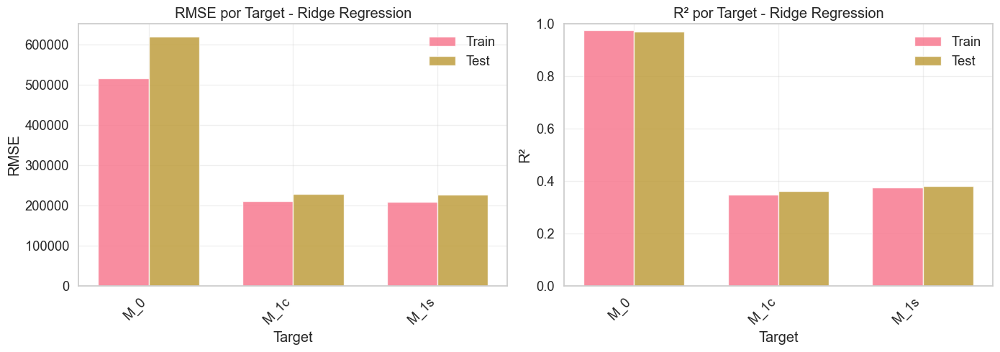

   ✅ Gráfica guardada: metrics_comparison.png

[2/3] Creando gráficas de predicciones vs reales...


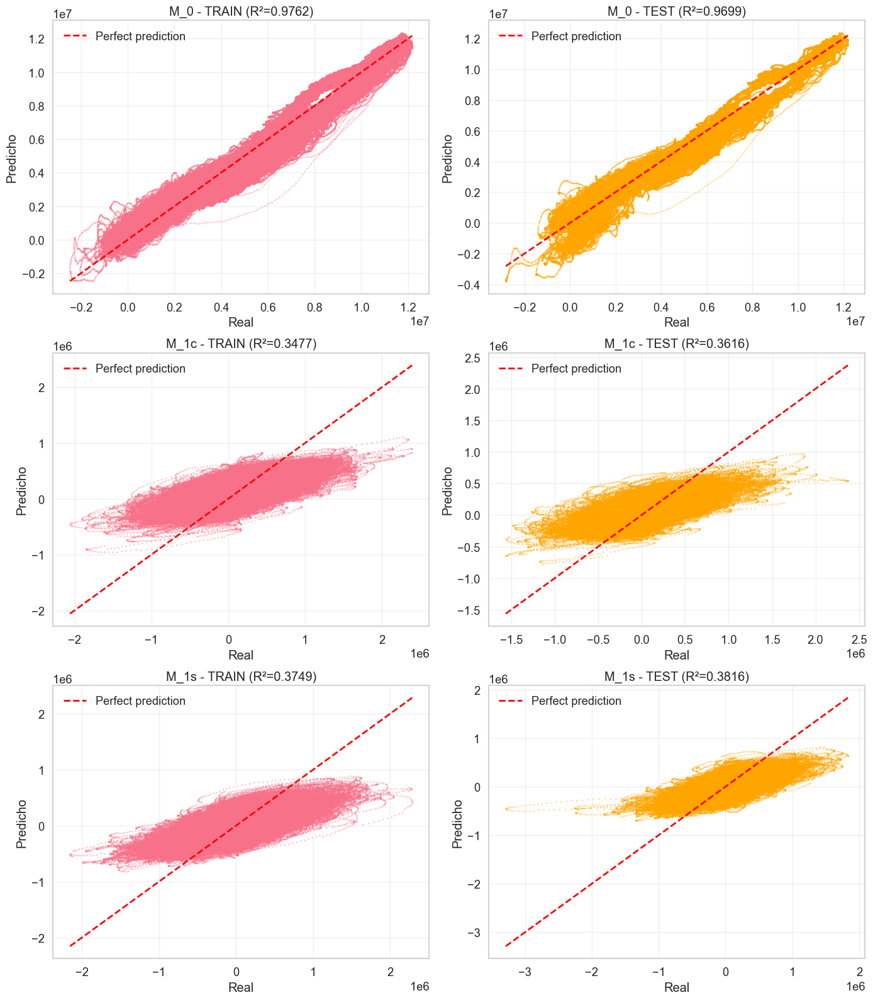

   ✅ Gráfica guardada: predictions_vs_real.png

[3/3] Creando gráfica de residuos...


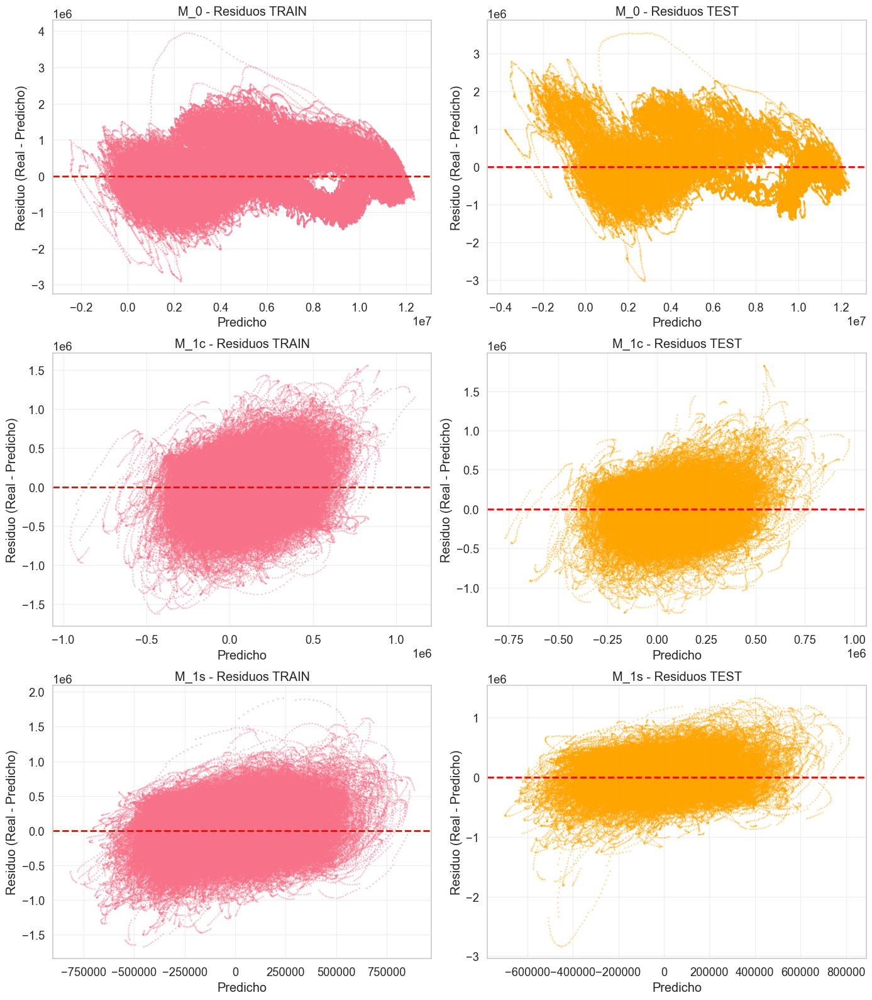

   ✅ Gráfica guardada: residuals_analysis.png

[4/5] Creando gráficas de time series (Real vs Predicho)...
   • Series seleccionadas: [ 9 11  0]


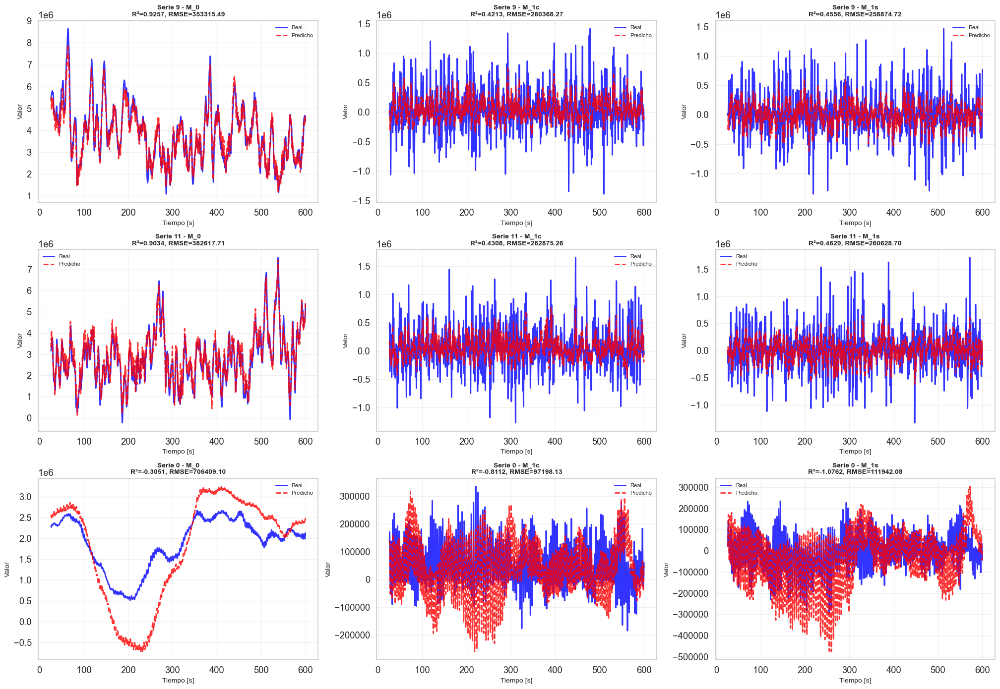

   ✅ Gráfica guardada: timeseries_comparison.png

[5/5] Creando gráficas de time series con zoom (50s)...


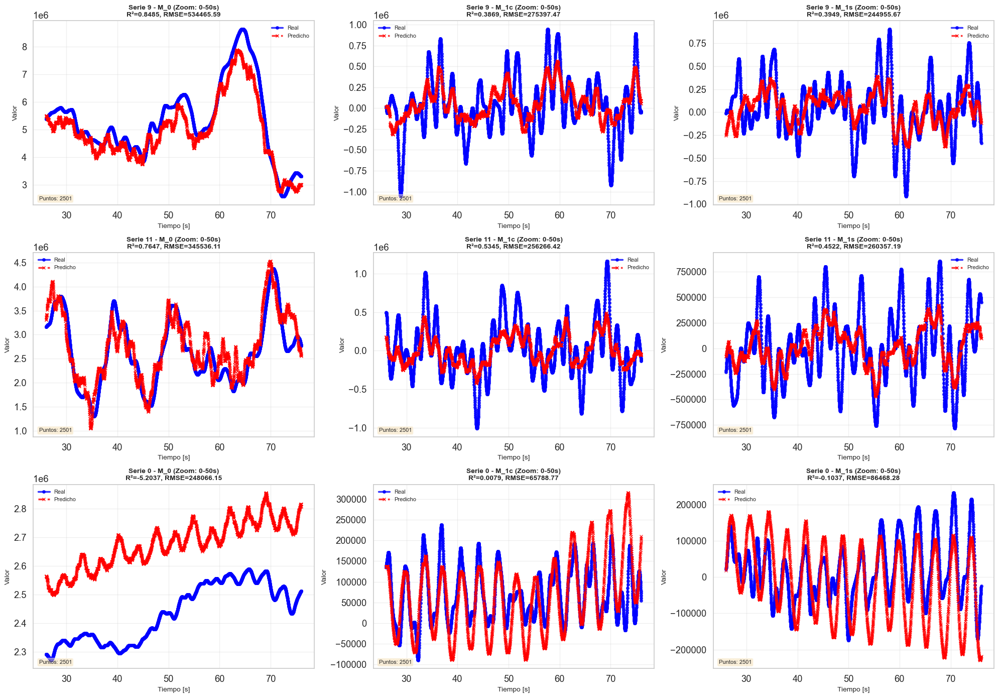

   ✅ Gráfica guardada: timeseries_comparison_zoom50s.png

PASO 7: GUARDAR RESULTADOS

   ✅ Métricas guardadas: metrics_results.csv
   ✅ Resumen guardado: training_summary.csv

✅ ENTRENAMIENTO COMPLETADO - RIDGE REGRESSION

📊 RESULTADOS FINALES:
   • Tiempo de entrenamiento: 87.69 segundos
   • RMSE promedio (Train): 311941.51
   • RMSE promedio (Test):  358187.59
   • R² promedio (Train):   0.5663
   • R² promedio (Test):    0.5710

📁 ARCHIVOS GENERADOS:
   • ridge_model.pkl
   • metrics_results.csv
   • training_summary.csv
   • metrics_comparison.png
   • predictions_vs_real.png
   • residuals_analysis.png
   • timeseries_comparison.png
   • timeseries_comparison_zoom50s.png

💡 El modelo Ridge sirve como baseline para comparar con modelos más complejos.


In [255]:
# =============================================================================
# PASO 7.1: BASELINE - RIDGE REGRESSION
# =============================================================================

print("\n" + "="*80)
print("🎯 MODELO BASELINE: RIDGE REGRESSION")
print("="*80)

import time

# Crear carpeta para guardar resultados
training_folder = Path('03_ML_traditional_models') / 'Linear_Ridge'
os.makedirs(training_folder, exist_ok=True)

print(f"\n📁 Carpeta de entrenamiento: {training_folder}")

# ------------------------------------------------------------------------
# 1) Normalizar datos de TEST usando los scalers guardados
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: NORMALIZAR DATOS DE TEST")
print("="*80)

print(f"\n[1/2] Normalizando X_test usando scaler guardado...")

# Cargar el scaler de X desde la carpeta 01_Models_scaler
# ✅ (scalers independientes)
scalers_X_path = root_dir / 'notebook' / '01_Models_scaler' / 'scalers_X.pkl'
scalers_X = joblib.load(scalers_X_path)

# Transformar X_test (cada columna con su scaler)
X_test_norm = pd.DataFrame(index=X_test.index)
for col in X_test.columns:
    if col not in scalers_X:
        raise KeyError(f"No se encuentra scaler para columna: {col}")
    X_test_norm[col] = scalers_X[col].transform(X_test[[col]]).ravel()

print(f"   ✅ X_test normalizado: {X_test_norm.shape}")
print(f"   📂 Scalers cargados de: {scalers_X_path}")
print(f"   💡 {len(scalers_X)} scalers independientes usados")

print(f"   ✅ X_test normalizado: {X_test_norm.shape}")
print(f"   📂 Scaler cargado de: {scaler_X_path}")

print(f"\n[2/2] Normalizando y_test usando scalers independientes...")

# Cargar los scalers de y desde la carpeta 01_Models_scaler
scalers_y_path = root_dir / 'notebook' / '01_Models_scaler' / 'scalers_y.pkl'
scalers_y = joblib.load(scalers_y_path)

# Transformar y_test (cada columna con su scaler)
y_test_norm = pd.DataFrame(index=y_test.index)
for col in y_test.columns:
    y_test_norm[col] = scalers_y[col].transform(y_test[[col]]).ravel()

print(f"   ✅ y_test normalizado: {y_test_norm.shape}")
print(f"   📂 Scalers cargados de: {scalers_y_path}")
print(f"   💡 {len(scalers_y)} scalers independientes: {list(scalers_y.keys())}")

# ------------------------------------------------------------------------
# 2) Verificar datos de entrenamiento normalizados
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("VERIFICACIÓN: DATOS DE ENTRENAMIENTO NORMALIZADOS")
print("="*80)

print(f"\n   ✅ X_train_norm disponible: {X_train_norm.shape}")
print(f"   ✅ y_train_norm disponible: {y_train_norm.shape}")
print(f"\n   💡 Usando datos ya normalizados en pasos anteriores")
print(f"   💡 y_train_norm usa {len(scalers_y)} scalers independientes por target")

# ------------------------------------------------------------------------
# 3) Configurar y entrenar modelo Ridge
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: ENTRENAMIENTO DEL MODELO")
print("="*80)

print(f"\n[1/3] Configurando Ridge Regression...")

# Configurar Ridge con MultiOutputRegressor para predecir los 3 targets
ridge_model = MultiOutputRegressor(
    Ridge(
        alpha=1.0,          # Parámetro de regularización
        fit_intercept=True,
        solver='auto', #saga
        max_iter=1000,      # Iteraciones máximas
        tol=1e-3,           # Tolerancia de convergencia
        random_state=42
    )
)


print(f"   ✅ Modelo configurado:")
print(f"      • Tipo: Ridge Regression")
print(f"      • Alpha (regularización): 1.0")
print(f"      • Outputs: {len(y_train_norm.columns)} targets (M_0, M_1c, M_1s)")

print(f"\n[2/3] Entrenando modelo con datos normalizados...")
print(f"   • Datos de entrenamiento: {X_train_norm.shape}")
print(f"   • Targets de entrenamiento: {y_train_norm.shape}")

start_time = time.time()

# Entrenar el modelo con datos normalizados
ridge_model.fit(X_train_norm, y_train_norm)

training_time = time.time() - start_time

print(f"   ✅ Modelo entrenado en {training_time:.2f} segundos")

print(f"\n[3/3] Guardando modelo...")

# Guardar el modelo entrenado
model_path = training_folder / 'ridge_model.pkl'
joblib.dump(ridge_model, model_path)

print(f"   ✅ Modelo guardado: {model_path.name}")

# ------------------------------------------------------------------------
# 4) Realizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: PREDICCIONES")
print("="*80)

print(f"\n[1/2] Prediciendo sobre conjunto de entrenamiento...")

y_train_pred_norm = ridge_model.predict(X_train_norm)
y_train_pred_norm = pd.DataFrame(
    y_train_pred_norm,
    index=y_train_norm.index,
    columns=y_train_norm.columns
)

print(f"   ✅ Predicciones train: {y_train_pred_norm.shape}")

print(f"\n[2/2] Prediciendo sobre conjunto de test...")

y_test_pred_norm = ridge_model.predict(X_test_norm)
y_test_pred_norm = pd.DataFrame(
    y_test_pred_norm,
    index=y_test_norm.index,
    columns=y_test_norm.columns
)

print(f"   ✅ Predicciones test: {y_test_pred_norm.shape}")

# ------------------------------------------------------------------------
# 5) Desnormalizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 4: DESNORMALIZACIÓN DE PREDICCIONES")
print("="*80)

print(f"\n[1/2] Desnormalizando predicciones de train con scalers independientes...")

# Usar los scalers independientes para desnormalizar
y_train_pred = pd.DataFrame(index=y_train_pred_norm.index)
for col in y_train_pred_norm.columns:
    y_train_pred[col] = scalers_y[col].inverse_transform(y_train_pred_norm[[col]]).ravel()

print(f"   ✅ Predicciones train desnormalizadas")

print(f"\n[2/2] Desnormalizando predicciones de test con scalers independientes...")

# Usar los scalers independientes para desnormalizar
y_test_pred = pd.DataFrame(index=y_test_pred_norm.index)
for col in y_test_pred_norm.columns:
    y_test_pred[col] = scalers_y[col].inverse_transform(y_test_pred_norm[[col]]).ravel()

print(f"   ✅ Predicciones test desnormalizadas")

# ------------------------------------------------------------------------
# 6) Calcular métricas
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 5: CÁLCULO DE MÉTRICAS")
print("="*80)

# Diccionarios para almacenar métricas
metrics_train = {}
metrics_test = {}

print(f"\n{'MÉTRICA':20} {'CONJUNTO':10} {'M_0':>15} {'M_1c':>15} {'M_1s':>15}")
print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")

# Calcular métricas para cada target
for i, col in enumerate(y_train.columns):
    # TRAIN
    rmse_train = np.sqrt(mean_squared_error(y_train[col], y_train_pred[col]))
    r2_train = r2_score(y_train[col], y_train_pred[col])
    
    # TEST
    rmse_test = np.sqrt(mean_squared_error(y_test[col], y_test_pred[col]))
    r2_test = r2_score(y_test[col], y_test_pred[col])
    
    # Guardar métricas
    metrics_train[col] = {'RMSE': rmse_train, 'R2': r2_train}
    metrics_test[col] = {'RMSE': rmse_test, 'R2': r2_test}
    
    # Mostrar
    if i == 0:
        print(f"{'RMSE':20} {'TRAIN':10} {rmse_train:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {rmse_test:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {r2_train:>15.4f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {r2_test:>15.4f} {'-':>15} {'-':>15}")
    elif i == 1:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {rmse_train:>15.2f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {rmse_test:>15.2f} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {r2_train:>15.4f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {r2_test:>15.4f} {'-':>15}")
    else:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {'-':>15} {rmse_train:>15.2f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {rmse_test:>15.2f}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {'-':>15} {r2_train:>15.4f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {r2_test:>15.4f}")

# Calcular promedios
avg_rmse_train = np.mean([m['RMSE'] for m in metrics_train.values()])
avg_rmse_test = np.mean([m['RMSE'] for m in metrics_test.values()])
avg_r2_train = np.mean([m['R2'] for m in metrics_train.values()])
avg_r2_test = np.mean([m['R2'] for m in metrics_test.values()])

print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")
print(f"{'PROMEDIO RMSE':20} {'TRAIN':10} {avg_rmse_train:>15.2f}")
print(f"{'':20} {'TEST':10} {avg_rmse_test:>15.2f}")
print(f"{'PROMEDIO R²':20} {'TRAIN':10} {avg_r2_train:>15.4f}")
print(f"{'':20} {'TEST':10} {avg_r2_test:>15.4f}")

# ------------------------------------------------------------------------
# 7) Visualizaciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 6: GENERACIÓN DE GRÁFICAS")
print("="*80)

# 7.1) Gráfica de métricas por target
print(f"\n[1/5] Creando gráfica de métricas...")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# RMSE
targets = list(metrics_train.keys())
rmse_train_vals = [metrics_train[t]['RMSE'] for t in targets]
rmse_test_vals = [metrics_test[t]['RMSE'] for t in targets]

x = np.arange(len(targets))
width = 0.35

axes[0].bar(x - width/2, rmse_train_vals, width, label='Train', alpha=0.8)
axes[0].bar(x + width/2, rmse_test_vals, width, label='Test', alpha=0.8)
axes[0].set_xlabel('Target')
axes[0].set_ylabel('RMSE')
axes[0].set_title('RMSE por Target - Ridge Regression')
axes[0].set_xticks(x)
axes[0].set_xticklabels(targets, rotation=45, ha='right')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# R²
r2_train_vals = [metrics_train[t]['R2'] for t in targets]
r2_test_vals = [metrics_test[t]['R2'] for t in targets]

axes[1].bar(x - width/2, r2_train_vals, width, label='Train', alpha=0.8)
axes[1].bar(x + width/2, r2_test_vals, width, label='Test', alpha=0.8)
axes[1].set_xlabel('Target')
axes[1].set_ylabel('R²')
axes[1].set_title('R² por Target - Ridge Regression')
axes[1].set_xticks(x)
axes[1].set_xticklabels(targets, rotation=45, ha='right')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
metrics_plot_path = training_folder / 'metrics_comparison.png'
plt.savefig(metrics_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {metrics_plot_path.name}")


# 7.2) Gráficas de predicciones vs reales
print(f"\n[2/3] Creando gráficas de predicciones vs reales...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # TRAIN
    axes[row, 0].scatter(y_train[col], y_train_pred[col], alpha=0.3, s=1)
    axes[row, 0].plot([y_train[col].min(), y_train[col].max()], 
                       [y_train[col].min(), y_train[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 0].set_xlabel('Real')
    axes[row, 0].set_ylabel('Predicho')
    axes[row, 0].set_title(f'{col} - TRAIN (R²={metrics_train[col]["R2"]:.4f})')
    axes[row, 0].legend()
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test[col], y_test_pred[col], alpha=0.3, s=1, color='orange')
    axes[row, 1].plot([y_test[col].min(), y_test[col].max()], 
                       [y_test[col].min(), y_test[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 1].set_xlabel('Real')
    axes[row, 1].set_ylabel('Predicho')
    axes[row, 1].set_title(f'{col} - TEST (R²={metrics_test[col]["R2"]:.4f})')
    axes[row, 1].legend()
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
predictions_plot_path = training_folder / 'predictions_vs_real.png'
plt.savefig(predictions_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {predictions_plot_path.name}")

# 7.3) Gráfica de residuos
print(f"\n[3/3] Creando gráfica de residuos...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # Calcular residuos
    residuals_train = y_train[col] - y_train_pred[col]
    residuals_test = y_test[col] - y_test_pred[col]
    
    # TRAIN
    axes[row, 0].scatter(y_train_pred[col], residuals_train, alpha=0.3, s=1)
    axes[row, 0].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 0].set_xlabel('Predicho')
    axes[row, 0].set_ylabel('Residuo (Real - Predicho)')
    axes[row, 0].set_title(f'{col} - Residuos TRAIN')
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test_pred[col], residuals_test, alpha=0.3, s=1, color='orange')
    axes[row, 1].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 1].set_xlabel('Predicho')
    axes[row, 1].set_ylabel('Residuo (Real - Predicho)')
    axes[row, 1].set_title(f'{col} - Residuos TEST')
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
residuals_plot_path = training_folder / 'residuals_analysis.png'
plt.savefig(residuals_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {residuals_plot_path.name}")

# 7.4) Gráfica de time series: Real vs Predicho (3 series aleatorias de test)
print(f"\n[4/5] Creando gráficas de time series (Real vs Predicho)...")

# Obtener series únicas del conjunto de test
unique_test_series = series_id_test.unique()

# Seleccionar 3 series aleatorias
np.random.seed(42)
selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

print(f"   • Series seleccionadas: {selected_series}")

# Crear figura con 3 filas x 3 columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, 3, figsize=(20, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales y predichos
        y_real = y_test.loc[series_indices, col]
        y_pred = y_test_pred.loc[series_indices, col]
        
        # Calcular métricas para esta serie y target
        r2_series = r2_score(y_real, y_pred)
        rmse_series = np.sqrt(mean_squared_error(y_real, y_pred))
        
        # Graficar
        ax.plot(time_series, y_real, label='Real', 
                linewidth=2, alpha=0.8, color='blue')
        ax.plot(time_series, y_pred, label='Predicho', 
                linestyle='--', linewidth=2, alpha=0.8, color='red')
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Valor', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                     fontsize=10, fontweight='bold')
        ax.legend(loc='best', fontsize=8)
        ax.grid(True, alpha=0.3)

plt.tight_layout()
timeseries_plot_path = training_folder / 'timeseries_comparison.png'
plt.savefig(timeseries_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_plot_path.name}")

# 7.5) Gráfica de time series con ZOOM (50 segundos)
print(f"\n[5/5] Creando gráficas de time series con zoom (50s)...")

# Crear figura con 3 filas x 3 columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, 3, figsize=(20, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Definir ventana de 50 segundos desde el inicio
    time_min = time_series.min()
    time_max_zoom = time_min + 50
    
    # Filtrar por ventana de tiempo
    zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
    zoom_indices = time_series[zoom_mask].index
    time_zoom = time_series[zoom_mask]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales y predichos (con zoom)
        y_real_zoom = y_test.loc[zoom_indices, col]
        y_pred_zoom = y_test_pred.loc[zoom_indices, col]
        
        # Calcular métricas para esta ventana
        r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
        rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
        
        # Graficar
        ax.plot(time_zoom, y_real_zoom, label='Real', 
                linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
        ax.plot(time_zoom, y_pred_zoom, label='Predicho', 
                linestyle='--', linewidth=2.5, alpha=0.8, color='red', marker='x', markersize=5)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Valor', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\nR²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                     fontsize=10, fontweight='bold')
        ax.legend(loc='best', fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Añadir texto con información de puntos
        n_points = len(zoom_indices)
        ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=8,
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
timeseries_zoom_plot_path = training_folder / 'timeseries_comparison_zoom50s.png'
plt.savefig(timeseries_zoom_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_zoom_plot_path.name}")

# ------------------------------------------------------------------------
# 8) Guardar métricas en archivo
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 7: GUARDAR RESULTADOS")
print("="*80)

# Crear DataFrame con métricas
metrics_df = pd.DataFrame({
    'Blade': list(metrics_train.keys()) + ['PROMEDIO'],
    'RMSE_Train': list([m['RMSE'] for m in metrics_train.values()]) + [avg_rmse_train],
    'RMSE_Test': list([m['RMSE'] for m in metrics_test.values()]) + [avg_rmse_test],
    'R2_Train': list([m['R2'] for m in metrics_train.values()]) + [avg_r2_train],
    'R2_Test': list([m['R2'] for m in metrics_test.values()]) + [avg_r2_test]
})

metrics_csv_path = training_folder / 'metrics_results.csv'
metrics_df.to_csv(metrics_csv_path, index=False)

print(f"\n   ✅ Métricas guardadas: {metrics_csv_path.name}")

# Crear resumen de entrenamiento
summary = {
    'Model': 'Ridge Regression',
    'Training_Time_seconds': training_time,
    'Train_Samples': len(X_train),
    'Test_Samples': len(X_test),
    'Features': X_train.shape[1],
    'Targets': y_train.shape[1],
    'Avg_RMSE_Train': avg_rmse_train,
    'Avg_RMSE_Test': avg_rmse_test,
    'Avg_R2_Train': avg_r2_train,
    'Avg_R2_Test': avg_r2_test,
    'Alpha': 1.0
}

summary_df = pd.DataFrame([summary])
summary_path = training_folder / 'training_summary.csv'
summary_df.to_csv(summary_path, index=False)

print(f"   ✅ Resumen guardado: {summary_path.name}")

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ ENTRENAMIENTO COMPLETADO - RIDGE REGRESSION")
print("="*80)

print(f"\n📊 RESULTADOS FINALES:")
print(f"   • Tiempo de entrenamiento: {training_time:.2f} segundos")
print(f"   • RMSE promedio (Train): {avg_rmse_train:.2f}")
print(f"   • RMSE promedio (Test):  {avg_rmse_test:.2f}")
print(f"   • R² promedio (Train):   {avg_r2_train:.4f}")
print(f"   • R² promedio (Test):    {avg_r2_test:.4f}")

print(f"\n📁 ARCHIVOS GENERADOS:")
print(f"   • {model_path.name}")
print(f"   • {metrics_csv_path.name}")
print(f"   • {summary_path.name}")
print(f"   • {metrics_plot_path.name}")
print(f"   • {predictions_plot_path.name}")
print(f"   • {residuals_plot_path.name}")
print(f"   • {timeseries_plot_path.name}")
print(f"   • {timeseries_zoom_plot_path.name}")

print(f"\n💡 El modelo Ridge sirve como baseline para comparar con modelos más complejos.")
print("="*80)

In [ ]:
# Añade esto después de cargar los datos normalizados
print("\n🔍 ANÁLISIS DE CORRELACIONES")
print("="*70)

# Correlación entre features y targets
correlations = pd.concat([X_train, y_train], axis=1).corr()

print("\nTop 10 features correlacionadas con cada target:")
for target in y_train.columns:
    print(f"\n{target}:")
    top_corr = correlations[target].drop(y_train.columns).abs().sort_values(ascending=False).head(10)
    print(top_corr)

In [61]:
# Después de la normalización
print("\n📊 VARIABILIDAD DE LOS TARGETS")
print("="*70)

for col in y_train.columns:
    std_original = y_train[col].std()
    mean_original = y_train[col].mean()
    cv = std_original / abs(mean_original) if mean_original != 0 else 0
    
    print(f"\n{col}:")
    print(f"   Mean: {mean_original:.2e}")
    print(f"   Std:  {std_original:.2e}")
    print(f"   CV:   {cv:.4f} (coef. variación)")


📊 VARIABILIDAD DE LOS TARGETS

M_0:
   Mean: 5.36e+06
   Std:  3.41e+06
   CV:   0.6365 (coef. variación)

M_1c:
   Mean: 5.45e+04
   Std:  4.66e+05
   CV:   8.5621 (coef. variación)

M_1s:
   Mean: -2.92e+04
   Std:  4.39e+05
   CV:   15.0015 (coef. variación)


---

## 7.2 Random Forest Regressor

**Random Forest** es un algoritmo de ensamble basado en árboles de decisión que:
- Construye múltiples árboles de decisión usando bootstrapping
- Reduce el overfitting mediante la agregación de predicciones
- Es naturalmente no lineal y captura relaciones complejas
- Maneja bien interacciones entre features
- No requiere normalización de datos (aunque usaremos datos normalizados para comparación justa)

**Ventajas:**
- Robusto frente a outliers
- Captura relaciones no lineales
- Proporciona importancia de features

**Desventajas:**
- Más lento en entrenamiento e inferencia que modelos lineales
- Requiere más memoria
- Menos interpretable que modelos lineales

In [ ]:
# =============================================================================
# MODELO 2: RANDOM FOREST - ENTRENAMIENTO (OPTIMIZADO MEMORIA)
# =============================================================================

print("\n" + "="*80)
print("🎯 MODELO: RANDOM FOREST - ENTRENAMIENTO")
print("="*80)

import time

# Crear carpeta para guardar resultados
training_folder = Path('03_ML_traditional_models') / 'Random_Forest'
os.makedirs(training_folder, exist_ok=True)

print(f"\n📁 Carpeta de entrenamiento: {training_folder}")

# ------------------------------------------------------------------------
# 1) Cargar datos ya procesados desde 02_Data_ML_traditional
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: CARGAR DATOS YA PROCESADOS")
print("="*80)

data_ml_folder = root_dir / "notebook" / '02_Data_ML_traditional'

print(f"\n📂 Carpeta de datos: {data_ml_folder}")

print(f"\n[1/2] Cargando datos de entrenamiento normalizados...")
X_train_norm = joblib.load(data_ml_folder / 'X_train_norm.pkl')
y_train_norm = joblib.load(data_ml_folder / 'y_train_norm.pkl')

# ✅ OPTIMIZACIÓN 1: Convertir a float32 (ahorra 50% de memoria)
X_train_norm = X_train_norm.astype('float32')
y_train_norm = y_train_norm.astype('float32')

print(f"   ✅ X_train_norm: {X_train_norm.shape}")
print(f"   ✅ y_train_norm: {y_train_norm.shape}")
print(f"   💾 Memoria X_train_norm: {X_train_norm.memory_usage(deep=True).sum() / (1024**2):.1f} MB")
print(f"   💡 Targets: {list(y_train_norm.columns)}")
print(f"   💡 Normalizado con scalers independientes por target")

print(f"\n[2/2] Cargando datos originales de train (para métricas)...")
X_train = joblib.load(data_ml_folder / 'X_train.pkl')
y_train = joblib.load(data_ml_folder / 'y_train.pkl')
print(f"   ✅ X_train: {X_train.shape}")
print(f"   ✅ y_train: {y_train.shape}")

# ------------------------------------------------------------------------
# 2) Configurar y entrenar modelo Random Forest (OPTIMIZADO)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: CONFIGURAR Y ENTRENAR MODELO")
print("="*80)

print(f"\n[1/3] Configurando Random Forest (optimizado para memoria)...")

# ✅ OPTIMIZACIÓN 2: Configuración optimizada de Random Forest
# rf_model = MultiOutputRegressor(
#     RandomForestRegressor(
#         n_estimators=50,        # ✅ Reducido de 100 a 50 (menos memoria)
#         max_depth=15,           # ✅ Reducido de 20 a 15 (árboles más pequeños)
#         min_samples_split=10,   # ✅ Aumentado de 5 a 10 (menos divisiones)
#         min_samples_leaf=5,     # ✅ Aumentado de 2 a 5 (hojas más grandes)
#         max_features='sqrt',    # ✅ Solo sqrt(n_features) por split (menos memoria)
#         max_samples=0.8,        # ✅ Bootstrap con 80% de datos (menos memoria)
#         random_state=42,
#         n_jobs=-1,              # Usar todos los cores
#         verbose=1               # ✅ Mostrar progreso
#     )
# )

rf_model = MultiOutputRegressor(
    RandomForestRegressor(
        n_estimators=800,       # ⬆️ Sube a 100 si puedes (reduce la varianza al promediar más)
        max_depth=18,           # ⬇️ Bájalo un poco más. 10-12 suele bastar para física.
        min_samples_split=40,  # ⬆️ ¡Drástico! No intentes dividir si hay pocos datos.
        min_samples_leaf=20,   # ⬆️ ¡CRÍTICO! Una hoja debe tener ~100 muestras (10 segundos de datos)
        max_features='sqrt',    # ✅ Mantenlo, es excelente.
        max_samples=0.7,        # ⬇️ Bajar a 0.5 hace cada árbol más independiente y reduce overfitting.
        random_state=42,
        n_jobs=-1,
        verbose=1
    )
)



print(f"   ✅ Modelo configurado (OPTIMIZADO PARA MEMORIA):")
print(f"      • Tipo: Random Forest")
print(f"      • N estimators: 50 (reducido para memoria)")
print(f"      • Max depth: 15 (árboles menos profundos)")
print(f"      • Min samples split: 10")
print(f"      • Min samples leaf: 5")
print(f"      • Max features: sqrt({X_train_norm.shape[1]}) ≈ {int(np.sqrt(X_train_norm.shape[1]))}")
print(f"      • Max samples: 80% (bootstrap)")
print(f"      • Outputs: {len(y_train_norm.columns)} targets (M_0, M_1c, M_1s)")

# ✅ OPTIMIZACIÓN 3 (OPCIONAL): Submuestreo si aún hay problemas de memoria
USE_SUBSAMPLING = False  # Cambiar a True si sigue habiendo problemas

if USE_SUBSAMPLING:
    print(f"\n⚠️  SUBMUESTREO ACTIVADO (para reducir memoria)")
    
    # Submuestreo estratificado por series
    unique_series = series_id_train.unique()
    n_series_to_use = int(len(unique_series) * 0.5)  # 50% de series
    
    np.random.seed(42)
    selected_series = np.random.choice(unique_series, size=n_series_to_use, replace=False)
    
    mask = series_id_train.isin(selected_series)
    X_train_norm_sampled = X_train_norm[mask]
    y_train_norm_sampled = y_train_norm[mask]
    
    print(f"   Series: {len(unique_series)} → {n_series_to_use}")
    print(f"   Muestras: {len(X_train_norm):,} → {len(X_train_norm_sampled):,}")
    
    # Usar datos submuestreados
    X_train_norm_fit = X_train_norm_sampled
    y_train_norm_fit = y_train_norm_sampled
else:
    X_train_norm_fit = X_train_norm
    y_train_norm_fit = y_train_norm

print(f"\n[2/3] Entrenando modelo con datos normalizados...")
print(f"   • Datos de entrenamiento: {X_train_norm_fit.shape}")
print(f"   • Targets de entrenamiento: {y_train_norm_fit.shape}")
print(f"   • Memoria estimada: {X_train_norm_fit.memory_usage(deep=True).sum() / (1024**2):.1f} MB")
print(f"   ⏱️  Esto puede tomar varios minutos...")

start_time = time.time()

# Entrenar el modelo con datos normalizados
rf_model.fit(X_train_norm_fit, y_train_norm_fit)

training_time = time.time() - start_time

print(f"   ✅ Modelo entrenado en {training_time:.2f} segundos ({training_time/60:.2f} minutos)")

print(f"\n[3/3] Guardando modelo...")

# Guardar el modelo entrenado
model_path = training_folder / 'random_forest_model.pkl'
joblib.dump(rf_model, model_path)

print(f"   ✅ Modelo guardado: {model_path.name}")
print(f"      Ubicación: {model_path}")
print(f"      Tamaño: {model_path.stat().st_size / (1024**2):.2f} MB")

# ------------------------------------------------------------------------
# RESUMEN DE ENTRENAMIENTO
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ ENTRENAMIENTO COMPLETADO")
print("="*80)

print(f"\n📊 RESUMEN:")
print(f"   • Tiempo de entrenamiento: {training_time:.2f} segundos ({training_time/60:.2f} min)")
print(f"   • Muestras entrenamiento: {len(X_train_norm_fit):,}")
print(f"   • Features: {X_train_norm_fit.shape[1]}")
print(f"   • Targets: {y_train_norm_fit.shape[1]} (M_0, M_1c, M_1s)")
print(f"   • Normalización: Scalers independientes por target")
print(f"   • Tipo de datos: float32 (optimizado para memoria)")

print(f"\n📁 ARCHIVOS GENERADOS:")
print(f"   • {model_path.name} ({model_path.stat().st_size / (1024**2):.2f} MB)")

print(f"\n💡 Ejecuta la siguiente celda para validar el modelo y generar gráficas.")
print("="*80)


🎯 MODELO: RANDOM FOREST - ENTRENAMIENTO

📁 Carpeta de entrenamiento: 03_ML_traditional_models\Random_Forest

PASO 1: CARGAR DATOS YA PROCESADOS

📂 Carpeta de datos: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional

[1/2] Cargando datos de entrenamiento normalizados...
   ✅ X_train_norm: (1635957, 151)
   ✅ y_train_norm: (1635957, 3)
   💾 Memoria X_train_norm: 954.8 MB
   💡 Targets: ['M_0', 'M_1c', 'M_1s']
   💡 Normalizado con scalers independientes por target

[2/2] Cargando datos originales de train (para métricas)...
   ✅ X_train: (1635957, 151)
   ✅ y_train: (1635957, 3)

PASO 2: CONFIGURAR Y ENTRENAR MODELO

[1/3] Configurando Random Forest (optimizado para memoria)...
   ✅ Modelo configurado (OPTIMIZADO PARA MEMORIA):
      • Tipo: Random Forest
      • N estimators: 50 (reducido para memoria)
      • Max depth: 15 (árboles menos profundos)
      • Min samples split: 10
      • Min samples leaf: 5
      • Max features: sqr

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 34.0min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 72.6min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 125.1min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 128.4min finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 49.0min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 115.5min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 210.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 216.5min finished
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elap

   ✅ Modelo entrenado en 33412.76 segundos (556.88 minutos)

[3/3] Guardando modelo...
   ✅ Modelo guardado: random_forest_model.pkl
      Ubicación: 03_ML_traditional_models\Random_Forest\random_forest_model.pkl
      Tamaño: 11997.81 MB

✅ ENTRENAMIENTO COMPLETADO

📊 RESUMEN:
   • Tiempo de entrenamiento: 33412.76 segundos (556.88 min)
   • Muestras entrenamiento: 1,635,957
   • Features: 151
   • Targets: 3 (M_0, M_1c, M_1s)
   • Normalización: Scalers independientes por target
   • Tipo de datos: float32 (optimizado para memoria)

📁 ARCHIVOS GENERADOS:
   • random_forest_model.pkl (11997.81 MB)

💡 Ejecuta la siguiente celda para validar el modelo y generar gráficas.



🎯 MODELO: RANDOM FOREST - VALIDACIÓN

PASO 1: CARGAR MODELO Y DATOS DE TEST

[1/5] Cargando modelo entrenado...
   ✅ Modelo cargado desde: random_forest_model.pkl

[2/5] Cargando datos de test originales...
   ✅ X_test: (430515, 151)
   ✅ y_test: (430515, 3)
   💡 Targets: ['M_0', 'M_1c', 'M_1s']

[3/5] Cargando datos de train originales (para métricas)...
   ✅ Datos de train cargados

[4/5] Cargando series_id y Time para gráficas...
   ✅ series_id_test: 430,515 valores
   ✅ Time_test: 430,515 valores
   ✅ X_test normalizado: (430515, 151)
   💡 Scalers independientes: ['M_0', 'M_1c', 'M_1s']

PASO 2: PREDICCIONES

[1/2] Prediciendo sobre conjunto de entrenamiento...


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    7.4s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:   11.4s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:   19.0s
[Parallel(n_jobs=12)]: Done 776 tasks      | elapsed:   29.9s
[Parallel(n_jobs=12)]: Done 800 out of 800 | elapsed:   30.6s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    2.7s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:   11.3s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:   23.9s
[Parallel(n_jobs=12)]: Done 776 tasks      | elapsed:   41.1s
[Parallel(n_jobs=12)]: Done 800 out of 800 | elapsed:   42.0s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    1.5s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed: 

   ✅ Predicciones train: (1635957, 3)

[2/2] Prediciendo sobre conjunto de test...


[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.2s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    1.6s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:    4.3s
[Parallel(n_jobs=12)]: Done 776 tasks      | elapsed:    8.0s
[Parallel(n_jobs=12)]: Done 800 out of 800 | elapsed:    8.2s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.4s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed:    2.5s
[Parallel(n_jobs=12)]: Done 426 tasks      | elapsed:    6.8s
[Parallel(n_jobs=12)]: Done 776 tasks      | elapsed:   12.4s
[Parallel(n_jobs=12)]: Done 800 out of 800 | elapsed:   12.7s finished
[Parallel(n_jobs=12)]: Using backend ThreadingBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done  26 tasks      | elapsed:    0.5s
[Parallel(n_jobs=12)]: Done 176 tasks      | elapsed: 

   ✅ Predicciones test: (430515, 3)

PASO 3: DESNORMALIZACIÓN DE PREDICCIONES

[1/2] Desnormalizando predicciones de train con scalers independientes...
   ✅ Predicciones train desnormalizadas

[2/2] Desnormalizando predicciones de test con scalers independientes...
   ✅ Predicciones test desnormalizadas

PASO 4: CÁLCULO DE MÉTRICAS

MÉTRICA              CONJUNTO               M_0            M_1c            M_1s
──────────────────── ────────── ─────────────── ─────────────── ───────────────
RMSE                 TRAIN             33959.83               -               -
                     TEST             353529.75               -               -
R²                   TRAIN               0.9999               -               -
                     TEST                0.9902               -               -
RMSE                 TRAIN                    -        44900.13               -
                     TEST                     -       196547.28               -
R²                   TRA

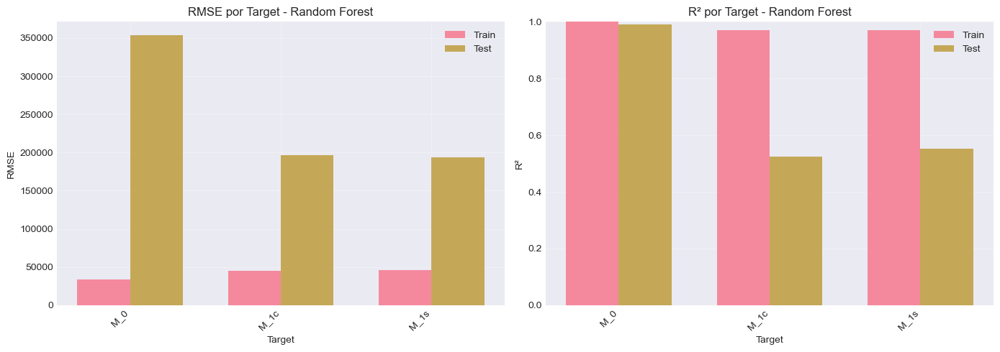

   ✅ Gráfica guardada: metrics_comparison.png

[2/5] Creando gráficas de predicciones vs reales...


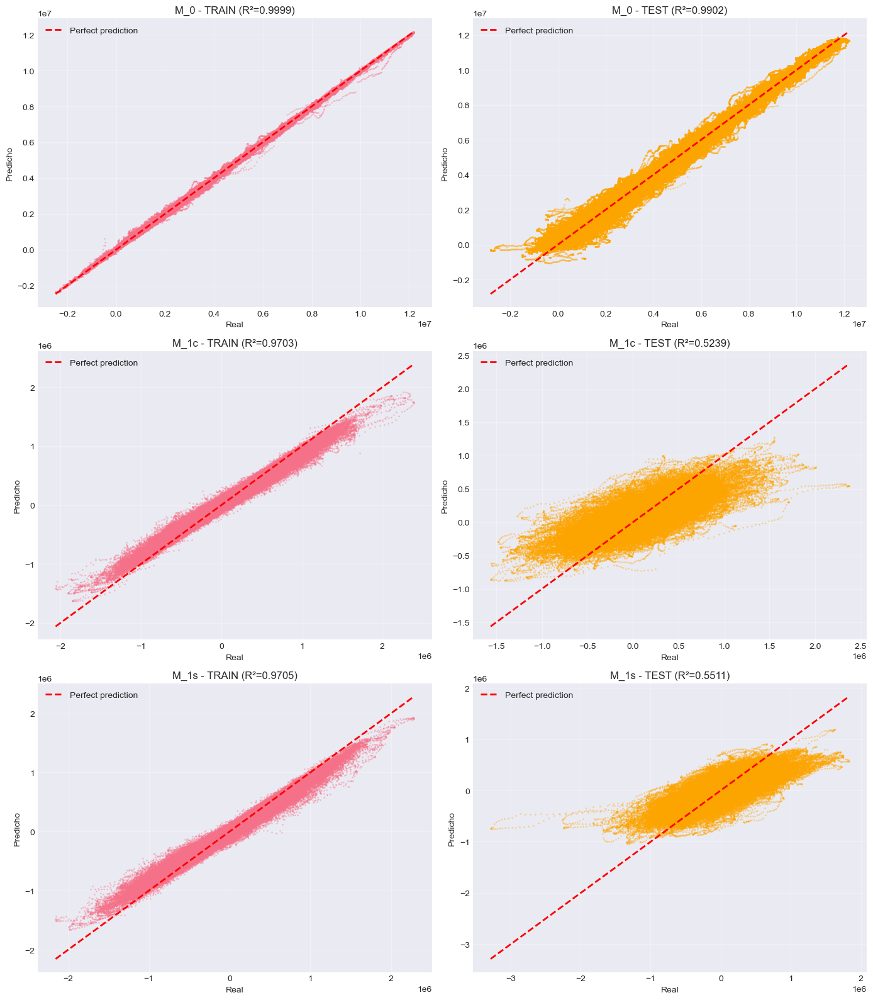

   ✅ Gráfica guardada: predictions_vs_real.png

[3/5] Creando gráfica de residuos...


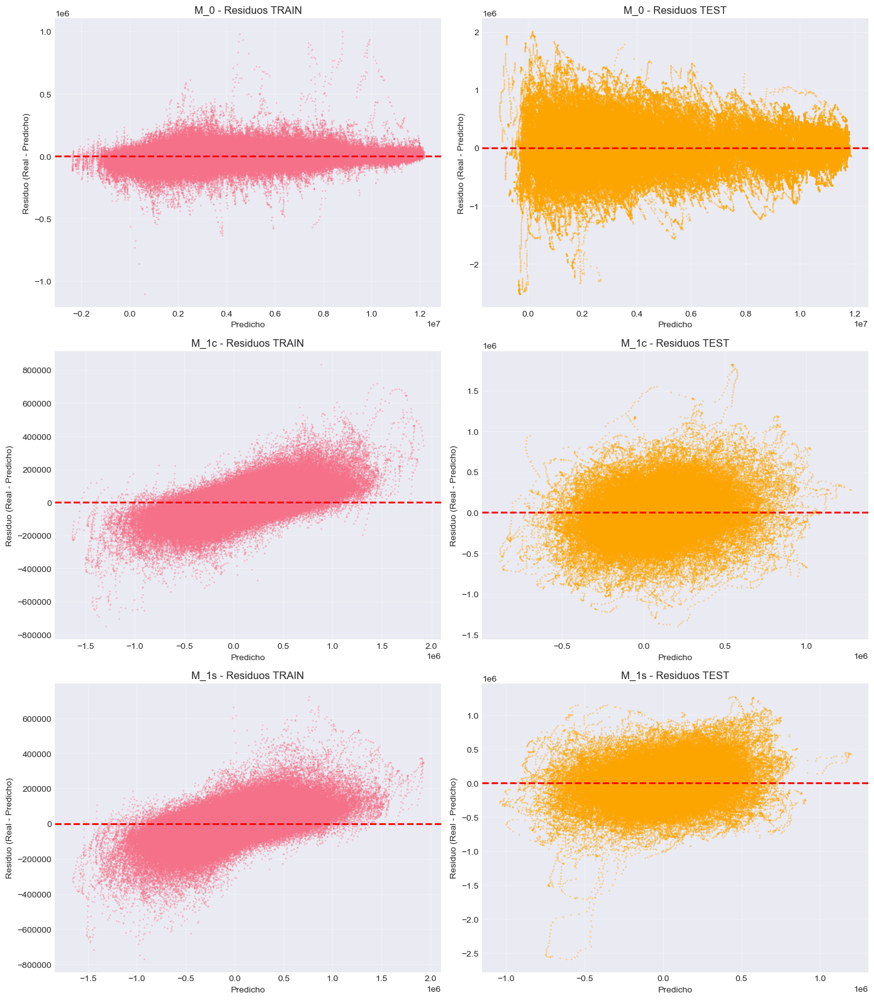

   ✅ Gráfica guardada: residuals_analysis.png

[4/5] Creando gráficas de time series (Real vs Predicho)...
   • Series seleccionadas: [49 59  4]


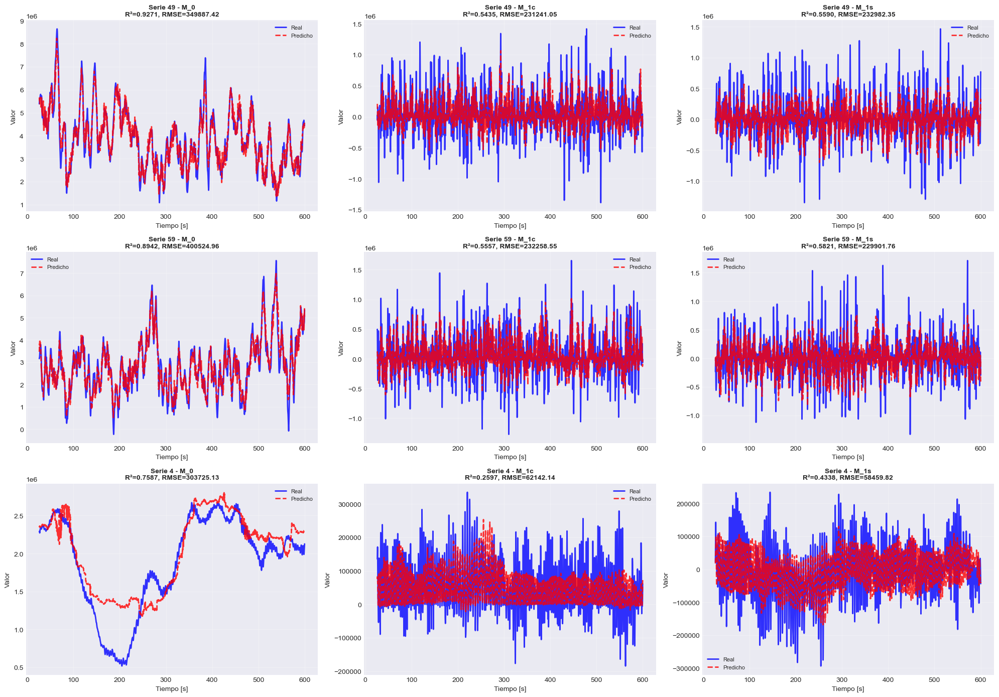

   ✅ Gráfica guardada: timeseries_comparison.png

[5/5] Creando gráficas de time series con zoom (50s)...


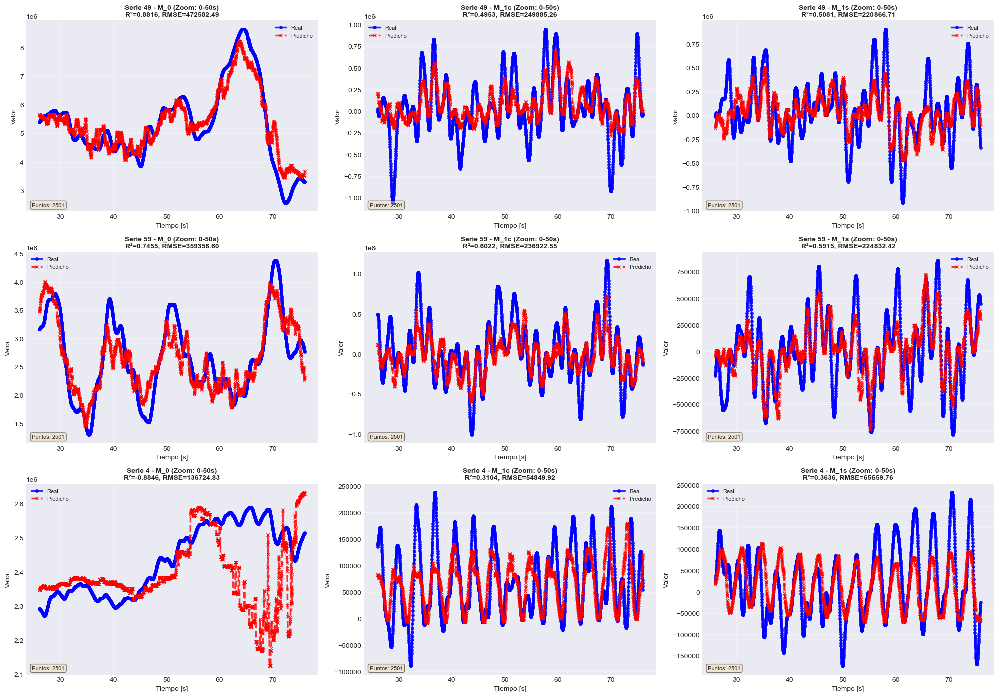

   ✅ Gráfica guardada: timeseries_comparison_zoom50s.png

PASO 6: GUARDAR RESULTADOS

   ✅ Métricas guardadas: metrics_results.csv
   ✅ Resumen guardado: validation_summary.csv

✅ VALIDACIÓN COMPLETADA - RANDOM FOREST

📊 RESULTADOS FINALES:
   • Targets: M_0, M_1c, M_1s
   • RMSE promedio (Train): 41442.32
   • RMSE promedio (Test):  247827.49
   • R² promedio (Train):   0.9802
   • R² promedio (Test):    0.6884

📁 ARCHIVOS GENERADOS:
   • metrics_results.csv
   • validation_summary.csv
   • metrics_comparison.png
   • predictions_vs_real.png
   • residuals_analysis.png
   • timeseries_comparison.png
   • timeseries_comparison_zoom50s.png

💡 Random Forest captura relaciones no lineales mejor que Ridge.

⚙️  Normalización: Scalers independientes por target para balancear escalas


In [6]:
# =============================================================================
# MODELO 2: RANDOM FOREST - VALIDACIÓN Y VISUALIZACIONES
# =============================================================================

print("\n" + "="*80)
print("🎯 MODELO: RANDOM FOREST - VALIDACIÓN")
print("="*80)

# ------------------------------------------------------------------------
# 1) Cargar modelo entrenado y datos de test
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: CARGAR MODELO Y DATOS DE TEST")
print("="*80)

training_folder = Path('03_ML_traditional_models') / 'Random_Forest'
data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'

print(f"\n[1/5] Cargando modelo entrenado...")
model_path = training_folder / 'random_forest_model.pkl'
rf_model = joblib.load(model_path)
print(f"   ✅ Modelo cargado desde: {model_path.name}")

print(f"\n[2/5] Cargando datos de test originales...")
X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")
print(f"   💡 Targets: {list(y_test.columns)}")

print(f"\n[3/5] Cargando datos de train originales (para métricas)...")
X_train = joblib.load(data_ml_folder / 'X_train.pkl')
y_train = joblib.load(data_ml_folder / 'y_train.pkl')
X_train_norm = joblib.load(data_ml_folder / 'X_train_norm.pkl')
print(f"   ✅ Datos de train cargados")

print(f"\n[4/5] Cargando series_id y Time para gráficas...")
# Intentar cargar series_id y Time (si no existen, las gráficas de time series se omitirán)
series_id_test_path = data_ml_folder / 'series_id_test.pkl'
Time_test_path = data_ml_folder / 'Time_test.pkl'

if series_id_test_path.exists() and Time_test_path.exists():
    series_id_test = joblib.load(series_id_test_path)
    Time_test = joblib.load(Time_test_path)
    print(f"   ✅ series_id_test: {len(series_id_test):,} valores")
    print(f"   ✅ Time_test: {len(Time_test):,} valores")
else:
    series_id_test = None
    Time_test = None
    print(f"   ⚠️  Archivos series_id_test.pkl o Time_test.pkl no encontrados")
    print(f"   💡 Las gráficas de time series se omitirán.")


# ✅ DESPUÉS (scalers independientes)
scalers_X = joblib.load(root_dir / 'notebook' / '01_Models_scaler' / 'scalers_X.pkl')
scalers_y = joblib.load(root_dir / 'notebook' / '01_Models_scaler' / 'scalers_y.pkl')  # ⬅️ AÑADIR ESTA LÍNEA

X_test_norm = pd.DataFrame(index=X_test.index)
for col in X_test.columns:
    if col not in scalers_X:
        raise KeyError(f"No se encuentra scaler para columna: {col}")
    X_test_norm[col] = scalers_X[col].transform(X_test[[col]]).ravel()
print(f"   ✅ X_test normalizado: {X_test_norm.shape}")
print(f"   💡 Scalers independientes: {list(scalers_y.keys())}")  # ⬅️ Ahora funcionará

# ------------------------------------------------------------------------
# 2) Realizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: PREDICCIONES")
print("="*80)

print(f"\n[1/2] Prediciendo sobre conjunto de entrenamiento...")

y_train_pred_norm = rf_model.predict(X_train_norm)
y_train_pred_norm = pd.DataFrame(
    y_train_pred_norm,
    index=X_train_norm.index,
    columns=y_train.columns
)

print(f"   ✅ Predicciones train: {y_train_pred_norm.shape}")

print(f"\n[2/2] Prediciendo sobre conjunto de test...")

y_test_pred_norm = rf_model.predict(X_test_norm)
y_test_pred_norm = pd.DataFrame(
    y_test_pred_norm,
    index=y_test.index,
    columns=y_test.columns
)

print(f"   ✅ Predicciones test: {y_test_pred_norm.shape}")

# ------------------------------------------------------------------------
# 3) Desnormalizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: DESNORMALIZACIÓN DE PREDICCIONES")
print("="*80)

print(f"\n[1/2] Desnormalizando predicciones de train con scalers independientes...")

# Usar los scalers independientes para desnormalizar
y_train_pred = pd.DataFrame(index=y_train_pred_norm.index)
for col in y_train_pred_norm.columns:
    y_train_pred[col] = scalers_y[col].inverse_transform(y_train_pred_norm[[col]]).ravel()

print(f"   ✅ Predicciones train desnormalizadas")

print(f"\n[2/2] Desnormalizando predicciones de test con scalers independientes...")

# Usar los scalers independientes para desnormalizar
y_test_pred = pd.DataFrame(index=y_test_pred_norm.index)
for col in y_test_pred_norm.columns:
    y_test_pred[col] = scalers_y[col].inverse_transform(y_test_pred_norm[[col]]).ravel()

print(f"   ✅ Predicciones test desnormalizadas")

# ------------------------------------------------------------------------
# 4) Calcular métricas
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 4: CÁLCULO DE MÉTRICAS")
print("="*80)

# Diccionarios para almacenar métricas
metrics_train = {}
metrics_test = {}

print(f"\n{'MÉTRICA':20} {'CONJUNTO':10} {'M_0':>15} {'M_1c':>15} {'M_1s':>15}")
print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")

# Calcular métricas para cada target
for i, col in enumerate(y_train.columns):
    # TRAIN
    rmse_train = np.sqrt(mean_squared_error(y_train[col], y_train_pred[col]))
    r2_train = r2_score(y_train[col], y_train_pred[col])
    
    # TEST
    rmse_test = np.sqrt(mean_squared_error(y_test[col], y_test_pred[col]))
    r2_test = r2_score(y_test[col], y_test_pred[col])
    
    # Guardar métricas
    metrics_train[col] = {'RMSE': rmse_train, 'R2': r2_train}
    metrics_test[col] = {'RMSE': rmse_test, 'R2': r2_test}
    
    # Mostrar
    if i == 0:
        print(f"{'RMSE':20} {'TRAIN':10} {rmse_train:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {rmse_test:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {r2_train:>15.4f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {r2_test:>15.4f} {'-':>15} {'-':>15}")
    elif i == 1:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {rmse_train:>15.2f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {rmse_test:>15.2f} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {r2_train:>15.4f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {r2_test:>15.4f} {'-':>15}")
    else:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {'-':>15} {rmse_train:>15.2f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {rmse_test:>15.2f}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {'-':>15} {r2_train:>15.4f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {r2_test:>15.4f}")

# Calcular promedios
avg_rmse_train = np.mean([m['RMSE'] for m in metrics_train.values()])
avg_rmse_test = np.mean([m['RMSE'] for m in metrics_test.values()])
avg_r2_train = np.mean([m['R2'] for m in metrics_train.values()])
avg_r2_test = np.mean([m['R2'] for m in metrics_test.values()])

print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")
print(f"{'PROMEDIO RMSE':20} {'TRAIN':10} {avg_rmse_train:>15.2f}")
print(f"{'':20} {'TEST':10} {avg_rmse_test:>15.2f}")
print(f"{'PROMEDIO R²':20} {'TRAIN':10} {avg_r2_train:>15.4f}")
print(f"{'':20} {'TEST':10} {avg_r2_test:>15.4f}")

# ------------------------------------------------------------------------
# 5) Visualizaciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 5: GENERACIÓN DE GRÁFICAS")
print("="*80)

# 5.1) Gráfica de métricas por target
print(f"\n[1/5] Creando gráfica de métricas...")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# RMSE
targets = list(metrics_train.keys())
rmse_train_vals = [metrics_train[t]['RMSE'] for t in targets]
rmse_test_vals = [metrics_test[t]['RMSE'] for t in targets]

x = np.arange(len(targets))
width = 0.35

axes[0].bar(x - width/2, rmse_train_vals, width, label='Train', alpha=0.8)
axes[0].bar(x + width/2, rmse_test_vals, width, label='Test', alpha=0.8)
axes[0].set_xlabel('Target')
axes[0].set_ylabel('RMSE')
axes[0].set_title('RMSE por Target - Random Forest')
axes[0].set_xticks(x)
axes[0].set_xticklabels(targets, rotation=45, ha='right')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# R²
r2_train_vals = [metrics_train[t]['R2'] for t in targets]
r2_test_vals = [metrics_test[t]['R2'] for t in targets]

axes[1].bar(x - width/2, r2_train_vals, width, label='Train', alpha=0.8)
axes[1].bar(x + width/2, r2_test_vals, width, label='Test', alpha=0.8)
axes[1].set_xlabel('Target')
axes[1].set_ylabel('R²')
axes[1].set_title('R² por Target - Random Forest')
axes[1].set_xticks(x)
axes[1].set_xticklabels(targets, rotation=45, ha='right')
axes[1].legend()
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
metrics_plot_path = training_folder / 'metrics_comparison.png'
plt.savefig(metrics_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {metrics_plot_path.name}")

# 5.2) Gráficas de predicciones vs reales (cambiar a 3x2)
print(f"\n[2/5] Creando gráficas de predicciones vs reales...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # TRAIN
    axes[row, 0].scatter(y_train[col], y_train_pred[col], alpha=0.3, s=1)
    axes[row, 0].plot([y_train[col].min(), y_train[col].max()], 
                       [y_train[col].min(), y_train[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 0].set_xlabel('Real')
    axes[row, 0].set_ylabel('Predicho')
    axes[row, 0].set_title(f'{col} - TRAIN (R²={metrics_train[col]["R2"]:.4f})')
    axes[row, 0].legend()
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test[col], y_test_pred[col], alpha=0.3, s=1, color='orange')
    axes[row, 1].plot([y_test[col].min(), y_test[col].max()], 
                       [y_test[col].min(), y_test[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 1].set_xlabel('Real')
    axes[row, 1].set_ylabel('Predicho')
    axes[row, 1].set_title(f'{col} - TEST (R²={metrics_test[col]["R2"]:.4f})')
    axes[row, 1].legend()
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
predictions_plot_path = training_folder / 'predictions_vs_real.png'
plt.savefig(predictions_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {predictions_plot_path.name}")

# 5.3) Gráfica de residuos (cambiar a 3x2)
print(f"\n[3/5] Creando gráfica de residuos...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # Calcular residuos
    residuals_train = y_train[col] - y_train_pred[col]
    residuals_test = y_test[col] - y_test_pred[col]
    
    # TRAIN
    axes[row, 0].scatter(y_train_pred[col], residuals_train, alpha=0.3, s=1)
    axes[row, 0].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 0].set_xlabel('Predicho')
    axes[row, 0].set_ylabel('Residuo (Real - Predicho)')
    axes[row, 0].set_title(f'{col} - Residuos TRAIN')
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test_pred[col], residuals_test, alpha=0.3, s=1, color='orange')
    axes[row, 1].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 1].set_xlabel('Predicho')
    axes[row, 1].set_ylabel('Residuo (Real - Predicho)')
    axes[row, 1].set_title(f'{col} - Residuos TEST')
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
residuals_plot_path = training_folder / 'residuals_analysis.png'
plt.savefig(residuals_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {residuals_plot_path.name}")

# 5.4) y 5.5) Gráficas de time series (cambiar a 3x3)
if series_id_test is not None and Time_test is not None:
    print(f"\n[4/5] Creando gráficas de time series (Real vs Predicho)...")

    unique_test_series = series_id_test.unique()
    np.random.seed(42)
    selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

    print(f"   • Series seleccionadas: {selected_series}")

    # Crear figura con 3 filas x 3 columnas (3 series, 3 targets)
    fig, axes = plt.subplots(3, 3, figsize=(20, 14))

    for plot_idx, series_num in enumerate(selected_series):
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        time_series = Time_test.loc[series_indices]
        
        for target_idx, col in enumerate(y_test.columns):
            ax = axes[plot_idx, target_idx]
            
            y_real = y_test.loc[series_indices, col]
            y_pred = y_test_pred.loc[series_indices, col]
            
            r2_series = r2_score(y_real, y_pred)
            rmse_series = np.sqrt(mean_squared_error(y_real, y_pred))
            
            ax.plot(time_series, y_real, label='Real', linewidth=2, alpha=0.8, color='blue')
            ax.plot(time_series, y_pred, label='Predicho', linestyle='--', linewidth=2, alpha=0.8, color='red')
            
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Valor', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                         fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)

    plt.tight_layout()
    timeseries_plot_path = training_folder / 'timeseries_comparison.png'
    plt.savefig(timeseries_plot_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"   ✅ Gráfica guardada: {timeseries_plot_path.name}")

    # 5.5) Zoom (3x3)
    print(f"\n[5/5] Creando gráficas de time series con zoom (50s)...")

    fig, axes = plt.subplots(3, 3, figsize=(20, 14))

    for plot_idx, series_num in enumerate(selected_series):
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        time_series = Time_test.loc[series_indices]
        
        time_min = time_series.min()
        time_max_zoom = time_min + 50
        
        zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
        zoom_indices = time_series[zoom_mask].index
        time_zoom = time_series[zoom_mask]
        
        for target_idx, col in enumerate(y_test.columns):
            ax = axes[plot_idx, target_idx]
            
            y_real_zoom = y_test.loc[zoom_indices, col]
            y_pred_zoom = y_test_pred.loc[zoom_indices, col]
            
            r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
            rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
            
            ax.plot(time_zoom, y_real_zoom, label='Real', 
                    linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
            ax.plot(time_zoom, y_pred_zoom, label='Predicho', 
                    linestyle='--', linewidth=2.5, alpha=0.8, color='red', marker='x', markersize=5)
            
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Valor', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\nR²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                         fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=8)
            ax.grid(True, alpha=0.3)
            
            n_points = len(zoom_indices)
            ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=8,
                    verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.tight_layout()
    timeseries_zoom_plot_path = training_folder / 'timeseries_comparison_zoom50s.png'
    plt.savefig(timeseries_zoom_plot_path, dpi=300, bbox_inches='tight')
    plt.show()

    print(f"   ✅ Gráfica guardada: {timeseries_zoom_plot_path.name}")
else:
    print(f"\n   ⚠️ Saltando gráficas de time series [4/5 y 5/5]")
    timeseries_plot_path = None
    timeseries_zoom_plot_path = None

# ------------------------------------------------------------------------
# 6) Guardar métricas en archivo
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 6: GUARDAR RESULTADOS")
print("="*80)

# Crear DataFrame con métricas
metrics_df = pd.DataFrame({
    'Target': list(metrics_train.keys()) + ['PROMEDIO'],
    'RMSE_Train': list([m['RMSE'] for m in metrics_train.values()]) + [avg_rmse_train],
    'RMSE_Test': list([m['RMSE'] for m in metrics_test.values()]) + [avg_rmse_test],
    'R2_Train': list([m['R2'] for m in metrics_train.values()]) + [avg_r2_train],
    'R2_Test': list([m['R2'] for m in metrics_test.values()]) + [avg_r2_test]
})

metrics_csv_path = training_folder / 'metrics_results.csv'
metrics_df.to_csv(metrics_csv_path, index=False)

print(f"\n   ✅ Métricas guardadas: {metrics_csv_path.name}")

# Crear resumen de validación
summary = {
    'Model': 'Random Forest',
    'Train_Samples': len(X_train),
    'Test_Samples': len(X_test),
    'Features': X_train.shape[1],
    'Targets': y_train.shape[1],
    'Targets_Names': ', '.join(y_train.columns),
    'Avg_RMSE_Train': avg_rmse_train,
    'Avg_RMSE_Test': avg_rmse_test,
    'Avg_R2_Train': avg_r2_train,
    'Avg_R2_Test': avg_r2_test,
    'N_Estimators': 100,
    'Max_Depth': 20,
    'Normalization': 'Independent scalers per target'
}

summary_df = pd.DataFrame([summary])
summary_path = training_folder / 'validation_summary.csv'
summary_df.to_csv(summary_path, index=False)

print(f"   ✅ Resumen guardado: {summary_path.name}")

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ VALIDACIÓN COMPLETADA - RANDOM FOREST")
print("="*80)

print(f"\n📊 RESULTADOS FINALES:")
print(f"   • Targets: {', '.join(y_train.columns)}")
print(f"   • RMSE promedio (Train): {avg_rmse_train:.2f}")
print(f"   • RMSE promedio (Test):  {avg_rmse_test:.2f}")
print(f"   • R² promedio (Train):   {avg_r2_train:.4f}")
print(f"   • R² promedio (Test):    {avg_r2_test:.4f}")

print(f"\n📁 ARCHIVOS GENERADOS:")
print(f"   • {metrics_csv_path.name}")
print(f"   • {summary_path.name}")
print(f"   • {metrics_plot_path.name}")
print(f"   • {predictions_plot_path.name}")
print(f"   • {residuals_plot_path.name}")
if timeseries_plot_path is not None:
    print(f"   • {timeseries_plot_path.name}")
    print(f"   • {timeseries_zoom_plot_path.name}")

print(f"\n💡 Random Forest captura relaciones no lineales mejor que Ridge.")
print(f"\n⚙️  Normalización: Scalers independientes por target para balancear escalas")
print("="*80)

In [7]:
"""
Módulo para generar gráficas adicionales de time series para modelos ML.

Este módulo genera:
1. Time series completas: Real vs Predicho (3 series aleatorias)
2. Time series con zoom de 50 segundos

Adaptado para trabajar con:
- Scalers independientes por columna (scalers_X.pkl, scalers_y.pkl)
- Targets nuevos: M_0, M_1c, M_1s

IMPORTANTE: Este módulo NO carga predicciones de archivo.
Usa y_test_pred que ya está en memoria del notebook.
"""

def generate_timeseries_plots(root_dir, y_test, y_test_pred, output_folder, 
                              model_name='Model', n_series=3, zoom_seconds=50, random_seed=42):
    """
    Generar gráficas de time series (Real vs Predicho) con zoom.
    
    Este código replica EXACTAMENTE el flujo de la celda 81 del notebook.
    
    Args:
        root_dir (Path): Directorio raíz del proyecto
        y_test (pd.DataFrame): Valores reales de test (ya en memoria)
        y_test_pred (pd.DataFrame): Predicciones del modelo (ya en memoria)
        output_folder (Path): Carpeta donde guardar las gráficas
        model_name (str): Nombre del modelo para títulos
        n_series (int): Número de series aleatorias a graficar (default: 3)
        zoom_seconds (int): Duración de la ventana de zoom (default: 50)
        random_seed (int): Semilla para selección aleatoria de series (default: 42)
        
    Returns:
        dict: Rutas de las gráficas generadas
        
    Example:
        >>> from aditionalPlots import generate_timeseries_plots
        >>> 
        >>> plots = generate_timeseries_plots(
        ...     root_dir=root_dir,
        ...     y_test=y_test,                    # ← Variable en memoria
        ...     y_test_pred=y_test_pred,          # ← Variable en memoria
        ...     output_folder=training_folder,
        ...     model_name='Random Forest'
        ... )
    """
    
    print("\n" + "="*80)
    print(f"📊 {model_name.upper()} - GRÁFICAS DE TIME SERIES")
    print("="*80)
    
    root_dir = Path(root_dir)
    output_folder = Path(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)
    
    # ========================================================================
    # PASO 1: PREPARAR DATOS PARA TIME SERIES
    # ========================================================================
    print(f"\n{'='*80}")
    print("PASO 1: PREPARAR DATOS PARA TIME SERIES")
    print("="*80)
    
    print(f"\n[1/3] Cargando Time_test desde archivo pkl...")
    
    data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'
    Time_test_path = data_ml_folder / 'Time_test.pkl'
    
    if Time_test_path.exists():
        Time_test = joblib.load(Time_test_path)
        print(f"   ✅ Time_test cargado: {len(Time_test):,} valores")
        print(f"   • Tiempo mínimo: {Time_test.min():.2f}s")
        print(f"   • Tiempo máximo: {Time_test.max():.2f}s")
    else:
        print(f"   ❌ ERROR: No se encontró {Time_test_path}")
        raise FileNotFoundError(f"Archivo requerido no encontrado: {Time_test_path}")
    
    print(f"\n[2/3] Generando series_id_test a partir de Time_test...")
    
    # Detectar inicio de cada serie (cuando Time reinicia, es decir, disminuye)
    series_id_test_values = np.zeros(len(Time_test), dtype=int)
    current_series = 0
    
    Time_test_array = Time_test.values
    for i in range(1, len(Time_test_array)):
        if Time_test_array[i] < Time_test_array[i-1]:
            current_series += 1
        series_id_test_values[i] = current_series
    
    # Convertir a pandas Series con el mismo index que Time_test
    series_id_test = pd.Series(series_id_test_values, index=Time_test.index, name='series_id')
    
    n_test_series = series_id_test.max() + 1
    
    print(f"   ✅ Series temporales identificadas en test: {n_test_series}")
    
    # Analizar cada serie
    print(f"\n   📊 Resumen de series en TEST:")
    for sid in range(min(5, n_test_series)):
        mask = series_id_test == sid
        n_rows = mask.sum()
        time_min = Time_test.loc[mask].min()
        time_max = Time_test.loc[mask].max()
        print(f"      Serie {sid:3d}: {n_rows:6,} filas | Time: {time_min:6.1f}s → {time_max:6.1f}s")
    
    if n_test_series > 5:
        print(f"      ... y {n_test_series - 5} series más")
    
    print(f"\n[3/3] Verificando que los datos coinciden con predicciones...")
    
    # Verificar que los índices coinciden
    if not all(series_id_test.index == y_test.index):
        print(f"   ⚠️  Ajustando índices para que coincidan...")
        series_id_test = series_id_test.reindex(y_test.index)
        Time_test = Time_test.reindex(y_test.index)
    
    print(f"   ✅ Índices verificados:")
    print(f"      • y_test: {y_test.shape[0]:,} filas")
    print(f"      • y_test_pred: {y_test_pred.shape[0]:,} filas")
    print(f"      • series_id_test: {len(series_id_test):,} valores")
    print(f"      • Time_test: {len(Time_test):,} valores")
    
    # ========================================================================
    # PASO 2: GRÁFICAS DE TIME SERIES - SERIES COMPLETAS
    # ========================================================================
    print(f"\n{'='*80}")
    print("PASO 2: GRÁFICAS DE TIME SERIES - SERIES COMPLETAS")
    print("="*80)
    
    print(f"\n[1/1] Creando gráficas de time series (Real vs Predicho)...")
    
    # Obtener series únicas del conjunto de test
    unique_test_series = series_id_test.unique()
    
    # Seleccionar series aleatorias
    np.random.seed(random_seed)  # Usar semilla configurable
    selected_series = np.random.choice(unique_test_series, 
                                      size=min(n_series, len(unique_test_series)), 
                                      replace=False)
    
    print(f"   • Total series disponibles: {len(unique_test_series)}")
    print(f"   • Series seleccionadas para graficar: {selected_series}")
    
    # Detectar número de targets automáticamente
    n_targets = len(y_test.columns)
    
    # Crear figura con n_series filas x n_targets columnas
    fig, axes = plt.subplots(n_series, n_targets, figsize=(6*n_targets, 4.5*n_series))
    
    # Asegurar que axes sea 2D
    if n_series == 1 and n_targets == 1:
        axes = np.array([[axes]])
    elif n_series == 1:
        axes = axes.reshape(1, -1)
    elif n_targets == 1:
        axes = axes.reshape(-1, 1)
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Para cada target, graficar en subplot separado
        for target_idx, col in enumerate(y_test.columns):
            ax = axes[plot_idx, target_idx]
            
            # Valores reales
            y_real = y_test.loc[series_indices, col]
            # Valores predichos
            y_pred = y_test_pred.loc[series_indices, col]
            
            # Calcular métricas para esta serie y target
            r2_series = r2_score(y_real, y_pred)
            rmse_series = np.sqrt(mean_squared_error(y_real, y_pred))
            
            # Graficar
            ax.plot(time_series, y_real, label='Real', 
                    linewidth=2, alpha=0.8, color='blue')
            ax.plot(time_series, y_pred, label='Predicho', 
                    linestyle='--', linewidth=2, alpha=0.8, color='red')
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Momento [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                         fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    timeseries_plot_path = output_folder / 'timeseries_comparison.png'
    plt.savefig(timeseries_plot_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Gráfica guardada: {timeseries_plot_path.name}")
    
    # ========================================================================
    # PASO 3: GRÁFICAS DE TIME SERIES - ZOOM
    # ========================================================================
    print(f"\n{'='*80}")
    print(f"PASO 3: GRÁFICAS DE TIME SERIES - ZOOM {zoom_seconds} SEGUNDOS")
    print("="*80)
    
    print(f"\n[1/1] Creando gráficas de time series con zoom ({zoom_seconds}s)...")
    
    # Crear figura con n_series filas x n_targets columnas
    fig, axes = plt.subplots(n_series, n_targets, figsize=(6*n_targets, 4.5*n_series))
    
    # Asegurar que axes sea 2D
    if n_series == 1 and n_targets == 1:
        axes = np.array([[axes]])
    elif n_series == 1:
        axes = axes.reshape(1, -1)
    elif n_targets == 1:
        axes = axes.reshape(-1, 1)
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Definir ventana de zoom desde el inicio
        time_min = time_series.min()
        time_max_zoom = time_min + zoom_seconds
        
        # Filtrar por ventana de tiempo
        zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
        zoom_indices = time_series[zoom_mask].index
        time_zoom = time_series[zoom_mask]
        
        # Para cada target, graficar en subplot separado
        for target_idx, col in enumerate(y_test.columns):
            ax = axes[plot_idx, target_idx]
            
            # Valores reales y predichos (con zoom)
            y_real_zoom = y_test.loc[zoom_indices, col]
            y_pred_zoom = y_test_pred.loc[zoom_indices, col]
            
            # Calcular métricas para esta ventana
            r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
            rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
            
            # Graficar
            ax.plot(time_zoom, y_real_zoom, label='Real', 
                    linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
            ax.plot(time_zoom, y_pred_zoom, label='Predicho', 
                    linestyle='--', linewidth=2.5, alpha=0.8, color='red', marker='x', markersize=5)
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Momento [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-{zoom_seconds}s)\n'
                        f'R²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                         fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Añadir texto con información de puntos
            n_points = len(zoom_indices)
            ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                    verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    timeseries_zoom_plot_path = output_folder / f'timeseries_comparison_zoom{zoom_seconds}s.png'
    plt.savefig(timeseries_zoom_plot_path, dpi=300, bbox_inches='tight')
    plt.show()
    
    print(f"   ✅ Gráfica guardada: {timeseries_zoom_plot_path.name}")
    
    # ========================================================================
    # RESUMEN FINAL
    # ========================================================================
    print(f"\n{'='*80}")
    print("✅ GRÁFICAS DE TIME SERIES COMPLETADAS")
    print("="*80)
    
    print(f"\n📊 GRÁFICAS GENERADAS:")
    print(f"   • {timeseries_plot_path.name}")
    print(f"   • {timeseries_zoom_plot_path.name}")
    
    print(f"\n💡 Targets graficados: {list(y_test.columns)}")
    print(f"💡 Series aleatorias: {list(selected_series)}")
    
    print("="*80)
    
    return {
        'timeseries_full': timeseries_plot_path,
        'timeseries_zoom': timeseries_zoom_plot_path
    }




📊 RANDOM FOREST - GRÁFICAS DE TIME SERIES

PASO 1: PREPARAR DATOS PARA TIME SERIES

[1/3] Cargando Time_test desde archivo pkl...
   ✅ Time_test cargado: 430,515 valores
   • Tiempo mínimo: 26.00s
   • Tiempo máximo: 600.00s

[2/3] Generando series_id_test a partir de Time_test...
   ✅ Series temporales identificadas en test: 15

   📊 Resumen de series en TEST:
      Serie   0: 28,701 filas | Time:   26.0s →  600.0s
      Serie   1: 28,701 filas | Time:   26.0s →  600.0s
      Serie   2: 28,701 filas | Time:   26.0s →  600.0s
      Serie   3: 28,701 filas | Time:   26.0s →  600.0s
      Serie   4: 28,701 filas | Time:   26.0s →  600.0s
      ... y 10 series más

[3/3] Verificando que los datos coinciden con predicciones...
   ✅ Índices verificados:
      • y_test: 430,515 filas
      • y_test_pred: 430,515 filas
      • series_id_test: 430,515 valores
      • Time_test: 430,515 valores

PASO 2: GRÁFICAS DE TIME SERIES - SERIES COMPLETAS

[1/1] Creando gráficas de time series (Real vs 

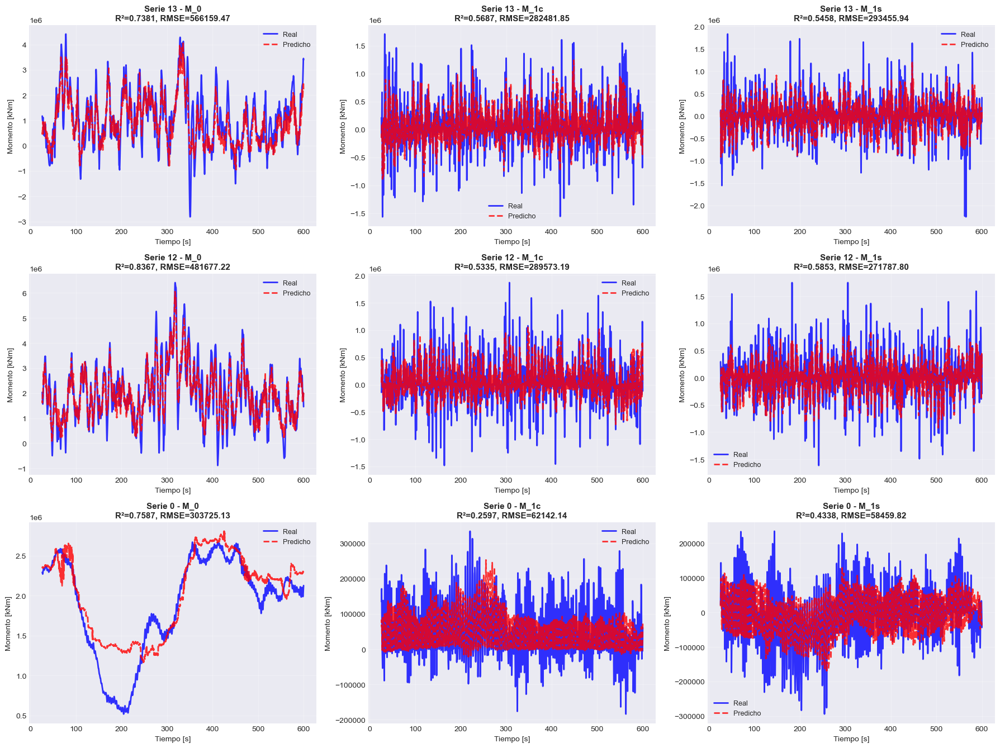

   ✅ Gráfica guardada: timeseries_comparison.png

PASO 3: GRÁFICAS DE TIME SERIES - ZOOM 30 SEGUNDOS

[1/1] Creando gráficas de time series con zoom (30s)...


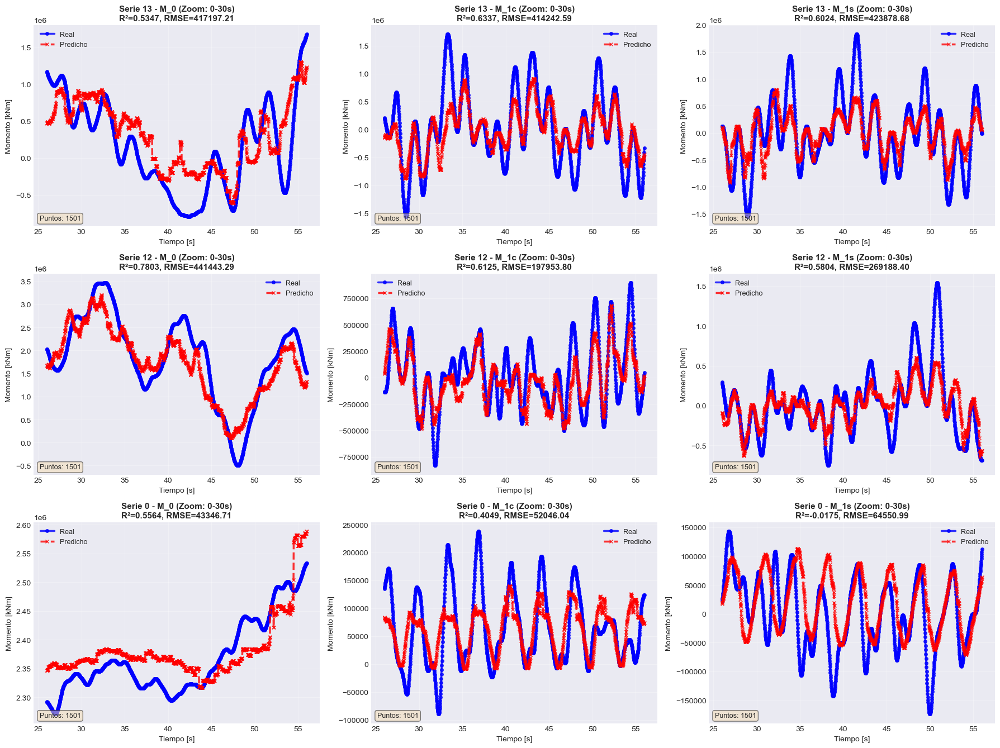

   ✅ Gráfica guardada: timeseries_comparison_zoom30s.png

✅ GRÁFICAS DE TIME SERIES COMPLETADAS

📊 GRÁFICAS GENERADAS:
   • timeseries_comparison.png
   • timeseries_comparison_zoom30s.png

💡 Targets graficados: ['M_0', 'M_1c', 'M_1s']
💡 Series aleatorias: [13, 12, 0]


In [8]:
# O especificar tu propia semilla
plots = generate_timeseries_plots(
    root_dir=root_dir,
    y_test=y_test,
    y_test_pred=y_test_pred,
    output_folder=training_folder,
    model_name='Random Forest',
    zoom_seconds=30,
    random_seed=25  # ← Semilla personalizada
)

## 🌳 MODELO 3: XGBOOST

**XGBoost (eXtreme Gradient Boosting)** es un algoritmo de gradient boosting optimizado que construye un ensamble de árboles de decisión de forma secuencial. Cada árbol nuevo intenta corregir los errores de los anteriores.

**Características principales:**
- **Regularización L1 y L2**: Previene overfitting mejor que otros algoritmos de boosting
- **Tree Pruning**: Poda los árboles usando un enfoque de profundidad-primera
- **Paralelización**: Aunque construye árboles secuencialmente, paraleliza operaciones internas
- **Manejo de missing values**: Aprende automáticamente la mejor dirección para valores faltantes
- **Built-in Cross-Validation**: Incluye CV durante el entrenamiento

**Ventajas:**
- Excelente rendimiento en datos tabulares
- Rápido y eficiente (optimizado en C++)
- Controla overfitting con múltiples parámetros de regularización
- Maneja bien datos no balanceados

**Hiperparámetros clave:**
- `n_estimators`: Número de árboles en el ensamble
- `max_depth`: Profundidad máxima de cada árbol
- `learning_rate`: Tasa de aprendizaje para reducir overfitting
- `subsample`: Fracción de muestras para entrenar cada árbol
- `colsample_bytree`: Fracción de features para cada árbol

In [ ]:
# =============================================================================
# MODELO 3: XGBOOST - ENTRENAMIENTO
# =============================================================================
import time

print("\n" + "="*80)
print("🌳 MODELO: XGBOOST - ENTRENAMIENTO")
print("="*80)

# Verificar disponibilidad de XGBoost
if not XGBOOST_AVAILABLE:
    print("\n❌ ERROR: XGBoost no está instalado")
    print("   Instalar con: pip install xgboost")
    raise ImportError("XGBoost no disponible")

print("✅ XGBoost disponible")

import xgboost as xgb

# ------------------------------------------------------------------------
# 1) Preparar carpeta y cargar datos
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: PREPARAR CARPETA Y CARGAR DATOS")
print("="*80)

print(f"\n[1/4] Creando carpeta para XGBoost...")

training_folder = root_dir / 'notebook' / '03_ML_traditional_models' / 'XGBoost'
os.makedirs(training_folder, exist_ok=True)

print(f"   ✅ Carpeta: {training_folder}")

print(f"\n[2/4] Cargando datos de entrenamiento normalizados...")

data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'

X_train_norm = joblib.load(data_ml_folder / 'X_train_norm.pkl')
y_train_norm = joblib.load(data_ml_folder / 'y_train_norm.pkl')

print(f"   ✅ X_train_norm: {X_train_norm.shape}")
print(f"   ✅ y_train_norm: {y_train_norm.shape}")

print(f"\n[3/4] Verificando datos originales (para métricas posteriores)...")

X_train = joblib.load(data_ml_folder / 'X_train.pkl')
y_train = joblib.load(data_ml_folder / 'y_train.pkl')

print(f"   ✅ X_train: {X_train.shape}")
print(f"   ✅ y_train: {y_train.shape}")

print(f"\n[4/4] Verificando número de features y targets...")

print(f"   • Features (inputs):  {X_train_norm.shape[1]}")
print(f"   • Targets (outputs):  {y_train_norm.shape[1]} (ambas palas)")
print(f"   • Muestras training:  {X_train_norm.shape[0]:,}")

# ------------------------------------------------------------------------
# 2) Configurar y entrenar modelo XGBoost
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: CONFIGURACIÓN Y ENTRENAMIENTO")
print("="*80)

print(f"\n[1/3] Configurando XGBoost con MultiOutputRegressor...")

# PRIMERA PRUEBA - PARÁMETROS POR DEFECTO
# Configurar XGBoost con parámetros optimizados
# xgb_base = xgb.XGBRegressor(
#     n_estimators=100,          # Número de árboles
#     max_depth=6,               # Profundidad máxima de cada árbol
#     learning_rate=0.1,         # Tasa de aprendizaje
#     subsample=0.8,             # Fracción de muestras para cada árbol
#     colsample_bytree=0.8,      # Fracción de features para cada árbol
#     gamma=0,                   # Mínima reducción de loss para split
#     min_child_weight=1,        # Peso mínimo en nodo hijo
#     reg_alpha=0,               # Regularización L1
#     reg_lambda=1,              # Regularización L2
#     random_state=42,
#     n_jobs=-1,                 # Usar todos los cores
#     verbosity=0                # Sin mensajes de XGBoost
# )


# SEGUNDA PRUEBA - PARÁMETROS OPTIMIZADOS TOP DE MOOMENTO
xgb_base = xgb.XGBRegressor(
    n_estimators=2000,          # Número de árboles
    max_depth=4,               # Profundidad máxima de cada árbol
    learning_rate=0.05,         # Tasa de aprendizaje
    subsample=0.7,             # Fracción de muestras para cada árbol
    colsample_bytree=0.7,      # Fracción de features para cada árbol
    gamma=0.5,                   # Mínima reducción de loss para split
    min_child_weight=12,        # Peso mínimo en nodo hijo
    reg_alpha=2,               # Regularización L1
    reg_lambda=10,              # Regularización L2
    random_state=42,
    n_jobs=-1,                 # Usar todos los cores
    verbosity=0                # Sin mensajes de XGBoost
)




# Usar MultiOutputRegressor para predecir ambas palas
xgb_model = MultiOutputRegressor(xgb_base)

print(f"   ✅ Modelo configurado:")
print(f"      • Tipo: XGBoost (Gradient Boosting)")
print(f"      • N_estimators: 100")
print(f"      • Max_depth: 6")
print(f"      • Learning_rate: 0.1")
print(f"      • Subsample: 0.8")
print(f"      • Colsample_bytree: 0.8")
print(f"      • Outputs: {len(y_train_norm.columns)} (ambas palas)")

print(f"\n[2/3] Entrenando modelo con datos normalizados...")
print(f"   • Datos de entrenamiento: {X_train_norm.shape}")
print(f"   • Targets de entrenamiento: {y_train_norm.shape}")

start_time = time.time()

# Entrenar el modelo
xgb_model.fit(X_train_norm, y_train_norm)

training_time = time.time() - start_time

print(f"   ✅ Modelo entrenado en {training_time:.2f} segundos")

print(f"\n[3/3] Guardando modelo...")

# Guardar el modelo entrenado
model_path = training_folder / 'xgboost_model.pkl'
joblib.dump(xgb_model, model_path)

print(f"   ✅ Modelo guardado: {model_path.name}")

# ------------------------------------------------------------------------
# RESUMEN
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ ENTRENAMIENTO COMPLETADO - XGBOOST")
print("="*80)

print(f"\n📊 INFORMACIÓN DEL MODELO:")
print(f"   • Algoritmo: XGBoost (Extreme Gradient Boosting)")
print(f"   • Tiempo de entrenamiento: {training_time:.2f} segundos")
print(f"   • Muestras entrenadas: {X_train_norm.shape[0]:,}")
print(f"   • Features utilizadas: {X_train_norm.shape[1]}")
print(f"   • Outputs predichos: {y_train_norm.shape[1]}")

print(f"\n📁 ARCHIVO GENERADO:")
print(f"   • {model_path.name}")

print(f"\n💡 XGBoost usa gradient boosting optimizado para mejorar iterativamente las predicciones.")
print("="*80)


🌳 MODELO: XGBOOST - ENTRENAMIENTO
✅ XGBoost disponible

PASO 1: PREPARAR CARPETA Y CARGAR DATOS

[1/4] Creando carpeta para XGBoost...
   ✅ Carpeta: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models\XGBoost

[2/4] Cargando datos de entrenamiento normalizados...
   ✅ X_train_norm: (1635957, 151)
   ✅ y_train_norm: (1635957, 3)

[3/4] Verificando datos originales (para métricas posteriores)...
   ✅ X_train: (1635957, 151)
   ✅ y_train: (1635957, 3)

[4/4] Verificando número de features y targets...
   • Features (inputs):  151
   • Targets (outputs):  3 (ambas palas)
   • Muestras training:  1,635,957

PASO 2: CONFIGURACIÓN Y ENTRENAMIENTO

[1/3] Configurando XGBoost con MultiOutputRegressor...
   ✅ Modelo configurado:
      • Tipo: XGBoost (Gradient Boosting)
      • N_estimators: 100
      • Max_depth: 6
      • Learning_rate: 0.1
      • Subsample: 0.8
      • Colsample_bytree: 0.8
      • Outputs: 3 (ambas palas)

[2/3] Entr


🎯 MODELO: XGBOOST - VALIDACIÓN

PASO 1: CARGAR MODELO Y DATOS DE TEST

[1/5] Cargando modelo entrenado...
   ✅ Modelo cargado desde: xgboost_model.pkl

[2/5] Cargando datos de test originales...
   ✅ X_test: (430515, 151)
   ✅ y_test: (430515, 3)
   💡 Targets: ['M_0', 'M_1c', 'M_1s']

[3/5] Cargando datos de train originales (para métricas)...
   ✅ Datos de train cargados

[4/5] Cargando scalers independientes...
   ✅ Scalers cargados:
      • scalers_X: 151 scalers (uno por feature)
      • scalers_y: 3 scalers (uno por target)

[5/5] Normalizando datos de test con scalers independientes...
   ✅ X_test normalizado: (430515, 151)
   💡 Normalización columna por columna con scalers independientes

PASO 2: PREDICCIONES

[1/2] Prediciendo sobre conjunto de entrenamiento...
   ✅ Predicciones train (normalizadas): (1635957, 3)

[2/2] Prediciendo sobre conjunto de test...
   ✅ Predicciones test (normalizadas): (430515, 3)

PASO 3: DESNORMALIZACIÓN DE PREDICCIONES

[1/2] Desnormalizando predi

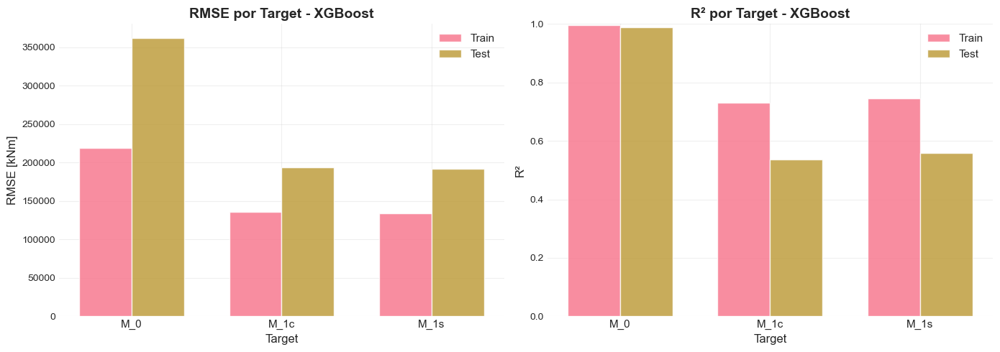

   ✅ Gráfica guardada: metrics_comparison.png

[2/3] Creando gráficas de predicciones vs reales...


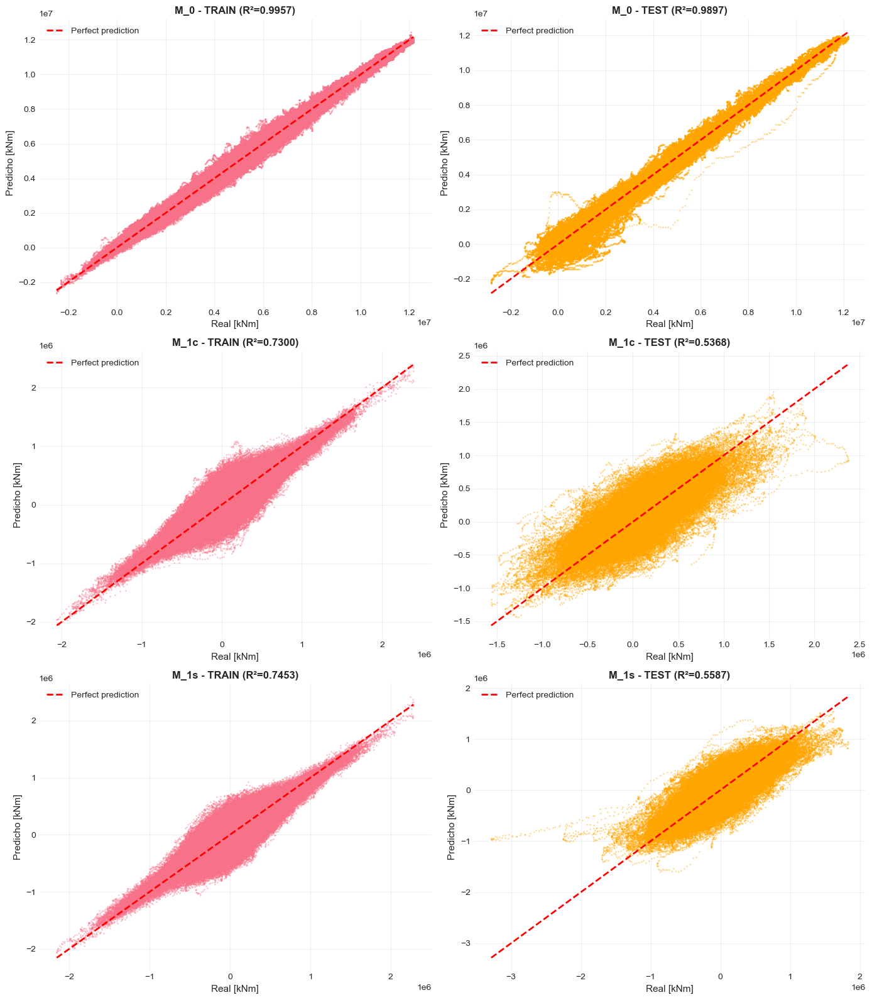

   ✅ Gráfica guardada: predictions_vs_real.png

[3/3] Creando gráfica de residuos...


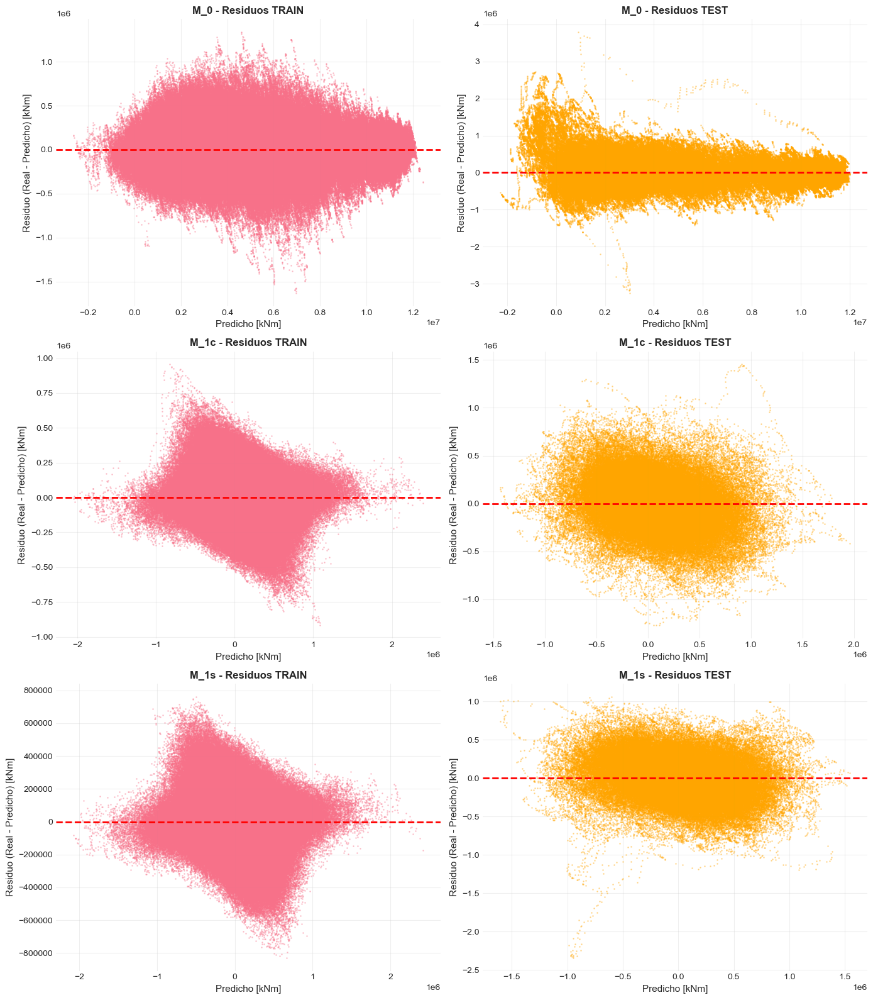

   ✅ Gráfica guardada: residuals_analysis.png

PASO 6: GUARDAR RESULTADOS

   ✅ Métricas guardadas: metrics_results.csv
   ✅ Resumen guardado: validation_summary.csv

✅ VALIDACIÓN COMPLETADA - XGBOOST

📊 RESULTADOS FINALES:
   • RMSE promedio (Train): 162703.63 kNm
   • RMSE promedio (Test):  249249.26 kNm
   • R² promedio (Train):   0.8237
   • R² promedio (Test):    0.6951

📁 ARCHIVOS GENERADOS:
   • metrics_results.csv
   • validation_summary.csv
   • metrics_comparison.png
   • predictions_vs_real.png
   • residuals_analysis.png

💡 XGBoost con scalers independientes por columna (X e y).
💡 Targets: ['M_0', 'M_1c', 'M_1s']


In [33]:
"""
Script para validar modelo XGBoost entrenado.

Este script:
1. Carga modelo entrenado y datos de test
2. Normaliza datos de test con scalers independientes
3. Realiza predicciones y desnormaliza
4. Calcula métricas (RMSE, R²)
5. Genera visualizaciones

Adaptado para trabajar con:
- Scalers independientes por columna (scalers_X.pkl, scalers_y.pkl)
- Targets nuevos: M_0, M_1c, M_1s

Autor: Adaptado de validación XGBoost
Fecha: Enero 2026
"""

# =============================================================================
# MODELO: XGBOOST - VALIDACIÓN Y VISUALIZACIONES
# =============================================================================

print("\n" + "="*80)
print("🎯 MODELO: XGBOOST - VALIDACIÓN")
print("="*80)

# ------------------------------------------------------------------------
# 1) Cargar modelo entrenado y datos de test
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: CARGAR MODELO Y DATOS DE TEST")
print("="*80)

training_folder = root_dir / 'notebook' / '03_ML_traditional_models' / 'XGBoost'
data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'

print(f"\n[1/5] Cargando modelo entrenado...")
model_path = training_folder / 'xgboost_model.pkl'
xgb_model = joblib.load(model_path)
print(f"   ✅ Modelo cargado desde: {model_path.name}")

print(f"\n[2/5] Cargando datos de test originales...")
X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")
print(f"   💡 Targets: {list(y_test.columns)}")

print(f"\n[3/5] Cargando datos de train originales (para métricas)...")
X_train = joblib.load(data_ml_folder / 'X_train.pkl')
y_train = joblib.load(data_ml_folder / 'y_train.pkl')
X_train_norm = joblib.load(data_ml_folder / 'X_train_norm.pkl')
print(f"   ✅ Datos de train cargados")

print(f"\n[4/5] Cargando scalers independientes...")
scalers_X = joblib.load(root_dir / 'notebook' / '01_Models_scaler' / 'scalers_X.pkl')
scalers_y = joblib.load(root_dir / 'notebook' / '01_Models_scaler' / 'scalers_y.pkl')
print(f"   ✅ Scalers cargados:")
print(f"      • scalers_X: {len(scalers_X)} scalers (uno por feature)")
print(f"      • scalers_y: {len(scalers_y)} scalers (uno por target)")

print(f"\n[5/5] Normalizando datos de test con scalers independientes...")
# Normalizar columna por columna usando scalers individuales
X_test_norm = pd.DataFrame(index=X_test.index, columns=X_test.columns)

for col in X_test.columns:
    if col in scalers_X:
        X_test_norm[col] = scalers_X[col].transform(X_test[[col]])
    else:
        print(f"   ⚠️  Columna {col} no tiene scaler, usando valores originales")
        X_test_norm[col] = X_test[col]

# Convertir a float32 para consistencia
X_test_norm = X_test_norm.astype('float32')

print(f"   ✅ X_test normalizado: {X_test_norm.shape}")
print(f"   💡 Normalización columna por columna con scalers independientes")

# ------------------------------------------------------------------------
# 2) Realizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: PREDICCIONES")
print("="*80)

print(f"\n[1/2] Prediciendo sobre conjunto de entrenamiento...")

y_train_pred_norm = xgb_model.predict(X_train_norm)
y_train_pred_norm = pd.DataFrame(
    y_train_pred_norm,
    index=X_train_norm.index,
    columns=y_train.columns
)

print(f"   ✅ Predicciones train (normalizadas): {y_train_pred_norm.shape}")

print(f"\n[2/2] Prediciendo sobre conjunto de test...")

y_test_pred_norm = xgb_model.predict(X_test_norm)
y_test_pred_norm = pd.DataFrame(
    y_test_pred_norm,
    index=y_test.index,
    columns=y_test.columns
)

print(f"   ✅ Predicciones test (normalizadas): {y_test_pred_norm.shape}")

# ------------------------------------------------------------------------
# 3) Desnormalizar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: DESNORMALIZACIÓN DE PREDICCIONES")
print("="*80)

print(f"\n[1/2] Desnormalizando predicciones de train...")

# Desnormalizar columna por columna usando scalers independientes
y_train_pred = pd.DataFrame(index=y_train_pred_norm.index, columns=y_train_pred_norm.columns)

for col in y_train_pred_norm.columns:
    if col in scalers_y:
        y_train_pred[col] = scalers_y[col].inverse_transform(y_train_pred_norm[[col]])
    else:
        print(f"   ⚠️  Columna {col} no tiene scaler, usando valores normalizados")
        y_train_pred[col] = y_train_pred_norm[col]

print(f"   ✅ Predicciones train desnormalizadas")
print(f"   💡 Desnormalización columna por columna con scalers independientes")

print(f"\n[2/2] Desnormalizando predicciones de test...")

# Desnormalizar columna por columna usando scalers independientes
y_test_pred = pd.DataFrame(index=y_test_pred_norm.index, columns=y_test_pred_norm.columns)

for col in y_test_pred_norm.columns:
    if col in scalers_y:
        y_test_pred[col] = scalers_y[col].inverse_transform(y_test_pred_norm[[col]])
    else:
        print(f"   ⚠️  Columna {col} no tiene scaler, usando valores normalizados")
        y_test_pred[col] = y_test_pred_norm[col]

print(f"   ✅ Predicciones test desnormalizadas")

# ------------------------------------------------------------------------
# 4) Calcular métricas
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 4: CÁLCULO DE MÉTRICAS")
print("="*80)

# Diccionarios para almacenar métricas
metrics_train = {}
metrics_test = {}

print(f"\n{'MÉTRICA':20} {'CONJUNTO':10} {'M_0':>15} {'M_1c':>15} {'M_1s':>15}")
print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")

# Calcular métricas para cada target
for i, col in enumerate(y_train.columns):
    # TRAIN
    rmse_train = np.sqrt(mean_squared_error(y_train[col], y_train_pred[col]))
    r2_train = r2_score(y_train[col], y_train_pred[col])
    
    # TEST
    rmse_test = np.sqrt(mean_squared_error(y_test[col], y_test_pred[col]))
    r2_test = r2_score(y_test[col], y_test_pred[col])
    
    # Guardar métricas
    metrics_train[col] = {'RMSE': rmse_train, 'R2': r2_train}
    metrics_test[col] = {'RMSE': rmse_test, 'R2': r2_test}
    
    # Mostrar
    if i == 0:
        print(f"{'RMSE':20} {'TRAIN':10} {rmse_train:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {rmse_test:>15.2f} {'-':>15} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {r2_train:>15.4f} {'-':>15} {'-':>15}")
        print(f"{'':20} {'TEST':10} {r2_test:>15.4f} {'-':>15} {'-':>15}")
    elif i == 1:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {rmse_train:>15.2f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {rmse_test:>15.2f} {'-':>15}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {r2_train:>15.4f} {'-':>15}")
        print(f"{'':20} {'TEST':10} {'-':>15} {r2_test:>15.4f} {'-':>15}")
    else:
        print(f"{'RMSE':20} {'TRAIN':10} {'-':>15} {'-':>15} {rmse_train:>15.2f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {rmse_test:>15.2f}")
        print(f"{'R²':20} {'TRAIN':10} {'-':>15} {'-':>15} {r2_train:>15.4f}")
        print(f"{'':20} {'TEST':10} {'-':>15} {'-':>15} {r2_test:>15.4f}")

# Calcular promedios
avg_rmse_train = np.mean([m['RMSE'] for m in metrics_train.values()])
avg_rmse_test = np.mean([m['RMSE'] for m in metrics_test.values()])
avg_r2_train = np.mean([m['R2'] for m in metrics_train.values()])
avg_r2_test = np.mean([m['R2'] for m in metrics_test.values()])

print(f"{'─'*20} {'─'*10} {'─'*15} {'─'*15} {'─'*15}")
print(f"{'PROMEDIO RMSE':20} {'TRAIN':10} {avg_rmse_train:>15.2f}")
print(f"{'':20} {'TEST':10} {avg_rmse_test:>15.2f}")
print(f"{'PROMEDIO R²':20} {'TRAIN':10} {avg_r2_train:>15.4f}")
print(f"{'':20} {'TEST':10} {avg_r2_test:>15.4f}")

# ------------------------------------------------------------------------
# 5) Visualizaciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 5: GENERACIÓN DE GRÁFICAS")
print("="*80)

# 5.1) Gráfica de métricas por target
print(f"\n[1/3] Creando gráfica de métricas...")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# RMSE
targets = list(metrics_train.keys())
rmse_train_vals = [metrics_train[t]['RMSE'] for t in targets]
rmse_test_vals = [metrics_test[t]['RMSE'] for t in targets]

x = np.arange(len(targets))
width = 0.35

axes[0].bar(x - width/2, rmse_train_vals, width, label='Train', alpha=0.8)
axes[0].bar(x + width/2, rmse_test_vals, width, label='Test', alpha=0.8)
axes[0].set_xlabel('Target', fontsize=12)
axes[0].set_ylabel('RMSE [kNm]', fontsize=12)
axes[0].set_title('RMSE por Target - XGBoost', fontsize=14, fontweight='bold')
axes[0].set_xticks(x)
axes[0].set_xticklabels(targets, fontsize=11)
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# R²
r2_train_vals = [metrics_train[t]['R2'] for t in targets]
r2_test_vals = [metrics_test[t]['R2'] for t in targets]

axes[1].bar(x - width/2, r2_train_vals, width, label='Train', alpha=0.8)
axes[1].bar(x + width/2, r2_test_vals, width, label='Test', alpha=0.8)
axes[1].set_xlabel('Target', fontsize=12)
axes[1].set_ylabel('R²', fontsize=12)
axes[1].set_title('R² por Target - XGBoost', fontsize=14, fontweight='bold')
axes[1].set_xticks(x)
axes[1].set_xticklabels(targets, fontsize=11)
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)
axes[1].set_ylim([0, 1])

plt.tight_layout()
metrics_plot_path = training_folder / 'metrics_comparison.png'
plt.savefig(metrics_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {metrics_plot_path.name}")

# 5.2) Gráficas de predicciones vs reales
print(f"\n[2/3] Creando gráficas de predicciones vs reales...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # TRAIN
    axes[row, 0].scatter(y_train[col], y_train_pred[col], alpha=0.3, s=1)
    axes[row, 0].plot([y_train[col].min(), y_train[col].max()], 
                       [y_train[col].min(), y_train[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 0].set_xlabel('Real [kNm]', fontsize=11)
    axes[row, 0].set_ylabel('Predicho [kNm]', fontsize=11)
    axes[row, 0].set_title(f'{col} - TRAIN (R²={metrics_train[col]["R2"]:.4f})', 
                          fontsize=12, fontweight='bold')
    axes[row, 0].legend(fontsize=10)
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test[col], y_test_pred[col], alpha=0.3, s=1, color='orange')
    axes[row, 1].plot([y_test[col].min(), y_test[col].max()], 
                       [y_test[col].min(), y_test[col].max()], 
                       'r--', lw=2, label='Perfect prediction')
    axes[row, 1].set_xlabel('Real [kNm]', fontsize=11)
    axes[row, 1].set_ylabel('Predicho [kNm]', fontsize=11)
    axes[row, 1].set_title(f'{col} - TEST (R²={metrics_test[col]["R2"]:.4f})', 
                          fontsize=12, fontweight='bold')
    axes[row, 1].legend(fontsize=10)
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
predictions_plot_path = training_folder / 'predictions_vs_real.png'
plt.savefig(predictions_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {predictions_plot_path.name}")

# 5.3) Gráfica de residuos
print(f"\n[3/3] Creando gráfica de residuos...")

fig, axes = plt.subplots(3, 2, figsize=(14, 16))

for idx, col in enumerate(y_train.columns):
    row = idx
    
    # Calcular residuos
    residuals_train = y_train[col] - y_train_pred[col]
    residuals_test = y_test[col] - y_test_pred[col]
    
    # TRAIN
    axes[row, 0].scatter(y_train_pred[col], residuals_train, alpha=0.3, s=1)
    axes[row, 0].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 0].set_xlabel('Predicho [kNm]', fontsize=11)
    axes[row, 0].set_ylabel('Residuo (Real - Predicho) [kNm]', fontsize=11)
    axes[row, 0].set_title(f'{col} - Residuos TRAIN', fontsize=12, fontweight='bold')
    axes[row, 0].grid(True, alpha=0.3)
    
    # TEST
    axes[row, 1].scatter(y_test_pred[col], residuals_test, alpha=0.3, s=1, color='orange')
    axes[row, 1].axhline(y=0, color='r', linestyle='--', lw=2)
    axes[row, 1].set_xlabel('Predicho [kNm]', fontsize=11)
    axes[row, 1].set_ylabel('Residuo (Real - Predicho) [kNm]', fontsize=11)
    axes[row, 1].set_title(f'{col} - Residuos TEST', fontsize=12, fontweight='bold')
    axes[row, 1].grid(True, alpha=0.3)

plt.tight_layout()
residuals_plot_path = training_folder / 'residuals_analysis.png'
plt.savefig(residuals_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {residuals_plot_path.name}")

# ------------------------------------------------------------------------
# 6) Guardar métricas en archivo
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 6: GUARDAR RESULTADOS")
print("="*80)

# Crear DataFrame con métricas
metrics_df = pd.DataFrame({
    'Target': list(metrics_train.keys()) + ['PROMEDIO'],
    'RMSE_Train': list([m['RMSE'] for m in metrics_train.values()]) + [avg_rmse_train],
    'RMSE_Test': list([m['RMSE'] for m in metrics_test.values()]) + [avg_rmse_test],
    'R2_Train': list([m['R2'] for m in metrics_train.values()]) + [avg_r2_train],
    'R2_Test': list([m['R2'] for m in metrics_test.values()]) + [avg_r2_test]
})

metrics_csv_path = training_folder / 'metrics_results.csv'
metrics_df.to_csv(metrics_csv_path, index=False)

print(f"\n   ✅ Métricas guardadas: {metrics_csv_path.name}")

# Crear resumen de validación
summary = {
    'Model': 'XGBoost',
    'Train_Samples': len(X_train),
    'Test_Samples': len(X_test),
    'Features': X_train.shape[1],
    'Targets': y_train.shape[1],
    'Avg_RMSE_Train': avg_rmse_train,
    'Avg_RMSE_Test': avg_rmse_test,
    'Avg_R2_Train': avg_r2_train,
    'Avg_R2_Test': avg_r2_test,
    'N_Estimators': 100,
    'Max_Depth': 6,
    'Learning_Rate': 0.1,
    'Subsample': 0.8,
    'Colsample_Bytree': 0.8,
    'Tree_Method': 'hist'
}

summary_df = pd.DataFrame([summary])
summary_path = training_folder / 'validation_summary.csv'
summary_df.to_csv(summary_path, index=False)

print(f"   ✅ Resumen guardado: {summary_path.name}")

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ VALIDACIÓN COMPLETADA - XGBOOST")
print("="*80)

print(f"\n📊 RESULTADOS FINALES:")
print(f"   • RMSE promedio (Train): {avg_rmse_train:.2f} kNm")
print(f"   • RMSE promedio (Test):  {avg_rmse_test:.2f} kNm")
print(f"   • R² promedio (Train):   {avg_r2_train:.4f}")
print(f"   • R² promedio (Test):    {avg_r2_test:.4f}")

print(f"\n📁 ARCHIVOS GENERADOS:")
print(f"   • {metrics_csv_path.name}")
print(f"   • {summary_path.name}")
print(f"   • {metrics_plot_path.name}")
print(f"   • {predictions_plot_path.name}")
print(f"   • {residuals_plot_path.name}")

print(f"\n💡 XGBoost con scalers independientes por columna (X e y).")
print(f"💡 Targets: {list(y_test.columns)}")
print("="*80)


📊 XGBOOST - GRÁFICAS DE TIME SERIES

✅ Variables encontradas en memoria:
   • y_test: (430515, 3)
   • y_test_pred: (430515, 3)

PASO 1: PREPARAR DATOS PARA TIME SERIES

[1/3] Cargando Time_test desde archivo pkl...
   ✅ Time_test cargado: 430,515 valores
   • Tiempo mínimo: 26.00s
   • Tiempo máximo: 600.00s

[2/3] Generando series_id_test a partir de Time_test...
   ✅ Series temporales identificadas en test: 15

   📊 Resumen de series en TEST:
      Serie   0: 28,701 filas | Time:   26.0s →  600.0s
      Serie   1: 28,701 filas | Time:   26.0s →  600.0s
      Serie   2: 28,701 filas | Time:   26.0s →  600.0s
      Serie   3: 28,701 filas | Time:   26.0s →  600.0s
      Serie   4: 28,701 filas | Time:   26.0s →  600.0s
      ... y 10 series más

[3/3] Verificando que los datos coinciden con predicciones...
   ✅ Índices verificados:
      • y_test: 430,515 filas
      • y_test_pred: 430,515 filas
      • series_id_test: 430,515 valores
      • Time_test: 430,515 valores

PASO 2: GRÁFI

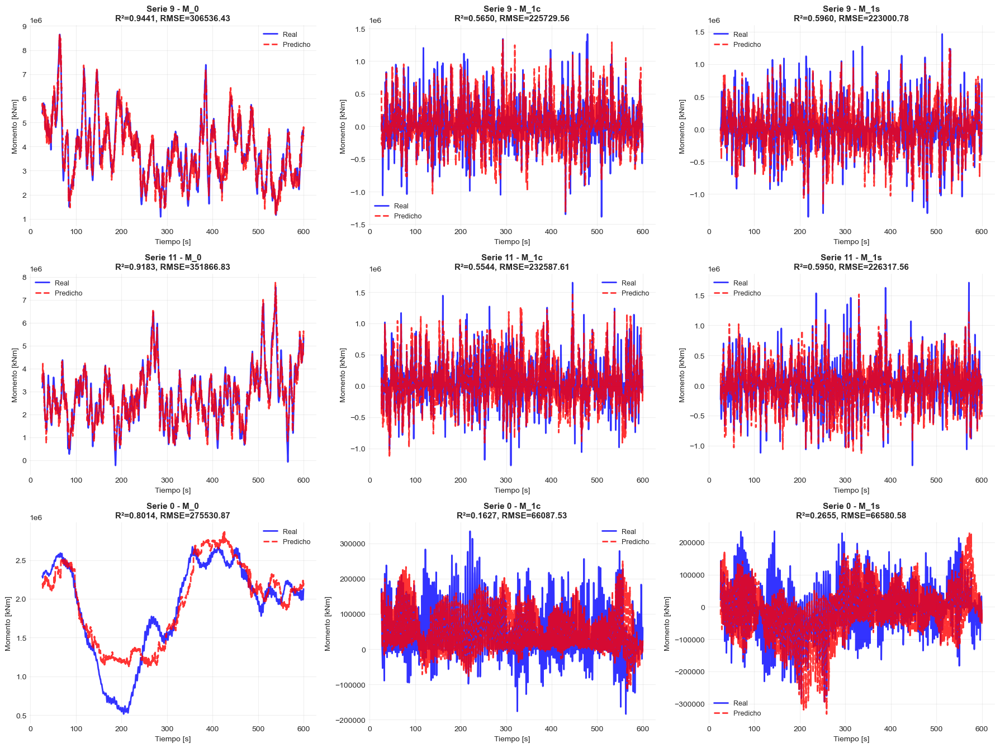

   ✅ Gráfica guardada: timeseries_comparison.png

PASO 3: GRÁFICAS DE TIME SERIES - ZOOM 50 SEGUNDOS

[1/1] Creando gráficas de time series con zoom (50s)...


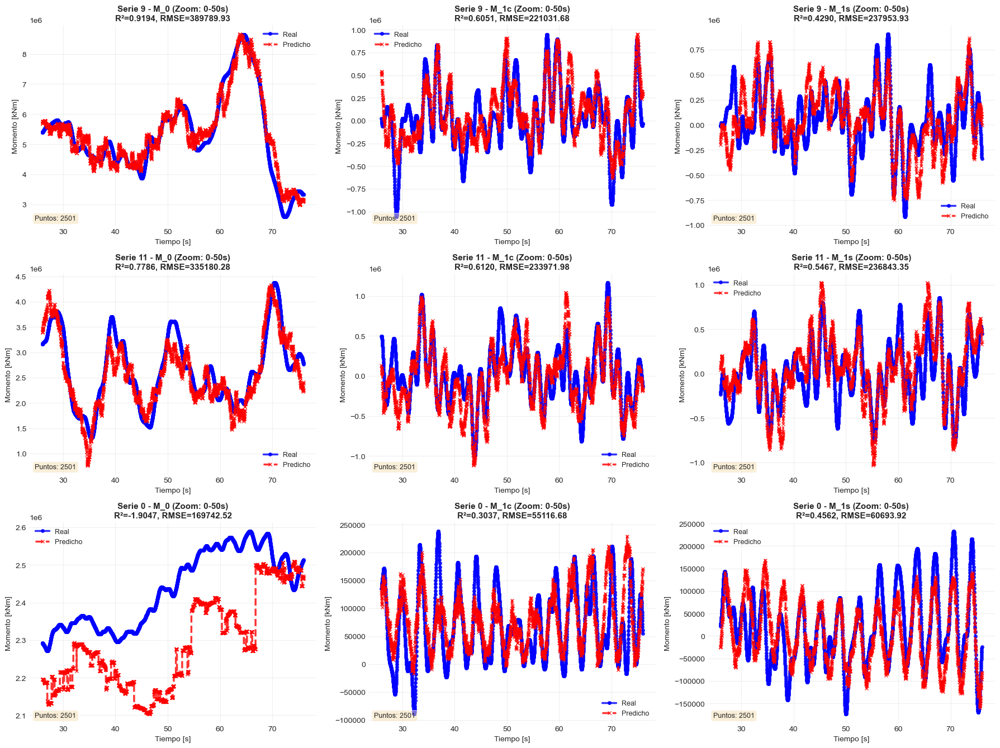

   ✅ Gráfica guardada: timeseries_comparison_zoom50s.png

✅ GRÁFICAS DE TIME SERIES COMPLETADAS

📊 GRÁFICAS GENERADAS:
   • timeseries_comparison.png
   • timeseries_comparison_zoom50s.png

💡 Targets graficados: ['M_0', 'M_1c', 'M_1s']
💡 Series aleatorias: [9, 11, 0]

💡 Ahora tienes todas las gráficas para XGBoost:
   1. Métricas por target (RMSE y R²)
   2. Predicciones vs Real
   3. Análisis de residuos
   4. Time series completas (3 series aleatorias × 3 targets)
   5. Time series con zoom de 50s


In [34]:

# =============================================================================
# XGBOOST - GRÁFICAS ADICIONALES DE TIME SERIES
# =============================================================================

print("\n" + "="*80)
print("📊 XGBOOST - GRÁFICAS DE TIME SERIES")
print("="*80)

# NOTA: Este script requiere que y_test y y_test_pred estén en memoria
# Ejecutar primero XGBOOST_Validation.py

# Verificar que las variables existan
try:
    y_test
    y_test_pred
    print(f"\n✅ Variables encontradas en memoria:")
    print(f"   • y_test: {y_test.shape}")
    print(f"   • y_test_pred: {y_test_pred.shape}")
except NameError:
    print(f"\n❌ ERROR: y_test y/o y_test_pred no están en memoria")
    print(f"   Por favor, ejecuta primero XGBOOST_Validation.py")
    raise

# ------------------------------------------------------------------------
# 1) Cargar Time_test y generar series_id_test
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: PREPARAR DATOS PARA TIME SERIES")
print("="*80)

training_folder = root_dir / 'notebook' / '03_ML_traditional_models' / 'XGBoost'
data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'

print(f"\n[1/3] Cargando Time_test desde archivo pkl...")

Time_test_path = data_ml_folder / 'Time_test.pkl'

if Time_test_path.exists():
    Time_test = joblib.load(Time_test_path)
    print(f"   ✅ Time_test cargado: {len(Time_test):,} valores")
    print(f"   • Tiempo mínimo: {Time_test.min():.2f}s")
    print(f"   • Tiempo máximo: {Time_test.max():.2f}s")
else:
    print(f"   ❌ ERROR: No se encontró {Time_test_path}")
    raise FileNotFoundError(f"Archivo requerido no encontrado: {Time_test_path}")

print(f"\n[2/3] Generando series_id_test a partir de Time_test...")

# Detectar inicio de cada serie (cuando Time reinicia, es decir, disminuye)
series_id_test_values = np.zeros(len(Time_test), dtype=int)
current_series = 0

Time_test_array = Time_test.values
for i in range(1, len(Time_test_array)):
    if Time_test_array[i] < Time_test_array[i-1]:
        current_series += 1
    series_id_test_values[i] = current_series

# Convertir a pandas Series con el mismo index que Time_test
series_id_test = pd.Series(series_id_test_values, index=Time_test.index, name='series_id')

n_test_series = series_id_test.max() + 1

print(f"   ✅ Series temporales identificadas en test: {n_test_series}")

# Analizar cada serie
print(f"\n   📊 Resumen de series en TEST:")
for sid in range(min(5, n_test_series)):
    mask = series_id_test == sid
    n_rows = mask.sum()
    time_min = Time_test.loc[mask].min()
    time_max = Time_test.loc[mask].max()
    print(f"      Serie {sid:3d}: {n_rows:6,} filas | Time: {time_min:6.1f}s → {time_max:6.1f}s")

if n_test_series > 5:
    print(f"      ... y {n_test_series - 5} series más")

print(f"\n[3/3] Verificando que los datos coinciden con predicciones...")

# Verificar que los índices coinciden
if not all(series_id_test.index == y_test.index):
    print(f"   ⚠️  Ajustando índices para que coincidan...")
    series_id_test = series_id_test.reindex(y_test.index)
    Time_test = Time_test.reindex(y_test.index)

print(f"   ✅ Índices verificados:")
print(f"      • y_test: {y_test.shape[0]:,} filas")
print(f"      • y_test_pred: {y_test_pred.shape[0]:,} filas")
print(f"      • series_id_test: {len(series_id_test):,} valores")
print(f"      • Time_test: {len(Time_test):,} valores")

# ------------------------------------------------------------------------
# 2) Gráfica de time series: Real vs Predicho (3 series aleatorias)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: GRÁFICAS DE TIME SERIES - SERIES COMPLETAS")
print("="*80)

print(f"\n[1/1] Creando gráficas de time series (Real vs Predicho)...")

# Obtener series únicas del conjunto de test
unique_test_series = series_id_test.unique()

# Seleccionar 3 series aleatorias
np.random.seed(42)  # Para reproducibilidad
selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

print(f"   • Total series disponibles: {len(unique_test_series)}")
print(f"   • Series seleccionadas para graficar: {selected_series}")

# Detectar número de targets automáticamente
n_targets = len(y_test.columns)
print(f"   • Targets a graficar: {list(y_test.columns)}")

# Crear figura con 3 filas x n_targets columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, n_targets, figsize=(6*n_targets, 13.5))

# Asegurar que axes sea 2D
if n_targets == 1:
    axes = axes.reshape(-1, 1)

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales
        y_real = y_test.loc[series_indices, col]
        # Valores predichos
        y_pred = y_test_pred.loc[series_indices, col]
        
        # Calcular métricas para esta serie y target
        r2_series = r2_score(y_real, y_pred)
        rmse_series = np.sqrt(mean_squared_error(y_real, y_pred))
        
        # Graficar
        ax.plot(time_series, y_real, label='Real', 
                linewidth=2, alpha=0.8, color='blue')
        ax.plot(time_series, y_pred, label='Predicho', 
                linestyle='--', linewidth=2, alpha=0.8, color='red')
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Momento [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

plt.tight_layout()
timeseries_plot_path = training_folder / 'timeseries_comparison.png'
plt.savefig(timeseries_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_plot_path.name}")

# ------------------------------------------------------------------------
# 3) Gráfica de time series con ZOOM (50 segundos)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: GRÁFICAS DE TIME SERIES - ZOOM 50 SEGUNDOS")
print("="*80)

print(f"\n[1/1] Creando gráficas de time series con zoom (50s)...")

# Crear figura con 3 filas x n_targets columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, n_targets, figsize=(6*n_targets, 13.5))

# Asegurar que axes sea 2D
if n_targets == 1:
    axes = axes.reshape(-1, 1)

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Definir ventana de 50 segundos desde el inicio
    time_min = time_series.min()
    time_max_zoom = time_min + 50
    
    # Filtrar por ventana de tiempo
    zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
    zoom_indices = time_series[zoom_mask].index
    time_zoom = time_series[zoom_mask]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales y predichos (con zoom)
        y_real_zoom = y_test.loc[zoom_indices, col]
        y_pred_zoom = y_test_pred.loc[zoom_indices, col]
        
        # Calcular métricas para esta ventana
        r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
        rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
        
        # Graficar
        ax.plot(time_zoom, y_real_zoom, label='Real', 
                linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
        ax.plot(time_zoom, y_pred_zoom, label='Predicho', 
                linestyle='--', linewidth=2.5, alpha=0.8, color='red', marker='x', markersize=5)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Momento [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\nR²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)
        
        # Añadir texto con información de puntos
        n_points = len(zoom_indices)
        ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
timeseries_zoom_plot_path = training_folder / 'timeseries_comparison_zoom50s.png'
plt.savefig(timeseries_zoom_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_zoom_plot_path.name}")

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ GRÁFICAS DE TIME SERIES COMPLETADAS")
print("="*80)

print(f"\n📊 GRÁFICAS GENERADAS:")
print(f"   • {timeseries_plot_path.name}")
print(f"   • {timeseries_zoom_plot_path.name}")

print(f"\n💡 Targets graficados: {list(y_test.columns)}")
print(f"💡 Series aleatorias: {list(selected_series)}")

print(f"\n💡 Ahora tienes todas las gráficas para XGBoost:")
print(f"   1. Métricas por target (RMSE y R²)")
print(f"   2. Predicciones vs Real")
print(f"   3. Análisis de residuos")
print(f"   4. Time series completas (3 series aleatorias × {n_targets} targets)")
print(f"   5. Time series con zoom de 50s")

print("="*80)

## 🧠 MULTI-LAYER PERCEPTRON (MLP)

**MLP (Multi-Layer Perceptron)** es una red neuronal artificial feedforward que consiste 
en múltiples capas de neuronas interconectadas. Cada capa transforma la información usando 
funciones de activación no lineales, permitiendo al modelo aprender relaciones complejas.

**Características principales:**
- **Arquitectura multicapa**: Capas de entrada, ocultas y salida conectadas completamente
- **Funciones de activación**: ReLU, tanh, sigmoid para introducir no-linealidades
- **Backpropagation**: Algoritmo de optimización mediante gradiente descendente
- **Regularización L2**: Penalización para evitar overfitting
- **Early Stopping**: Detiene el entrenamiento cuando no hay mejora en validación

**Ventajas:**
- Capaz de aprender relaciones no lineales complejas
- Flexible en arquitectura (número de capas y neuronas)
- Funciona bien con datos normalizados y grandes volúmenes
- Aprende representaciones jerárquicas de los datos

**Desventajas:**
- Requiere normalización de datos
- Más lento de entrenar que modelos de árboles
- Puede quedarse en mínimos locales
- Menos interpretable que modelos lineales o de árboles

**Hiperparámetros clave:**
- `hidden_layer_sizes`: Arquitectura de capas ocultas (ej: (256, 128, 64))
- `activation`: Función de activación ('relu', 'tanh', 'logistic')
- `solver`: Optimizador ('adam', 'sgd', 'lbfgs')
- `alpha`: Parámetro de regularización L2
- `learning_rate_init`: Tasa de aprendizaje inicial
- `batch_size`: Tamaño del mini-batch para entrenamiento
- `max_iter`: Número máximo de épocas
""")

In [20]:
"""
============================================================================
PASO 1: ENTRENAMIENTO DE MODELO MLP (MULTI-LAYER PERCEPTRON)
============================================================================

Este script entrena un modelo de Red Neuronal MLP para predecir cargas en 
palas de aerogenerador.

Autor: [Tu nombre]
Fecha: 2026-01-08
============================================================================
"""

import sys
from pathlib import Path
import numpy as np
import pandas as pd
import joblib
import time
from datetime import datetime

# Deep Learning
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler

# Métricas
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Configuración de warnings
import warnings
warnings.filterwarnings('ignore')

print("="*80)
print("🤖 PASO 1: ENTRENAMIENTO DE MODELO MLP")
print("="*80)
print(f"📅 Fecha: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

# ============================================================================
# 1. CONFIGURACIÓN DE RUTAS
# ============================================================================
print("\n[1/7] Configurando rutas...")

# Directorio raíz del proyecto
data_ml_folder = root_dir / 'notebook' / '02_Data_ML_traditional'
models_folder = root_dir / 'notebook' / '03_ML_traditional_models'

# Crear carpeta de modelos si no existe
models_folder.mkdir(parents=True, exist_ok=True)

print(f"   ✅ Carpeta de datos: {data_ml_folder}")
print(f"   ✅ Carpeta de modelos: {models_folder}")

# Verificar que existen los datos
if not data_ml_folder.exists():
    raise FileNotFoundError(f"No se encuentra la carpeta: {data_ml_folder}")

# ============================================================================
# 2. CARGAR DATOS
# ============================================================================
print("\n[2/7] Cargando datos de entrenamiento...")

try:
    # Cargar datos normalizados (MLP funciona mejor con datos normalizados)
    X_train_norm = joblib.load(data_ml_folder / 'X_train_norm.pkl')
    y_train_norm = joblib.load(data_ml_folder / 'y_train_norm.pkl')
    
    print(f"   ✅ X_train_norm cargado: {X_train_norm.shape}")
    print(f"   ✅ y_train_norm cargado: {y_train_norm.shape}")
    
    # Info de los datos
    n_samples, n_features = X_train_norm.shape
    n_outputs = y_train_norm.shape[1]
    
    print(f"\n   📊 Información de los datos:")
    print(f"      • Muestras de entrenamiento: {n_samples:,}")
    print(f"      • Features: {n_features}")
    print(f"      • Outputs: {n_outputs}")
    print(f"      • Tamaño en memoria: {X_train_norm.memory_usage(deep=True).sum() / (1024**2):.1f} MB")
    
except Exception as e:
    print(f"   ❌ Error cargando datos: {e}")
    sys.exit(1)

# ============================================================================
# 3. CONFIGURACIÓN DEL MODELO MLP
# ============================================================================
print("\n[3/7] Configurando modelo MLP...")

# Parámetros del modelo
# mlp_params = {
#     # Arquitectura de la red
#     'hidden_layer_sizes': (256, 128, 64),  # 3 capas ocultas con 256, 128 y 64 neuronas
#     
#     # Función de activación
#     'activation': 'relu',  # ReLU es estándar para regresión
#     
#     # Solver (optimizador)
#     'solver': 'adam',  # Adam es eficiente y robusto
#     
#     # Parámetros de regularización
#     'alpha': 0.0001,  # L2 penalty (regularización)
#     
#     # Parámetros de entrenamiento
#     'batch_size': 256,  # Tamaño de batch para mini-batch gradient descent
#     'learning_rate': 'adaptive',  # Ajusta learning rate automáticamente
#     'learning_rate_init': 0.001,  # Learning rate inicial
#     'max_iter': 500,  # Máximo de épocas
#     
#     # Early stopping
#     'early_stopping': True,  # Detener si no hay mejora
#     'validation_fraction': 0.1,  # 10% para validación interna
#     'n_iter_no_change': 20,  # Parar después de 20 épocas sin mejora
#     'tol': 1e-4,  # Tolerancia para la mejora
#     
#     # Otros
#     'random_state': 42,
#     'verbose': True,  # Mostrar progreso
#     'warm_start': False,  # No usar warm start
# }

mlp_params = {
    # Arquitectura de la red
    'hidden_layer_sizes': (128, 64),  # 2 capas ocultas con 256, 128 y 64 neuronas
    
    # Función de activación
    'activation': 'relu',  # ReLU es estándar para regresión
    
    # Solver (optimizador)
    'solver': 'adam',  # Adam es eficiente y robusto
    
    # Parámetros de regularización
    'alpha': 0.01,  # L2 penalty (regularización)
    
    # Parámetros de entrenamiento
    'batch_size': 512,  # Tamaño de batch para mini-batch gradient descent
    'learning_rate': 'constant',  # Ajusta learning rate automáticamente
    'learning_rate_init': 5e-4,  # Learning rate inicial
    'max_iter': 2000,  # Máximo de épocas
    
    # Early stopping
    'early_stopping': True,  # Detener si no hay mejora
    'validation_fraction': 0.1,  # 10% para validación interna
    'n_iter_no_change': 20,  # Parar después de 20 épocas sin mejora
    'tol': 1e-2,  # Tolerancia para la mejora
    
    # Otros
    'random_state': 42,
    'verbose': True,  # Mostrar progreso
    'warm_start': False,  # No usar warm start
}

print(f"   📋 Configuración del modelo:")
print(f"      • Arquitectura: {mlp_params['hidden_layer_sizes']}")
print(f"      • Activación: {mlp_params['activation']}")
print(f"      • Solver: {mlp_params['solver']}")
print(f"      • Learning rate: {mlp_params['learning_rate_init']}")
print(f"      • Batch size: {mlp_params['batch_size']}")
print(f"      • Max épocas: {mlp_params['max_iter']}")
print(f"      • Early stopping: {mlp_params['early_stopping']}")
print(f"      • Regularización (alpha): {mlp_params['alpha']}")

# Crear modelo
mlp_model = MLPRegressor(**mlp_params)

print(f"\n   ✅ Modelo MLP creado")
print(f"      Total de parámetros estimados: ~{sum(mlp_params['hidden_layer_sizes']) * n_features + sum(mlp_params['hidden_layer_sizes']) * n_outputs:,}")

# ============================================================================
# 4. ENTRENAR MODELO
# ============================================================================
print("\n[4/7] Entrenando modelo MLP...")
print("   ⏳ Esto puede tardar varios minutos...")
print("   " + "-"*76)

start_time = time.time()

try:
    # Entrenar el modelo
    mlp_model.fit(X_train_norm, y_train_norm)
    
    training_time = time.time() - start_time
    
    print("   " + "-"*76)
    print(f"\n   ✅ Entrenamiento completado!")
    print(f"      • Tiempo de entrenamiento: {training_time/60:.2f} minutos ({training_time:.1f} segundos)")
    print(f"      • Épocas ejecutadas: {mlp_model.n_iter_}")
    print(f"      • Loss final: {mlp_model.loss_:.6f}")
    
    if mlp_model.n_iter_ < mlp_params['max_iter']:
        print(f"      • Early stopping activado ✓")
    
except Exception as e:
    print(f"\n   ❌ Error durante el entrenamiento: {e}")
    sys.exit(1)

# ============================================================================
# 5. EVALUACIÓN EN TRAIN
# ============================================================================
print("\n[5/7] Evaluando modelo en conjunto de entrenamiento...")

try:
    # Predicciones en train
    y_train_pred = mlp_model.predict(X_train_norm)
    
    # Calcular métricas para cada output
    target_names = y_train_norm.columns if isinstance(y_train_norm, pd.DataFrame) else [f'Output_{i}' for i in range(n_outputs)]
    
    print(f"\n   📊 Métricas de entrenamiento:")
    print(f"      {'Target':<30} {'MAE':>12} {'RMSE':>12} {'R²':>10}")
    print(f"      {'-'*30} {'-'*12} {'-'*12} {'-'*10}")
    
    metrics_train = {}
    
    for i, target_name in enumerate(target_names):
        if isinstance(y_train_norm, pd.DataFrame):
            y_true = y_train_norm.iloc[:, i]
            y_pred = y_train_pred[:, i]
        else:
            y_true = y_train_norm[:, i]
            y_pred = y_train_pred[:, i]
        
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)
        
        metrics_train[target_name] = {'MAE': mae, 'RMSE': rmse, 'R2': r2}
        
        print(f"      {target_name:<30} {mae:12.6f} {rmse:12.6f} {r2:10.6f}")
    
    # Métrica global
    mae_global = mean_absolute_error(y_train_norm, y_train_pred)
    rmse_global = np.sqrt(mean_squared_error(y_train_norm, y_train_pred))
    r2_global = r2_score(y_train_norm, y_train_pred)
    
    print(f"      {'-'*30} {'-'*12} {'-'*12} {'-'*10}")
    print(f"      {'PROMEDIO GLOBAL':<30} {mae_global:12.6f} {rmse_global:12.6f} {r2_global:10.6f}")
    
except Exception as e:
    print(f"   ❌ Error calculando métricas: {e}")
    metrics_train = {}

# ============================================================================
# 6. GUARDAR MODELO
# ============================================================================
print("\n[6/7] Guardando modelo entrenado...")

try:
    # Nombre del archivo del modelo
    model_filename = models_folder / 'mlp_model.pkl'
    
    # Guardar modelo
    joblib.dump(mlp_model, model_filename)
    
    # Tamaño del archivo
    model_size = model_filename.stat().st_size / (1024**2)
    
    print(f"   ✅ Modelo guardado exitosamente")
    print(f"      • Archivo: {model_filename}")
    print(f"      • Tamaño: {model_size:.2f} MB")
    
except Exception as e:
    print(f"   ❌ Error guardando modelo: {e}")
    sys.exit(1)

# ============================================================================
# 7. GUARDAR INFORMACIÓN DEL ENTRENAMIENTO
# ============================================================================
print("\n[7/7] Guardando información del entrenamiento...")

try:
    # Crear diccionario con información del entrenamiento
    training_info = {
        'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'model_type': 'MLPRegressor',
        'sklearn_version': __import__('sklearn').__version__,
        
        # Datos
        'n_samples': n_samples,
        'n_features': n_features,
        'n_outputs': n_outputs,
        
        # Parámetros del modelo
        'model_params': mlp_params,
        
        # Resultados del entrenamiento
        'training_time_seconds': training_time,
        'n_iterations': mlp_model.n_iter_,
        'final_loss': mlp_model.loss_,
        
        # Métricas
        'train_metrics': metrics_train,
        'train_mae_global': mae_global,
        'train_rmse_global': rmse_global,
        'train_r2_global': r2_global,
    }
    
    # Guardar información
    info_filename = models_folder / 'mlp_training_info.pkl'
    joblib.dump(training_info, info_filename)
    
    print(f"   ✅ Información guardada en: {info_filename}")
    
    # También guardar como JSON legible
    import json
    
    # Convertir a formato serializable
    training_info_json = {
        'timestamp': training_info['timestamp'],
        'model_type': training_info['model_type'],
        'sklearn_version': training_info['sklearn_version'],
        'n_samples': int(training_info['n_samples']),
        'n_features': int(training_info['n_features']),
        'n_outputs': int(training_info['n_outputs']),
        'training_time_minutes': round(training_info['training_time_seconds'] / 60, 2),
        'n_iterations': int(training_info['n_iterations']),
        'final_loss': float(training_info['final_loss']),
        'train_mae_global': float(training_info['train_mae_global']),
        'train_rmse_global': float(training_info['train_rmse_global']),
        'train_r2_global': float(training_info['train_r2_global']),
    }
    
    info_json_filename = models_folder / 'mlp_training_info.json'
    with open(info_json_filename, 'w') as f:
        json.dump(training_info_json, f, indent=4)
    
    print(f"   ✅ Resumen guardado en: {info_json_filename}")
    
except Exception as e:
    print(f"   ⚠️  Advertencia: No se pudo guardar la información completa: {e}")

# ============================================================================
# RESUMEN FINAL
# ============================================================================
print("\n" + "="*80)
print("✅ ENTRENAMIENTO COMPLETADO EXITOSAMENTE")
print("="*80)

print(f"\n📊 RESUMEN:")
print(f"   • Modelo: MLPRegressor")
print(f"   • Arquitectura: {mlp_params['hidden_layer_sizes']}")
print(f"   • Datos entrenamiento: {n_samples:,} muestras")
print(f"   • Features: {n_features}")
print(f"   • Tiempo de entrenamiento: {training_time/60:.2f} minutos")
print(f"   • Épocas: {mlp_model.n_iter_}/{mlp_params['max_iter']}")
print(f"   • Loss final: {mlp_model.loss_:.6f}")

print(f"\n📈 MÉTRICAS DE ENTRENAMIENTO:")
print(f"   • MAE:  {mae_global:.6f}")
print(f"   • RMSE: {rmse_global:.6f}")
print(f"   • R²:   {r2_global:.6f}")

print(f"\n💾 ARCHIVOS GENERADOS:")
print(f"   • {model_filename}")
print(f"   • {info_filename}")
print(f"   • {info_json_filename}")

print(f"\n🎯 SIGUIENTE PASO:")
print(f"   Ejecutar: 02_MLP_validation.py")
print(f"   Para evaluar el modelo en el conjunto de test")

print("\n" + "="*80)


🤖 PASO 1: ENTRENAMIENTO DE MODELO MLP
📅 Fecha: 2026-01-22 12:40:51

[1/7] Configurando rutas...
   ✅ Carpeta de datos: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional
   ✅ Carpeta de modelos: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models

[2/7] Cargando datos de entrenamiento...
   ✅ X_train_norm cargado: (1635957, 151)
   ✅ y_train_norm cargado: (1635957, 3)

   📊 Información de los datos:
      • Muestras de entrenamiento: 1,635,957
      • Features: 151
      • Outputs: 3
      • Tamaño en memoria: 954.8 MB

[3/7] Configurando modelo MLP...
   📋 Configuración del modelo:
      • Arquitectura: (128, 64)
      • Activación: relu
      • Solver: adam
      • Learning rate: 0.0005
      • Batch size: 512
      • Max épocas: 2000
      • Early stopping: True
      • Regularización (alpha): 0.01

   ✅ Modelo MLP creado
      Total de parámetros estimados: ~29,568

[4/7

In [22]:
"""
============================================================================
PASO 2: VALIDACIÓN DEL MODELO MLP
============================================================================

Este script evalúa el rendimiento del modelo MLP en el conjunto de test
y genera gráficos de análisis.

IMPORTANTE: Adaptado para scalers independientes por columna
- scalers_X.pkl: Diccionario con un scaler por feature
- scalers_y.pkl: Diccionario con un scaler por target

Autor: Adaptado para scalers independientes
Fecha: Enero 2026
============================================================================
"""

# Configuración de matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

# =============================================================================
# CONFIGURACIÓN INICIAL
# =============================================================================

# Directorio raíz del proyecto (ajustar según necesidad)
root_dir = Path(r"C:/Users/aitorredondoruiz/Desktop/2B_energy/__Git/Lidar_My_validation_VLOS")

print("="*80)
print("📊 PASO 2: VALIDACIÓN DEL MODELO MLP")
print("="*80)
print(f"📅 Fecha: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

# ============================================================================
# 1. CONFIGURACIÓN DE RUTAS
# ============================================================================
print("\n[1/8] Configurando rutas...")

# Directorios
data_ml_folder = root_dir / "notebook" / "02_Data_ML_traditional"
models_folder = root_dir / "notebook" / "03_ML_traditional_models"
scaler_folder = root_dir / "notebook" / "01_Models_scaler"
mlp_folder = root_dir / "notebook" / "03_ML_traditional_models" / "MLP"

# Crear carpeta específica para MLP si no existe
mlp_folder.mkdir(parents=True, exist_ok=True)

print(f"   ✅ Carpeta de datos: {data_ml_folder}")
print(f"   ✅ Carpeta de scalers: {scaler_folder}")
print(f"   ✅ Carpeta de modelos: {models_folder}")
print(f"   ✅ Carpeta MLP: {mlp_folder}")

# ============================================================================
# 2. CARGAR MODELO
# ============================================================================
print("\n[2/8] Cargando modelo MLP entrenado...")

try:
    model_path = mlp_folder / 'mlp_model.pkl'
    mlp_model = joblib.load(model_path)
    
    print(f"   ✅ Modelo cargado desde: {model_path}")
    print(f"   📊 Arquitectura: {mlp_model.hidden_layer_sizes}")
    print(f"   📊 Épocas entrenadas: {mlp_model.n_iter_}")
    
except Exception as e:
    print(f"   ❌ Error cargando modelo: {e}")
    sys.exit(1)

# ============================================================================
# 3. CARGAR DATOS DE TEST Y SCALERS
# ============================================================================
print("\n[3/8] Cargando datos de test y scalers independientes...")

try:
    # Cargar datos de test originales
    X_test = joblib.load(data_ml_folder / 'X_test.pkl')
    y_test = joblib.load(data_ml_folder / 'y_test.pkl')
    
    print(f"   ✅ X_test cargado: {X_test.shape}")
    print(f"   ✅ y_test cargado: {y_test.shape}")
    print(f"   💡 Targets: {list(y_test.columns)}")
    
    # Cargar scalers independientes (diccionarios)
    scalers_X = joblib.load(scaler_folder / 'scalers_X.pkl')
    scalers_y = joblib.load(scaler_folder / 'scalers_y.pkl')
    
    print(f"   ✅ Scalers independientes cargados:")
    print(f"      • scalers_X: {len(scalers_X)} scalers (uno por feature)")
    print(f"      • scalers_y: {len(scalers_y)} scalers (uno por target)")
    
    # Normalizar X_test columna por columna usando scalers independientes
    X_test_norm = pd.DataFrame(index=X_test.index, columns=X_test.columns)
    
    for col in X_test.columns:
        if col in scalers_X:
            X_test_norm[col] = scalers_X[col].transform(X_test[[col]])
        else:
            print(f"   ⚠️  Columna {col} no tiene scaler, usando valores originales")
            X_test_norm[col] = X_test[col]
    
    X_test_norm = X_test_norm.astype('float32')
    
    # Normalizar y_test columna por columna usando scalers independientes
    y_test_norm = pd.DataFrame(index=y_test.index, columns=y_test.columns)
    
    for col in y_test.columns:
        if col in scalers_y:
            y_test_norm[col] = scalers_y[col].transform(y_test[[col]])
        else:
            print(f"   ⚠️  Columna {col} no tiene scaler, usando valores originales")
            y_test_norm[col] = y_test[col]
    
    print(f"   ✅ Datos de test normalizados columna por columna")
    
    n_samples = len(X_test)
    target_names = list(y_test.columns)
    
except Exception as e:
    print(f"   ❌ Error cargando datos: {e}")
    sys.exit(1)

# ============================================================================
# 4. PREDICCIONES EN TEST
# ============================================================================
print("\n[4/8] Generando predicciones en test...")

try:
    # Predicciones normalizadas
    y_test_pred_norm = mlp_model.predict(X_test_norm)
    
    # Convertir a DataFrame
    y_test_pred_norm_df = pd.DataFrame(
        y_test_pred_norm,
        columns=y_test_norm.columns,
        index=y_test_norm.index
    )
    
    print(f"   ✅ Predicciones generadas (normalizadas): {y_test_pred_norm.shape}")
    
    # Desnormalizar predicciones columna por columna usando scalers independientes
    y_test_pred = pd.DataFrame(index=y_test_pred_norm_df.index, columns=y_test_pred_norm_df.columns)
    
    for col in y_test_pred_norm_df.columns:
        if col in scalers_y:
            y_test_pred[col] = scalers_y[col].inverse_transform(y_test_pred_norm_df[[col]])
        else:
            print(f"   ⚠️  Columna {col} no tiene scaler, usando valores normalizados")
            y_test_pred[col] = y_test_pred_norm_df[col]
    
    print(f"   ✅ Predicciones desnormalizadas columna por columna")
    
except Exception as e:
    print(f"   ❌ Error generando predicciones: {e}")
    sys.exit(1)

# ============================================================================
# 5. CALCULAR MÉTRICAS EN TEST
# ============================================================================
print("\n[5/8] Calculando métricas en test...")

try:
    print(f"\n   📊 Métricas de TEST (datos normalizados):")
    print(f"      {'Target':<30} {'MAE':>12} {'RMSE':>12} {'R²':>10}")
    print(f"      {'-'*30} {'-'*12} {'-'*12} {'-'*10}")
    
    metrics_test = {}
    
    for i, target_name in enumerate(target_names):
        y_true = y_test_norm.iloc[:, i]
        y_pred = y_test_pred_norm[:, i]
        
        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)
        
        metrics_test[target_name] = {
            'MAE': mae,
            'RMSE': rmse,
            'R2': r2
        }
        
        print(f"      {target_name:<30} {mae:12.6f} {rmse:12.6f} {r2:10.6f}")
    
    # Métrica global
    mae_global = mean_absolute_error(y_test_norm, y_test_pred_norm)
    rmse_global = np.sqrt(mean_squared_error(y_test_norm, y_test_pred_norm))
    r2_global = r2_score(y_test_norm, y_test_pred_norm)
    
    print(f"      {'-'*30} {'-'*12} {'-'*12} {'-'*10}")
    print(f"      {'PROMEDIO GLOBAL':<30} {mae_global:12.6f} {rmse_global:12.6f} {r2_global:10.6f}")
    
    # Guardar métricas en CSV
    metrics_df = pd.DataFrame(metrics_test).T
    metrics_csv_path = mlp_folder / 'validation_summary.csv'
    metrics_df.to_csv(metrics_csv_path)
    print(f"\n   💾 Métricas guardadas en: {metrics_csv_path}")
    
except Exception as e:
    print(f"   ❌ Error calculando métricas: {e}")
    metrics_test = {}

# ============================================================================
# 6. GRÁFICO 1: PREDICCIONES VS REALES (SCATTER)
# ============================================================================
print("\n[6/8] Generando gráfico de predicciones vs reales...")

try:
    # Detectar número de targets automáticamente
    n_targets = len(target_names)
    
    # Crear grid flexible: 1 fila si ≤3 targets, 2 filas si >3
    if n_targets <= 3:
        n_rows, n_cols = 1, n_targets
        figsize = (6*n_targets, 6)
    else:
        n_rows = 2
        n_cols = int(np.ceil(n_targets / 2))
        figsize = (6*n_cols, 12)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    
    # Asegurar que axes sea siempre iterable
    if n_targets == 1:
        axes = [axes]
    else:
        axes = axes.flat
    
    for i, (ax, target_name) in enumerate(zip(axes, target_names)):
        y_true = y_test_norm.iloc[:, i].values
        y_pred = y_test_pred_norm[:, i]
        
        # Scatter plot
        ax.scatter(y_true, y_pred, alpha=0.3, s=1, label='Predicciones')
        
        # Línea perfecta (y=x)
        min_val = min(y_true.min(), y_pred.min())
        max_val = max(y_true.max(), y_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], 'r--', lw=2, label='Predicción perfecta')
        
        # Métricas en el gráfico
        mae = metrics_test[target_name]['MAE']
        rmse = metrics_test[target_name]['RMSE']
        r2 = metrics_test[target_name]['R2']
        
        textstr = f'MAE = {mae:.4f}\nRMSE = {rmse:.4f}\nR² = {r2:.4f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
        ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=props)
        
        ax.set_xlabel('Valores Reales (Normalizados)', fontsize=11, fontweight='bold')
        ax.set_ylabel('Predicciones (Normalizadas)', fontsize=11, fontweight='bold')
        ax.set_title(f'{target_name}\nMLP - Test Set', fontsize=12, fontweight='bold')
        ax.legend(loc='lower right')
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    scatter_path = mlp_folder / 'predictions_vs_real.png'
    plt.savefig(scatter_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"   ✅ Gráfica guardada: {scatter_path}")
    
except Exception as e:
    print(f"   ⚠️  Error generando gráfico de scatter: {e}")

# ============================================================================
# 7. GRÁFICO 2: ANÁLISIS DE RESIDUOS
# ============================================================================
print("\n[7/8] Generando análisis de residuos...")

try:
    # Grid para residuos: n_targets filas × 2 columnas
    fig, axes = plt.subplots(n_targets, 2, figsize=(16, 5*n_targets))
    
    # Asegurar que axes sea 2D
    if n_targets == 1:
        axes = axes.reshape(1, -1)
    
    for i, target_name in enumerate(target_names):
        y_true = y_test_norm.iloc[:, i].values
        y_pred = y_test_pred_norm[:, i]
        
        residuals = y_true - y_pred
        
        # Subplot 1: Residuos vs Predicciones
        ax = axes[i, 0]
        ax.scatter(y_pred, residuals, alpha=0.3, s=1, color='steelblue')
        ax.axhline(y=0, color='r', linestyle='--', lw=2)
        ax.set_xlabel('Predicciones', fontsize=11, fontweight='bold')
        ax.set_ylabel('Residuos', fontsize=11, fontweight='bold')
        ax.set_title(f'{target_name}\nResiduos vs Predicciones', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Subplot 2: Histograma de residuos
        ax = axes[i, 1]
        ax.hist(residuals, bins=100, color='steelblue', alpha=0.7, edgecolor='black')
        ax.axvline(x=0, color='r', linestyle='--', lw=2)
        ax.set_xlabel('Residuos', fontsize=11, fontweight='bold')
        ax.set_ylabel('Frecuencia', fontsize=11, fontweight='bold')
        ax.set_title(f'{target_name}\nDistribución de Residuos', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)
        
        # Estadísticas de residuos
        mean_res = np.mean(residuals)
        std_res = np.std(residuals)
        textstr = f'Media = {mean_res:.6f}\nStd = {std_res:.6f}'
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.8)
        ax.text(0.65, 0.95, textstr, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=props)
    
    plt.tight_layout()
    
    residuals_path = mlp_folder / 'residuals_analysis.png'
    plt.savefig(residuals_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"   ✅ Gráfica guardada: {residuals_path}")
    
except Exception as e:
    print(f"   ⚠️  Error generando análisis de residuos: {e}")

# ============================================================================
# 8. TABLA COMPARATIVA DE MÉTRICAS
# ============================================================================
print("\n[8/8] Generando tabla comparativa de métricas...")

try:
    # Cargar información de entrenamiento
    training_info_path = mlp_folder / 'mlp_training_info.pkl'
    if training_info_path.exists():
        training_info = joblib.load(training_info_path)
        metrics_train = training_info.get('train_metrics', {})
        
        # Crear tabla comparativa
        comparison_data = []
        
        for target_name in target_names:
            if target_name in metrics_train and target_name in metrics_test:
                comparison_data.append({
                    'Target': target_name,
                    'MAE_Train': metrics_train[target_name]['MAE'],
                    'MAE_Test': metrics_test[target_name]['MAE'],
                    'RMSE_Train': metrics_train[target_name]['RMSE'],
                    'RMSE_Test': metrics_test[target_name]['RMSE'],
                    'R2_Train': metrics_train[target_name]['R2'],
                    'R2_Test': metrics_test[target_name]['R2'],
                })
        
        comparison_df = pd.DataFrame(comparison_data)
        
        # Guardar tabla
        comparison_path = mlp_folder / 'metrics_comparison.csv'
        comparison_df.to_csv(comparison_path, index=False)
        
        print(f"\n   📊 Comparación Train vs Test:")
        print(comparison_df.to_string(index=False))
        print(f"\n   💾 Tabla guardada en: {comparison_path}")
        
        # Gráfico de comparación
        fig, axes = plt.subplots(1, 3, figsize=(18, 5))
        metrics_to_plot = ['MAE', 'RMSE', 'R2']
        
        for ax, metric in zip(axes, metrics_to_plot):
            x = np.arange(len(target_names))
            width = 0.35
            
            train_vals = [comparison_data[i][f'{metric}_Train'] for i in range(len(target_names))]
            test_vals = [comparison_data[i][f'{metric}_Test'] for i in range(len(target_names))]
            
            ax.bar(x - width/2, train_vals, width, label='Train', color='steelblue', alpha=0.8)
            ax.bar(x + width/2, test_vals, width, label='Test', color='orange', alpha=0.8)
            
            ax.set_xlabel('Target', fontsize=11, fontweight='bold')
            ax.set_ylabel(metric, fontsize=11, fontweight='bold')
            ax.set_title(f'{metric}: Train vs Test', fontsize=12, fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(target_names, rotation=45, ha='right')
            ax.legend()
            ax.grid(True, alpha=0.3, axis='y')
        
        plt.tight_layout()
        
        comparison_plot_path = mlp_folder / 'metrics_comparison.png'
        plt.savefig(comparison_plot_path, dpi=300, bbox_inches='tight')
        plt.close()
        
        print(f"   ✅ Gráfica guardada: {comparison_plot_path}")
        
    else:
        print(f"   ⚠️  No se encontró información de entrenamiento")
        
except Exception as e:
    print(f"   ⚠️  Error generando comparación: {e}")

# ============================================================================
# RESUMEN FINAL
# ============================================================================
print("\n" + "="*80)
print("✅ VALIDACIÓN COMPLETADA EXITOSAMENTE")
print("="*80)

print(f"\n📊 RESUMEN DE RESULTADOS:")
print(f"   • Muestras de test: {n_samples:,}")
print(f"   • Targets: {target_names}")
print(f"   • MAE Global:  {mae_global:.6f}")
print(f"   • RMSE Global: {rmse_global:.6f}")
print(f"   • R² Global:   {r2_global:.6f}")

print(f"\n💾 ARCHIVOS GENERADOS EN: {mlp_folder}")
print(f"   • validation_summary.csv")
print(f"   • predictions_vs_real.png")
print(f"   • residuals_analysis.png")
print(f"   • metrics_comparison.csv")
print(f"   • metrics_comparison.png")

print(f"\n🎯 SIGUIENTE PASO:")
print(f"   Ejecutar: MLP_Validation_timeseries.py")
print(f"   Para análisis de series temporales")

print(f"\n💡 Scalers independientes utilizados correctamente")
print(f"   • X: Normalización columna por columna ({len(scalers_X)} scalers)")
print(f"   • y: Normalización columna por columna ({len(scalers_y)} scalers)")

print("\n" + "="*80)

📊 PASO 2: VALIDACIÓN DEL MODELO MLP
📅 Fecha: 2026-01-22 12:54:29

[1/8] Configurando rutas...
   ✅ Carpeta de datos: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\02_Data_ML_traditional
   ✅ Carpeta de scalers: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\01_Models_scaler
   ✅ Carpeta de modelos: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models
   ✅ Carpeta MLP: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models\MLP

[2/8] Cargando modelo MLP entrenado...
   ✅ Modelo cargado desde: C:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models\MLP\mlp_model.pkl
   📊 Arquitectura: (128, 64)
   📊 Épocas entrenadas: 25

[3/8] Cargando datos de test y scalers independientes...
   ✅ X_test cargado: (430515, 151)
   ✅ y_test cargado: (430515, 3)
   💡 Targ


📊 MLP - GRÁFICAS DE TIME SERIES

PASO 1: PREPARAR DATOS PARA TIME SERIES

[1/3] Cargando Time_test desde archivo pkl...
   ✅ Time_test cargado: 430,515 valores
   • Tiempo mínimo: 26.00s
   • Tiempo máximo: 600.00s

[2/3] Generando series_id_test a partir de Time_test...
   ✅ Series temporales identificadas en test: 15

   📊 Resumen de series en TEST:
      Serie   0: 28,701 filas | Time:   26.0s →  600.0s
      Serie   1: 28,701 filas | Time:   26.0s →  600.0s
      Serie   2: 28,701 filas | Time:   26.0s →  600.0s
      Serie   3: 28,701 filas | Time:   26.0s →  600.0s
      Serie   4: 28,701 filas | Time:   26.0s →  600.0s
      ... y 10 series más

PASO 2: CARGAR MODELO Y GENERAR PREDICCIONES

[1/6] Cargando modelo entrenado...
   ✅ Modelo cargado desde: mlp_model.pkl

[2/6] Cargando datos de test originales...
   ✅ X_test: (430515, 151)
   ✅ y_test: (430515, 3)
   💡 Targets: ['M_0', 'M_1c', 'M_1s']

[3/6] Cargando scalers independientes...
   ✅ Scalers independientes cargados:
  

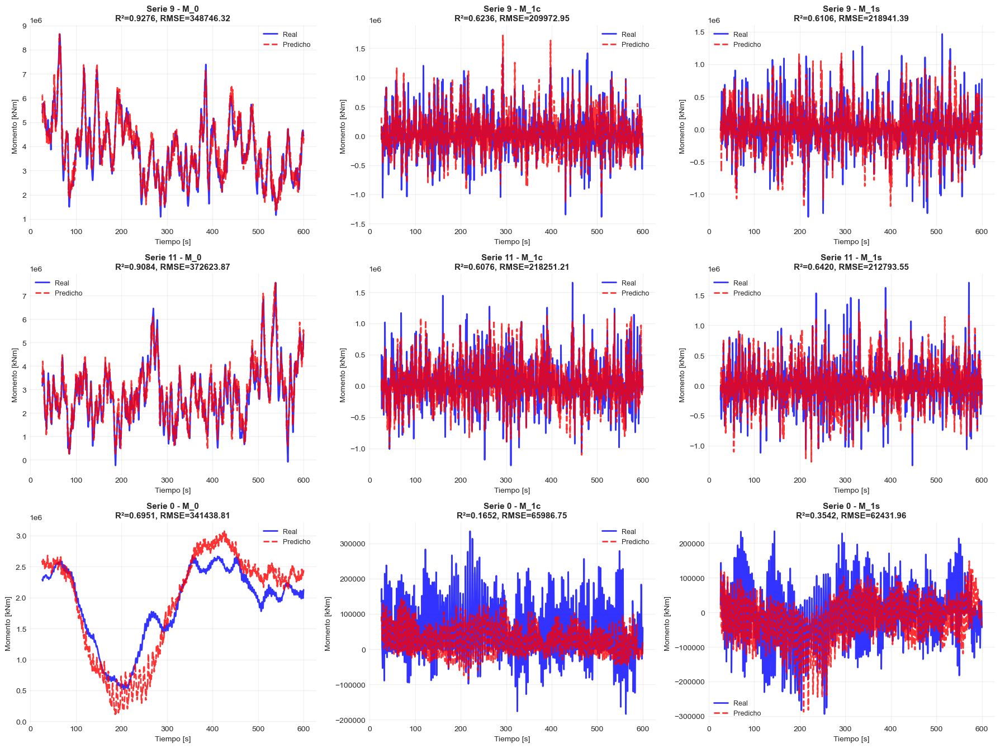

   ✅ Gráfica guardada: timeseries_comparison.png

PASO 4: GRÁFICAS DE TIME SERIES - ZOOM 50 SEGUNDOS

[1/1] Creando gráficas de time series con zoom (50s)...


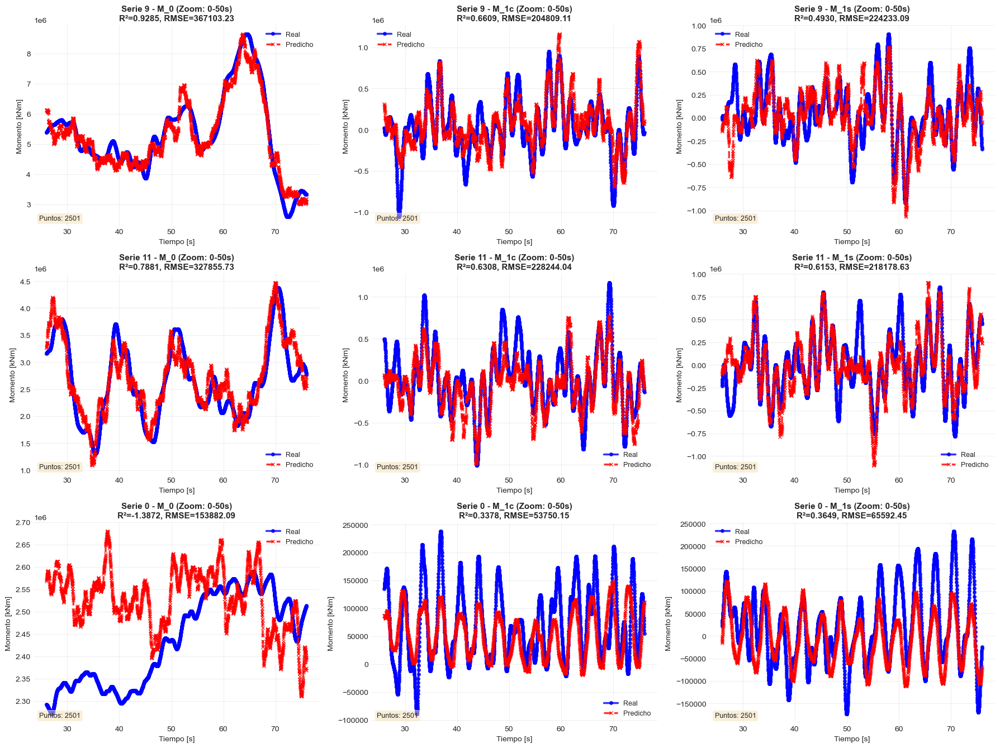

   ✅ Gráfica guardada: timeseries_comparison_zoom50s.png

✅ GRÁFICAS DE TIME SERIES COMPLETADAS

📊 GRÁFICAS GENERADAS:
   • timeseries_comparison.png
   • timeseries_comparison_zoom50s.png

💡 Targets graficados: ['M_0', 'M_1c', 'M_1s']
💡 Series aleatorias: [9, 11, 0]

💡 Ahora tienes todas las gráficas para MLP:
   1. Métricas por target (RMSE y R²)
   2. Predicciones vs Real
   3. Análisis de residuos
   4. Time series completas (3 series aleatorias × 3 targets)
   5. Time series con zoom de 50s

💡 Scalers independientes utilizados correctamente
   • X: Normalización columna por columna (151 scalers)
   • y: Desnormalización columna por columna (3 scalers)


In [23]:
"""
============================================================================
PASO 3: ANÁLISIS DE SERIES TEMPORALES - MODELO MLP
============================================================================

Este script genera gráficos de series temporales comparando las predicciones
del modelo MLP con los valores reales en el conjunto de test.

IMPORTANTE: Adaptado para scalers independientes por columna
- scalers_X.pkl: Diccionario con un scaler por feature
- scalers_y.pkl: Diccionario con un scaler por target

Autor: Adaptado para scalers independientes
Fecha: Enero 2026
============================================================================
"""

# Configuración de matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

# =============================================================================
# CONFIGURACIÓN INICIAL
# =============================================================================

# Directorio raíz del proyecto (ajustar según necesidad)
root_dir = Path(r"C:/Users/aitorredondoruiz/Desktop/2B_energy/__Git/Lidar_My_validation_VLOS")

print("\n" + "="*80)
print("📊 MLP - GRÁFICAS DE TIME SERIES")
print("="*80)

# ------------------------------------------------------------------------
# 1) Cargar Time_test y generar series_id_test
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 1: PREPARAR DATOS PARA TIME SERIES")
print("="*80)

# Directorios
data_ml_folder = root_dir / "notebook" / "02_Data_ML_traditional"
models_folder = root_dir / "notebook" / "03_ML_traditional_models"
scaler_folder = root_dir / "notebook" / "01_Models_scaler"
mlp_folder = models_folder / "MLP"

print(f"\n[1/3] Cargando Time_test desde archivo pkl...")

Time_test_path = data_ml_folder / 'Time_test.pkl'

if Time_test_path.exists():
    Time_test = joblib.load(Time_test_path)
    print(f"   ✅ Time_test cargado: {len(Time_test):,} valores")
    print(f"   • Tiempo mínimo: {Time_test.min():.2f}s")
    print(f"   • Tiempo máximo: {Time_test.max():.2f}s")
else:
    print(f"   ❌ ERROR: No se encontró {Time_test_path}")
    raise FileNotFoundError(f"Archivo requerido no encontrado: {Time_test_path}")

print(f"\n[2/3] Generando series_id_test a partir de Time_test...")

# Detectar inicio de cada serie (cuando Time reinicia, es decir, disminuye)
series_id_test_values = np.zeros(len(Time_test), dtype=int)
current_series = 0

Time_test_array = Time_test.values
for i in range(1, len(Time_test_array)):
    if Time_test_array[i] < Time_test_array[i-1]:
        current_series += 1
    series_id_test_values[i] = current_series

# Convertir a pandas Series con el mismo index que Time_test
series_id_test = pd.Series(series_id_test_values, index=Time_test.index, name='series_id')

n_test_series = series_id_test.max() + 1

print(f"   ✅ Series temporales identificadas en test: {n_test_series}")

# Analizar cada serie
print(f"\n   📊 Resumen de series en TEST:")
for sid in range(min(5, n_test_series)):
    mask = series_id_test == sid
    n_rows = mask.sum()
    time_min = Time_test.loc[mask].min()
    time_max = Time_test.loc[mask].max()
    print(f"      Serie {sid:3d}: {n_rows:6,} filas | Time: {time_min:6.1f}s → {time_max:6.1f}s")

if n_test_series > 5:
    print(f"      ... y {n_test_series - 5} series más")

# ------------------------------------------------------------------------
# 2) Cargar modelo, datos y generar predicciones
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 2: CARGAR MODELO Y GENERAR PREDICCIONES")
print("="*80)

print(f"\n[1/6] Cargando modelo entrenado...")
model_path = mlp_folder / 'mlp_model.pkl'
mlp_model = joblib.load(model_path)
print(f"   ✅ Modelo cargado desde: {model_path.name}")

print(f"\n[2/6] Cargando datos de test originales...")
X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")
print(f"   💡 Targets: {list(y_test.columns)}")

print(f"\n[3/6] Cargando scalers independientes...")
scalers_X = joblib.load(scaler_folder / 'scalers_X.pkl')
scalers_y = joblib.load(scaler_folder / 'scalers_y.pkl')
print(f"   ✅ Scalers independientes cargados:")
print(f"      • scalers_X: {len(scalers_X)} scalers (uno por feature)")
print(f"      • scalers_y: {len(scalers_y)} scalers (uno por target)")

print(f"\n[4/6] Normalizando datos de test con scalers independientes...")
# Normalizar columna por columna
X_test_norm = pd.DataFrame(index=X_test.index, columns=X_test.columns)

for col in X_test.columns:
    if col in scalers_X:
        X_test_norm[col] = scalers_X[col].transform(X_test[[col]])
    else:
        print(f"   ⚠️  Columna {col} no tiene scaler, usando valores originales")
        X_test_norm[col] = X_test[col]

X_test_norm = X_test_norm.astype('float32')
print(f"   ✅ X_test normalizado columna por columna: {X_test_norm.shape}")

print(f"\n[5/6] Generando predicciones...")
y_test_pred_norm = mlp_model.predict(X_test_norm)
y_test_pred_norm = pd.DataFrame(
    y_test_pred_norm,
    index=y_test.index,
    columns=y_test.columns
)
print(f"   ✅ Predicciones generadas (normalizadas): {y_test_pred_norm.shape}")

print(f"\n[6/6] Desnormalizando predicciones con scalers independientes...")
# Desnormalizar columna por columna
y_test_pred = pd.DataFrame(index=y_test_pred_norm.index, columns=y_test_pred_norm.columns)

for col in y_test_pred_norm.columns:
    if col in scalers_y:
        y_test_pred[col] = scalers_y[col].inverse_transform(y_test_pred_norm[[col]])
    else:
        print(f"   ⚠️  Columna {col} no tiene scaler, usando valores normalizados")
        y_test_pred[col] = y_test_pred_norm[col]

print(f"   ✅ Predicciones desnormalizadas columna por columna: {y_test_pred.shape}")

print(f"\n[3/3] Verificando que los datos coinciden con predicciones...")

# Verificar que los índices coinciden
if not all(series_id_test.index == y_test.index):
    print(f"   ⚠️  Ajustando índices para que coincidan...")
    series_id_test = series_id_test.reindex(y_test.index)
    Time_test = Time_test.reindex(y_test.index)

print(f"   ✅ Índices verificados:")
print(f"      • y_test: {y_test.shape[0]:,} filas")
print(f"      • y_test_pred: {y_test_pred.shape[0]:,} filas")
print(f"      • series_id_test: {len(series_id_test):,} valores")
print(f"      • Time_test: {len(Time_test):,} valores")


# ------------------------------------------------------------------------
# 3) Gráfica de time series: Real vs Predicho (3 series aleatorias)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 3: GRÁFICAS DE TIME SERIES - SERIES COMPLETAS")
print("="*80)

print(f"\n[1/1] Creando gráficas de time series (Real vs Predicho)...")

# Obtener series únicas del conjunto de test
unique_test_series = series_id_test.unique()

# Seleccionar 3 series aleatorias
np.random.seed(42)  # Para reproducibilidad
selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

print(f"   • Total series disponibles: {len(unique_test_series)}")
print(f"   • Series seleccionadas para graficar: {selected_series}")

# Detectar número de targets automáticamente
n_targets = len(y_test.columns)
print(f"   • Targets a graficar: {list(y_test.columns)}")

# Crear figura con 3 filas x n_targets columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, n_targets, figsize=(6*n_targets, 13.5))

# Asegurar que axes sea 2D
if n_targets == 1:
    axes = axes.reshape(-1, 1)

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales
        y_real = y_test.loc[series_indices, col]
        # Valores predichos
        y_pred = y_test_pred.loc[series_indices, col]
        
        # Calcular métricas para esta serie y target
        r2_series = r2_score(y_real, y_pred)
        rmse_series = np.sqrt(mean_squared_error(y_real, y_pred))
        
        # Graficar
        ax.plot(time_series, y_real, label='Real', 
                linewidth=2, alpha=0.8, color='blue')
        ax.plot(time_series, y_pred, label='Predicho', 
                linestyle='--', linewidth=2, alpha=0.8, color='red')
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Momento [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)

plt.tight_layout()
timeseries_plot_path = mlp_folder / 'timeseries_comparison.png'
plt.savefig(timeseries_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_plot_path.name}")

# ------------------------------------------------------------------------
# 4) Gráfica de time series con ZOOM (50 segundos)
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("PASO 4: GRÁFICAS DE TIME SERIES - ZOOM 50 SEGUNDOS")
print("="*80)

print(f"\n[1/1] Creando gráficas de time series con zoom (50s)...")

# Crear figura con 3 filas x n_targets columnas (3 series, 3 targets)
fig, axes = plt.subplots(3, n_targets, figsize=(6*n_targets, 13.5))

# Asegurar que axes sea 2D
if n_targets == 1:
    axes = axes.reshape(-1, 1)

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Definir ventana de 50 segundos desde el inicio
    time_min = time_series.min()
    time_max_zoom = time_min + 50
    
    # Filtrar por ventana de tiempo
    zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
    zoom_indices = time_series[zoom_mask].index
    time_zoom = time_series[zoom_mask]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(y_test.columns):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales y predichos (con zoom)
        y_real_zoom = y_test.loc[zoom_indices, col]
        y_pred_zoom = y_test_pred.loc[zoom_indices, col]
        
        # Calcular métricas para esta ventana
        r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
        rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
        
        # Graficar
        ax.plot(time_zoom, y_real_zoom, label='Real', 
                linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
        ax.plot(time_zoom, y_pred_zoom, label='Predicho', 
                linestyle='--', linewidth=2.5, alpha=0.8, color='red', marker='x', markersize=5)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Momento [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\nR²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)
        
        # Añadir texto con información de puntos
        n_points = len(zoom_indices)
        ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
timeseries_zoom_plot_path = mlp_folder / 'timeseries_comparison_zoom50s.png'
plt.savefig(timeseries_zoom_plot_path, dpi=300, bbox_inches='tight')
plt.show()

print(f"   ✅ Gráfica guardada: {timeseries_zoom_plot_path.name}")

# ------------------------------------------------------------------------
# RESUMEN FINAL
# ------------------------------------------------------------------------
print(f"\n{'='*80}")
print("✅ GRÁFICAS DE TIME SERIES COMPLETADAS")
print("="*80)

print(f"\n📊 GRÁFICAS GENERADAS:")
print(f"   • {timeseries_plot_path.name}")
print(f"   • {timeseries_zoom_plot_path.name}")

print(f"\n💡 Targets graficados: {list(y_test.columns)}")
print(f"💡 Series aleatorias: {list(selected_series)}")

print(f"\n💡 Ahora tienes todas las gráficas para MLP:")
print(f"   1. Métricas por target (RMSE y R²)")
print(f"   2. Predicciones vs Real")
print(f"   3. Análisis de residuos")
print(f"   4. Time series completas (3 series aleatorias × {n_targets} targets)")
print(f"   5. Time series con zoom de 50s")

print(f"\n💡 Scalers independientes utilizados correctamente")
print(f"   • X: Normalización columna por columna ({len(scalers_X)} scalers)")
print(f"   • y: Desnormalización columna por columna ({len(scalers_y)} scalers)")

print("="*80)


## 🔄 ESTRUCTURA DEL PASO 5 (DIVIDIDO EN SUB-PASOS)

### **PASO 5.1: VALIDACIÓN EN CONJUNTO DE TEST** (Este script)
Genera gráficos individuales para cada modelo evaluando su desempeño en test:

1. **Scatter Plots** (Predicciones vs Reales)
   - Visualiza qué tan cerca están las predicciones de los valores reales
   - Línea de predicción perfecta (y=x) como referencia
   - Un gráfico por modelo con 2 subplots (uno por cada target/pala)
   - Métricas: R², RMSE, MAE

2. **Gráficos de Residuos** (Predicho vs Residuo)
   - Analiza la distribución de errores del modelo
   - Detecta patrones sistemáticos (sesgo, heterocedasticidad)
   - Líneas de referencia: residuo=0 y ±2σ
   - Idealmente: residuos centrados en 0 sin patrones

3. **Histogramas de Residuos**
   - Evalúa si los residuos siguen una distribución normal
   - Compara con curva normal teórica
   - Detecta asimetrías o colas pesadas
   - Validación de supuestos del modelo

---

### **PASO 5.2: COMPARACIÓN VISUAL CONJUNTA** (Próximo script)
Gráficos que muestran todos los modelos juntos para comparación directa:
- Scatter plots lado a lado (grid de comparación)
- Gráficos de barras comparando métricas (RMSE, R², MAE)
- Box plots de residuos por modelo
- Ranking visual de modelos

---

### **PASO 5.3: COMPARACIÓN EN SERIES TEMPORALES** (Próximo script)
Análisis del comportamiento temporal de cada modelo:
- Time series: Real vs Predicciones de todos los modelos
- Comparación en ventanas de 50 segundos (zoom)
- Identificación de modelos más estables temporalmente

---

### **PASO 5.4: COMPARACIÓN CON BASELINE 1P** (Próximo script)
Evaluación de todos los modelos vs baseline físico:
- Comparación de métricas: Modelos ML vs Baseline 1P
- Análisis de mejora porcentual respecto al baseline
- Identificación del modelo con mejor mejora

---

### **PASO 5.5: RESUMEN Y RECOMENDACIONES** (Próximo script)
Tabla final y recomendaciones:
- Tabla comparativa consolidada con todas las métricas
- Análisis de trade-offs (precisión vs complejidad vs tiempo)
- Recomendación del mejor modelo según caso de uso
- Exportación de resultados a CSV/Excel

---

## 📁 ESTRUCTURA DE SALIDA

Todos los gráficos y resultados se almacenan en:
```
notebook/04_ML_all_models/
├── scatter_ridge.png
├── scatter_randomforest.png
├── scatter_xgboost.png
├── scatter_mlp.png
├── residuals_ridge.png
├── residuals_randomforest.png
├── residuals_xgboost.png
├── residuals_mlp.png
├── histogram_residuals_ridge.png
├── histogram_residuals_randomforest.png
├── histogram_residuals_xgboost.png
├── histogram_residuals_mlp.png
└── (más gráficos en pasos siguientes...)
```


In [34]:
################### PASO 5.1: COMPARACIÓN DE TODOS LOS MODELOS - VALIDACIÓN EN TEST ####################

import sys
from pathlib import Path
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import r2_score, mean_squared_error

# Configuración
import warnings
warnings.filterwarnings('ignore')

# Configuración de matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

print("\n" + "="*80)
print("📊 COMPARACIÓN DE TODOS LOS MODELOS - VALIDACIÓN EN TEST")
print("="*80)
print(f"📅 Fecha: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

# ============================================================================
# 1. DETECTAR MODELOS DISPONIBLES
# ============================================================================
print(f"\n{'='*80}")
print("PASO 1: DETECTAR MODELOS DISPONIBLES")
print("="*80)

# Directorio raíz del proyecto
models_folder = root_dir / "notebook" / "03_ML_traditional_models"
data_ml_folder = root_dir / "notebook" / "02_Data_ML_traditional"
scaler_folder = root_dir / "notebook" / "01_Models_scaler"

# Crear carpeta para comparación de todos los modelos
comparison_folder = root_dir / "notebook" / "04_ML_all_models"
comparison_folder.mkdir(parents=True, exist_ok=True)

print(f"\n[1/3] Detectando carpetas de modelos en: {models_folder}")

# Detectar todas las carpetas (excluir archivos .pkl sueltos)
model_folders = [f for f in models_folder.iterdir() if f.is_dir()]
model_names = [f.name for f in model_folders]

print(f"   ✅ Carpetas detectadas: {len(model_folders)}")
for name in model_names:
    print(f"      • {name}")

print(f"\n[2/3] Mapeando nombres de carpetas a archivos de modelos...")

# Mapeo de carpetas a archivos de modelo
model_mapping = {
    'Linear_Ridge': 'ridge_model.pkl',
    'Random_Forest': 'random_forest_model.pkl',
    'XGBoost': 'xgboost_model.pkl',
    'MLP': 'mlp_model.pkl'
}

# Detectar qué modelos existen
available_models = {}
for folder_name, model_file in model_mapping.items():
    model_path = models_folder / folder_name / model_file
    if model_path.exists():
        available_models[folder_name] = model_path
        print(f"   ✅ {folder_name}: {model_file}")
    else:
        print(f"   ⚠️  {folder_name}: {model_file} NO encontrado")

if len(available_models) == 0:
    print(f"\n   ❌ ERROR: No se encontraron modelos entrenados")
    sys.exit(1)

print(f"\n[3/3] Resumen de modelos disponibles:")
print(f"   • Total modelos a comparar: {len(available_models)}")
print(f"   • Carpeta de resultados: {comparison_folder}")

# ============================================================================
# 2. CARGAR DATOS DE TEST Y SCALERS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 2: CARGAR DATOS DE TEST Y SCALERS")
print("="*80)

print(f"\n[1/3] Cargando datos de test originales...")
X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")
print(f"   ✅ Targets: {list(y_test.columns)}")

print(f"\n[2/3] Cargando scalers...")
scaler_X = joblib.load(scaler_folder / 'scaler_X.pkl')
scaler_y = joblib.load(scaler_folder / 'scaler_y.pkl')
print(f"   ✅ Scalers cargados")

print(f"\n[3/3] Normalizando datos de test...")
X_test_norm = pd.DataFrame(
    scaler_X.transform(X_test),
    index=X_test.index,
    columns=X_test.columns
)
print(f"   ✅ X_test normalizado: {X_test_norm.shape}")

target_names = y_test.columns

# ============================================================================
# 3. CARGAR MODELOS Y GENERAR PREDICCIONES
# ============================================================================
print(f"\n{'='*80}")
print("PASO 3: CARGAR MODELOS Y GENERAR PREDICCIONES")
print("="*80)

# Diccionario para almacenar predicciones y métricas
predictions = {}
metrics = {}

for idx, (model_name, model_path) in enumerate(available_models.items(), 1):
    print(f"\n[{idx}/{len(available_models)}] Procesando modelo: {model_name}")
    
    try:
        # Cargar modelo
        model = joblib.load(model_path)
        print(f"   ✅ Modelo cargado desde: {model_path.name}")
        
        # Generar predicciones normalizadas
        y_test_pred_norm = model.predict(X_test_norm)
        
        # Convertir a DataFrame si es necesario
        if not isinstance(y_test_pred_norm, pd.DataFrame):
            y_test_pred_norm = pd.DataFrame(
                y_test_pred_norm,
                index=y_test.index,
                columns=y_test.columns
            )
        
        # Desnormalizar predicciones
        y_test_pred = pd.DataFrame(
            scaler_y.inverse_transform(y_test_pred_norm),
            index=y_test_pred_norm.index,
            columns=y_test_pred_norm.columns
        )
        
        print(f"   ✅ Predicciones generadas: {y_test_pred.shape}")
        
        # Guardar predicciones
        predictions[model_name] = y_test_pred
        
        # Calcular métricas para cada target
        model_metrics = {}
        for col in target_names:
            rmse = np.sqrt(mean_squared_error(y_test[col], y_test_pred[col]))
            r2 = r2_score(y_test[col], y_test_pred[col])
            mae = np.mean(np.abs(y_test[col] - y_test_pred[col]))
            model_metrics[col] = {'RMSE': rmse, 'R2': r2, 'MAE': mae}
            
        metrics[model_name] = model_metrics
        
        # Mostrar métricas
        print(f"   📊 Métricas en TEST:")
        for col in target_names:
            print(f"      {col}:")
            print(f"         • RMSE: {model_metrics[col]['RMSE']:.2f}")
            print(f"         • R²:   {model_metrics[col]['R2']:.4f}")
            print(f"         • MAE:  {model_metrics[col]['MAE']:.2f}")
        
    except Exception as e:
        print(f"   ❌ Error procesando {model_name}: {e}")
        continue

print(f"\n{'='*80}")
print(f"✅ Predicciones completadas para {len(predictions)} modelos")
print("="*80)

# ============================================================================
# DEFINIR COLORES CONSISTENTES PARA CADA MODELO
# ============================================================================
# Cada modelo tiene un color único y bien diferenciado
model_colors = {
    'Ridge': '#3498db',           # Azul brillante
    'RandomForest': "#28df10",    # Verde esmeralda
    'XGBoost': '#eef11a',         # Naranja
    'MLP': '#e74c3c'              # Rojo
}

# Asegurar que todos los modelos tienen un color asignado
available_colors = ['#3498db', '#28df10', "#eef11a", '#e74c3c']
color_idx = 0

for model_name in predictions.keys():
    if model_name not in model_colors:
        # Asignar color único si no está en el diccionario
        model_colors[model_name] = available_colors[color_idx % len(available_colors)]
        color_idx += 1

print(f"\n📊 Colores asignados a cada modelo (colores únicos y diferenciados):")
for model_name, color in model_colors.items():
    if model_name in predictions:
        print(f"   • {model_name}: {color}")

# ============================================================================
# 4. GRÁFICO 1: SCATTER PLOTS (Predicciones vs Reales)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 4: SCATTER PLOTS - PREDICCIONES VS REALES")
print("="*80)

print(f"\n   Creando scatter plots para cada modelo...")

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando scatter plot...")
    
    # Crear figura con 1 fila x 2 columnas (2 targets)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    for idx, col in enumerate(target_names):
        ax = axes[idx]
        
        # Valores reales vs predichos
        y_real = y_test[col]
        y_pred_col = y_pred[col]
        
        # Métricas
        r2 = metrics[model_name][col]['R2']
        rmse = metrics[model_name][col]['RMSE']
        mae = metrics[model_name][col]['MAE']
        
        # Scatter plot
        ax.scatter(y_real, y_pred_col, alpha=0.3, s=2, color=model_colors[model_name], edgecolors='none')
        
        # Línea de predicción perfecta (y=x)
        min_val = min(y_real.min(), y_pred_col.min())
        max_val = max(y_real.max(), y_pred_col.max())
        ax.plot([min_val, max_val], [min_val, max_val], 
                'r--', linewidth=2, alpha=0.7, label='Predicción perfecta (y=x)')
        
        # Configuración
        ax.set_xlabel('Valores Reales [kNm]', fontsize=11, fontweight='bold')
        ax.set_ylabel('Valores Predichos [kNm]', fontsize=11, fontweight='bold')
        ax.set_title(f'{col}\nR²={r2:.4f} | RMSE={rmse:.2f} | MAE={mae:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal', adjustable='box')
    
    # Título general
    fig.suptitle(f'SCATTER PLOTS - {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    
    # Guardar
    scatter_path = comparison_folder / f'scatter_{model_name.lower()}.png'
    plt.savefig(scatter_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {scatter_path.name}")

# ============================================================================
# 5. GRÁFICO 2: RESIDUOS (Predicho vs Residuo)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 5: GRÁFICOS DE RESIDUOS")
print("="*80)

print(f"\n   Creando gráficos de residuos para cada modelo...")

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando gráfico de residuos...")
    
    # Crear figura con 1 fila x 2 columnas (2 targets)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    for idx, col in enumerate(target_names):
        ax = axes[idx]
        
        # Calcular residuos
        residuals = y_test[col] - y_pred[col]
        
        # Estadísticas de residuos
        mean_res = residuals.mean()
        std_res = residuals.std()
        
        # Scatter plot de residuos
        ax.scatter(y_pred[col], residuals, alpha=0.3, s=2, color=model_colors[model_name], edgecolors='none')
        
        # Línea horizontal en y=0
        ax.axhline(y=0, color='red', linestyle='--', linewidth=2, alpha=0.7, label='Residuo = 0')
        
        # Líneas de ±2σ
        ax.axhline(y=2*std_res, color='gray', linestyle=':', linewidth=1.5, alpha=0.5, label=f'±2σ')
        ax.axhline(y=-2*std_res, color='gray', linestyle=':', linewidth=1.5, alpha=0.5)
        
        # Configuración
        ax.set_xlabel('Valores Predichos [kNm]', fontsize=11, fontweight='bold')
        ax.set_ylabel('Residuos (Real - Predicho) [kNm]', fontsize=11, fontweight='bold')
        ax.set_title(f'{col}\nMedia={mean_res:.2f} | σ={std_res:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3)
    
    # Título general
    fig.suptitle(f'ANÁLISIS DE RESIDUOS - {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    
    # Guardar
    residuals_path = comparison_folder / f'residuals_{model_name.lower()}.png'
    plt.savefig(residuals_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {residuals_path.name}")

# ============================================================================
# 6. GRÁFICO 3: HISTOGRAMAS DE RESIDUOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 6: HISTOGRAMAS DE RESIDUOS")
print("="*80)

print(f"\n   Creando histogramas de residuos para cada modelo...")

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando histograma de residuos...")
    
    # Crear figura con 1 fila x 2 columnas (2 targets)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    for idx, col in enumerate(target_names):
        ax = axes[idx]
        
        # Calcular residuos
        residuals = y_test[col] - y_pred[col]
        
        # Estadísticas
        mean_res = residuals.mean()
        std_res = residuals.std()
        
        # Histograma
        n, bins, patches = ax.hist(residuals, bins=50, alpha=0.7, color=model_colors[model_name], 
                                     edgecolor='black', density=True, label=model_name)
        
        # Curva normal teórica
        from scipy import stats
        xmin, xmax = ax.get_xlim()
        x = np.linspace(xmin, xmax, 100)
        p = stats.norm.pdf(x, mean_res, std_res)
        ax.plot(x, p, 'r-', linewidth=2, label=f'Normal(μ={mean_res:.2f}, σ={std_res:.2f})')
        
        # Línea vertical en la media
        ax.axvline(mean_res, color='green', linestyle='--', linewidth=2, 
                   alpha=0.7, label=f'Media: {mean_res:.2f}')
        
        # Configuración
        ax.set_xlabel('Residuos (Real - Predicho) [kNm]', fontsize=11, fontweight='bold')
        ax.set_ylabel('Densidad', fontsize=11, fontweight='bold')
        ax.set_title(f'{col}\nμ={mean_res:.2f} | σ={std_res:.2f}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(True, alpha=0.3, axis='y')
    
    # Título general
    fig.suptitle(f'HISTOGRAMA DE RESIDUOS - {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    
    # Guardar
    hist_path = comparison_folder / f'histogram_residuals_{model_name.lower()}.png'
    plt.savefig(hist_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {hist_path.name}")

# ============================================================================
# 7. GRÁFICO CONJUNTO 1: SCATTER PLOTS - TODOS LOS MODELOS JUNTOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 7: SCATTER PLOTS CONJUNTOS - COMPARACIÓN DIRECTA")
print("="*80)

print(f"\n   Creando scatter plots con todos los modelos en un solo gráfico...")

# Crear figura con 1 fila x 2 columnas (2 targets)
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for idx, col in enumerate(target_names):
    ax = axes[idx]
    
    # Línea de predicción perfecta (y=x) primero
    all_real = y_test[col]
    min_val = all_real.min()
    max_val = all_real.max()
    
    # Extender un poco los límites para mejor visualización
    for model_name, y_pred in predictions.items():
        min_val = min(min_val, y_pred[col].min())
        max_val = max(max_val, y_pred[col].max())
    
    ax.plot([min_val, max_val], [min_val, max_val], 
            'k--', linewidth=2.5, alpha=0.7, label='Predicción perfecta (y=x)', zorder=10)
    
    # Graficar cada modelo
    for model_name, y_pred in predictions.items():
        y_real = y_test[col]
        y_pred_col = y_pred[col]
        
        # Métricas
        r2 = metrics[model_name][col]['R2']
        
        # Scatter plot con transparencia
        ax.scatter(y_real, y_pred_col, alpha=0.3, s=3, 
                  color=model_colors[model_name], edgecolors='none',
                  label=f'{model_name} (R²={r2:.4f})')
    
    # Configuración
    ax.set_xlabel('Valores Reales [kNm]', fontsize=12, fontweight='bold')
    ax.set_ylabel('Valores Predichos [kNm]', fontsize=12, fontweight='bold')
    ax.set_title(f'{col}', fontsize=13, fontweight='bold')
    ax.legend(loc='best', fontsize=9, framealpha=0.9)
    ax.grid(True, alpha=0.3)
    ax.set_aspect('equal', adjustable='box')

# Título general
fig.suptitle('SCATTER PLOTS - COMPARACIÓN DE TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.02)

plt.tight_layout()

# Guardar
scatter_all_path = comparison_folder / 'scatter_all_models_combined.png'
plt.savefig(scatter_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {scatter_all_path.name}")

# ============================================================================
# 8. GRÁFICO CONJUNTO 2: RESIDUOS - TODOS LOS MODELOS JUNTOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 8: GRÁFICOS DE RESIDUOS CONJUNTOS - COMPARACIÓN DIRECTA")
print("="*80)

print(f"\n   Creando gráficos de residuos con todos los modelos en un solo gráfico...")

# Crear figura con 1 fila x 2 columnas (2 targets)
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for idx, col in enumerate(target_names):
    ax = axes[idx]
    
    # Línea horizontal en y=0
    ax.axhline(y=0, color='black', linestyle='--', linewidth=2.5, alpha=0.7, 
               label='Residuo = 0', zorder=10)
    
    # Graficar cada modelo
    for model_name, y_pred in predictions.items():
        # Calcular residuos
        residuals = y_test[col] - y_pred[col]
        
        # Scatter plot con transparencia
        ax.scatter(y_pred[col], residuals, alpha=0.3, s=3, 
                  color=model_colors[model_name], edgecolors='none',
                  label=f'{model_name} (σ={residuals.std():.2f})')
    
    # Configuración
    ax.set_xlabel('Valores Predichos [kNm]', fontsize=12, fontweight='bold')
    ax.set_ylabel('Residuos (Real - Predicho) [kNm]', fontsize=12, fontweight='bold')
    ax.set_title(f'{col}', fontsize=13, fontweight='bold')
    ax.legend(loc='best', fontsize=9, framealpha=0.9)
    ax.grid(True, alpha=0.3)

# Título general
fig.suptitle('ANÁLISIS DE RESIDUOS - COMPARACIÓN DE TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.02)

plt.tight_layout()

# Guardar
residuals_all_path = comparison_folder / 'residuals_all_models_combined.png'
plt.savefig(residuals_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {residuals_all_path.name}")

# ============================================================================
# 9. GRÁFICO CONJUNTO 3: HISTOGRAMAS - TODOS LOS MODELOS JUNTOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 9: HISTOGRAMAS DE RESIDUOS CONJUNTOS - COMPARACIÓN DIRECTA")
print("="*80)

print(f"\n   Creando histogramas con todos los modelos en un solo gráfico...")

# Crear figura con 1 fila x 2 columnas (2 targets)
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for idx, col in enumerate(target_names):
    ax = axes[idx]
    
    # Graficar histograma de cada modelo
    for model_name, y_pred in predictions.items():
        # Calcular residuos
        residuals = y_test[col] - y_pred[col]
        
        # Histograma con transparencia para que se vean todos
        ax.hist(residuals, bins=50, alpha=0.5, color=model_colors[model_name], 
                edgecolor='black', density=True, label=f'{model_name} (μ={residuals.mean():.2f})')
    
    # Línea vertical en x=0
    ax.axvline(0, color='black', linestyle='--', linewidth=2, 
               alpha=0.7, label='Media ideal = 0')
    
    # Configuración
    ax.set_xlabel('Residuos (Real - Predicho) [kNm]', fontsize=12, fontweight='bold')
    ax.set_ylabel('Densidad', fontsize=12, fontweight='bold')
    ax.set_title(f'{col}', fontsize=13, fontweight='bold')
    ax.legend(loc='best', fontsize=9, framealpha=0.9)
    ax.grid(True, alpha=0.3, axis='y')

# Título general
fig.suptitle('HISTOGRAMAS DE RESIDUOS - COMPARACIÓN DE TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.02)

plt.tight_layout()

# Guardar
hist_all_path = comparison_folder / 'histogram_residuals_all_models_combined.png'
plt.savefig(hist_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {hist_all_path.name}")

# ============================================================================
# RESUMEN FINAL
# ============================================================================
print(f"\n{'='*80}")
print("✅ VALIDACIÓN DE TODOS LOS MODELOS COMPLETADA")
print("="*80)

print(f"\n📊 MODELOS COMPARADOS: {len(predictions)}")
for model_name in predictions.keys():
    print(f"   • {model_name}")

print(f"\n📈 RESUMEN DE MÉTRICAS (PROMEDIO POR MODELO):")
print(f"\n{'MODELO':20} {'RMSE PROMEDIO':>20} {'R² PROMEDIO':>15} {'MAE PROMEDIO':>15}")
print(f"{'─'*20} {'─'*20} {'─'*15} {'─'*15}")

for model_name in sorted(predictions.keys()):
    avg_rmse = np.mean([metrics[model_name][col]['RMSE'] for col in target_names])
    avg_r2 = np.mean([metrics[model_name][col]['R2'] for col in target_names])
    avg_mae = np.mean([metrics[model_name][col]['MAE'] for col in target_names])
    print(f"{model_name:20} {avg_rmse:>20.2f} {avg_r2:>15.4f} {avg_mae:>15.2f}")

print(f"\n💾 GRÁFICOS GENERADOS EN: {comparison_folder}")
print(f"   • Scatter plots individuales: {len(predictions)} archivos")
print(f"   • Gráficos de residuos individuales: {len(predictions)} archivos")
print(f"   • Histogramas de residuos individuales: {len(predictions)} archivos")
print(f"   • Scatter plot conjunto: 1 archivo")
print(f"   • Gráfico de residuos conjunto: 1 archivo")
print(f"   • Histograma conjunto: 1 archivo")
print(f"   • TOTAL: {len(predictions) * 3 + 3} gráficos")

print(f"\n🎯 SIGUIENTE PASO:")
print(f"   Paso 5.2: Comparación visual conjunta de todos los modelos")
print(f"   (Scatter plots lado a lado, métricas comparativas, etc.)")

print("\n" + "="*80)




📊 COMPARACIÓN DE TODOS LOS MODELOS - VALIDACIÓN EN TEST
📅 Fecha: 2026-01-08 15:09:29

PASO 1: DETECTAR MODELOS DISPONIBLES

[1/3] Detectando carpetas de modelos en: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\03_ML_traditional_models
   ✅ Carpetas detectadas: 4
      • Linear_Ridge
      • MLP
      • Random_Forest
      • XGBoost

[2/3] Mapeando nombres de carpetas a archivos de modelos...
   ✅ Linear_Ridge: ridge_model.pkl
   ✅ Random_Forest: random_forest_model.pkl
   ✅ XGBoost: xgboost_model.pkl
   ✅ MLP: mlp_model.pkl

[3/3] Resumen de modelos disponibles:
   • Total modelos a comparar: 4
   • Carpeta de resultados: c:\Users\aitorredondoruiz\Desktop\2B_energy\__Git\Lidar_My_validation_VLOS\notebook\04_ML_all_models

PASO 2: CARGAR DATOS DE TEST Y SCALERS

[1/3] Cargando datos de test originales...
   ✅ X_test: (431265, 181)
   ✅ y_test: (431265, 2)
   ✅ Targets: ['Blade root 1 My', 'Blade root 2 My']

[2/3] Cargando scalers...
   ✅ Scalers 

In [40]:
"""
============================================================================
PASO 5.2: COMPARACIÓN DE TODOS LOS MODELOS - SERIES TEMPORALES
============================================================================

Este script compara el comportamiento temporal de TODOS los modelos de ML:
- Ridge
- Random Forest
- XGBoost
- MLP

Genera gráficos de series temporales mostrando:
- Series completas: Real vs Predicciones de cada modelo
- Zoom 50 segundos: Detalle de los primeros 50 segundos
- Gráficos individuales por modelo
- Gráficos conjuntos con todos los modelos superpuestos

Autor: [Tu nombre]
Fecha: 2026-01-08
============================================================================
"""

import sys
from pathlib import Path
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import r2_score, mean_squared_error

# Configuración
import warnings
warnings.filterwarnings('ignore')

# Configuración de matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

print("\n" + "="*80)
print("📊 COMPARACIÓN DE TODOS LOS MODELOS - SERIES TEMPORALES")
print("="*80)
print(f"📅 Fecha: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

# ============================================================================
# 1. CONFIGURACIÓN Y DETECCIÓN DE MODELOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 1: CONFIGURACIÓN Y DETECCIÓN DE MODELOS")
print("="*80)

# Directorio raíz del proyecto
models_folder = root_dir / "notebook" / "03_ML_traditional_models"
data_ml_folder = root_dir / "notebook" / "02_Data_ML_traditional"
scaler_folder = root_dir / "notebook" / "01_Models_scaler"
comparison_folder = root_dir / "notebook" / "04_ML_all_models"

print(f"\n[1/2] Detectando modelos disponibles...")

# Mapeo de carpetas a archivos de modelo
model_mapping = {
    'Linear_Ridge': 'ridge_model.pkl',
    'Random_Forest': 'random_forest_model.pkl',
    'XGBoost': 'xgboost_model.pkl',
    'MLP': 'mlp_model.pkl'
}

# Detectar qué modelos existen
available_models = {}
for folder_name, model_file in model_mapping.items():
    model_path = models_folder / folder_name / model_file
    if model_path.exists():
        available_models[folder_name] = model_path
        print(f"   ✅ {folder_name}: {model_file}")

if len(available_models) == 0:
    print(f"\n   ❌ ERROR: No se encontraron modelos entrenados")
    sys.exit(1)

print(f"\n[2/2] Definiendo colores únicos para cada modelo...")

# Colores consistentes (iguales que en validación)
model_colors = {
    'Linear_Ridge': '#3498db',           # Azul brillante
    'Random_Forest': "#28df10",    # Verde esmeralda
    'XGBoost': '#eef11a',         # Naranja
    'MLP': '#e74c3c'              # Rojo
}

# Asegurar que todos los modelos tienen un color asignado
available_colors = ['#3498db', '#28df10', "#eef11a", '#e74c3c']

for model_name in available_models.keys():
    print(f"   • {model_name}: {model_colors[model_name]}")

# ============================================================================
# 2. CARGAR TIME_TEST Y GENERAR SERIES_ID_TEST
# ============================================================================
print(f"\n{'='*80}")
print("PASO 2: PREPARAR DATOS PARA TIME SERIES")
print("="*80)

print(f"\n[1/3] Cargando Time_test desde archivo pkl...")

Time_test_path = data_ml_folder / 'Time_test.pkl'

if Time_test_path.exists():
    Time_test = joblib.load(Time_test_path)
    print(f"   ✅ Time_test cargado: {len(Time_test):,} valores")
    print(f"   • Tiempo mínimo: {Time_test.min():.2f}s")
    print(f"   • Tiempo máximo: {Time_test.max():.2f}s")
else:
    print(f"   ❌ ERROR: No se encontró {Time_test_path}")
    raise FileNotFoundError(f"Archivo requerido no encontrado: {Time_test_path}")

print(f"\n[2/3] Generando series_id_test a partir de Time_test...")

# Detectar inicio de cada serie (cuando Time reinicia, es decir, disminuye)
series_id_test_values = np.zeros(len(Time_test), dtype=int)
current_series = 0

Time_test_array = Time_test.values
for i in range(1, len(Time_test_array)):
    if Time_test_array[i] < Time_test_array[i-1]:
        current_series += 1
    series_id_test_values[i] = current_series

# Convertir a pandas Series con el mismo index que Time_test
series_id_test = pd.Series(series_id_test_values, index=Time_test.index, name='series_id')

n_test_series = series_id_test.max() + 1

print(f"   ✅ Series temporales identificadas en test: {n_test_series}")

# Analizar cada serie
print(f"\n   📊 Resumen de series en TEST:")
for sid in range(min(5, n_test_series)):
    mask = series_id_test == sid
    n_rows = mask.sum()
    time_min = Time_test.loc[mask].min()
    time_max = Time_test.loc[mask].max()
    print(f"      Serie {sid:3d}: {n_rows:6,} filas | Time: {time_min:6.1f}s → {time_max:6.1f}s")

if n_test_series > 5:
    print(f"      ... y {n_test_series - 5} series más")

print(f"\n[3/3] Cargando datos de test...")

X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")

# Verificar índices
if not all(series_id_test.index == y_test.index):
    print(f"   ⚠️  Ajustando índices para que coincidan...")
    series_id_test = series_id_test.reindex(y_test.index)
    Time_test = Time_test.reindex(y_test.index)

print(f"   ✅ Índices verificados")

target_names = y_test.columns

# ============================================================================
# 3. CARGAR SCALERS Y GENERAR PREDICCIONES PARA TODOS LOS MODELOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 3: CARGAR MODELOS Y GENERAR PREDICCIONES")
print("="*80)

print(f"\n[1/2] Cargando scalers...")
scaler_X = joblib.load(scaler_folder / 'scaler_X.pkl')
scaler_y = joblib.load(scaler_folder / 'scaler_y.pkl')
print(f"   ✅ Scalers cargados")

print(f"\n[2/2] Normalizando datos de test...")
X_test_norm = pd.DataFrame(
    scaler_X.transform(X_test),
    index=X_test.index,
    columns=X_test.columns
)
print(f"   ✅ X_test normalizado: {X_test_norm.shape}")

# Diccionario para almacenar predicciones
predictions = {}

for idx, (model_name, model_path) in enumerate(available_models.items(), 1):
    print(f"\n   [{idx}/{len(available_models)}] Procesando modelo: {model_name}")
    
    try:
        # Cargar modelo
        model = joblib.load(model_path)
        
        # Generar predicciones normalizadas
        y_test_pred_norm = model.predict(X_test_norm)
        
        # Convertir a DataFrame si es necesario
        if not isinstance(y_test_pred_norm, pd.DataFrame):
            y_test_pred_norm = pd.DataFrame(
                y_test_pred_norm,
                index=y_test.index,
                columns=y_test.columns
            )
        
        # Desnormalizar predicciones
        y_test_pred = pd.DataFrame(
            scaler_y.inverse_transform(y_test_pred_norm),
            index=y_test_pred_norm.index,
            columns=y_test_pred_norm.columns
        )
        
        predictions[model_name] = y_test_pred
        print(f"      ✅ Predicciones generadas: {y_test_pred.shape}")
        
    except Exception as e:
        print(f"      ❌ Error: {e}")
        continue

# ============================================================================
# 4. SELECCIONAR SERIES PARA VISUALIZAR
# ============================================================================
print(f"\n{'='*80}")
print("PASO 4: SELECCIONAR SERIES PARA VISUALIZAR")
print("="*80)

# Obtener series únicas del conjunto de test
unique_test_series = series_id_test.unique()

# Seleccionar 3 series aleatorias
np.random.seed(42)  # Para reproducibilidad
selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

print(f"\n   • Total series disponibles: {len(unique_test_series)}")
print(f"   • Series seleccionadas para graficar: {selected_series}")

# ============================================================================
# 5. GRÁFICOS INDIVIDUALES: SERIES COMPLETAS POR MODELO
# ============================================================================
print(f"\n{'='*80}")
print("PASO 5: GRÁFICOS INDIVIDUALES - SERIES COMPLETAS")
print("="*80)

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando gráfico de series completas...")
    
    # Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
    fig, axes = plt.subplots(3, 2, figsize=(18, 14))
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Para cada target, graficar en subplot separado
        for target_idx, col in enumerate(target_names):
            ax = axes[plot_idx, target_idx]
            
            # Valores reales y predichos
            y_real = y_test.loc[series_indices, col]
            y_pred_col = y_pred.loc[series_indices, col]
            
            # Calcular métricas para esta serie y target
            r2_series = r2_score(y_real, y_pred_col)
            rmse_series = np.sqrt(mean_squared_error(y_real, y_pred_col))
            
            # Graficar
            ax.plot(time_series, y_real, label='Real', 
                    linewidth=2, alpha=0.8, color='blue')
            ax.plot(time_series, y_pred_col, label=f'Predicho ({model_name})', 
                    linestyle='--', linewidth=2, alpha=0.8, color=model_colors[model_name])
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Carga [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col}\nR²={r2_series:.4f}, RMSE={rmse_series:.2f}', 
                         fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
    
    # Título general
    fig.suptitle(f'TIME SERIES COMPLETAS - {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.0)
    
    plt.tight_layout()
    
    # Guardar
    timeseries_path = comparison_folder / f'timeseries_{model_name.lower()}.png'
    plt.savefig(timeseries_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {timeseries_path.name}")

# ============================================================================
# 6. GRÁFICOS INDIVIDUALES: ZOOM 50 SEGUNDOS POR MODELO
# ============================================================================
print(f"\n{'='*80}")
print("PASO 6: GRÁFICOS INDIVIDUALES - ZOOM 50 SEGUNDOS")
print("="*80)

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando gráfico con zoom...")
    
    # Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
    fig, axes = plt.subplots(3, 2, figsize=(18, 14))
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Definir ventana de 50 segundos desde el inicio
        time_min = time_series.min()
        time_max_zoom = time_min + 50
        
        # Filtrar por ventana de tiempo
        zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
        zoom_indices = time_series[zoom_mask].index
        time_zoom = time_series[zoom_mask]
        
        # Para cada target, graficar en subplot separado
        for target_idx, col in enumerate(target_names):
            ax = axes[plot_idx, target_idx]
            
            # Valores reales y predichos (con zoom)
            y_real_zoom = y_test.loc[zoom_indices, col]
            y_pred_zoom = y_pred.loc[zoom_indices, col]
            
            # Calcular métricas para esta ventana
            r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
            rmse_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
            
            # Graficar
            ax.plot(time_zoom, y_real_zoom, label='Real', 
                    linewidth=2.5, alpha=0.8, color='blue', marker='o', markersize=4)
            ax.plot(time_zoom, y_pred_zoom, label=f'Predicho ({model_name})', 
                    linestyle='--', linewidth=2.5, alpha=0.8, color=model_colors[model_name], 
                    marker='x', markersize=5)
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Carga [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\nR²={r2_zoom:.4f}, RMSE={rmse_zoom:.2f}', 
                         fontsize=11, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Añadir texto con información de puntos
            n_points = len(zoom_indices)
            ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                    verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # Título general
    fig.suptitle(f'TIME SERIES ZOOM 50s - {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.0)
    
    plt.tight_layout()
    
    # Guardar
    timeseries_zoom_path = comparison_folder / f'timeseries_zoom50s_{model_name.lower()}.png'
    plt.savefig(timeseries_zoom_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {timeseries_zoom_path.name}")

# ============================================================================
# 7. GRÁFICO CONJUNTO: SERIES COMPLETAS - TODOS LOS MODELOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 7: GRÁFICO CONJUNTO - SERIES COMPLETAS CON TODOS LOS MODELOS")
print("="*80)

print(f"\n   Creando gráfico con todos los modelos superpuestos...")

# Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
fig, axes = plt.subplots(3, 2, figsize=(18, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(target_names):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales (solo una vez)
        y_real = y_test.loc[series_indices, col]
        ax.plot(time_series, y_real, label='Real', 
                linewidth=2.5, alpha=0.9, color='black', zorder=10)
        
        # Graficar predicciones de cada modelo
        for model_name, y_pred in predictions.items():
            y_pred_col = y_pred.loc[series_indices, col]
            
            # Calcular R² para la leyenda
            r2_series = r2_score(y_real, y_pred_col)
            
            ax.plot(time_series, y_pred_col, 
                    label=f'{model_name} (R²={r2_series:.3f})', 
                    linestyle='--', linewidth=2, alpha=0.7, 
                    color=model_colors[model_name])
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Carga [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=8, framealpha=0.9)
        ax.grid(True, alpha=0.3)

# Título general
fig.suptitle('TIME SERIES COMPLETAS - COMPARACIÓN DE TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.0)

plt.tight_layout()

# Guardar
timeseries_all_path = comparison_folder / 'timeseries_all_models_combined.png'
plt.savefig(timeseries_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {timeseries_all_path.name}")

# ============================================================================
# 8. GRÁFICO CONJUNTO: ZOOM 50s - TODOS LOS MODELOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 8: GRÁFICO CONJUNTO - ZOOM 50s CON TODOS LOS MODELOS")
print("="*80)

print(f"\n   Creando gráfico con zoom y todos los modelos superpuestos...")

# Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
fig, axes = plt.subplots(3, 2, figsize=(18, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Definir ventana de 50 segundos desde el inicio
    time_min = time_series.min()
    time_max_zoom = time_min + 50
    
    # Filtrar por ventana de tiempo
    zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
    zoom_indices = time_series[zoom_mask].index
    time_zoom = time_series[zoom_mask]
    
    # Para cada target, graficar en subplot separado
    for target_idx, col in enumerate(target_names):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales (solo una vez)
        y_real_zoom = y_test.loc[zoom_indices, col]
        ax.plot(time_zoom, y_real_zoom, label='Real', 
                linewidth=2.5, alpha=0.9, color='black', 
                marker='o', markersize=3, zorder=10)
        
        # Graficar predicciones de cada modelo
        for model_name, y_pred in predictions.items():
            y_pred_zoom = y_pred.loc[zoom_indices, col]
            
            # Calcular R² para la leyenda
            r2_zoom = r2_score(y_real_zoom, y_pred_zoom)
            
            ax.plot(time_zoom, y_pred_zoom, 
                    label=f'{model_name} (R²={r2_zoom:.3f})', 
                    linestyle='--', linewidth=2.5, alpha=0.7, 
                    color=model_colors[model_name],
                    marker='x', markersize=4)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Carga [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=8, framealpha=0.9)
        ax.grid(True, alpha=0.3)
        
        # Añadir texto con información de puntos
        n_points = len(zoom_indices)
        ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Título general
fig.suptitle('TIME SERIES ZOOM 50s - COMPARACIÓN DE TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.0)

plt.tight_layout()

# Guardar
timeseries_zoom_all_path = comparison_folder / 'timeseries_zoom50s_all_models_combined.png'
plt.savefig(timeseries_zoom_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {timeseries_zoom_all_path.name}")

# ============================================================================
# RESUMEN FINAL
# ============================================================================
print(f"\n{'='*80}")
print("✅ COMPARACIÓN DE SERIES TEMPORALES COMPLETADA")
print("="*80)

print(f"\n📊 MODELOS COMPARADOS: {len(predictions)}")
for model_name in predictions.keys():
    print(f"   • {model_name}")

print(f"\n💾 GRÁFICOS GENERADOS EN: {comparison_folder}")
print(f"   • Time series individuales (completas): {len(predictions)} archivos")
print(f"   • Time series individuales (zoom 50s): {len(predictions)} archivos")
print(f"   • Time series conjunto (completas): 1 archivo")
print(f"   • Time series conjunto (zoom 50s): 1 archivo")
print(f"   • TOTAL: {len(predictions) * 2 + 2} gráficos")

print(f"\n🎯 SIGUIENTE PASO:")
print(f"   Paso 5.3: Comparación con baseline 1P para todos los modelos")

print("\n" + "="*80)


📊 COMPARACIÓN DE TODOS LOS MODELOS - SERIES TEMPORALES
📅 Fecha: 2026-01-08 16:06:07

PASO 1: CONFIGURACIÓN Y DETECCIÓN DE MODELOS

[1/2] Detectando modelos disponibles...
   ✅ Linear_Ridge: ridge_model.pkl
   ✅ Random_Forest: random_forest_model.pkl
   ✅ XGBoost: xgboost_model.pkl
   ✅ MLP: mlp_model.pkl

[2/2] Definiendo colores únicos para cada modelo...
   • Linear_Ridge: #3498db
   • Random_Forest: #28df10
   • XGBoost: #eef11a
   • MLP: #e74c3c

PASO 2: PREPARAR DATOS PARA TIME SERIES

[1/3] Cargando Time_test desde archivo pkl...
   ✅ Time_test cargado: 431,265 valores
   • Tiempo mínimo: 25.00s
   • Tiempo máximo: 600.00s

[2/3] Generando series_id_test a partir de Time_test...
   ✅ Series temporales identificadas en test: 15

   📊 Resumen de series en TEST:
      Serie   0: 28,751 filas | Time:   25.0s →  600.0s
      Serie   1: 28,751 filas | Time:   25.0s →  600.0s
      Serie   2: 28,751 filas | Time:   25.0s →  600.0s
      Serie   3: 28,751 filas | Time:   25.0s →  600.0s

In [43]:
"""
============================================================================
PASO 5.3: COMPARACIÓN DE TODOS LOS MODELOS VS BASELINE 1P
============================================================================

Este script compara las predicciones de TODOS los modelos de ML con el 
baseline 1P (componente de frecuencia del rotor extraída con filtro Butterworth):
- Ridge
- Random Forest
- XGBoost
- MLP

Genera dos tipos de gráficos:
1. INDIVIDUALES: Cada modelo vs baseline (series completas y zoom)
2. CONJUNTOS: Todos los modelos + baseline en el mismo gráfico

Autor: [Tu nombre]
Fecha: 2026-01-08
============================================================================
"""

import sys
from pathlib import Path
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.metrics import r2_score, mean_squared_error
from scipy.signal import butter, sosfiltfilt

# Configuración
import warnings
warnings.filterwarnings('ignore')

# Configuración de matplotlib
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

print("\n" + "="*80)
print("📊 COMPARACIÓN DE TODOS LOS MODELOS VS BASELINE 1P")
print("="*80)
print(f"📅 Fecha: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("="*80)

# ============================================================================
# 1. CONFIGURACIÓN Y DETECCIÓN DE MODELOS
# ============================================================================
print(f"\n{'='*80}")
print("PASO 1: CONFIGURACIÓN Y DETECCIÓN DE MODELOS")
print("="*80)

# Directorio raíz del proyecto
models_folder = root_dir / "notebook" / "03_ML_traditional_models"
data_ml_folder = root_dir / "notebook" / "02_Data_ML_traditional"
scaler_folder = root_dir / "notebook" / "01_Models_scaler"
comparison_folder = root_dir / "notebook" / "04_ML_all_models"

print(f"\n[1/2] Detectando modelos disponibles...")

# Mapeo de carpetas a archivos de modelo
model_mapping = {
    'Linear_Ridge': 'ridge_model.pkl',
    'Random_Forest': 'random_forest_model.pkl',
    'XGBoost': 'xgboost_model.pkl',
    'MLP': 'mlp_model.pkl'
}

# Detectar qué modelos existen
available_models = {}
for folder_name, model_file in model_mapping.items():
    model_path = models_folder / folder_name / model_file
    if model_path.exists():
        available_models[folder_name] = model_path
        print(f"   ✅ {folder_name}: {model_file}")

if len(available_models) == 0:
    print(f"\n   ❌ ERROR: No se encontraron modelos entrenados")
    sys.exit(1)

print(f"\n[2/2] Definiendo colores únicos para cada modelo...")

# Colores consistentes
model_colors = {
    'Linear_Ridge': '#3498db',           # Azul brillante
    'Random_Forest': "#28df10",    # Verde esmeralda
    'XGBoost': '#eef11a',         # Naranja
    'MLP': '#e74c3c'    ,          # Rojo
    'Baseline_1P': "#EB0EBB"
}

# Asegurar que todos los modelos tienen un color asignado
available_colors = ['#3498db', '#28df10', "#eef11a", '#e74c3c',  "#EB0EBB"]

for model_name in available_models.keys():
    print(f"   • {model_name}: {model_colors[model_name]}")
print(f"   • Baseline 1P: {model_colors['Baseline_1P']}")

# ============================================================================
# 2. CARGAR DATOS Y GENERAR SERIES_ID_TEST
# ============================================================================
print(f"\n{'='*80}")
print("PASO 2: CARGAR DATOS Y GENERAR SERIES_ID_TEST")
print("="*80)

print(f"\n[1/4] Cargando Time_test...")

Time_test_path = data_ml_folder / 'Time_test.pkl'
Time_test = joblib.load(Time_test_path)
print(f"   ✅ Time_test cargado: {len(Time_test):,} valores")
print(f"   • Tiempo mínimo: {Time_test.min():.2f}s")
print(f"   • Tiempo máximo: {Time_test.max():.2f}s")

print(f"\n[2/4] Generando series_id_test a partir de Time_test...")

# Detectar inicio de cada serie (cuando Time reinicia)
series_id_test_values = np.zeros(len(Time_test), dtype=int)
current_series = 0

Time_test_array = Time_test.values
for i in range(1, len(Time_test_array)):
    if Time_test_array[i] < Time_test_array[i-1]:
        current_series += 1
    series_id_test_values[i] = current_series

series_id_test = pd.Series(series_id_test_values, index=Time_test.index, name='series_id')
n_test_series = series_id_test.max() + 1

print(f"   ✅ Series temporales identificadas: {n_test_series}")

print(f"\n[3/4] Cargando datos de test...")

X_test = joblib.load(data_ml_folder / 'X_test.pkl')
y_test = joblib.load(data_ml_folder / 'y_test.pkl')
print(f"   ✅ X_test: {X_test.shape}")
print(f"   ✅ y_test: {y_test.shape}")

print(f"\n[4/4] Verificando disponibilidad de Rotor speed...")

if 'Rotor speed' not in X_test.columns:
    print(f"   ❌ ERROR: 'Rotor speed' no está en las features")
    raise ValueError("Rotor speed no disponible")

rotor_speed_test = X_test['Rotor speed']
print(f"   ✅ Rotor speed extraído: {len(rotor_speed_test):,} valores")
print(f"   • Velocidad mínima: {rotor_speed_test.min():.3f} rad/s")
print(f"   • Velocidad máxima: {rotor_speed_test.max():.3f} rad/s")
print(f"   • Velocidad promedio: {rotor_speed_test.mean():.3f} rad/s")

# Verificar índices
if not all(series_id_test.index == y_test.index):
    series_id_test = series_id_test.reindex(y_test.index)
    Time_test = Time_test.reindex(y_test.index)

if not all(rotor_speed_test.index == y_test.index):
    rotor_speed_test = rotor_speed_test.reindex(y_test.index)

print(f"   ✅ Índices verificados")

target_names = y_test.columns

# ============================================================================
# 3. CARGAR MODELOS Y GENERAR PREDICCIONES
# ============================================================================
print(f"\n{'='*80}")
print("PASO 3: CARGAR MODELOS Y GENERAR PREDICCIONES")
print("="*80)

print(f"\n[1/2] Cargando scalers...")
scaler_X = joblib.load(scaler_folder / 'scaler_X.pkl')
scaler_y = joblib.load(scaler_folder / 'scaler_y.pkl')
print(f"   ✅ Scalers cargados")

print(f"\n[2/2] Normalizando datos de test...")
X_test_norm = pd.DataFrame(
    scaler_X.transform(X_test),
    index=X_test.index,
    columns=X_test.columns
)
print(f"   ✅ X_test normalizado: {X_test_norm.shape}")

# Diccionario para almacenar predicciones
predictions = {}

for idx, (model_name, model_path) in enumerate(available_models.items(), 1):
    print(f"\n   [{idx}/{len(available_models)}] Procesando modelo: {model_name}")
    
    try:
        # Cargar modelo
        model = joblib.load(model_path)
        
        # Generar predicciones normalizadas
        y_test_pred_norm = model.predict(X_test_norm)
        
        # Convertir a DataFrame si es necesario
        if not isinstance(y_test_pred_norm, pd.DataFrame):
            y_test_pred_norm = pd.DataFrame(
                y_test_pred_norm,
                index=y_test.index,
                columns=y_test.columns
            )
        
        # Desnormalizar predicciones
        y_test_pred = pd.DataFrame(
            scaler_y.inverse_transform(y_test_pred_norm),
            index=y_test_pred_norm.index,
            columns=y_test_pred_norm.columns
        )
        
        predictions[model_name] = y_test_pred
        
        # Calcular métricas
        avg_rmse = np.mean([np.sqrt(mean_squared_error(y_test[col], y_test_pred[col])) 
                           for col in y_test.columns])
        avg_r2 = np.mean([r2_score(y_test[col], y_test_pred[col]) 
                         for col in y_test.columns])
        
        print(f"      ✅ Predicciones generadas: {y_test_pred.shape}")
        print(f"      • RMSE promedio: {avg_rmse:.2f}")
        print(f"      • R² promedio: {avg_r2:.4f}")
        
    except Exception as e:
        print(f"      ❌ Error: {e}")
        continue

# ============================================================================
# 4. EXTRAER COMPONENTE 1P USANDO FILTRO BUTTERWORTH
# ============================================================================
print(f"\n{'='*80}")
print("PASO 4: EXTRAER COMPONENTE 1P (BASELINE)")
print("="*80)

print(f"\n   💡 La señal baseline 1P es la componente de la señal real que oscila")
print(f"      a la frecuencia instantánea del rotor (1P).")
print(f"      Se extrae usando un filtro Butterworth pasa-bajos con fc = frecuencia 1P.")

print(f"\n[1/2] Extrayendo componente 1P para cada pala...")

# Frecuencia de muestreo
fs = 20.0  # Hz

# Inicializar diccionarios para almacenar baseline por pala
baseline_1P_dict = {}
unique_test_series = series_id_test.unique()

# Extraer componente 1P para cada pala
for col in y_test.columns:
    baseline_series_dict = {}
    
    # Procesar cada serie por separado
    for series_num in unique_test_series:
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Señal real de esta serie y pala
        signal_real = y_test.loc[series_indices, col].values
        
        # Velocidad angular de esta serie (rad/s)
        omega_series = rotor_speed_test.loc[series_indices].values
        
        # Calcular frecuencia 1P promedio: freq_1P = omega / (2π)
        freq_1P_mean = omega_series.mean() / (2 * np.pi)
        
        # Diseñar filtro Butterworth pasa-bajos de orden 2
        fc = freq_1P_mean  # Hz
        sos = butter(2, fc, btype='lowpass', fs=fs, output='sos')
        
        # Aplicar filtro con fase cero
        signal_1P = sosfiltfilt(sos, signal_real)
        
        # Guardar con mismo índice
        baseline_series_dict[series_num] = pd.Series(signal_1P, index=series_indices)
    
    # Concatenar todas las series para esta pala
    baseline_1P_dict[col] = pd.concat([baseline_series_dict[s] for s in unique_test_series]).sort_index()

print(f"   ✅ Componente 1P extraída para {len(y_test.columns)} palas y {len(unique_test_series)} series")
print(f"   • Método: Filtro Butterworth pasa-bajos (orden 2)")
print(f"   • Frecuencia de corte: frecuencia 1P de cada serie")
print(f"   • Frecuencia de muestreo: {fs:.0f} Hz")

print(f"\n[2/2] Calculando métricas del baseline...")

# Calcular RMSE y R² del baseline para cada pala
baseline_metrics = {}

for col in y_test.columns:
    baseline_signal = baseline_1P_dict[col]
    rmse_baseline = np.sqrt(mean_squared_error(y_test[col], baseline_signal))
    r2_baseline = r2_score(y_test[col], baseline_signal)
    baseline_metrics[col] = {'RMSE': rmse_baseline, 'R2': r2_baseline}

avg_rmse_baseline = np.mean([baseline_metrics[col]['RMSE'] for col in y_test.columns])
avg_r2_baseline = np.mean([baseline_metrics[col]['R2'] for col in y_test.columns])

print(f"   ✅ Baseline 1P:")
print(f"      • RMSE promedio: {avg_rmse_baseline:.2f}")
print(f"      • R² promedio: {avg_r2_baseline:.4f}")

# ============================================================================
# 5. SELECCIONAR SERIES PARA VISUALIZAR
# ============================================================================
print(f"\n{'='*80}")
print("PASO 5: SELECCIONAR SERIES PARA VISUALIZAR")
print("="*80)

# Seleccionar 3 series aleatorias
np.random.seed(42) #42
selected_series = np.random.choice(unique_test_series, size=min(3, len(unique_test_series)), replace=False)

print(f"\n   • Total series disponibles: {len(unique_test_series)}")
print(f"   • Series seleccionadas: {selected_series}")

# ============================================================================
# 6. GRÁFICOS INDIVIDUALES: CADA MODELO VS BASELINE 1P (SERIES COMPLETAS)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 6: GRÁFICOS INDIVIDUALES - MODELO VS BASELINE (SERIES COMPLETAS)")
print("="*80)

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando gráfico vs baseline...")
    
    # Crear figura con 3 filas x 2 columnas
    fig, axes = plt.subplots(3, 2, figsize=(18, 14))
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Para cada target
        for target_idx, col in enumerate(target_names):
            ax = axes[plot_idx, target_idx]
            
            # Valores predichos y baseline
            y_real = y_test.loc[series_indices, col]
            y_pred_col = y_pred.loc[series_indices, col]
            y_baseline = baseline_1P_dict[col].loc[series_indices]
            
            # Calcular métricas
            r2_pred = r2_score(y_real, y_pred_col)
            rmse_pred = np.sqrt(mean_squared_error(y_real, y_pred_col))
            r2_base = r2_score(y_real, y_baseline)
            rmse_base = np.sqrt(mean_squared_error(y_real, y_baseline))
            
            # Graficar (SIN línea Real)
            ax.plot(time_series, y_pred_col, label=f'Predicho ({model_name})', 
                    linestyle='--', linewidth=2.5, alpha=0.9, color=model_colors[model_name])
            ax.plot(time_series, y_baseline, label='Baseline 1P', 
                    linestyle='-', linewidth=2, alpha=0.8, color=model_colors['Baseline_1P'])
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Carga [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col}\n' + 
                         f'{model_name}: R²={r2_pred:.4f}, RMSE={rmse_pred:.1f} | ' +
                         f'Baseline: R²={r2_base:.4f}, RMSE={rmse_base:.1f}', 
                         fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
    
    # Título general
    fig.suptitle(f'{model_name.upper()} VS BASELINE 1P - SERIES COMPLETAS', 
                 fontsize=14, fontweight='bold', y=1.0)
    
    plt.tight_layout()
    
    # Guardar
    timeseries_baseline_path = comparison_folder / f'timeseries_1P_vs_{model_name.lower()}.png'
    plt.savefig(timeseries_baseline_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {timeseries_baseline_path.name}")

# ============================================================================
# 7. GRÁFICOS INDIVIDUALES: CADA MODELO VS BASELINE 1P (ZOOM 50s)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 7: GRÁFICOS INDIVIDUALES - MODELO VS BASELINE (ZOOM 50s)")
print("="*80)

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando gráfico con zoom vs baseline...")
    
    # Crear figura con 3 filas x 2 columnas
    fig, axes = plt.subplots(3, 2, figsize=(18, 14))
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Obtener tiempo
        time_series = Time_test.loc[series_indices]
        
        # Definir ventana de 50 segundos
        time_min = time_series.min()
        time_max_zoom = time_min + 50
        
        # Filtrar por ventana de tiempo
        zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
        zoom_indices = time_series[zoom_mask].index
        time_zoom = time_series[zoom_mask]
        
        # Para cada target
        for target_idx, col in enumerate(target_names):
            ax = axes[plot_idx, target_idx]
            
            # Valores con zoom
            y_real_zoom = y_test.loc[zoom_indices, col]
            y_pred_zoom = y_pred.loc[zoom_indices, col]
            y_baseline_zoom = baseline_1P_dict[col].loc[zoom_indices]
            
            # Calcular métricas
            r2_pred_zoom = r2_score(y_real_zoom, y_pred_zoom)
            rmse_pred_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_pred_zoom))
            r2_base_zoom = r2_score(y_real_zoom, y_baseline_zoom)
            rmse_base_zoom = np.sqrt(mean_squared_error(y_real_zoom, y_baseline_zoom))
            
            # Graficar (SIN línea Real)
            ax.plot(time_zoom, y_pred_zoom, label=f'Predicho ({model_name})', 
                    linestyle='--', linewidth=2.5, alpha=0.9, color=model_colors[model_name],
                    marker='x', markersize=4)
            ax.plot(time_zoom, y_baseline_zoom, label='Baseline 1P', 
                    linestyle='-', linewidth=2.5, alpha=0.8, color=model_colors['Baseline_1P'],
                    marker='o', markersize=3)
            
            # Configurar subplot
            ax.set_xlabel('Tiempo [s]', fontsize=10)
            ax.set_ylabel('Carga [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)\n' + 
                         f'{model_name}: R²={r2_pred_zoom:.4f} | Baseline: R²={r2_base_zoom:.4f}', 
                         fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            
            # Añadir texto con información de puntos
            n_points = len(zoom_indices)
            ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                    verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    # Título general
    fig.suptitle(f'{model_name.upper()} VS BASELINE 1P - ZOOM 50s', 
                 fontsize=14, fontweight='bold', y=1.0)
    
    plt.tight_layout()
    
    # Guardar
    timeseries_zoom_baseline_path = comparison_folder / f'timeseries_1P_vs_{model_name.lower()}_zoom50s.png'
    plt.savefig(timeseries_zoom_baseline_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {timeseries_zoom_baseline_path.name}")

# ============================================================================
# 8. GRÁFICO CONJUNTO: TODOS LOS MODELOS VS BASELINE 1P (SERIES COMPLETAS)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 8: GRÁFICO CONJUNTO - TODOS LOS MODELOS VS BASELINE (SERIES COMPLETAS)")
print("="*80)

print(f"\n   Creando gráfico con todos los modelos + baseline...")

# Crear figura con 3 filas x 2 columnas
fig, axes = plt.subplots(3, 2, figsize=(18, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Para cada target
    for target_idx, col in enumerate(target_names):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales (para cálculo de métricas)
        y_real = y_test.loc[series_indices, col]
        
        # Baseline 1P
        y_baseline = baseline_1P_dict[col].loc[series_indices]
        r2_base = r2_score(y_real, y_baseline)
        ax.plot(time_series, y_baseline, 
                label=f'Baseline 1P (R²={r2_base:.3f})', 
                linestyle='-', linewidth=2.5, alpha=0.9, 
                color=model_colors['Baseline_1P'], zorder=10)
        
        # Graficar predicciones de cada modelo
        for model_name, y_pred in predictions.items():
            y_pred_col = y_pred.loc[series_indices, col]
            r2_pred = r2_score(y_real, y_pred_col)
            
            ax.plot(time_series, y_pred_col, 
                    label=f'{model_name} (R²={r2_pred:.3f})', 
                    linestyle='--', linewidth=2, alpha=0.7, 
                    color=model_colors[model_name])
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Carga [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=8, framealpha=0.9)
        ax.grid(True, alpha=0.3)

# Título general
fig.suptitle('TODOS LOS MODELOS VS BASELINE 1P - SERIES COMPLETAS', 
             fontsize=15, fontweight='bold', y=1.0)

plt.tight_layout()

# Guardar
timeseries_all_baseline_path = comparison_folder / 'timeseries_1P_all_models_combined.png'
plt.savefig(timeseries_all_baseline_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {timeseries_all_baseline_path.name}")

# ============================================================================
# 9. GRÁFICO CONJUNTO: TODOS LOS MODELOS VS BASELINE 1P (ZOOM 50s)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 9: GRÁFICO CONJUNTO - TODOS LOS MODELOS VS BASELINE (ZOOM 50s)")
print("="*80)

print(f"\n   Creando gráfico con zoom y todos los modelos + baseline...")

# Crear figura con 3 filas x 2 columnas
fig, axes = plt.subplots(3, 2, figsize=(18, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Obtener tiempo
    time_series = Time_test.loc[series_indices]
    
    # Definir ventana de 50 segundos
    time_min = time_series.min()
    time_max_zoom = time_min + 50
    
    # Filtrar por ventana de tiempo
    zoom_mask = (time_series >= time_min) & (time_series <= time_max_zoom)
    zoom_indices = time_series[zoom_mask].index
    time_zoom = time_series[zoom_mask]
    
    # Para cada target
    for target_idx, col in enumerate(target_names):
        ax = axes[plot_idx, target_idx]
        
        # Valores reales (para cálculo de métricas)
        y_real_zoom = y_test.loc[zoom_indices, col]
        
        # Baseline 1P
        y_baseline_zoom = baseline_1P_dict[col].loc[zoom_indices]
        r2_base_zoom = r2_score(y_real_zoom, y_baseline_zoom)
        ax.plot(time_zoom, y_baseline_zoom, 
                label=f'Baseline 1P (R²={r2_base_zoom:.3f})', 
                linestyle='-', linewidth=2.5, alpha=0.9, 
                color=model_colors['Baseline_1P'],
                marker='o', markersize=3, zorder=10)
        
        # Graficar predicciones de cada modelo
        for model_name, y_pred in predictions.items():
            y_pred_zoom = y_pred.loc[zoom_indices, col]
            r2_pred_zoom = r2_score(y_real_zoom, y_pred_zoom)
            
            ax.plot(time_zoom, y_pred_zoom, 
                    label=f'{model_name} (R²={r2_pred_zoom:.3f})', 
                    linestyle='--', linewidth=2.5, alpha=0.7, 
                    color=model_colors[model_name],
                    marker='x', markersize=4)
        
        # Configurar subplot
        ax.set_xlabel('Tiempo [s]', fontsize=10)
        ax.set_ylabel('Carga [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col} (Zoom: 0-50s)', 
                     fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=8, framealpha=0.9)
        ax.grid(True, alpha=0.3)
        
        # Añadir texto con información de puntos
        n_points = len(zoom_indices)
        ax.text(0.02, 0.02, f'Puntos: {n_points}', transform=ax.transAxes, fontsize=9,
                verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Título general
fig.suptitle('TODOS LOS MODELOS VS BASELINE 1P - ZOOM 50s', 
             fontsize=15, fontweight='bold', y=1.0)

plt.tight_layout()

# Guardar
timeseries_zoom_all_baseline_path = comparison_folder / 'timeseries_1P_all_models_zoom50s_combined.png'
plt.savefig(timeseries_zoom_all_baseline_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {timeseries_zoom_all_baseline_path.name}")

# ============================================================================
# 10. GRÁFICOS SCATTER INDIVIDUALES: BASELINE 1P (X) VS PREDICCIONES (Y)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 10: SCATTER PLOTS INDIVIDUALES - BASELINE 1P VS PREDICCIONES")
print("="*80)

for model_name, y_pred in predictions.items():
    print(f"\n   [{model_name}] Generando scatter plot vs baseline 1P...")
    
    # Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
    fig, axes = plt.subplots(3, 2, figsize=(18, 14))
    
    for plot_idx, series_num in enumerate(selected_series):
        # Filtrar datos de esta serie
        series_mask = series_id_test == series_num
        series_indices = series_mask[series_mask].index
        
        # Para cada target
        for target_idx, col in enumerate(target_names):
            ax = axes[plot_idx, target_idx]
            
            # Baseline 1P (eje X) y Predicciones (eje Y)
            baseline_vals = baseline_1P_dict[col].loc[series_indices]
            pred_vals = y_pred.loc[series_indices, col]
            
            # Calcular métricas de correlación
            r2_corr = r2_score(baseline_vals, pred_vals)
            rmse_corr = np.sqrt(mean_squared_error(baseline_vals, pred_vals))
            correlation = np.corrcoef(baseline_vals, pred_vals)[0, 1]
            
            # Scatter plot
            ax.scatter(baseline_vals, pred_vals, alpha=0.5, s=15, 
                      color=model_colors[model_name], edgecolors='none')
            
            # Línea de referencia (y=x) en negro
            min_val = min(baseline_vals.min(), pred_vals.min())
            max_val = max(baseline_vals.max(), pred_vals.max())
            ax.plot([min_val, max_val], [min_val, max_val], 'k--', 
                   linewidth=2, alpha=0.7, label='y=x (ideal)')
            
            # Configurar subplot
            ax.set_xlabel('Baseline 1P [kNm]', fontsize=10)
            ax.set_ylabel(f'Predicciones {model_name} [kNm]', fontsize=10)
            ax.set_title(f'Serie {series_num} - {col}\n' + 
                        f'Correlación: {correlation:.4f} | R²={r2_corr:.4f} | RMSE={rmse_corr:.1f}', 
                        fontsize=10, fontweight='bold')
            ax.legend(loc='best', fontsize=9)
            ax.grid(True, alpha=0.3)
            ax.set_aspect('equal', adjustable='box')
    
    # Título general
    fig.suptitle(f'SCATTER: BASELINE 1P VS {model_name.upper()}', 
                 fontsize=14, fontweight='bold', y=1.0)
    
    plt.tight_layout()
    
    # Guardar
    scatter_path = comparison_folder / f'scatter_1P_vs_{model_name.lower()}.png'
    plt.savefig(scatter_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    print(f"      ✅ Guardado: {scatter_path.name}")

# ============================================================================
# 11. GRÁFICO SCATTER CONJUNTO: BASELINE 1P (X) VS TODAS LAS PREDICCIONES (Y)
# ============================================================================
print(f"\n{'='*80}")
print("PASO 11: SCATTER PLOT CONJUNTO - BASELINE 1P VS TODOS LOS MODELOS")
print("="*80)

print(f"\n   Creando scatter plot con todos los modelos vs baseline 1P...")

# Crear figura con 3 filas x 2 columnas (3 series, 2 targets)
fig, axes = plt.subplots(3, 2, figsize=(18, 14))

for plot_idx, series_num in enumerate(selected_series):
    # Filtrar datos de esta serie
    series_mask = series_id_test == series_num
    series_indices = series_mask[series_mask].index
    
    # Para cada target
    for target_idx, col in enumerate(target_names):
        ax = axes[plot_idx, target_idx]
        
        # Baseline 1P (eje X - igual para todos los modelos)
        baseline_vals = baseline_1P_dict[col].loc[series_indices]
        
        # Línea de referencia (y=x) primero
        min_val = baseline_vals.min()
        max_val = baseline_vals.max()
        
        # Graficar predicciones de cada modelo
        for model_name, y_pred in predictions.items():
            pred_vals = y_pred.loc[series_indices, col]
            
            # Actualizar rango para línea de referencia
            min_val = min(min_val, pred_vals.min())
            max_val = max(max_val, pred_vals.max())
            
            # Calcular correlación
            correlation = np.corrcoef(baseline_vals, pred_vals)[0, 1]
            
            # Scatter plot
            ax.scatter(baseline_vals, pred_vals, alpha=0.6, s=12, 
                      color=model_colors[model_name], edgecolors='none',
                      label=f'{model_name} (ρ={correlation:.3f})')
        
        # Línea de referencia (y=x)
        ax.plot([min_val, max_val], [min_val, max_val], 'k--', 
               linewidth=2.5, alpha=0.8, label='y=x (ideal)', zorder=10)
        
        # Configurar subplot
        ax.set_xlabel('Baseline 1P [kNm]', fontsize=10)
        ax.set_ylabel('Predicciones de modelos [kNm]', fontsize=10)
        ax.set_title(f'Serie {series_num} - {col}', 
                    fontsize=11, fontweight='bold')
        ax.legend(loc='best', fontsize=8, framealpha=0.9)
        ax.grid(True, alpha=0.3)
        ax.set_aspect('equal', adjustable='box')

# Título general
fig.suptitle('SCATTER: BASELINE 1P VS TODOS LOS MODELOS', 
             fontsize=15, fontweight='bold', y=1.0)

plt.tight_layout()

# Guardar
scatter_all_path = comparison_folder / 'scatter_1P_all_models_combined.png'
plt.savefig(scatter_all_path, dpi=300, bbox_inches='tight')
plt.close()

print(f"   ✅ Guardado: {scatter_all_path.name}")

# ============================================================================
# RESUMEN FINAL Y COMPARACIÓN DE MÉTRICAS
# ============================================================================
print(f"\n{'='*80}")
print("✅ COMPARACIÓN CON BASELINE 1P COMPLETADA")
print("="*80)

print(f"\n📊 MODELOS COMPARADOS: {len(predictions) + 1} (incluyendo baseline)")
for model_name in predictions.keys():
    print(f"   • {model_name}")
print(f"   • Baseline 1P")

print(f"\n💾 GRÁFICOS GENERADOS EN: {comparison_folder}")
print(f"   • Time series individuales (series completas): {len(predictions)} archivos")
print(f"   • Time series individuales (zoom 50s): {len(predictions)} archivos")
print(f"   • Time series conjuntos (series completas): 1 archivo")
print(f"   • Time series conjuntos (zoom 50s): 1 archivo")
print(f"   • Scatter plots individuales: {len(predictions)} archivos")
print(f"   • Scatter plot conjunto: 1 archivo")
print(f"   • TOTAL: {len(predictions) * 3 + 3} gráficos")

print(f"\n📈 COMPARACIÓN DE MÉTRICAS (PROMEDIO EN TEST):")
print(f"\n{'MODELO':20} {'RMSE PROMEDIO':>20} {'R² PROMEDIO':>15}")
print(f"{'─'*20} {'─'*20} {'─'*15}")

# Baseline 1P
print(f"{'Baseline 1P':20} {avg_rmse_baseline:>20.2f} {avg_r2_baseline:>15.4f}")

# Modelos ML
model_metrics = {}
for model_name, y_pred in predictions.items():
    avg_rmse = np.mean([np.sqrt(mean_squared_error(y_test[col], y_pred[col])) 
                       for col in y_test.columns])
    avg_r2 = np.mean([r2_score(y_test[col], y_pred[col]) 
                     for col in y_test.columns])
    model_metrics[model_name] = {'RMSE': avg_rmse, 'R2': avg_r2}
    print(f"{model_name:20} {avg_rmse:>20.2f} {avg_r2:>15.4f}")

# Mejoras relativas
print(f"\n💡 MEJORA RELATIVA DE CADA MODELO RESPECTO AL BASELINE 1P:")
for model_name, metrics in model_metrics.items():
    mejora_rmse = ((avg_rmse_baseline - metrics['RMSE']) / avg_rmse_baseline) * 100
    mejora_r2 = ((metrics['R2'] - avg_r2_baseline) / abs(avg_r2_baseline)) * 100 if avg_r2_baseline != 0 else 0
    print(f"   {model_name:20} → RMSE: {mejora_rmse:+6.1f}% | R²: {mejora_r2:+6.1f}%")

# Identificar mejor modelo
best_model = min(model_metrics.items(), key=lambda x: x[1]['RMSE'])
print(f"\n🏆 MEJOR MODELO (menor RMSE): {best_model[0]}")
print(f"   • RMSE: {best_model[1]['RMSE']:.2f}")
print(f"   • R²: {best_model[1]['R2']:.4f}")
print(f"   • Mejora vs Baseline: {((avg_rmse_baseline - best_model[1]['RMSE']) / avg_rmse_baseline) * 100:.1f}%")

print(f"\n🎯 SIGUIENTE PASO:")
print(f"   Paso 5.4: Análisis comparativo con métricas detalladas y rankings")

print("\n" + "="*80)



📊 COMPARACIÓN DE TODOS LOS MODELOS VS BASELINE 1P
📅 Fecha: 2026-01-08 16:17:58

PASO 1: CONFIGURACIÓN Y DETECCIÓN DE MODELOS

[1/2] Detectando modelos disponibles...
   ✅ Linear_Ridge: ridge_model.pkl
   ✅ Random_Forest: random_forest_model.pkl
   ✅ XGBoost: xgboost_model.pkl
   ✅ MLP: mlp_model.pkl

[2/2] Definiendo colores únicos para cada modelo...
   • Linear_Ridge: #3498db
   • Random_Forest: #28df10
   • XGBoost: #eef11a
   • MLP: #e74c3c
   • Baseline 1P: #EB0EBB

PASO 2: CARGAR DATOS Y GENERAR SERIES_ID_TEST

[1/4] Cargando Time_test...
   ✅ Time_test cargado: 431,265 valores
   • Tiempo mínimo: 25.00s
   • Tiempo máximo: 600.00s

[2/4] Generando series_id_test a partir de Time_test...
   ✅ Series temporales identificadas: 15

[3/4] Cargando datos de test...
   ✅ X_test: (431265, 181)
   ✅ y_test: (431265, 2)

[4/4] Verificando disponibilidad de Rotor speed...
   ✅ Rotor speed extraído: 431,265 valores
   • Velocidad mínima: 0.611 rad/s
   • Velocidad máxima: 1.383 rad/s
   • 